<a href="https://colab.research.google.com/github/MariumWaseem1/AI-digit-recognition-/blob/main/Final_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

WESAD DATASET

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
zip_path = "/content/drive/MyDrive/WESAD.zip"
extract_path = "/content/WESAD"


In [3]:
import zipfile, os

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("unzipped to:", extract_path)
print("folders inside:", os.listdir(extract_path))


unzipped to: /content/WESAD
folders inside: ['WESAD']


In [4]:
import os
from pathlib import Path
import pandas as pd


root_dir = Path("/content/WESAD/WESAD")

subjects = sorted([d for d in os.listdir(root_dir) if d.startswith("S")])

rows = []
for s in subjects:
    subj_dir = root_dir / s
    pkl_files = list(subj_dir.glob("*.pkl"))
    if pkl_files:
        pkl = pkl_files[0]
        size_mb = round(pkl.stat().st_size / (1024*1024), 2)
        rows.append({"Subject": s, "File": pkl.name, "Size_MB": size_mb})
    else:
        rows.append({"Subject": s, "File": "—", "Size_MB": "—"})

df = pd.DataFrame(rows)

print("findings")
print(df.to_string(index=False))

findings
Subject    File  Size_MB
    S10 S10.pkl   827.01
    S11 S11.pkl   792.59
    S13 S13.pkl   844.30
    S14 S14.pkl   840.32
    S15 S15.pkl   789.37
    S16 S16.pkl   857.33
    S17 S17.pkl   903.11
     S2  S2.pkl   929.94
     S3  S3.pkl   983.72
     S4  S4.pkl   986.43
     S5  S5.pkl   947.41
     S6  S6.pkl  1071.26
     S7  S7.pkl   791.00
     S8  S8.pkl   829.19
     S9  S9.pkl   794.07


Step 1: Setup and folders

1. make project folders

2. set a random seed for reproducable

3. reconfirm dataset path

4. subject Id's verify



In [5]:
import os, sys, json, platform, importlib, random
from pathlib import Path
from datetime import datetime

In [6]:
SEED = 42
root_dir = Path("/content/WESAD/WESAD")
proj = Path("/content/wesad")

folders = [
    proj/"data",
    proj/"interim",
    proj/"features"/"seconds",
    proj/"features"/"windows",
    proj/"models",
    proj/"reports",
    proj/"eval",
    proj/"configs",
]
for d in folders:
    d.mkdir(parents=True, exist_ok=True)

print("folders created")
for d in folders:
    print("  -", d)

folders created
  - /content/wesad/data
  - /content/wesad/interim
  - /content/wesad/features/seconds
  - /content/wesad/features/windows
  - /content/wesad/models
  - /content/wesad/reports
  - /content/wesad/eval
  - /content/wesad/configs


In [7]:
# Seed
random.seed(SEED)
try:
    import numpy as np
    np.random.seed(SEED)
except Exception:
    pass
print(f"\n Seed fixed {SEED}")



 Seed fixed 42


In [8]:
#  dataset location
if not root_dir.exists():
    raise FileNotFoundError(
        f"not found {root_dir}. "
    )
print("\n dataset found at:", root_dir)



 dataset found at: /content/WESAD/WESAD


In [9]:

subjects = []
for d in sorted(root_dir.glob("S*")):
    if d.is_dir() and (d / f"{d.name}.pkl").exists():
        subjects.append(d.name)

print("\n subjects")
print(" ", subjects)


 subjects
  ['S10', 'S11', 'S13', 'S14', 'S15', 'S16', 'S17', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9']


In [10]:

expected = {f"S{i}" for i in range(2, 18)} - {"S12"}
present = set(subjects)
missing_rel_expected = sorted(list(expected - present))
extra_rel_expected   = sorted(list(present - expected))
print("\n missing ", missing_rel_expected or "None")
print(" unexpected extras:", extra_rel_expected or "None")



 missing  None
 unexpected extras: None


In [11]:


pkgs_to_note = ["numpy","pandas","scipy","sklearn","matplotlib","neurokit2","torch","tensorflow","shap"]
versions = {}
for name in pkgs_to_note:
    try:
        mod = importlib.import_module(name if name != "sklearn" else "sklearn")
        versions[name] = getattr(mod, "__version__", "unknown")
    except Exception as e:
        versions[name] = f"not_available: {e.__class__.__name__}"

env_note_txt = proj/"reports"/"environment.txt"
env_note_json = proj/"reports"/"environment.json"
meta = {
    "timestamp_utc": datetime.utcnow().isoformat()+"Z",
    "python": sys.version.split()[0],
    "platform": platform.platform(),
    "seed": SEED,
    "root_dir": str(root_dir),
    "subjects_found": subjects,
    "packages": versions,
}

with open(env_note_txt, "w") as f:
    f.write(f"Run: {meta['timestamp_utc']}\nPython: {meta['python']}\nPlatform: {meta['platform']}\nSeed: {SEED}\n")
    f.write(f"Root dir: {meta['root_dir']}\nSubjects: {', '.join(subjects)}\n\nPackage versions:\n")
    for k,v in versions.items():
        f.write(f"- {k}: {v}\n")

with open(env_note_json, "w") as f:
    json.dump(meta, f, indent=2)

print("\n saved package versions")
print(" ", env_note_txt)
print(" ", env_note_json)



 saved package versions
  /content/wesad/reports/environment.txt
  /content/wesad/reports/environment.json


/tmp/ipython-input-4186773681.py:13: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat()+"Z",


step 2:

EDA

In [12]:
import pickle

#selecting one subject, will change later
subject_id = "S2"
pkl_path = root_dir / subject_id / f"{subject_id}.pkl"

# Load the pickle
with open(pkl_path, "rb") as f:
    data = pickle.load(f, encoding="latin1")

print(f"loaded {subject_id} from:", pkl_path)

# top-level keys
print("\nTop-level keys in the subject dict:", list(data.keys()))

#  signal keys
print("\nKeys under 'signal':", list(data['signal'].keys()))

# chest signal keys
print("\nChannels in chest signals:", list(data['signal']['chest'].keys()))

# label info
print("\nLabel array shape:", data['label'].shape)
print(" labels in the subject:", set(data['label']))

loaded S2 from: /content/WESAD/WESAD/S2/S2.pkl

Top-level keys in the subject dict: ['signal', 'label', 'subject']

Keys under 'signal': ['chest', 'wrist']

Channels in chest signals: ['ACC', 'ECG', 'EMG', 'EDA', 'Temp', 'Resp']

Label array shape: (4255300,)
 labels in the subject: {np.int32(0), np.int32(1), np.int32(2), np.int32(3), np.int32(4), np.int32(6), np.int32(7)}


In [13]:
# length of chest ECG signal
ecg_len = len(data["signal"]["chest"]["ECG"])

# length of labels array
label_len = len(data["label"])

print("ECG length:", ecg_len)
print("Label length:", label_len)

# estimated duration in minutes (if 700 Hz)
minutes = ecg_len / 700 / 60
print("Estimated recording duration (700Hz assumption):", round(minutes,2), "min")

ECG length: 4255300
Label length: 4255300
Estimated recording duration (700Hz assumption): 101.32 min


step 3

In [14]:
import numpy as np
import pandas as pd

# getting labels for subject
labels = data["label"]

# map numeric labels to readable names
label_dict = {
    0: "Transient",
    1: "Baseline",
    2: "Stress",
    3: "Amusement",
    4: "Meditation",
    6: "Unused_6",
    7: "Unused_7"
}

fs_chest = 700  # Hz

rows = []
for lbl, count in zip(*np.unique(labels, return_counts=True)):
    seconds = count / fs_chest
    minutes = seconds / 60
    rows.append({
        "Label": lbl,
        "Phase": label_dict.get(int(lbl), f"Unknown_{lbl}"),
        "Samples": int(count),
        "Seconds": round(seconds, 2),
        "Minutes": round(minutes, 2)
    })

df_durations = pd.DataFrame(rows).sort_values("Label").reset_index(drop=True)

print("phase durations of subject:", subject_id)
print(df_durations.to_string(index=False))

phase durations of subject: S2
 Label      Phase  Samples  Seconds  Minutes
     0  Transient  2142701   3061.0    51.02
     1   Baseline   800800   1144.0    19.07
     2     Stress   430500    615.0    10.25
     3  Amusement   253400    362.0     6.03
     4 Meditation   537599    768.0    12.80
     6   Unused_6    45500     65.0     1.08
     7   Unused_7    44800     64.0     1.07


In [15]:
import pickle

fs_chest = 700  # Hz
all_rows = []

for sid in subjects:   # subjects list i'll built earlier
    pkl_path = root_dir / sid / f"{sid}.pkl"
    with open(pkl_path, "rb") as f:
        subj_data = pickle.load(f, encoding="latin1")

    labels = subj_data["label"]
    unique, counts = np.unique(labels, return_counts=True)

    for lbl, count in zip(unique, counts):
        seconds = count / fs_chest
        minutes = seconds / 60
        all_rows.append({
            "Subject": sid,
            "Label": int(lbl),
            "Phase": label_dict.get(int(lbl), f"Unknown_{lbl}"),
            "Samples": int(count),
            "Minutes": round(minutes, 2)
        })

df_all = pd.DataFrame(all_rows)

# pivot so each subject is a row, phases are columns (mins)
df_pivot = df_all.pivot_table(index="Subject", columns="Phase", values="Minutes", fill_value=0)

print("Phase durations (minutes) across all subjects:")
print(df_pivot.to_string())


Phase durations (minutes) across all subjects:
Phase    Amusement  Baseline  Meditation  Stress  Transient  Unknown_5  Unused_6  Unused_7
Subject                                                                                   
S10           6.20     19.67       13.27   12.08      37.83       0.85      0.75      0.95
S11           6.13     19.67       13.18   11.33      34.37       0.83      0.87      0.83
S13           6.37     19.67       13.25   11.07      39.98       0.82      0.80      0.33
S14           6.20     19.67       13.23   11.25      39.25       1.05      0.92      0.90
S15           6.20     19.58       13.23   11.43      34.70       0.83      0.78      0.77
S16           6.13     19.67       13.20   11.22      40.88       0.92      0.95      0.88
S17           6.20     19.68       12.18   12.05      45.65       0.97      0.98      0.95
S2            6.03     19.07       12.80   10.25      51.02       0.00      1.08      1.07
S3            6.25     19.00       13.00   

In [16]:
import json

# labels that i'll work with
phase_labels = {1: "Baseline", 2: "Stress", 3: "Amusement", 4: "Meditation"}

def labels_to_intervals(labels, fs=700):
    """Convert label sequence into intervals in seconds."""
    intervals = {phase: [] for phase in phase_labels.values()}
    total_len_sec = len(labels) / fs

    current_label = labels[0]
    start_idx = 0

    for i in range(1, len(labels)):
        if labels[i] != current_label:
            end_idx = i
            if int(current_label) in phase_labels:
                phase = phase_labels[int(current_label)]
                intervals[phase].append({
                    "start_sec": round(start_idx / fs, 2),
                    "end_sec": round(end_idx / fs, 2)
                })
            # move to new interval
            current_label = labels[i]
            start_idx = i

    # catch last interval
    if int(current_label) in phase_labels:
        intervals[phase_labels[int(current_label)]].append({
            "start_sec": round(start_idx / fs, 2),
            "end_sec": round(len(labels) / fs, 2)
        })

    return intervals, total_len_sec

# Process all subjects
intervals_summary = {}

for sid in subjects:
    pkl_path = root_dir / sid / f"{sid}.pkl"
    with open(pkl_path, "rb") as f:
        subj_data = pickle.load(f, encoding="latin1")

    labels = subj_data["label"]
    intervals, total_len_sec = labels_to_intervals(labels, fs_chest)

    # save per-subject JSON
    out_path = proj/"interim"/f"{sid}_intervals.json"
    with open(out_path, "w") as f:
        json.dump({"intervals": intervals, "total_seconds": round(total_len_sec, 2)}, f, indent=2)

    intervals_summary[sid] = {
        "total_seconds": round(total_len_sec, 2),
        "intervals": intervals
    }

print(" saved interval JSONs for all subjects in:", proj/"interim")

 saved interval JSONs for all subjects in: /content/wesad/interim


In [17]:
# stress interval length for each subject
for sid, info in intervals_summary.items():
    stress_intervals = info["intervals"].get("Stress", [])
    stress_durations = [iv["end_sec"] - iv["start_sec"] for iv in stress_intervals]
    print(f"{sid} | Stress duration(s): {stress_durations} sec (~{round(sum(stress_durations)/60,2)} min) | Total length: {info['total_seconds']} sec")


S10 | Stress duration(s): [725.0] sec (~12.08 min) | Total length: 5496.0 sec
S11 | Stress duration(s): [680.0] sec (~11.33 min) | Total length: 5233.0 sec
S13 | Stress duration(s): [664.0] sec (~11.07 min) | Total length: 5537.0 sec
S14 | Stress duration(s): [674.9999999999998] sec (~11.25 min) | Total length: 5548.0 sec
S15 | Stress duration(s): [686.0] sec (~11.43 min) | Total length: 5252.0 sec
S16 | Stress duration(s): [673.0] sec (~11.22 min) | Total length: 5631.0 sec
S17 | Stress duration(s): [722.9999999999995] sec (~12.05 min) | Total length: 5920.0 sec
S2 | Stress duration(s): [615.0] sec (~10.25 min) | Total length: 6079.0 sec
S3 | Stress duration(s): [640.0] sec (~10.67 min) | Total length: 6493.0 sec
S4 | Stress duration(s): [635.0] sec (~10.58 min) | Total length: 6423.0 sec
S5 | Stress duration(s): [645.0] sec (~10.75 min) | Total length: 6258.0 sec
S6 | Stress duration(s): [650.0] sec (~10.83 min) | Total length: 7071.0 sec
S7 | Stress duration(s): [640.0] sec (~10.67 

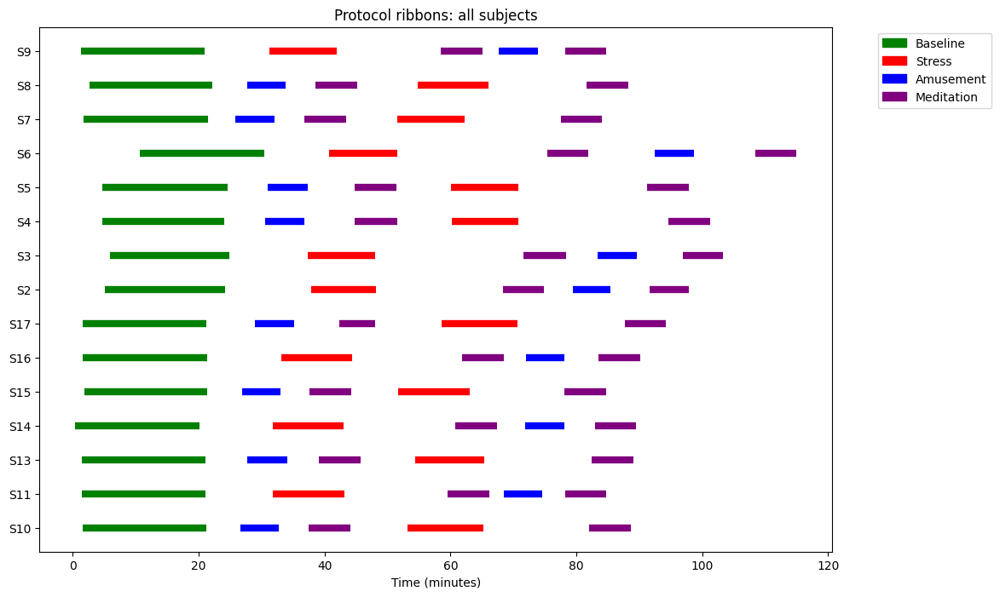

In [18]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

colors = {"Baseline":"green", "Stress":"red", "Amusement":"blue", "Meditation":"purple"}

plt.figure(figsize=(12,8))

for idx, sid in enumerate(sorted(intervals_summary.keys())):
    subj_data = intervals_summary[sid]["intervals"]
    for phase, ivs in subj_data.items():
        for iv in ivs:
            plt.hlines(y=idx, xmin=iv["start_sec"]/60, xmax=iv["end_sec"]/60,
                       colors=colors.get(phase,"gray"), linewidth=6)

plt.yticks(range(len(intervals_summary)), sorted(intervals_summary.keys()))
plt.xlabel("Time (minutes)")
plt.title("Protocol ribbons: all subjects")

# legend
patches = [mpatches.Patch(color=c, label=p) for p,c in colors.items()]
plt.legend(handles=patches, bbox_to_anchor=(1.05,1), loc="upper left")

plt.show()


In [19]:
# collect all phase durations across subjects
phase_durations = {p: [] for p in phase_labels.values()}

for sid, info in intervals_summary.items():
    for phase in phase_labels.values():
        ivs = info["intervals"].get(phase, [])
        for iv in ivs:
            dur = iv["end_sec"] - iv["start_sec"]
            phase_durations[phase].append(dur)

# compute averages
avg_durations = {p: round(np.mean(durs)/60, 2) if durs else 0
                 for p, durs in phase_durations.items()}

print("Average duration per phase across all subjects (mins):")
for phase, avg_min in avg_durations.items():
    print(f" - {phase}: {avg_min} min")


Average duration per phase across all subjects (mins):
 - Baseline: 19.57 min
 - Stress: 11.07 min
 - Amusement: 6.19 min
 - Meditation: 6.56 min


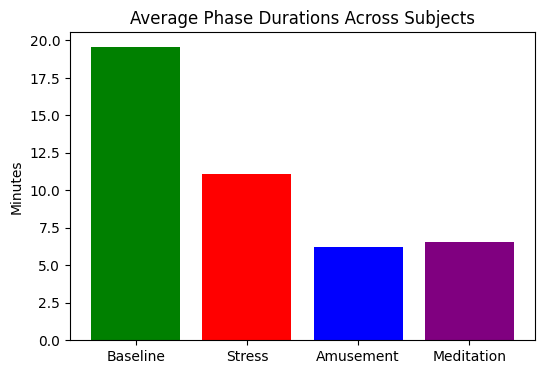

In [20]:
plt.figure(figsize=(6,4))
plt.bar(avg_durations.keys(), avg_durations.values(), color=["green","red","blue","purple"])
plt.ylabel("Minutes")
plt.title("Average Phase Durations Across Subjects")
plt.show()


In [21]:
out_csv = proj/"reports"/"phase_durations_all_subjects.csv"
df_pivot.to_csv(out_csv)
print("saved per-subject phase duration table to:", out_csv)


saved per-subject phase duration table to: /content/wesad/reports/phase_durations_all_subjects.csv


In [22]:
!pip install neurokit2 -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 708.4/708.4 kB 18.2 MB/s eta 0:00:00


In [23]:
# STEP 4: visual Inspection of Raw Signals
# Window 60s before stress, then 120s stress start
# Signals is chest ECG, chest RESP, chest EDA, wrist BVP, wrist EDA


In [24]:

import pickle, json
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import neurokit2 as nk

In [25]:
#configuration
subject_id = "S2"
pre_stress_sec = 60        # 60s before stress
stress_window_sec = 120    # first 120s of stress
proj = Path("/content/wesad")
root_dir = Path("/content/WESAD/WESAD")

# sampling rates
fs_chest = 700
fs_wrist = {
    "ACC": 32,
    "BVP": 64,
    "EDA": 4,
    "TEMP": 4
}

In [26]:
intervals_json = proj/"interim"/f"{subject_id}_intervals.json"
if intervals_json.exists():
    with open(intervals_json, "r") as f:
        j = json.load(f)
    stress_intervals = j["intervals"].get("Stress", [])
    assert len(stress_intervals) >= 1, "No Stress interval found in JSON."
    stress_start = float(stress_intervals[0]["start_sec"])
else:
    # Fallback: derive from labels directly
    with open(root_dir/subject_id/f"{subject_id}.pkl", "rb") as f:
        data_tmp = pickle.load(f, encoding="latin1")
    labels = data_tmp["label"]
    # find first index where label == 2 (Stress)
    idxs = np.where(labels == 2)[0]
    assert len(idxs) > 0, "No Stress labels found for this subject."
    stress_start = idxs[0] / fs_chest

print(f"Stress starts at ~{stress_start:.2f} sec for {subject_id}")

# load full subject data
with open(root_dir/subject_id/f"{subject_id}.pkl", "rb") as f:
    data = pickle.load(f, encoding="latin1")

chest = data["signal"]["chest"]
wrist = data["signal"]["wrist"]

# define windows (guard for start-of-record edge)
pre_start = max(0.0, stress_start - pre_stress_sec)
pre_end   = stress_start
str_start = stress_start
str_end   = stress_start + stress_window_sec

def sec_to_idx(t_sec, fs):
    return int(np.clip(round(t_sec * fs), 0, None))

# slice helper
def slice_sec(x, fs, t0, t1):
    i0 = sec_to_idx(t0, fs)
    i1 = sec_to_idx(t1, fs)
    return x[i0:i1], i0, i1

Stress starts at ~2273.55 sec for S2


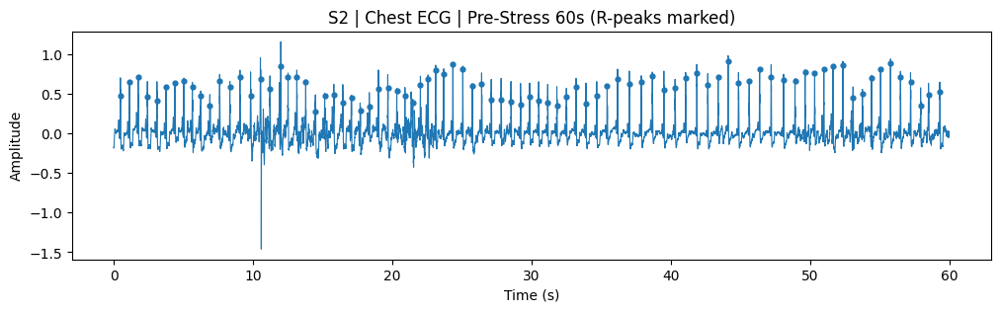

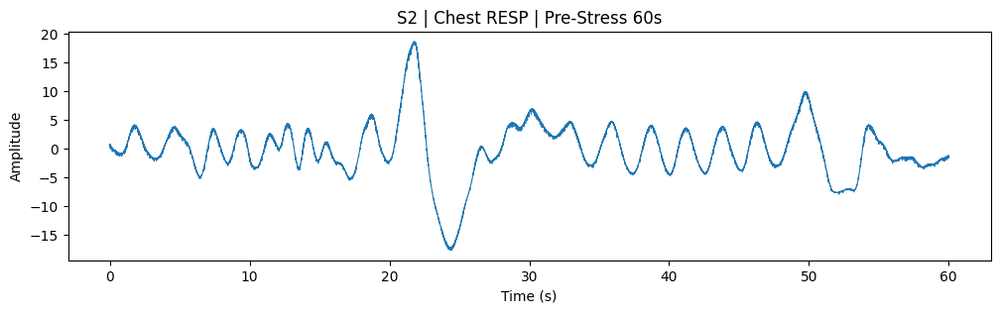

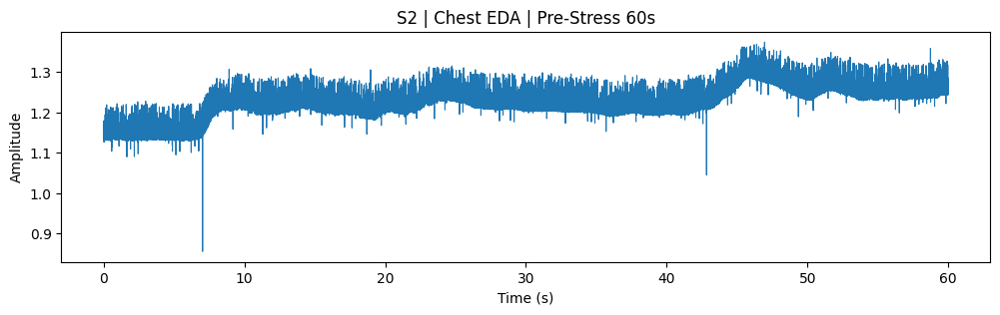

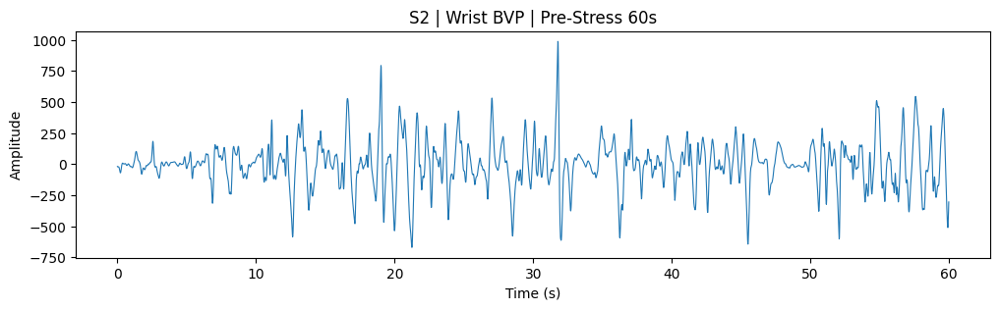

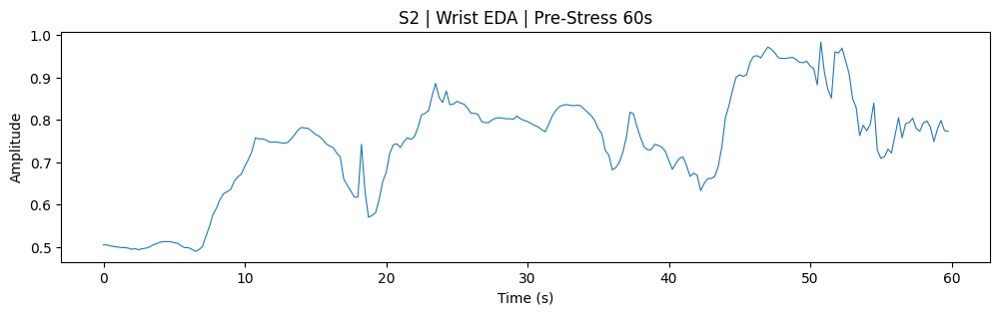

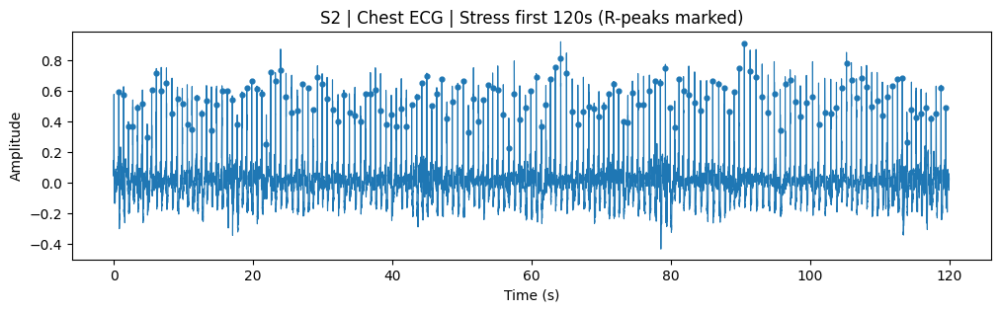

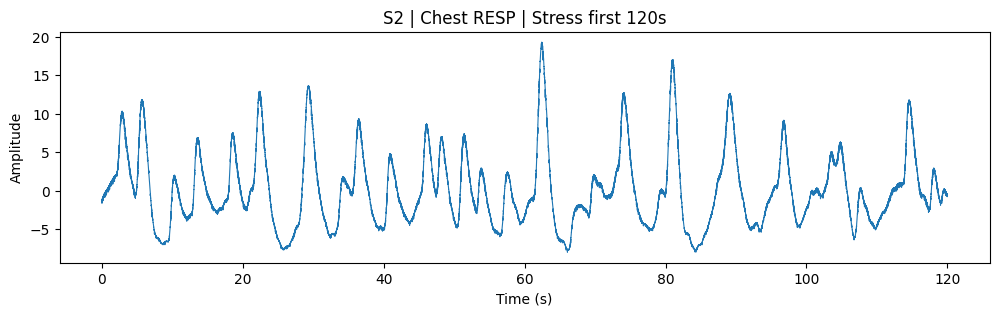

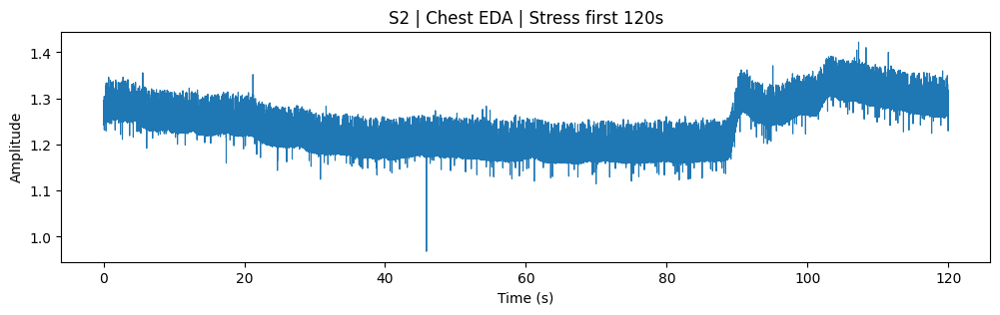

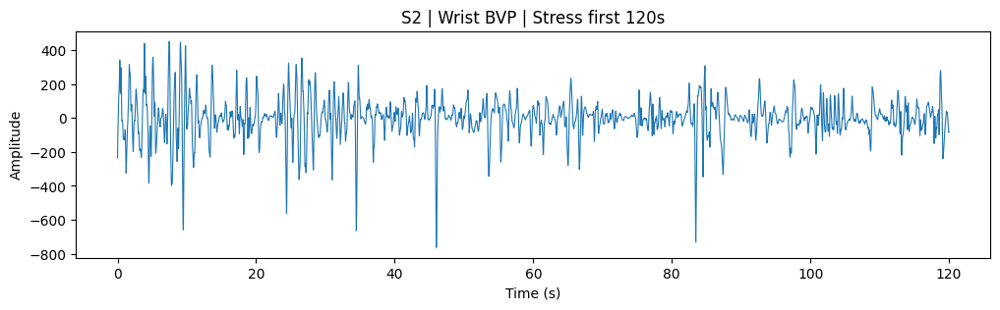

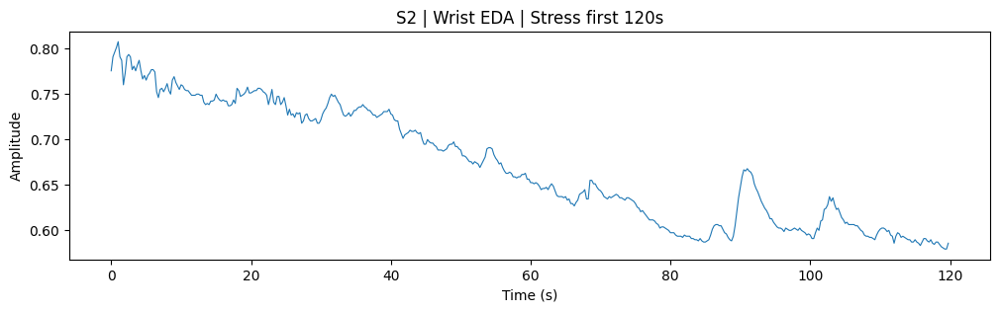

Saved  /content/wesad/reports


In [27]:
#  Extract strips
# Chest (all at 700 Hz)
ecg_pre, _, _  = slice_sec(chest["ECG"],  fs_chest, pre_start, pre_end)
resp_pre, _, _ = slice_sec(chest["Resp"], fs_chest, pre_start, pre_end)
edaC_pre, _, _ = slice_sec(chest["EDA"],  fs_chest, pre_start, pre_end)

ecg_str, _, _  = slice_sec(chest["ECG"],  fs_chest, str_start, str_end)
resp_str, _, _ = slice_sec(chest["Resp"], fs_chest, str_start, str_end)
edaC_str, _, _ = slice_sec(chest["EDA"],  fs_chest, str_start, str_end)

# Wrist (Empatica E4 rates)
bvp_pre, _, _  = slice_sec(wrist["BVP"], fs_wrist["BVP"], pre_start, pre_end)
edaW_pre, _, _ = slice_sec(wrist["EDA"], fs_wrist["EDA"], pre_start, pre_end)

bvp_str, _, _  = slice_sec(wrist["BVP"], fs_wrist["BVP"], str_start, str_end)
edaW_str, _, _ = slice_sec(wrist["EDA"], fs_wrist["EDA"], str_start, str_end)

# ECG peak detection (R-peaks) on the 60s pre-stress to check clarity

try:
    ecg_clean = nk.ecg_clean(ecg_pre, sampling_rate=fs_chest, method="neurokit")
    _, rpeaks = nk.ecg_peaks(ecg_clean, sampling_rate=fs_chest)
    r_idx = rpeaks["ECG_R_Peaks"]
except Exception as e:
    r_idx = np.array([], dtype=int)
    print("ECG peak detection warning:", e)

#  plotting
out_dir = proj/"reports"
out_dir.mkdir(parents=True, exist_ok=True)

def plot_strip(y, fs, title, mark_peaks=None, fname=None):
    t = np.arange(len(y))/fs
    plt.figure(figsize=(12,3))
    plt.plot(t, y, linewidth=0.8)
    if mark_peaks is not None and len(mark_peaks) > 0:
        plt.scatter(mark_peaks/fs, y[mark_peaks], s=12)
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title(title)
    if fname:
        plt.savefig(out_dir/fname, bbox_inches="tight", dpi=150)
    plt.show()

# pre-stress 60s strips
plot_strip(ecg_pre,  fs_chest, f"{subject_id} | Chest ECG | Pre-Stress 60s (R-peaks marked)",
           mark_peaks=r_idx, fname=f"P2_{subject_id}_ECG_pre.png")
plot_strip(resp_pre,  fs_chest, f"{subject_id} | Chest RESP | Pre-Stress 60s",
           fname=f"P2_{subject_id}_RESP_pre.png")
plot_strip(edaC_pre,  fs_chest, f"{subject_id} | Chest EDA | Pre-Stress 60s",
           fname=f"P2_{subject_id}_EDA_chest_pre.png")
plot_strip(bvp_pre,   fs_wrist["BVP"], f"{subject_id} | Wrist BVP | Pre-Stress 60s",
           fname=f"P2_{subject_id}_BVP_pre.png")
plot_strip(edaW_pre,  fs_wrist["EDA"], f"{subject_id} | Wrist EDA | Pre-Stress 60s",
           fname=f"P2_{subject_id}_EDA_wrist_pre.png")

# stress first 120s strips

try:
    ecg_clean_s = nk.ecg_clean(ecg_str, sampling_rate=fs_chest, method="neurokit")
    _, rpeaks_s = nk.ecg_peaks(ecg_clean_s, sampling_rate=fs_chest)
    r_idx_s = rpeaks_s["ECG_R_Peaks"]
except Exception:
    r_idx_s = np.array([], dtype=int)

plot_strip(ecg_str,  fs_chest, f"{subject_id} | Chest ECG | Stress first {stress_window_sec}s (R-peaks marked)",
           mark_peaks=r_idx_s, fname=f"P2_{subject_id}_ECG_stress.png")
plot_strip(resp_str,  fs_chest, f"{subject_id} | Chest RESP | Stress first {stress_window_sec}s",
           fname=f"P2_{subject_id}_RESP_stress.png")
plot_strip(edaC_str,  fs_chest, f"{subject_id} | Chest EDA | Stress first {stress_window_sec}s",
           fname=f"P2_{subject_id}_EDA_chest_stress.png")
plot_strip(bvp_str,   fs_wrist["BVP"], f"{subject_id} | Wrist BVP | Stress first {stress_window_sec}s",
           fname=f"P2_{subject_id}_BVP_stress.png")
plot_strip(edaW_str,  fs_wrist["EDA"], f"{subject_id} | Wrist EDA | Stress first {stress_window_sec}s",
           fname=f"P2_{subject_id}_EDA_wrist_stress.png")

print("Saved ", out_dir)

In [28]:
#  Per-second feature extraction (CHEST, S2) — final robust ===
# Output: /content/wesad/features/seconds/S2_seconds.parquet

import pickle, numpy as np, pandas as pd
from pathlib import Path
import neurokit2 as nk

proj = Path("/content/wesad")
root_dir = Path("/content/WESAD/WESAD")
subject_id = "S2"
fs = 700  # chest

#  Load
with open(root_dir/subject_id/f"{subject_id}.pkl", "rb") as f:
    data = pickle.load(f, encoding="latin1")
ch = data["signal"]["chest"]

ecg  = np.asarray(ch["ECG"],  float)
resp = np.asarray(ch["Resp"], float)
eda  = np.asarray(ch["EDA"],  float)
temp = np.asarray(ch["Temp"], float)

ACC = np.asarray(ch["ACC"])
if ACC.ndim == 2 and ACC.shape[0] == 3:  # (3,N) -> (N,3)
    ACC = ACC.T
acc_mag = np.sqrt((ACC**2).sum(axis=1))

min_len = min(len(ecg), len(resp), len(eda), len(temp), len(acc_mag))
total_sec = int(min_len // fs)
print(f"{subject_id}: using {total_sec} full seconds")

def sec_slice(x, s):
    i0, i1 = s*fs, min(s*fs + fs, len(x))
    return x[i0:i1]

ecg_clean = nk.ecg_clean(ecg[:min_len], sampling_rate=fs, method="neurokit")
_, rpeaks = nk.ecg_peaks(ecg_clean, sampling_rate=fs)
rpos = np.asarray(rpeaks["ECG_R_Peaks"], dtype=int)

rr_sec = np.diff(rpos) / fs
if rr_sec.size > 0:
    rr_med = float(np.median(rr_sec))
    rr_outlier = np.abs(rr_sec - rr_med) > (0.20 * rr_med)
else:
    rr_outlier = np.array([], dtype=bool)
beat_sec = (rpos / fs).astype(int)
rr_sec_idx = beat_sec[1:]  # align with rr_outlier



S2: using 6079 full seconds


In [29]:
# ---------- Helpers for artifacts
def max_abs_step(seg: np.ndarray) -> float:
    seg = np.asarray(seg, float)
    if seg.size < 2:
        return 0.0
    d = np.diff(seg)
    if d.size == 0:
        return 0.0
    d = np.abs(d)
    d = d[np.isfinite(d)]
    return float(d.max()) if d.size else 0.0

# ACC per-sec baseline
acc_sec_means = np.array([sec_slice(acc_mag, s).mean() for s in range(total_sec)])
acc_mu = float(acc_sec_means.mean())
acc_sd = float(acc_sec_means.std(ddof=1)) if total_sec > 1 else 1.0
if acc_sd == 0: acc_sd = 1.0

# EDA per-sec max-step baseline
eda_sec_maxstep = np.array([max_abs_step(sec_slice(eda, s)) for s in range(total_sec)])
eda_ms_mu = float(np.nanmean(eda_sec_maxstep)) if eda_sec_maxstep.size else 0.0
eda_ms_sd = float(np.nanstd(eda_sec_maxstep, ddof=1)) if total_sec > 1 else 1.0
if eda_ms_sd == 0: eda_ms_sd = 1.0

# ---------- Per-second features
rows = []
for s in range(total_sec):
    ecg_s  = sec_slice(ecg,  s)
    resp_s = sec_slice(resp, s)
    eda_s  = sec_slice(eda,  s)
    temp_s = sec_slice(temp, s)
    acc_s  = sec_slice(acc_mag, s)

    # ECG
    beats_in_s = int(np.sum(beat_sec == s))
    hr_bpm = float(beats_in_s * 60.0)
    if rr_outlier.size > 0:
        bad_rr = rr_outlier[rr_sec_idx == s]
        rr_outlier_ratio = float(bad_rr.mean()) if bad_rr.size > 0 else 0.0
    else:
        rr_outlier_ratio = 0.0

    # RESP
    resp_mean = float(resp_s.mean()) if resp_s.size else 0.0
    resp_std  = float(resp_s.std(ddof=1)) if resp_s.size > 1 else 0.0
    resp_amp  = float(resp_s.max() - resp_s.min()) if resp_s.size else 0.0

    # EDA
    eda_mean  = float(eda_s.mean()) if eda_s.size else 0.0
    eda_std   = float(eda_s.std(ddof=1)) if eda_s.size > 1 else 0.0
    eda_slope = float(eda_s[-1] - eda_s[0]) if eda_s.size > 1 else 0.0
    eda_maxstep = max_abs_step(eda_s)
    eda_spike_flag = int((eda_ms_sd > 0) and ((eda_maxstep - eda_ms_mu) / eda_ms_sd > 3.0))

    # TEMP
    temp_mean = float(temp_s.mean()) if temp_s.size else 0.0
    temp_slope= float(temp_s[-1] - temp_s[0]) if temp_s.size > 1 else 0.0

    # ACC
    acc_mean = float(acc_s.mean()) if acc_s.size else 0.0
    acc_std  = float(acc_s.std(ddof=1)) if acc_s.size > 1 else 0.0
    acc_z    = (acc_mean - acc_mu) / acc_sd if acc_sd > 0 else 0.0
    acc_artifact_flag = int(acc_z > 3.0)

    rows.append({
        "subject": subject_id,
        "second": s,
        "ecg_hr_bpm": hr_bpm,
        "ecg_rr_outlier_ratio": rr_outlier_ratio,
        "resp_mean": resp_mean,
        "resp_std": resp_std,
        "resp_amp": resp_amp,
        "eda_mean": eda_mean,
        "eda_std": eda_std,
        "eda_slope": eda_slope,
        "eda_spike_flag": eda_spike_flag,
        "temp_mean": temp_mean,
        "temp_slope": temp_slope,
        "acc_mean": acc_mean,
        "acc_std": acc_std,
        "acc_artifact_flag": acc_artifact_flag,
    })

df_sec = pd.DataFrame(rows)

# Save and check
out_path = proj/"features"/"seconds"/f"{subject_id}_seconds.parquet"
out_path.parent.mkdir(parents=True, exist_ok=True)
df_sec.to_parquet(out_path, index=False)
print("saved:", out_path)

print("\nECG HR (bpm) summary:")
print(df_sec["ecg_hr_bpm"].describe()[["mean","min","max"]])

print("\nArtifact flag rates:")
print({
    "eda_spike_flag_rate": float(df_sec["eda_spike_flag"].mean()),
    "acc_artifact_flag_rate": float(df_sec["acc_artifact_flag"].mean()),
})

/tmp/ipython-input-529303469.py:51: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  eda_slope = float(eda_s[-1] - eda_s[0]) if eda_s.size > 1 else 0.0
/tmp/ipython-input-529303469.py:57: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  temp_slope= float(temp_s[-1] - temp_s[0]) if temp_s.size > 1 else 0.0


saved: /content/wesad/features/seconds/S2_seconds.parquet

ECG HR (bpm) summary:
mean     71.557822
min       0.000000
max     180.000000
Name: ecg_hr_bpm, dtype: float64

Artifact flag rates:
{'eda_spike_flag_rate': 0.0, 'acc_artifact_flag_rate': 0.0008225037012666557}


In [30]:
# Per-second CHEST features for ALL subjects + phase labels
# Writes: /content/wesad/features/seconds/Sxx_seconds.parquet for each subject
# Optionally merges into: /content/wesad/features/seconds/all_seconds.parquet

import pickle, json
import numpy as np
import pandas as pd
from pathlib import Path
import neurokit2 as nk

proj = Path("/content/wesad")
root_dir = Path("/content/WESAD/WESAD")
out_dir  = proj/"features"/"seconds"
out_dir.mkdir(parents=True, exist_ok=True)

fs = 700
subjects_sorted = sorted(subjects)  # from earlier

def sec_slice(x, s, fs, nmax):
    i0, i1 = s*fs, min(s*fs + fs, nmax)
    return x[i0:i1]

def max_abs_step(seg: np.ndarray) -> float:
    seg = np.asarray(seg, float)
    if seg.size < 2: return 0.0
    d = np.diff(seg)
    if d.size == 0: return 0.0
    d = np.abs(d)
    d = d[np.isfinite(d)]
    return float(d.max()) if d.size else 0.0

def load_intervals(subject_id: str):
    p = proj/"interim"/f"{subject_id}_intervals.json"
    if not p.exists():
        return {"Baseline":[], "Stress":[], "Amusement":[], "Meditation":[]}
    with open(p, "r") as f:
        j = json.load(f)
    return j["intervals"]

def seconds_to_phase(subject_id: str, total_sec: int):
    """Make a per-second phase vector using interval JSON (Baseline/Stress/Amusement/Meditation/None)."""
    ivs = load_intervals(subject_id)
    phase_vec = np.array(["None"]*total_sec, dtype=object)
    for phase in ["Baseline","Stress","Amusement","Meditation"]:
        for iv in ivs.get(phase, []):
            s0 = int(np.floor(iv["start_sec"]))
            s1 = int(np.floor(iv["end_sec"]))  # end is exclusive-ish
            s0 = max(0, s0); s1 = min(total_sec, s1)
            if s1 > s0:
                phase_vec[s0:s1] = phase
    return phase_vec

def extract_seconds_chest(subject_id: str) -> Path:
    # Load
    with open(root_dir/subject_id/f"{subject_id}.pkl", "rb") as f:
        data = pickle.load(f, encoding="latin1")
    ch = data["signal"]["chest"]

    # Arrays
    ecg  = np.asarray(ch["ECG"],  float)
    resp = np.asarray(ch["Resp"], float)
    eda  = np.asarray(ch["EDA"],  float)
    temp = np.asarray(ch["Temp"], float)

    ACC = np.asarray(ch["ACC"])
    if ACC.ndim == 2 and ACC.shape[0] == 3:
        ACC = ACC.T
    acc_mag = np.sqrt((ACC**2).sum(axis=1))

    nmax = min(len(ecg), len(resp), len(eda), len(temp), len(acc_mag))
    total_sec = int(nmax // fs)

    # ECG clean + peaks
    ecg_clean = nk.ecg_clean(ecg[:nmax], sampling_rate=fs, method="neurokit")
    _, rpeaks = nk.ecg_peaks(ecg_clean, sampling_rate=fs)
    rpos = np.asarray(rpeaks["ECG_R_Peaks"], dtype=int)

    rr_sec = np.diff(rpos) / fs
    if rr_sec.size > 0:
        rr_med = float(np.median(rr_sec))
        rr_outlier = np.abs(rr_sec - rr_med) > (0.20 * rr_med)
    else:
        rr_outlier = np.array([], dtype=bool)
    beat_sec = (rpos / fs).astype(int)
    rr_sec_idx = beat_sec[1:]

    # Baselines for artifacts
    acc_sec_means = np.array([sec_slice(acc_mag, s, fs, nmax).mean() for s in range(total_sec)])
    acc_mu = float(acc_sec_means.mean())
    acc_sd = float(acc_sec_means.std(ddof=1)) if total_sec > 1 else 1.0
    if acc_sd == 0: acc_sd = 1.0

    eda_sec_maxstep = np.array([max_abs_step(sec_slice(eda, s, fs, nmax)) for s in range(total_sec)])
    eda_ms_mu = float(np.nanmean(eda_sec_maxstep)) if eda_sec_maxstep.size else 0.0
    eda_ms_sd = float(np.nanstd(eda_sec_maxstep, ddof=1)) if total_sec > 1 else 1.0
    if eda_ms_sd == 0: eda_ms_sd = 1.0

    # Per-second features
    rows = []
    for s in range(total_sec):
        ecg_s  = sec_slice(ecg,  s, fs, nmax)
        resp_s = sec_slice(resp, s, fs, nmax)
        eda_s  = sec_slice(eda,  s, fs, nmax)
        temp_s = sec_slice(temp, s, fs, nmax)
        acc_s  = sec_slice(acc_mag, s, fs, nmax)

        # ECG features
        beats_in_s = int(np.sum(beat_sec == s))
        hr_bpm = float(beats_in_s * 60.0)

        if rr_outlier.size > 0:
            bad_rr = rr_outlier[rr_sec_idx == s]
            rr_outlier_ratio = float(bad_rr.mean()) if bad_rr.size > 0 else 0.0
        else:
            rr_outlier_ratio = 0.0

        # RESP
        resp_mean = float(np.mean(resp_s)) if resp_s.size else 0.0
        resp_std  = float(np.std(resp_s, ddof=1)) if resp_s.size > 1 else 0.0
        resp_amp  = float(resp_s.max() - resp_s.min()) if resp_s.size else 0.0

        # EDA (safe slopes)
        eda_mean  = float(np.mean(eda_s)) if eda_s.size else 0.0
        eda_std   = float(np.std(eda_s, ddof=1)) if eda_s.size > 1 else 0.0
        eda_slope = float(np.asarray(eda_s[-1]).item() - np.asarray(eda_s[0]).item()) if eda_s.size > 1 else 0.0
        eda_maxstep = max_abs_step(eda_s)
        eda_spike_flag = int((eda_ms_sd > 0) and ((eda_maxstep - eda_ms_mu) / eda_ms_sd > 3.0))

        # TEMP
        temp_mean = float(np.mean(temp_s)) if temp_s.size else 0.0
        temp_slope= float(np.asarray(temp_s[-1]).item() - np.asarray(temp_s[0]).item()) if temp_s.size > 1 else 0.0

        # ACC
        acc_mean = float(np.mean(acc_s)) if acc_s.size else 0.0
        acc_std  = float(np.std(acc_s, ddof=1)) if acc_s.size > 1 else 0.0
        acc_z    = (acc_mean - acc_mu) / acc_sd if acc_sd > 0 else 0.0
        acc_artifact_flag = int(acc_z > 3.0)

        rows.append({
            "subject": subject_id,
            "second": s,
            "ecg_hr_bpm": hr_bpm,
            "ecg_rr_outlier_ratio": rr_outlier_ratio,
            "resp_mean": resp_mean,
            "resp_std": resp_std,
            "resp_amp": resp_amp,
            "eda_mean": eda_mean,
            "eda_std": eda_std,
            "eda_slope": eda_slope,
            "eda_spike_flag": eda_spike_flag,
            "temp_mean": temp_mean,
            "temp_slope": temp_slope,
            "acc_mean": acc_mean,
            "acc_std": acc_std,
            "acc_artifact_flag": acc_artifact_flag,
        })

    df = pd.DataFrame(rows)

    # Add per-second phase using intervals
    phase_vec = seconds_to_phase(subject_id, total_sec)
    df["phase"] = phase_vec

    # Save
    out_path = out_dir/f"{subject_id}_seconds.parquet"
    df.to_parquet(out_path, index=False)
    return out_path

written = []
for subject_id in subjects_sorted:
    p = extract_seconds_chest(subject_id)
    print(" saved:", p)
    written.append(p)

print("\nAll done! Wrote", len(written), "files to", out_dir)

# (Optional) Merge all into one Parquet (could be ~1M rows; fine in Colab)
merge_out = out_dir/"all_seconds.parquet"
dfs = [pd.read_parquet(p) for p in written]
pd.concat(dfs, ignore_index=True).to_parquet(merge_out, index=False)
print(" merged:", merge_out)

# Quick sanity: per-phase HR stats (merged)
df_all = pd.read_parquet(merge_out)
print("\nHR (bpm) by phase (all subjects):")
print(df_all.groupby("phase")["ecg_hr_bpm"].describe()[["mean","min","max"]])


 saved: /content/wesad/features/seconds/S10_seconds.parquet
 saved: /content/wesad/features/seconds/S11_seconds.parquet
 saved: /content/wesad/features/seconds/S13_seconds.parquet
 saved: /content/wesad/features/seconds/S14_seconds.parquet
 saved: /content/wesad/features/seconds/S15_seconds.parquet
 saved: /content/wesad/features/seconds/S16_seconds.parquet
 saved: /content/wesad/features/seconds/S17_seconds.parquet
 saved: /content/wesad/features/seconds/S2_seconds.parquet
 saved: /content/wesad/features/seconds/S3_seconds.parquet
 saved: /content/wesad/features/seconds/S4_seconds.parquet
 saved: /content/wesad/features/seconds/S5_seconds.parquet
 saved: /content/wesad/features/seconds/S6_seconds.parquet
 saved: /content/wesad/features/seconds/S7_seconds.parquet
 saved: /content/wesad/features/seconds/S8_seconds.parquet
 saved: /content/wesad/features/seconds/S9_seconds.parquet

All done! Wrote 15 files to /content/wesad/features/seconds
 merged: /content/wesad/features/seconds/all_se

saved: /content/wesad/interim/S2_labels_chest∆20.parquet

Counts (seconds) per class:
label_hybrid
Other           2779
Anticipation    1200
Recovery        1200
Peak             900
Name: count, dtype: int64

Durations (min): {'Anticipation': 20.0, 'Peak': 15.0, 'Recovery': 20.0}
Recording length (min): 101.32


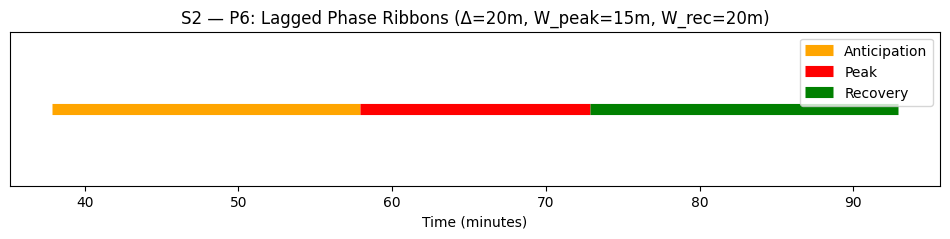

saved: /content/wesad/reports/P6_S2_phase_ribbons_lag.png


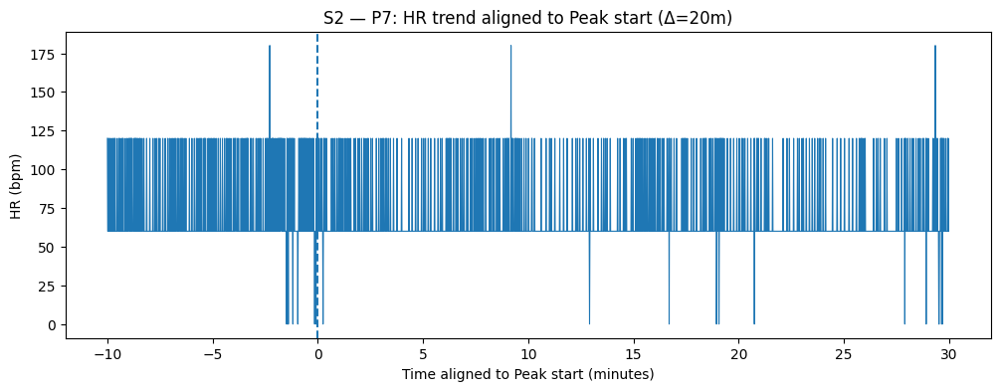

Saved: /content/wesad/reports/P7_S2_trend_aligned_peak.png


In [31]:
#  Hybrid Labeling with Lag (CHEST, S2)
# Inputs:  /content/wesad/interim/S2_intervals.json
#           /content/wesad/features/seconds/S2_seconds.parquet  (for P7 trend)
# Outputs: /content/wesad/interim/S2_labels_chest∆20.parquet
# Plots:   P6_S2_phase_ribbons_lag.png, P7_S2_trend_aligned_peak.png

import json
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

proj = Path("/content/wesad")
root_dir = Path("/content/WESAD/WESAD")
subject_id = "S2"

# parameters
DELTA_MIN   = 20            # ∆ grid choice; will trial error between 15,20,25,30,35
W_PEAK_MIN  = 15            # Peak window length (minutes)
W_REC_MIN   = 20            # Recovery window length (minutes)

# load intervals (from Step 3)
with open(proj/"interim"/f"{subject_id}_intervals.json","r") as f:
    J = json.load(f)

intervals = J["intervals"]
total_seconds = int(round(J.get("total_seconds", 0)))  # fallback to 0 if missing

# Get Stress [ts, te)
stress_ivs = intervals.get("Stress", [])
assert len(stress_ivs) >= 1, "No Stress interval found."
ts = float(stress_ivs[0]["start_sec"])
te = float(stress_ivs[0]["end_sec"])

# lagged phases in seconds
delta = DELTA_MIN * 60.0
w_peak = W_PEAK_MIN * 60.0
w_rec  = W_REC_MIN * 60.0

t_anticip_start = ts
t_anticip_end   = ts + delta

t_peak_start    = ts + delta
t_peak_end      = ts + delta + w_peak

t_rec_start     = t_peak_end
t_rec_end       = t_peak_end + w_rec

#clamp to recording length
# If you have per-second features, prefer its length for total_seconds
sec_path = proj/"features"/"seconds"/f"{subject_id}_seconds.parquet"
if sec_path.exists():
    df_sec_len = pd.read_parquet(sec_path)["second"].max() + 1
    total_seconds = int(max(total_seconds, df_sec_len))

if total_seconds <= 0:
    # as a fallback, estimate from WESAD at 700 Hz using label length
    import pickle
    with open(root_dir/subject_id/f"{subject_id}.pkl","rb") as f:
        data = pickle.load(f, encoding="latin1")
    total_seconds = int(len(data["label"]) // 700)

# Clamp phase ends to recording
t_anticip_end = min(t_anticip_end, total_seconds)
t_peak_end    = min(t_peak_end, total_seconds)
t_rec_end     = min(t_rec_end, total_seconds)

# Build second-wise labels
labels = np.array(["Other"] * total_seconds, dtype=object)

def mark_range(a, start_s, end_s, name):
    s0 = int(np.floor(max(0, start_s)))
    s1 = int(np.floor(min(total_seconds, end_s)))
    if s1 > s0:
        a[s0:s1] = name

mark_range(labels, t_anticip_start, t_anticip_end, "Anticipation")
mark_range(labels, t_peak_start,     t_peak_end,    "Peak")
mark_range(labels, t_rec_start,      t_rec_end,     "Recovery")

# save second-wise labels parquet
lab_df = pd.DataFrame({
    "subject": subject_id,
    "second": np.arange(total_seconds, dtype=int),
    "label_hybrid": labels
})
out_parquet = proj/"interim"/f"{subject_id}_labels_chest∆{int(DELTA_MIN)}.parquet"
lab_df.to_parquet(out_parquet, index=False)
print("saved:", out_parquet)

# Checks
counts = lab_df["label_hybrid"].value_counts()
print("\nCounts (seconds) per class:")
print(counts)

def _dur(cls):
    return int((lab_df["label_hybrid"]==cls).sum())
print("\nDurations (min):",
      {k: round(_dur(k)/60.0, 2) for k in ["Anticipation","Peak","Recovery"] if k in counts.index})
print("Recording length (min):", round(total_seconds/60.0, 2))

# ensure non-zero examples (simple assert-style notices)
for cls in ["Anticipation","Peak","Recovery"]:
    if cls not in counts or counts[cls]==0:
        print(f" error mesage print {cls} has zero seconds ")


# P6: Phase ribbons (with lag)

out_dir = proj/"reports"
out_dir.mkdir(parents=True, exist_ok=True)

plt.figure(figsize=(12, 2))
def draw_block(y, x0, x1, color, label):
    if x1 > x0:
        plt.hlines(y, x0/60.0, x1/60.0, colors=color, linewidth=8, label=label)

# ribbons
draw_block(0, t_anticip_start, t_anticip_end, "orange", "Anticipation")
draw_block(0, t_peak_start,    t_peak_end,    "red",    "Peak")
draw_block(0, t_rec_start,     t_rec_end,     "green",  "Recovery")

plt.xlabel("Time (minutes)")
plt.yticks([])
plt.title(f"{subject_id} — P6: Lagged Phase Ribbons (Δ={DELTA_MIN}m, W_peak={W_PEAK_MIN}m, W_rec={W_REC_MIN}m)")
#  legend entries
handles, labels_ = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels_, handles))
plt.legend(by_label.values(), by_label.keys(), loc="upper right")
p6_path = out_dir/f"P6_{subject_id}_phase_ribbons_lag.png"
plt.savefig(p6_path, bbox_inches="tight", dpi=150)
plt.show()
print("saved:", p6_path)


# P7: Trend aligned to Peak start

if sec_path.exists():
    df_sec = pd.read_parquet(sec_path)
    # Align around Peak start = ts + (time zero)
    t0 = int(np.floor(t_peak_start))  # seconds
    # show from -10 min to +30 min around t0
    pre_min, post_min = 10, 30
    s0 = max(0, t0 - pre_min*60)
    s1 = min(total_seconds, t0 + post_min*60)

    cut = df_sec[(df_sec["second"] >= s0) & (df_sec["second"] < s1)].copy()
    cut["t_aligned_min"] = (cut["second"] - t0) / 60.0


    plt.figure(figsize=(12,4))
    plt.plot(cut["t_aligned_min"], cut["ecg_hr_bpm"], linewidth=0.8)
    plt.axvline(0, linestyle="--")
    plt.xlabel("Time aligned to Peak start (minutes)")
    plt.ylabel("HR (bpm)")
    plt.title(f"{subject_id} — P7: HR trend aligned to Peak start (Δ={DELTA_MIN}m)")
    p7_path = out_dir/f"P7_{subject_id}_trend_aligned_peak.png"
    plt.savefig(p7_path, bbox_inches="tight", dpi=150)
    plt.show()
    print("Saved:", p7_path)
else:
    print("Skipped", sec_path)


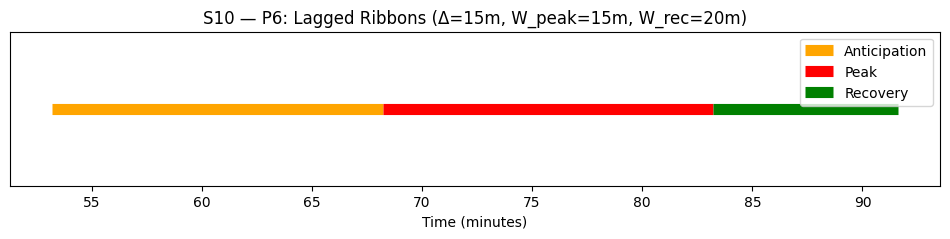

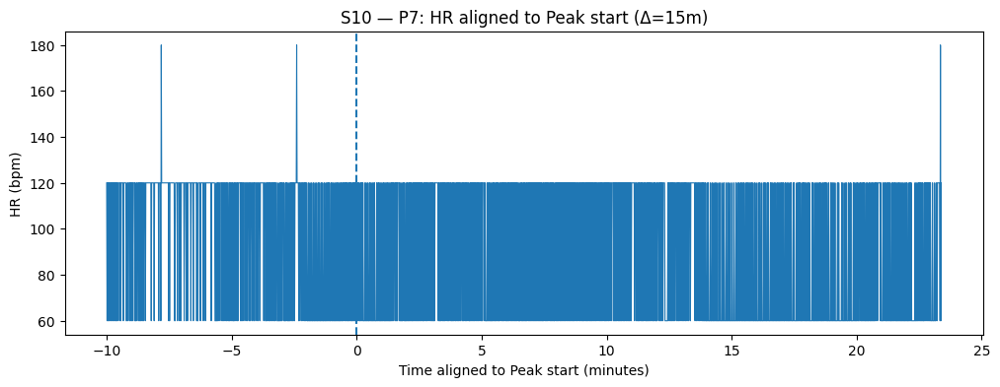

 S10 ∆=15m -> S10_labels_chest∆15.parquet | Ant:900s Peak:900s Rec:504s


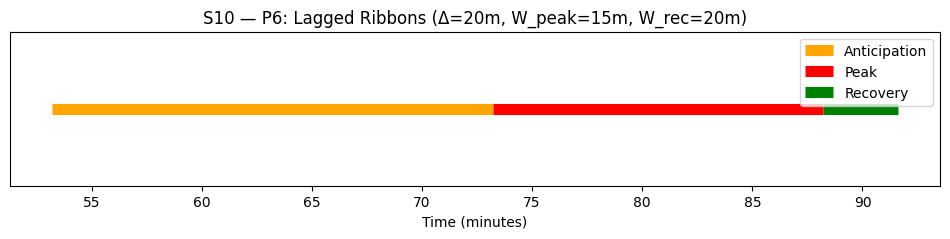

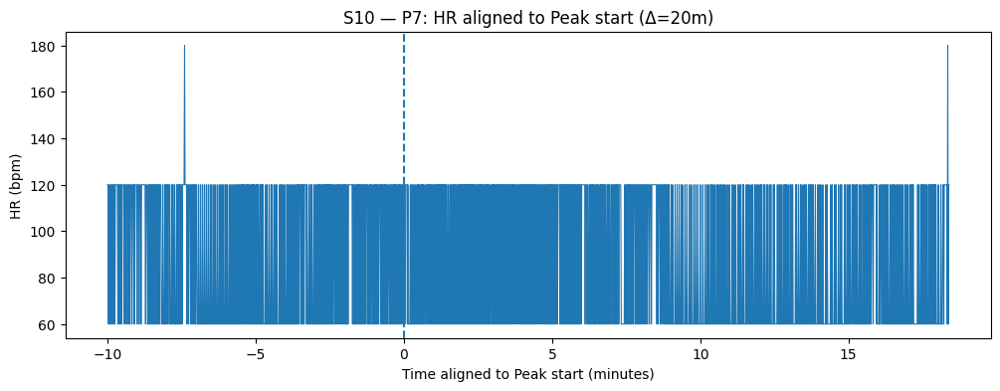

 S10 ∆=20m -> S10_labels_chest∆20.parquet | Ant:1200s Peak:900s Rec:204s


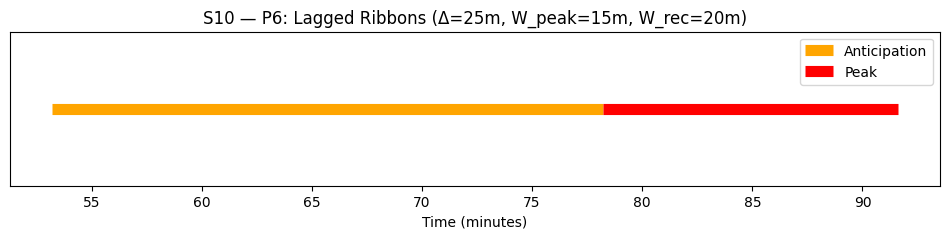

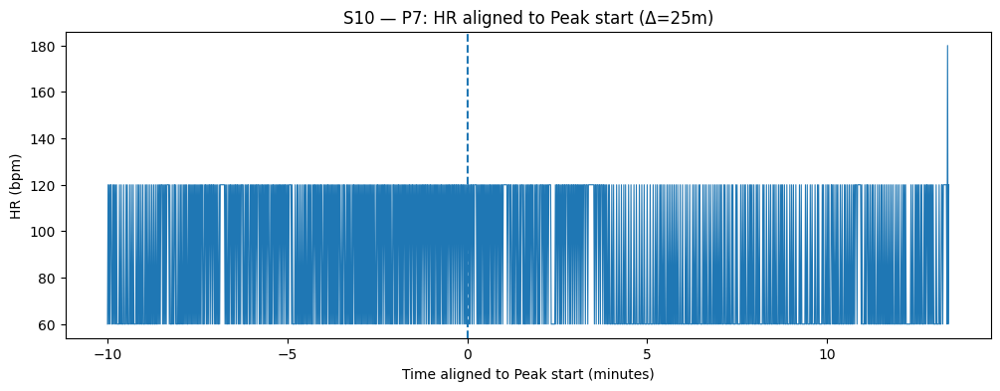

 S10 ∆=25m -> S10_labels_chest∆25.parquet | Ant:1500s Peak:804s Rec:0s


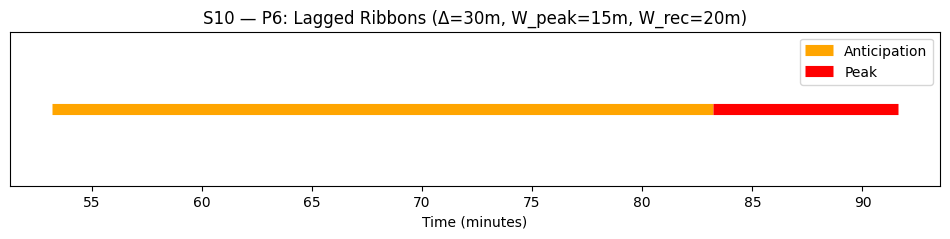

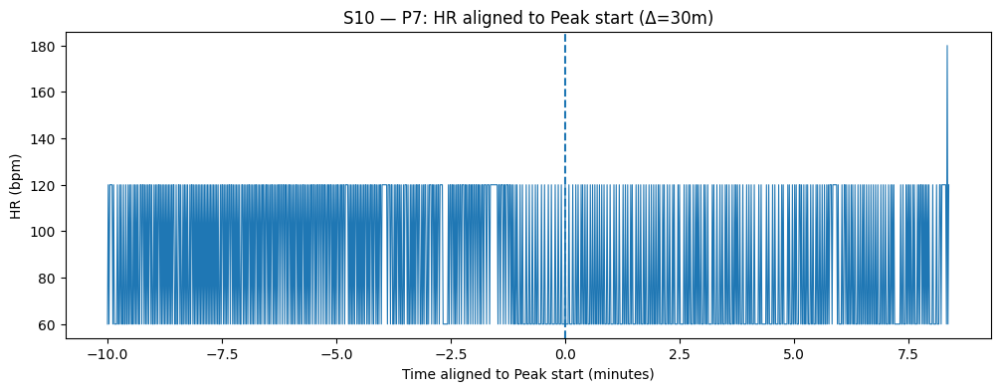

 S10 ∆=30m -> S10_labels_chest∆30.parquet | Ant:1800s Peak:504s Rec:0s


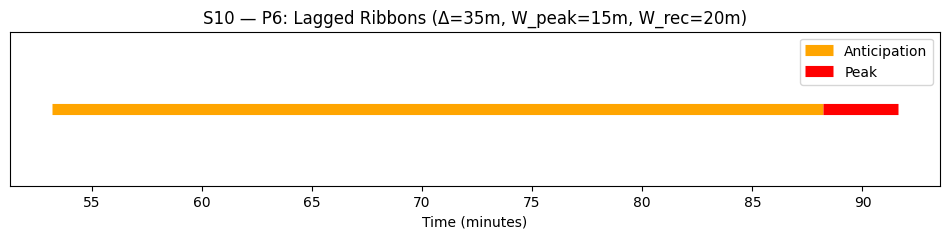

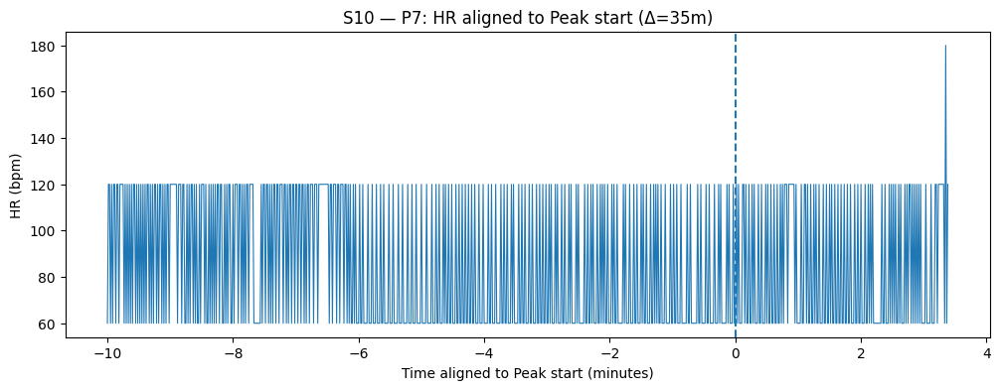

 S10 ∆=35m -> S10_labels_chest∆35.parquet | Ant:2100s Peak:204s Rec:0s


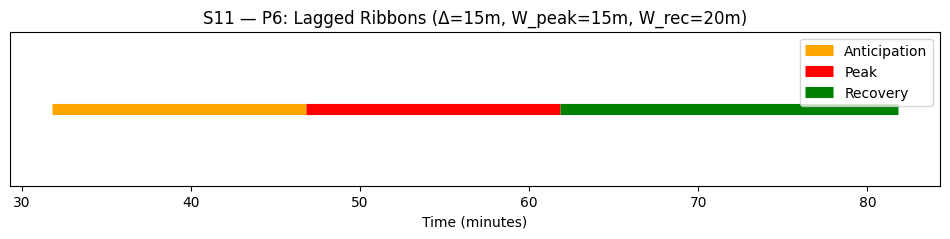

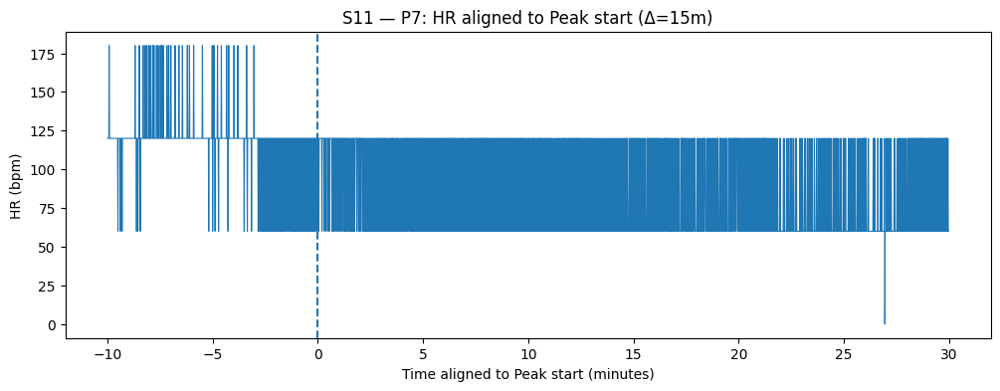

 S11 ∆=15m -> S11_labels_chest∆15.parquet | Ant:900s Peak:900s Rec:1200s


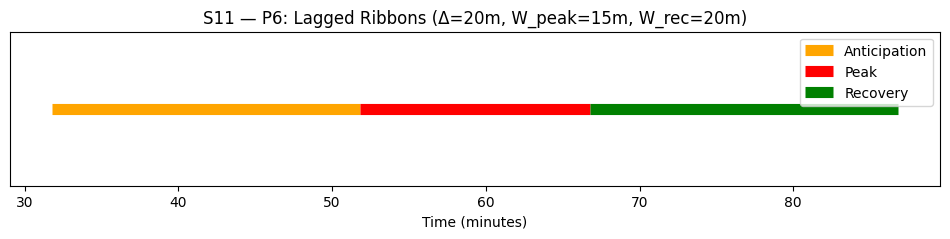

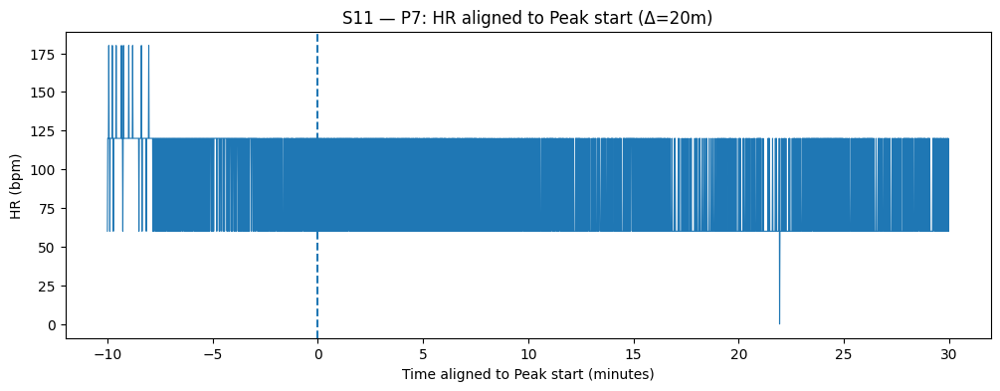

 S11 ∆=20m -> S11_labels_chest∆20.parquet | Ant:1200s Peak:900s Rec:1200s


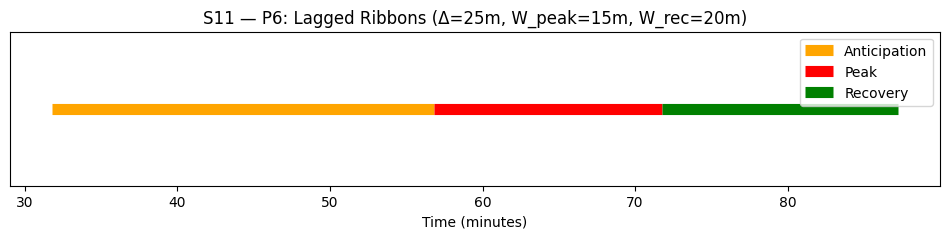

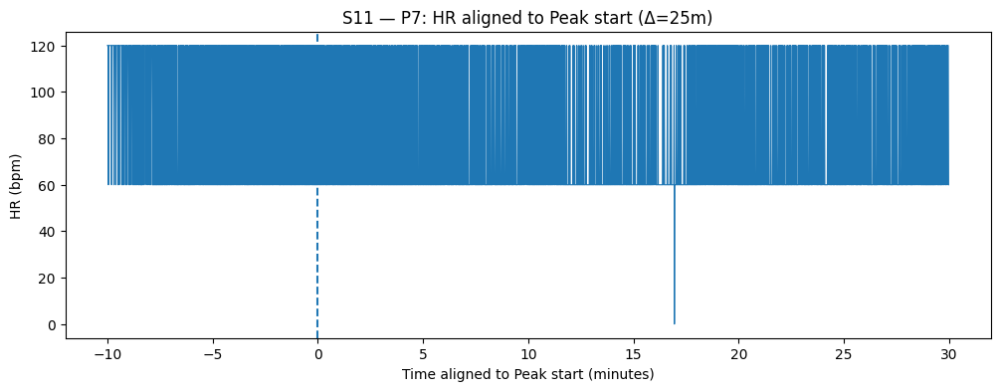

 S11 ∆=25m -> S11_labels_chest∆25.parquet | Ant:1500s Peak:900s Rec:926s


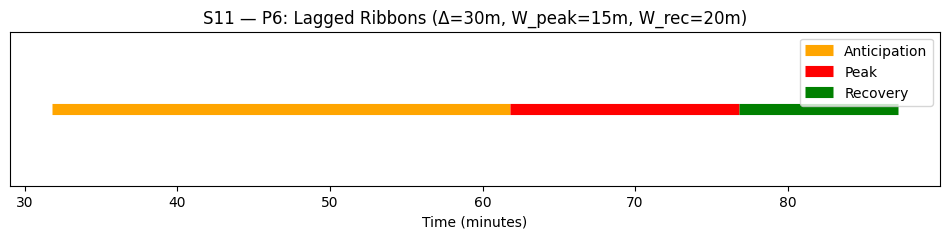

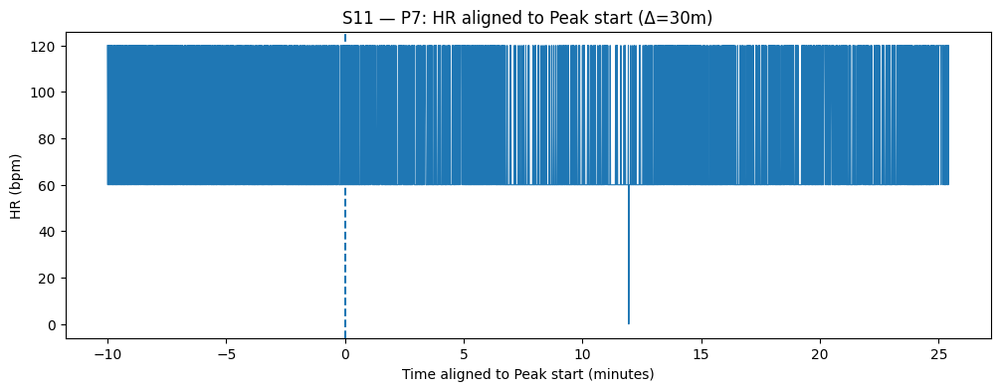

 S11 ∆=30m -> S11_labels_chest∆30.parquet | Ant:1800s Peak:900s Rec:626s


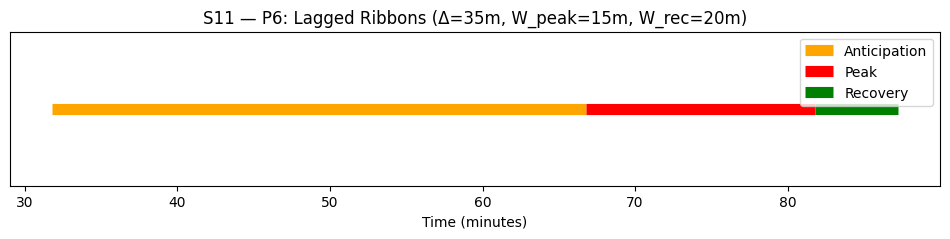

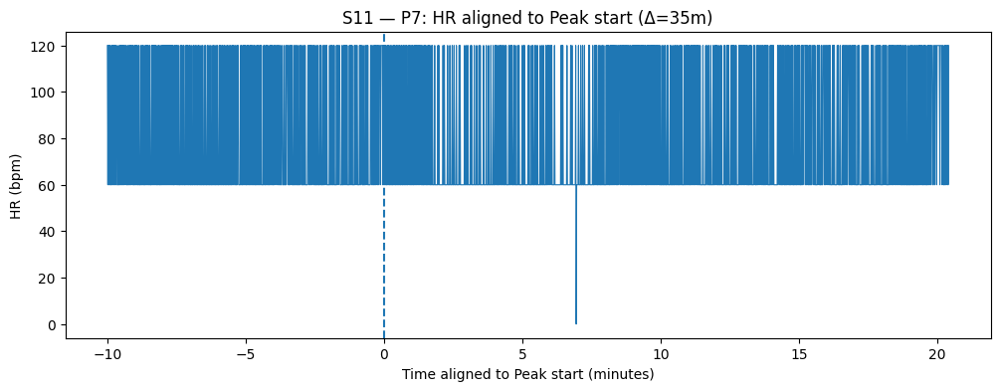

 S11 ∆=35m -> S11_labels_chest∆35.parquet | Ant:2100s Peak:900s Rec:326s


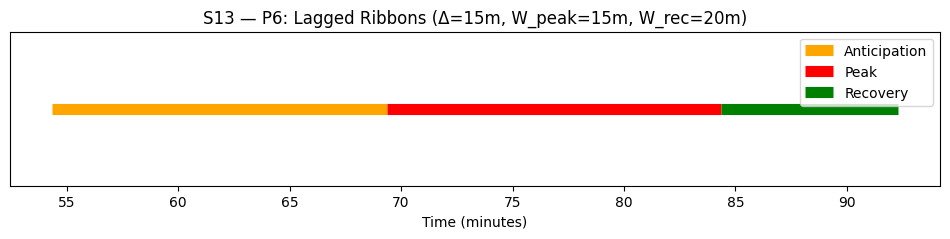

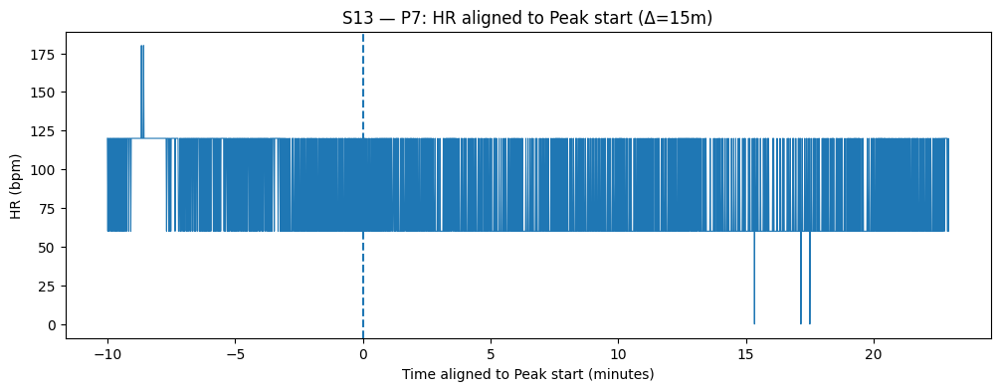

 S13 ∆=15m -> S13_labels_chest∆15.parquet | Ant:900s Peak:900s Rec:477s


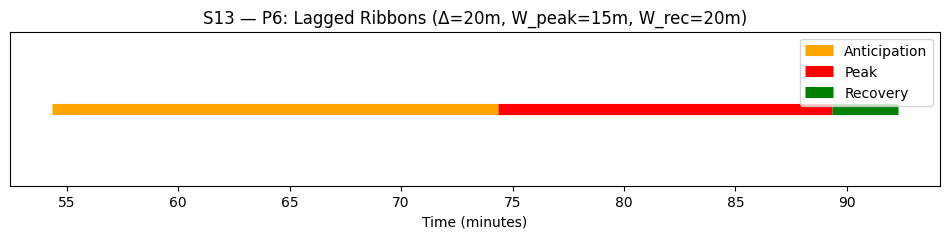

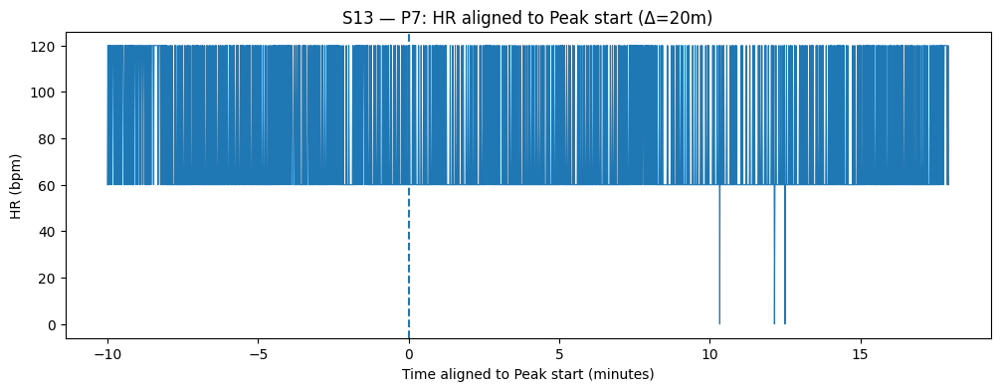

 S13 ∆=20m -> S13_labels_chest∆20.parquet | Ant:1200s Peak:900s Rec:177s


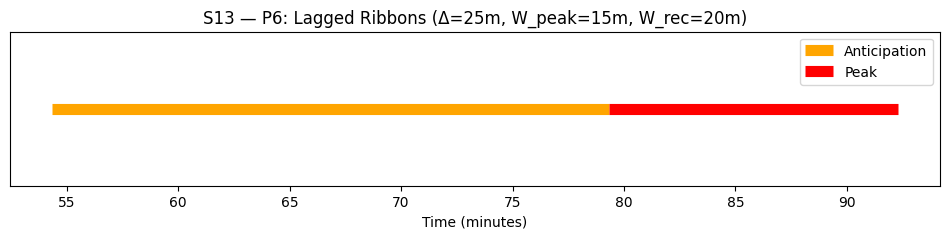

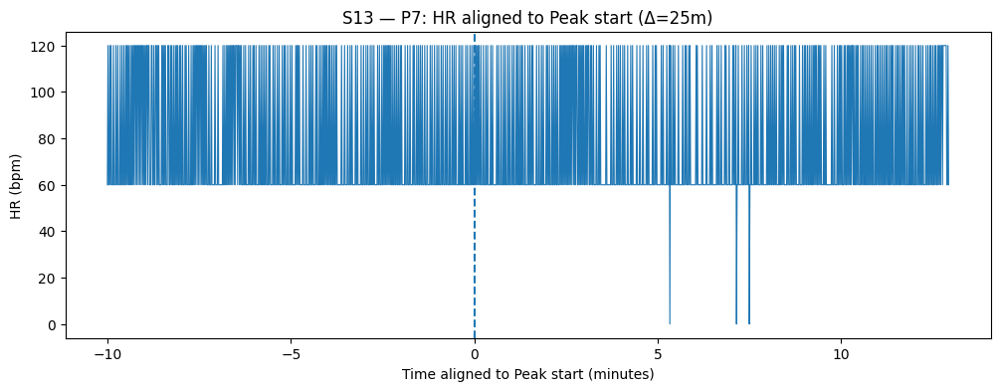

 S13 ∆=25m -> S13_labels_chest∆25.parquet | Ant:1500s Peak:777s Rec:0s


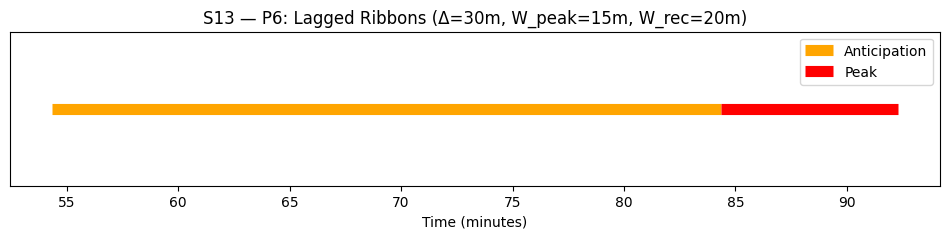

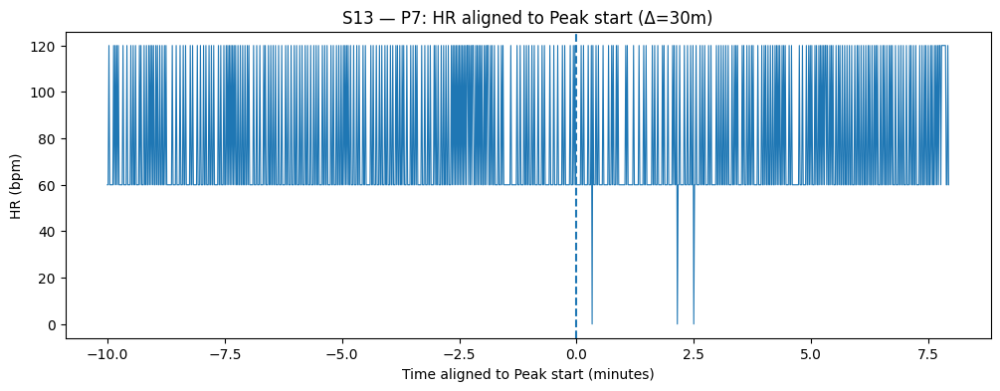

 S13 ∆=30m -> S13_labels_chest∆30.parquet | Ant:1800s Peak:477s Rec:0s


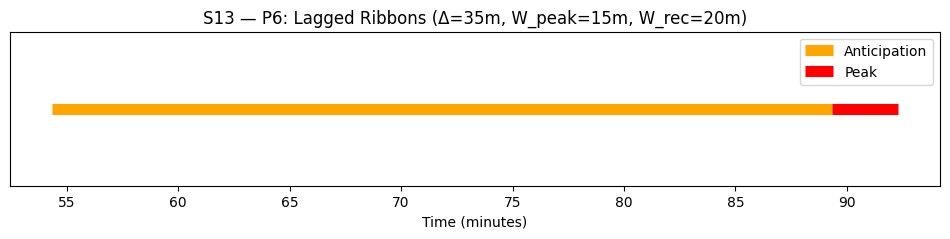

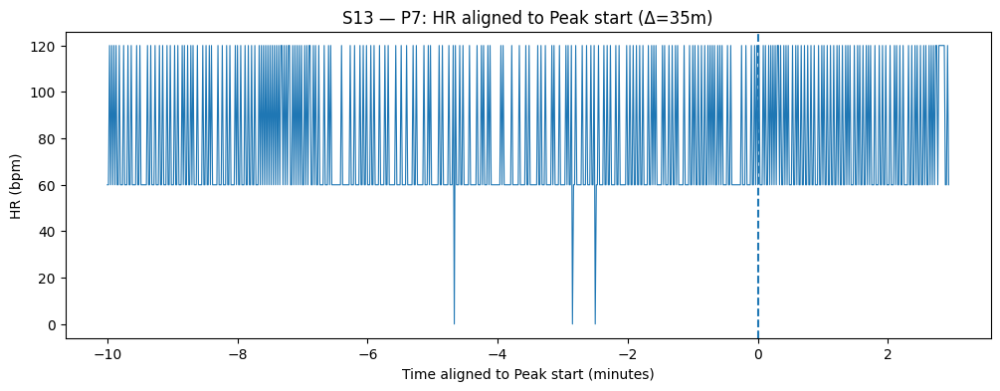

 S13 ∆=35m -> S13_labels_chest∆35.parquet | Ant:2100s Peak:177s Rec:0s


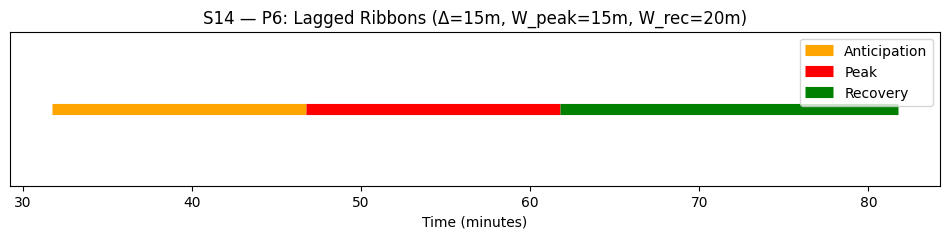

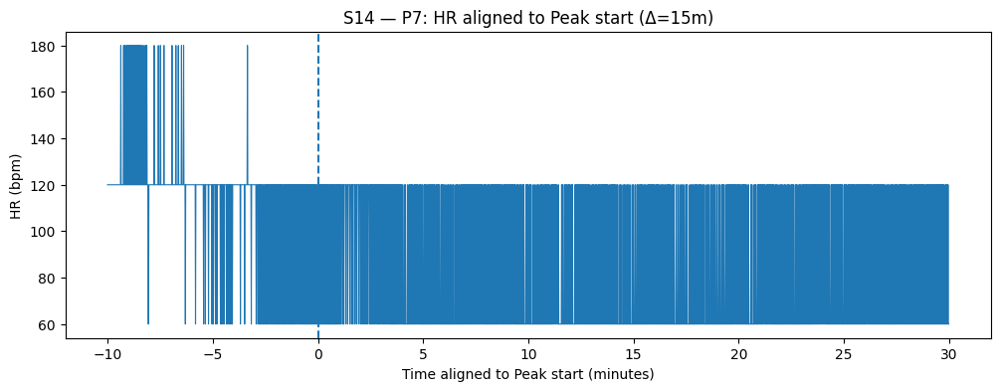

 S14 ∆=15m -> S14_labels_chest∆15.parquet | Ant:900s Peak:900s Rec:1200s


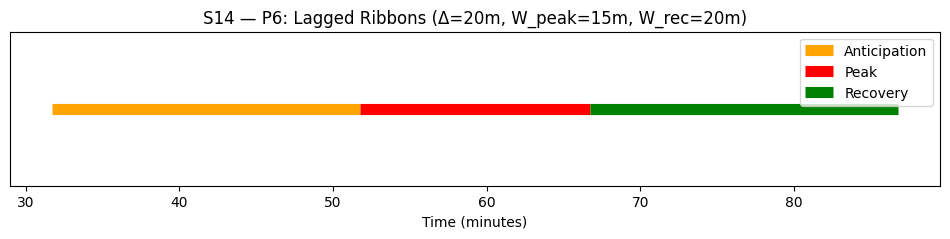

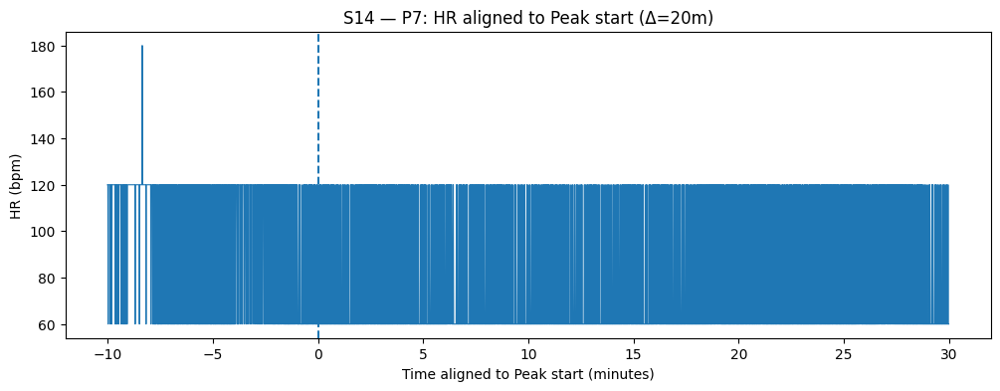

 S14 ∆=20m -> S14_labels_chest∆20.parquet | Ant:1200s Peak:900s Rec:1200s


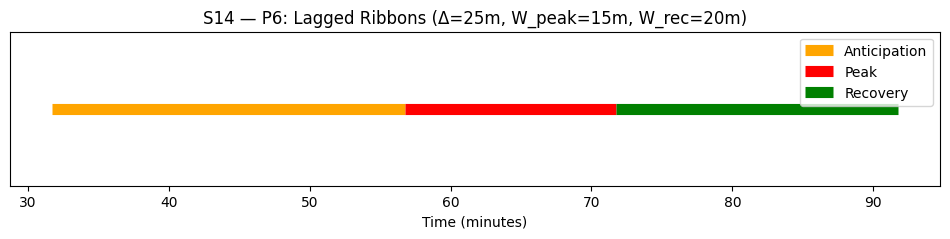

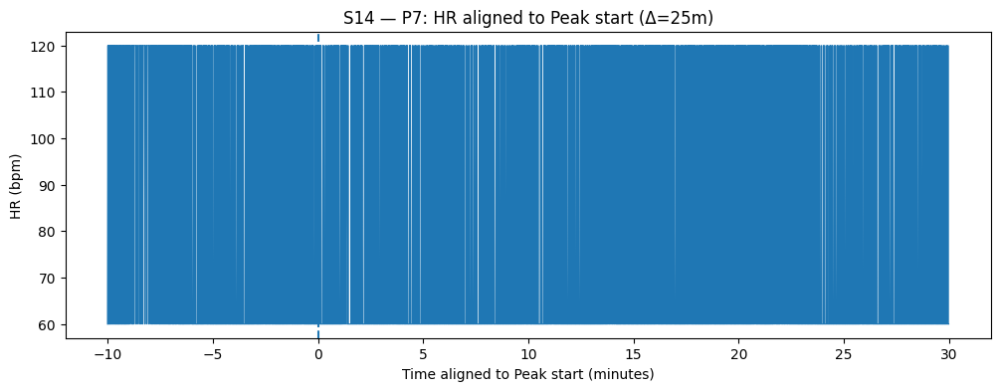

 S14 ∆=25m -> S14_labels_chest∆25.parquet | Ant:1500s Peak:900s Rec:1200s


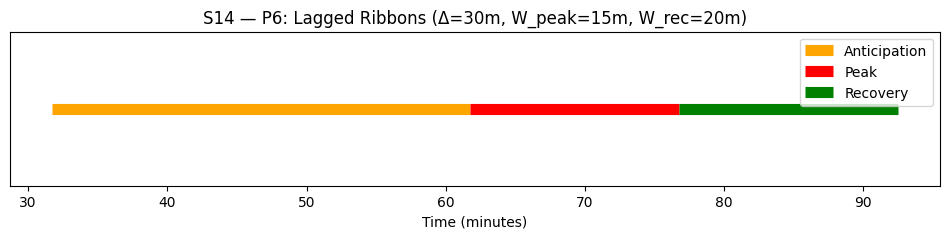

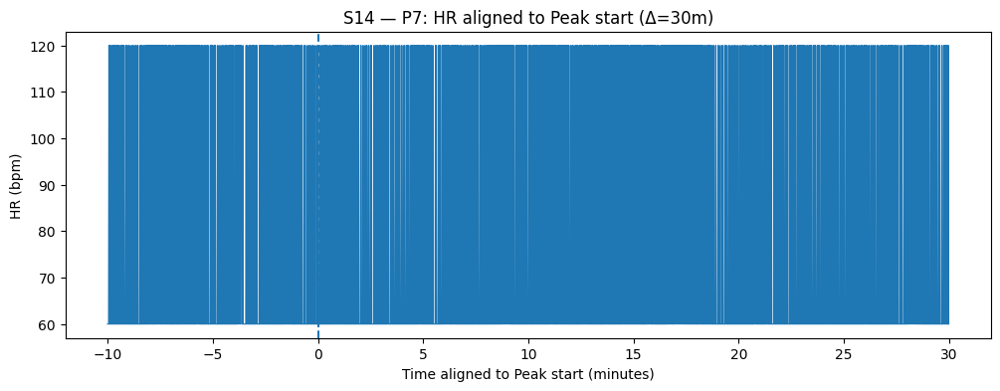

 S14 ∆=30m -> S14_labels_chest∆30.parquet | Ant:1800s Peak:900s Rec:944s


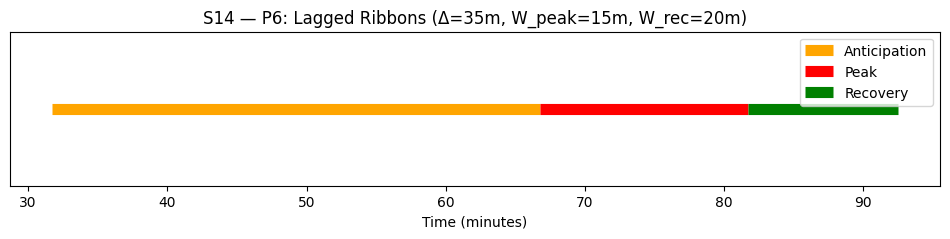

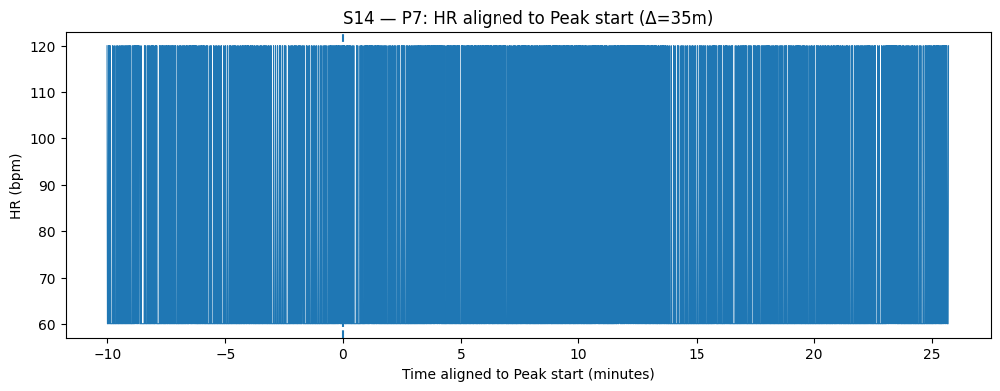

 S14 ∆=35m -> S14_labels_chest∆35.parquet | Ant:2100s Peak:900s Rec:644s


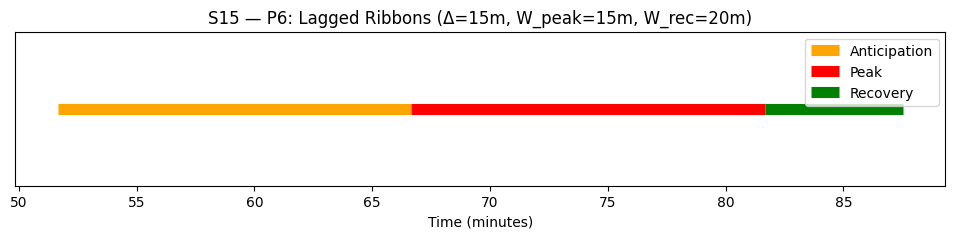

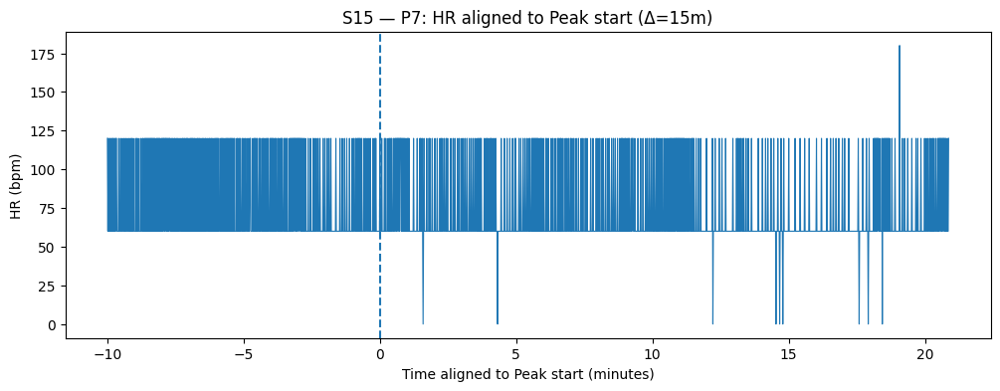

 S15 ∆=15m -> S15_labels_chest∆15.parquet | Ant:900s Peak:900s Rec:353s


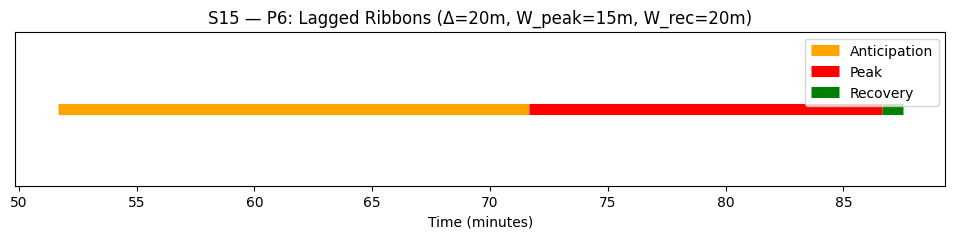

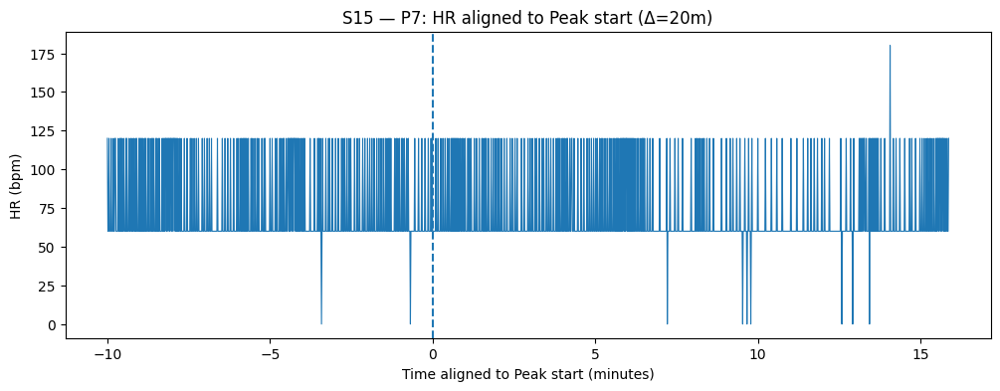

 S15 ∆=20m -> S15_labels_chest∆20.parquet | Ant:1200s Peak:900s Rec:53s


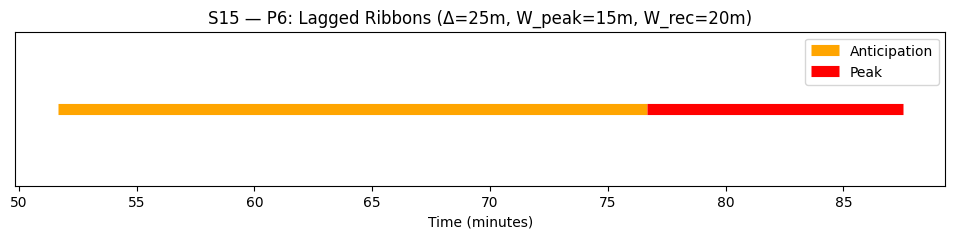

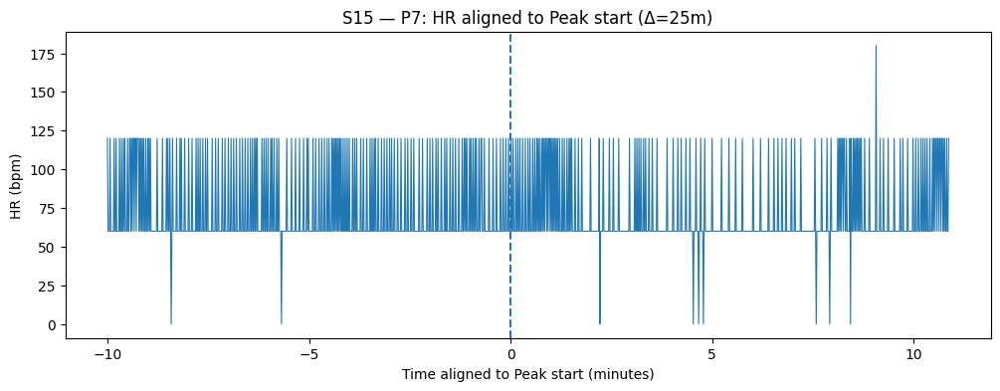

 S15 ∆=25m -> S15_labels_chest∆25.parquet | Ant:1500s Peak:653s Rec:0s


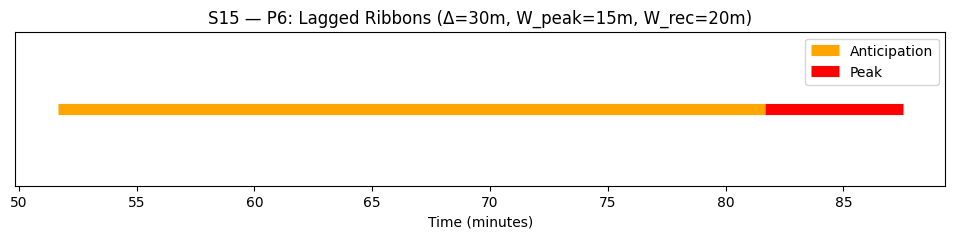

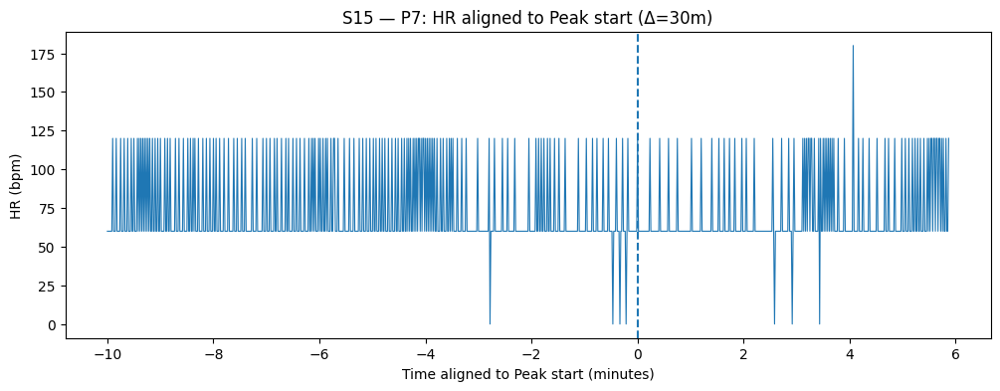

 S15 ∆=30m -> S15_labels_chest∆30.parquet | Ant:1800s Peak:353s Rec:0s


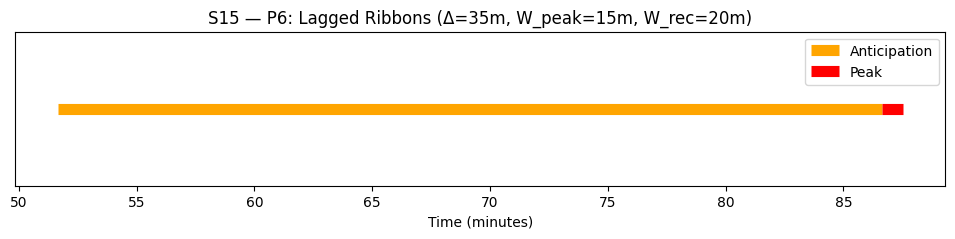

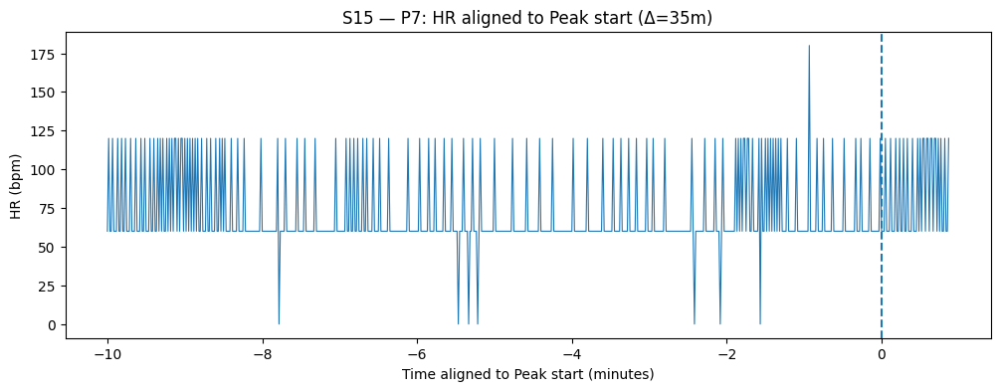

 S15 ∆=35m -> S15_labels_chest∆35.parquet | Ant:2100s Peak:53s Rec:0s


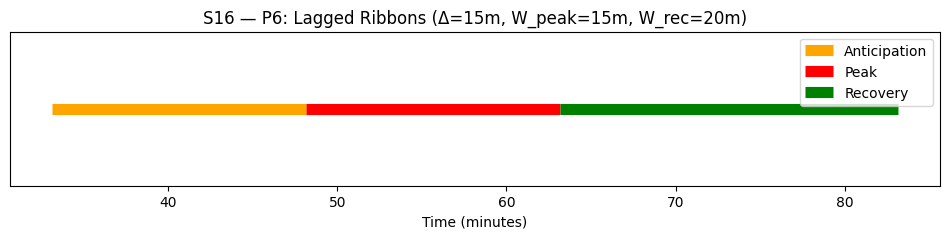

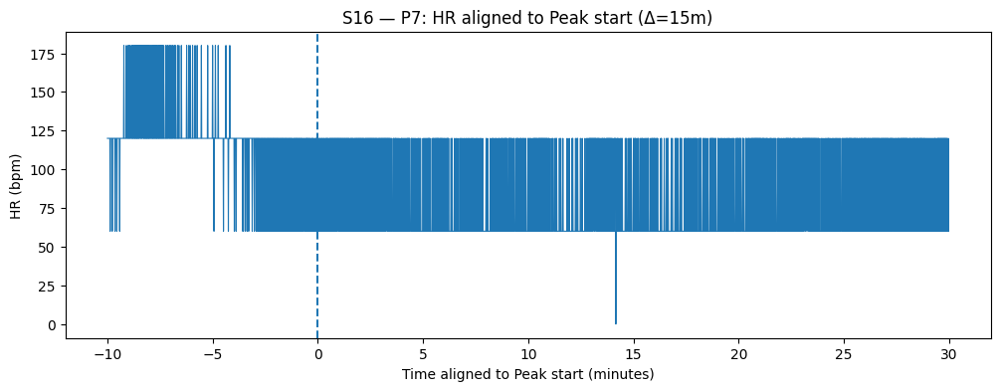

 S16 ∆=15m -> S16_labels_chest∆15.parquet | Ant:900s Peak:900s Rec:1200s


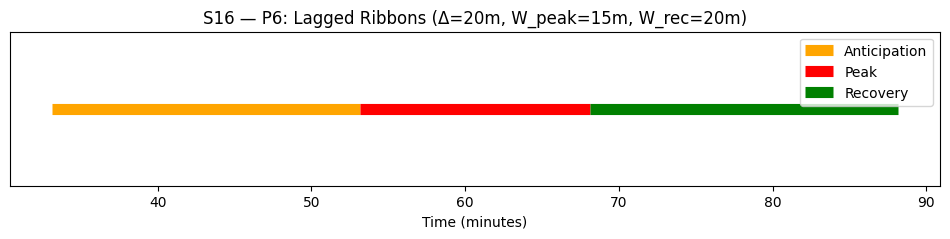

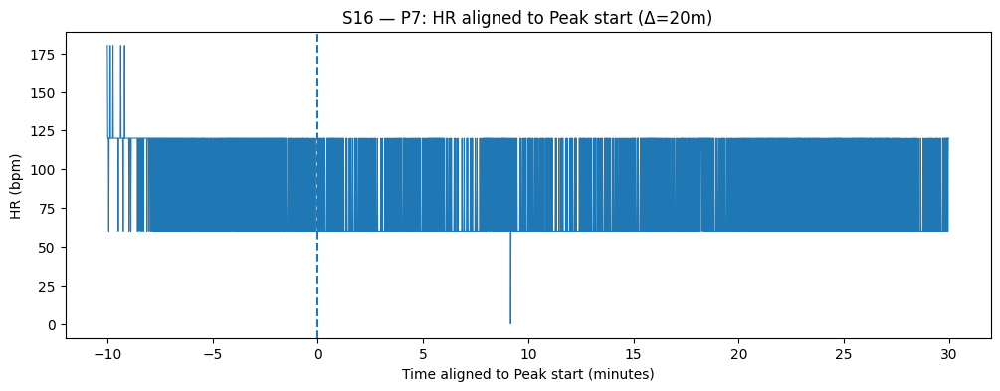

 S16 ∆=20m -> S16_labels_chest∆20.parquet | Ant:1200s Peak:900s Rec:1200s


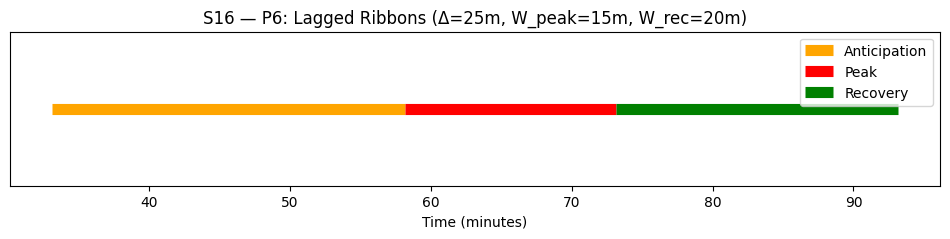

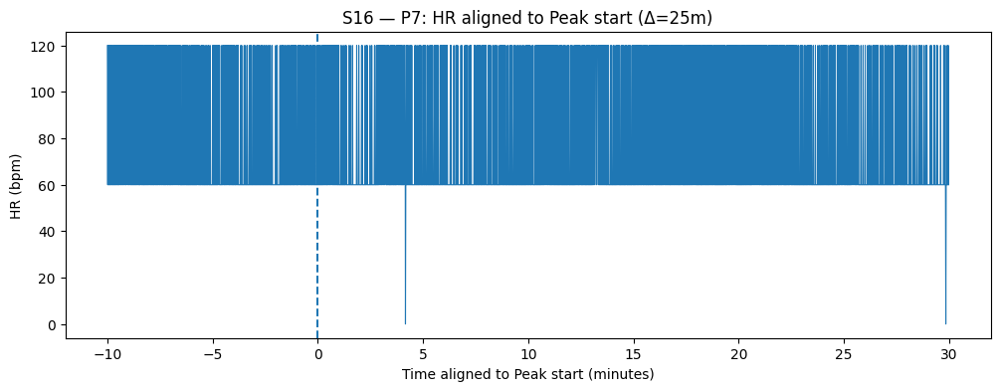

 S16 ∆=25m -> S16_labels_chest∆25.parquet | Ant:1500s Peak:900s Rec:1200s


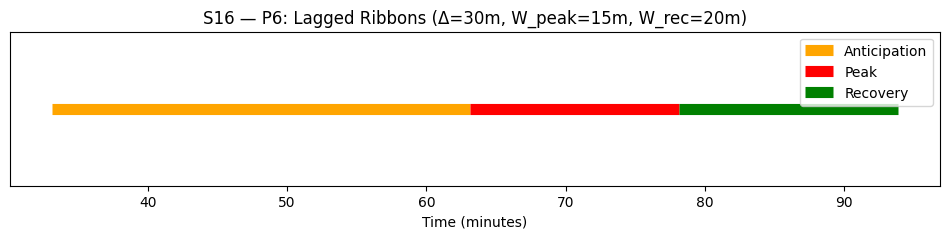

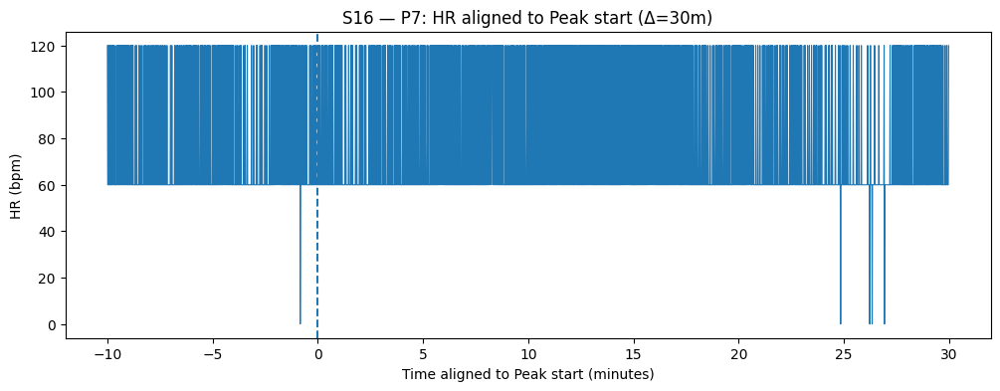

 S16 ∆=30m -> S16_labels_chest∆30.parquet | Ant:1800s Peak:900s Rec:943s


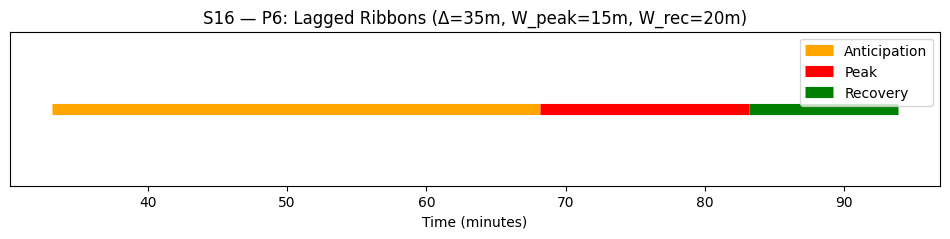

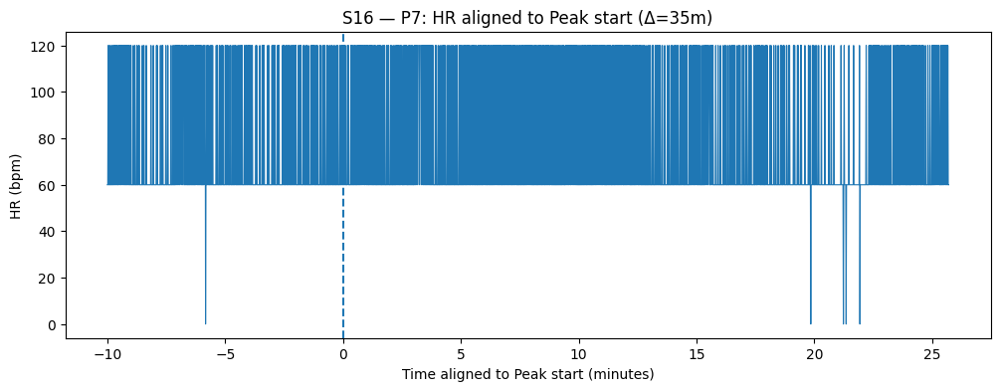

 S16 ∆=35m -> S16_labels_chest∆35.parquet | Ant:2100s Peak:900s Rec:643s


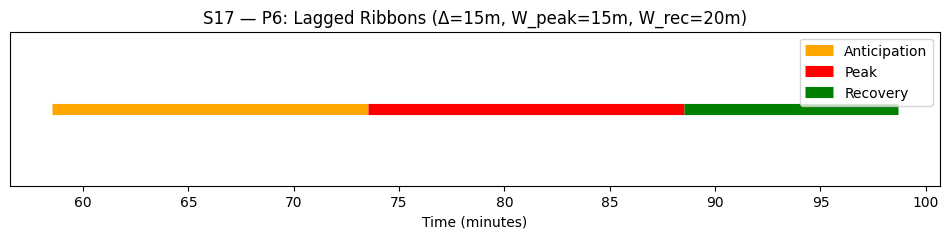

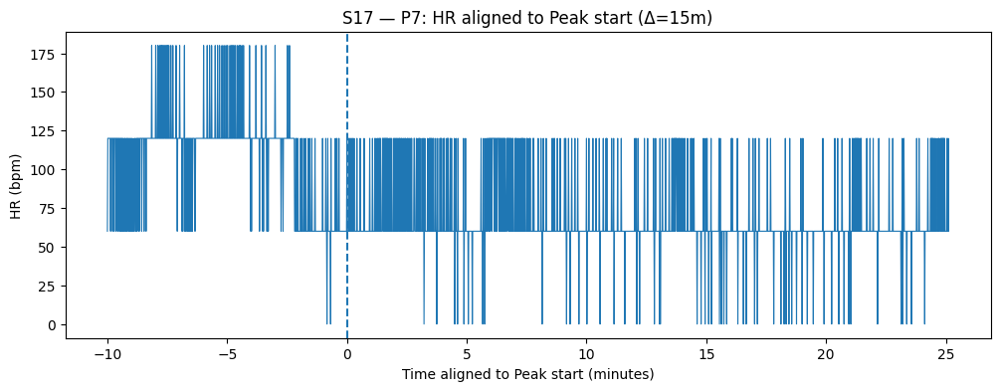

 S17 ∆=15m -> S17_labels_chest∆15.parquet | Ant:900s Peak:900s Rec:608s


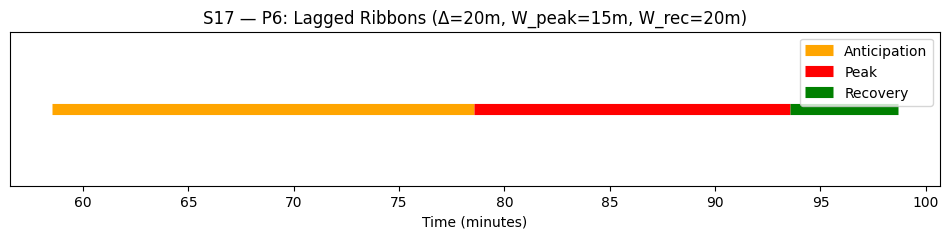

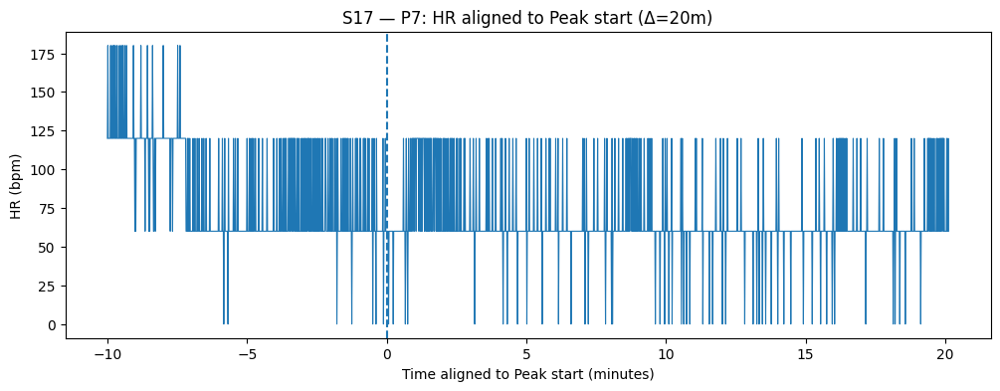

 S17 ∆=20m -> S17_labels_chest∆20.parquet | Ant:1200s Peak:900s Rec:308s


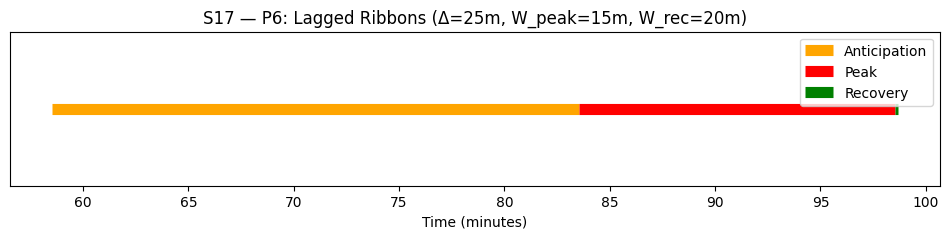

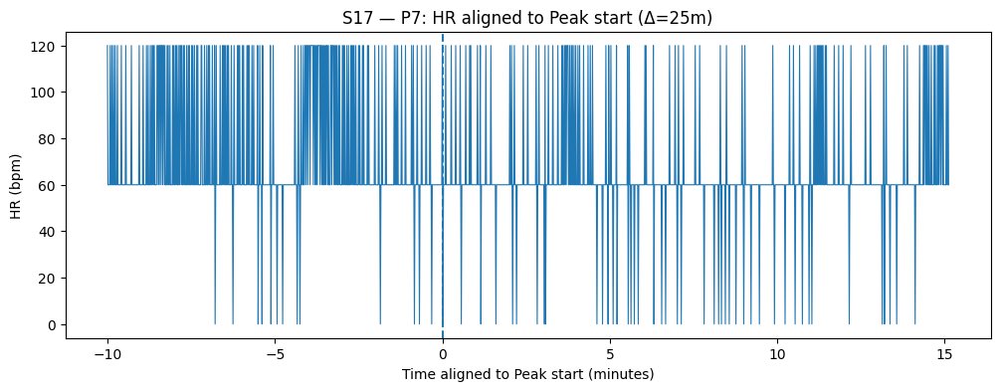

 S17 ∆=25m -> S17_labels_chest∆25.parquet | Ant:1500s Peak:900s Rec:8s


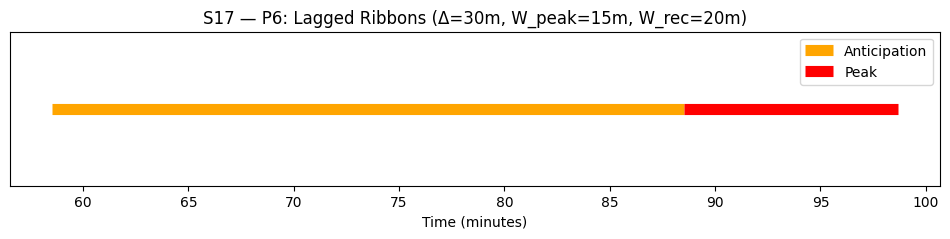

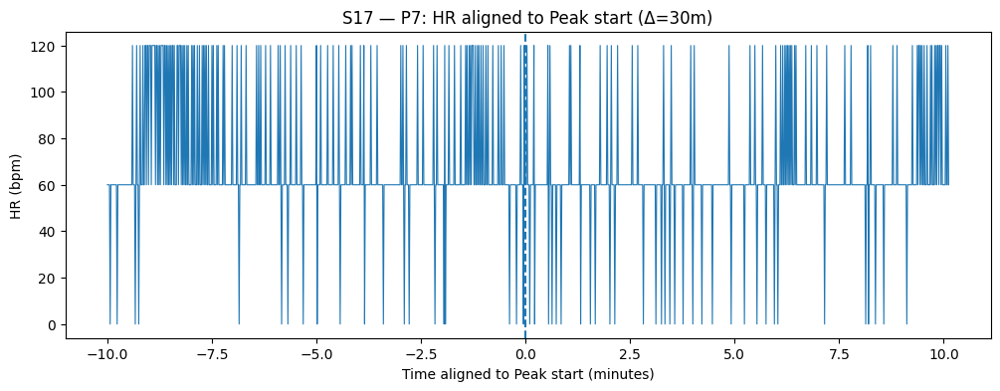

 S17 ∆=30m -> S17_labels_chest∆30.parquet | Ant:1800s Peak:608s Rec:0s


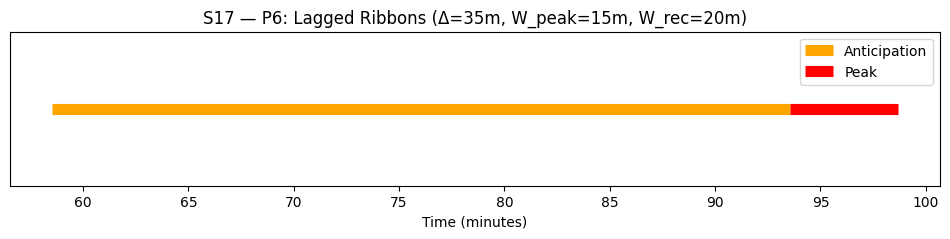

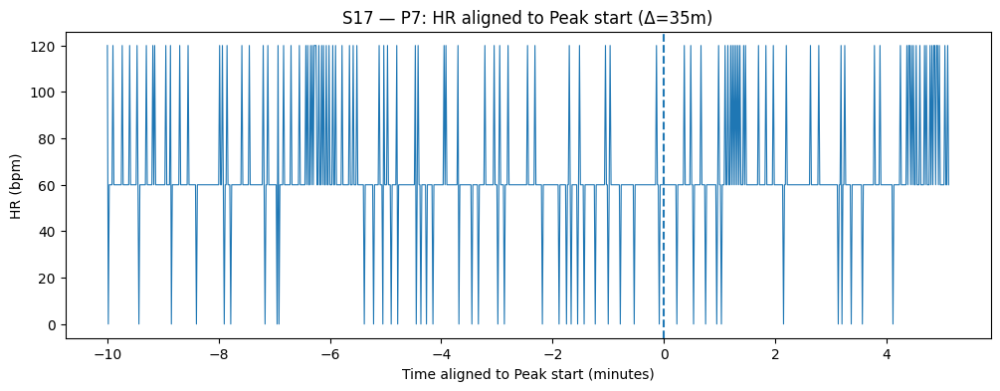

 S17 ∆=35m -> S17_labels_chest∆35.parquet | Ant:2100s Peak:308s Rec:0s


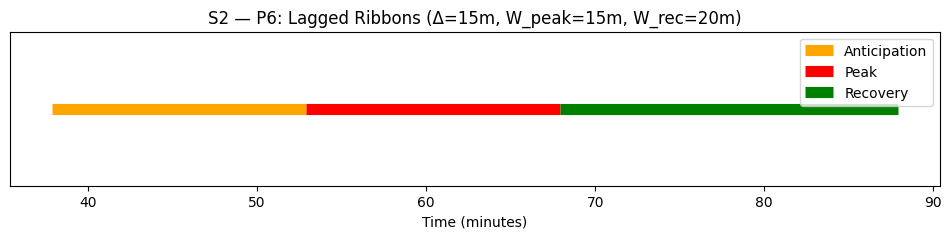

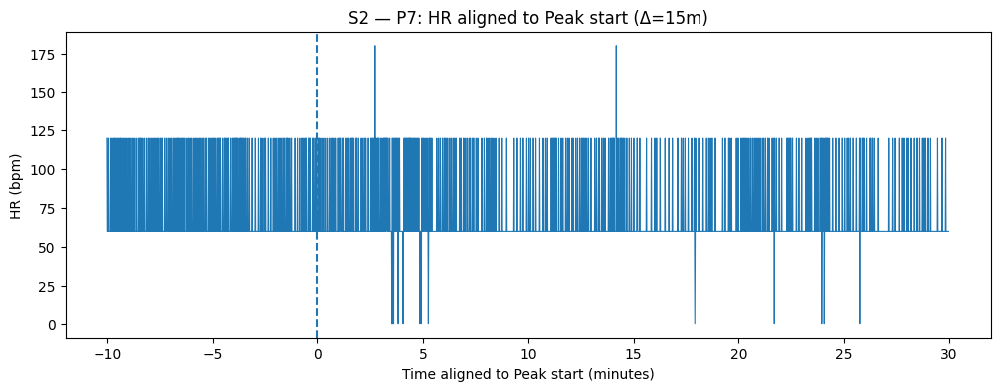

 S2 ∆=15m -> S2_labels_chest∆15.parquet | Ant:900s Peak:900s Rec:1200s


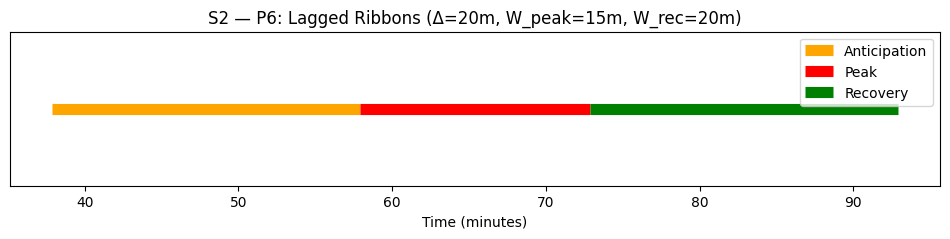

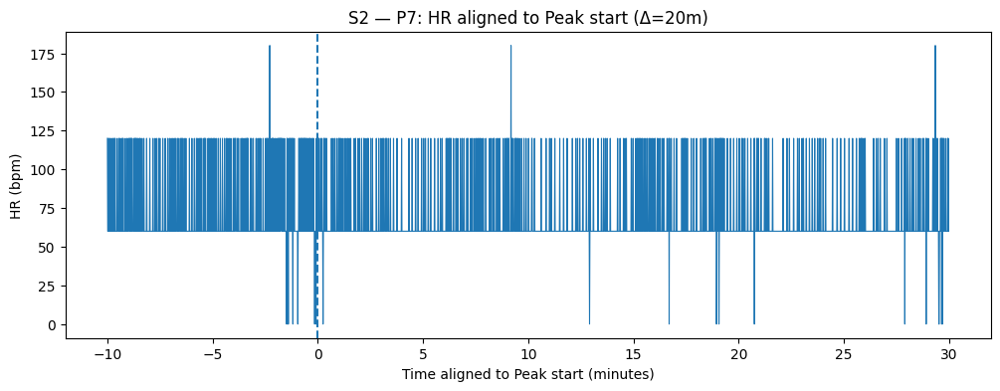

 S2 ∆=20m -> S2_labels_chest∆20.parquet | Ant:1200s Peak:900s Rec:1200s


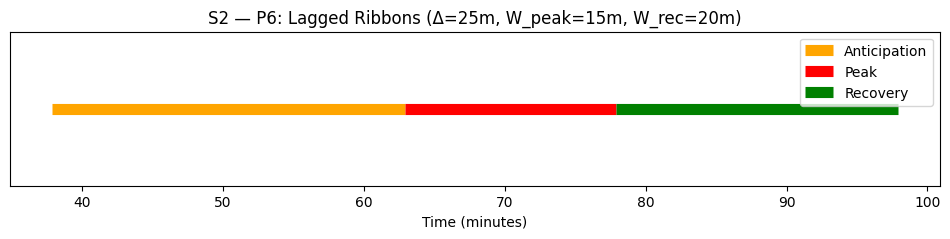

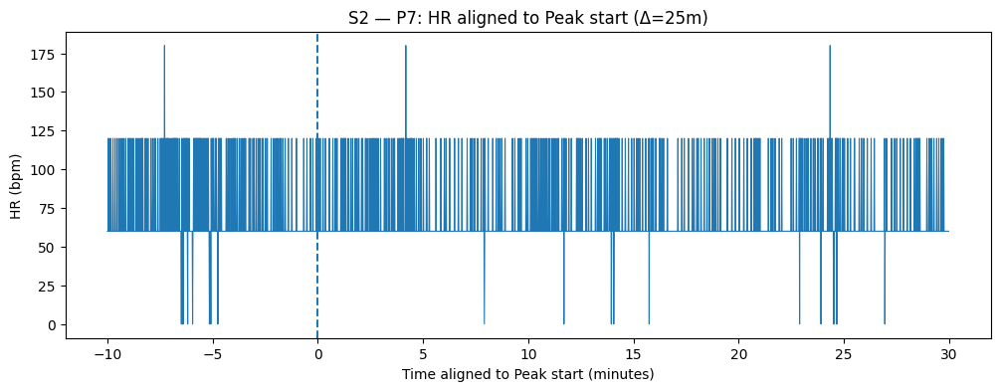

 S2 ∆=25m -> S2_labels_chest∆25.parquet | Ant:1500s Peak:900s Rec:1200s


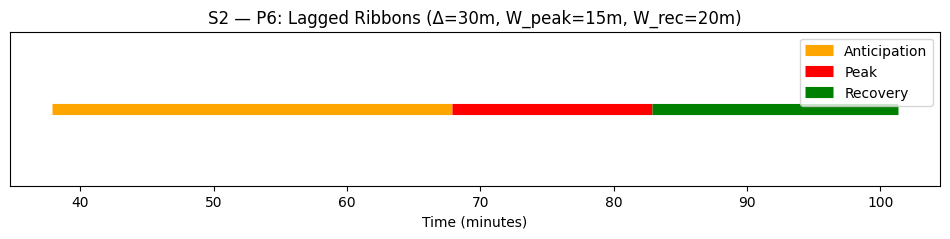

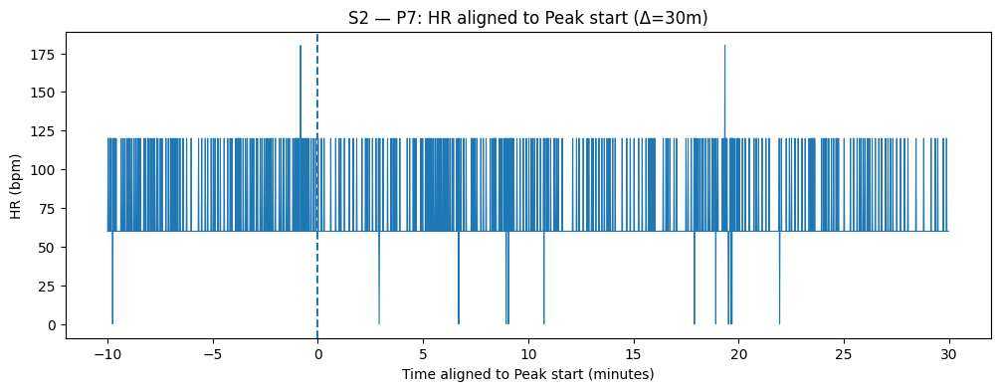

 S2 ∆=30m -> S2_labels_chest∆30.parquet | Ant:1800s Peak:900s Rec:1106s


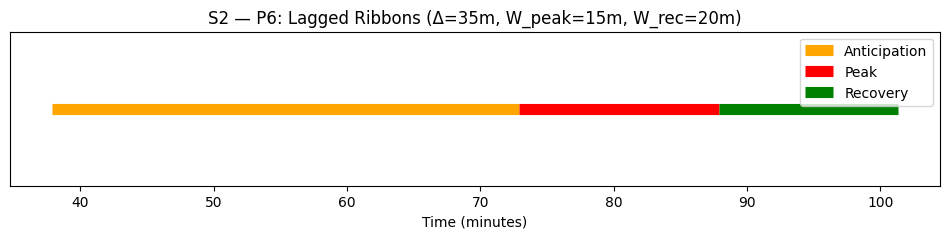

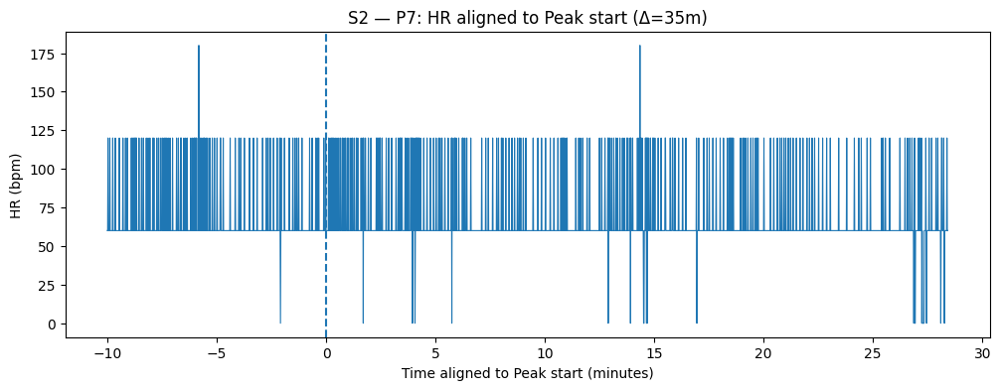

 S2 ∆=35m -> S2_labels_chest∆35.parquet | Ant:2100s Peak:900s Rec:806s


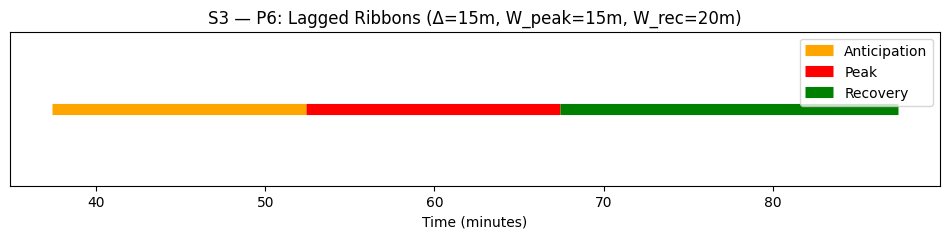

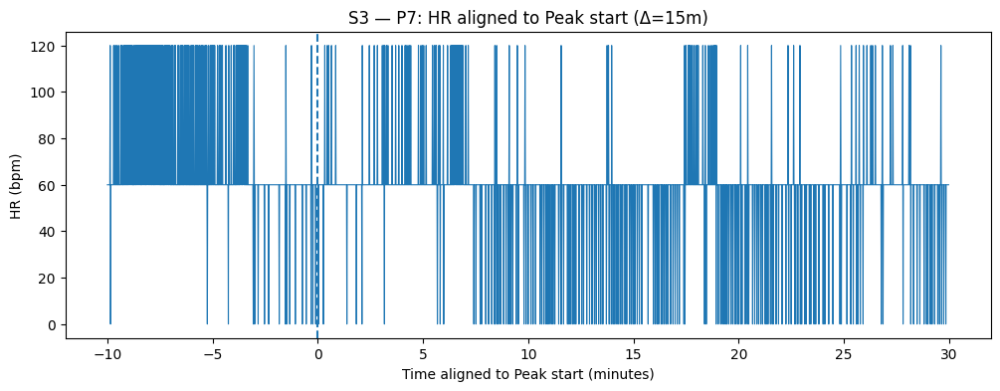

 S3 ∆=15m -> S3_labels_chest∆15.parquet | Ant:900s Peak:900s Rec:1200s


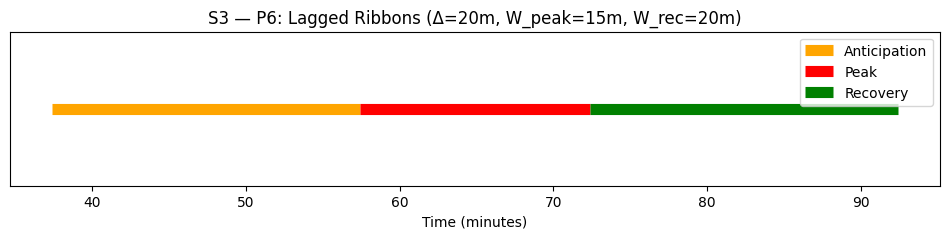

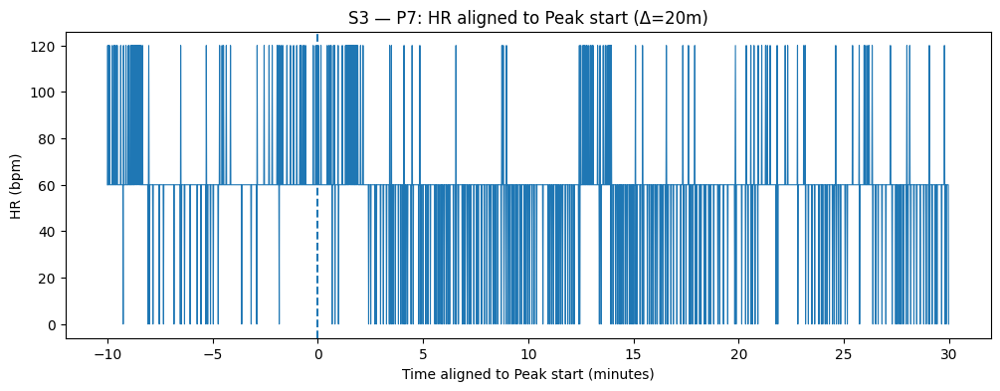

 S3 ∆=20m -> S3_labels_chest∆20.parquet | Ant:1200s Peak:900s Rec:1200s


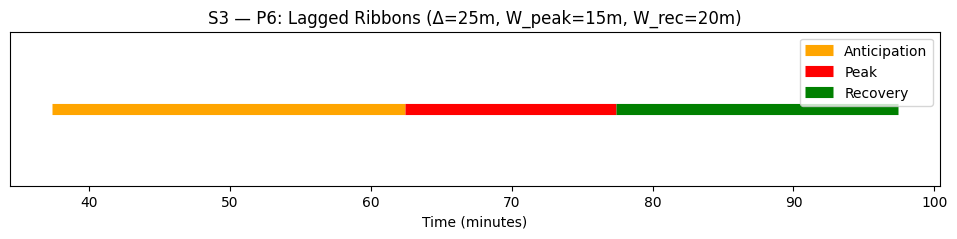

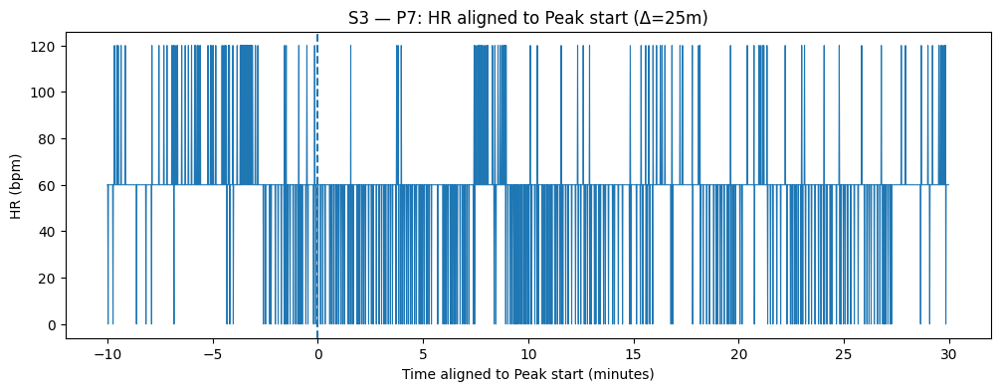

 S3 ∆=25m -> S3_labels_chest∆25.parquet | Ant:1500s Peak:900s Rec:1200s


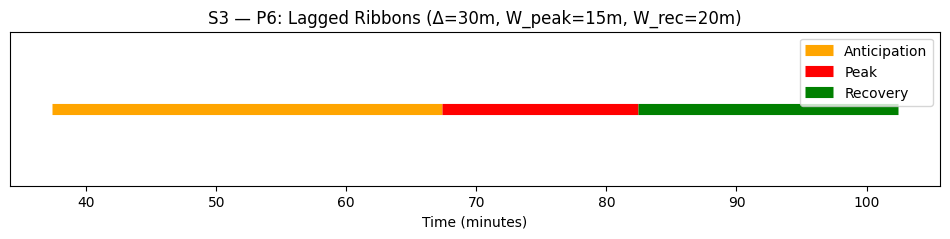

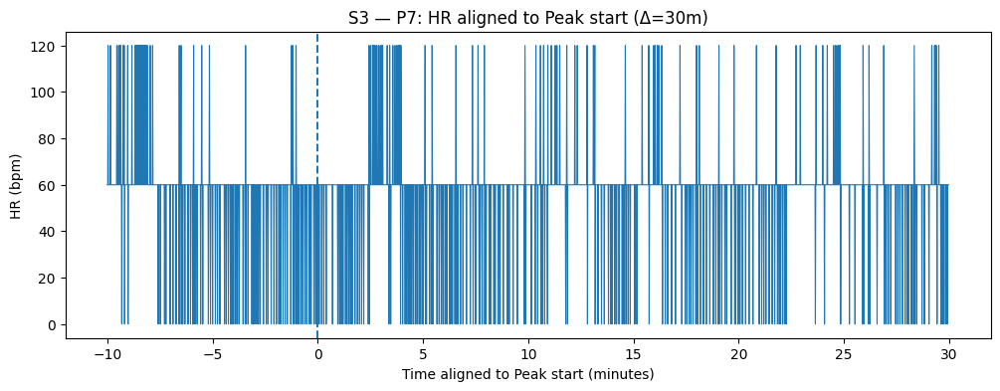

 S3 ∆=30m -> S3_labels_chest∆30.parquet | Ant:1800s Peak:900s Rec:1200s


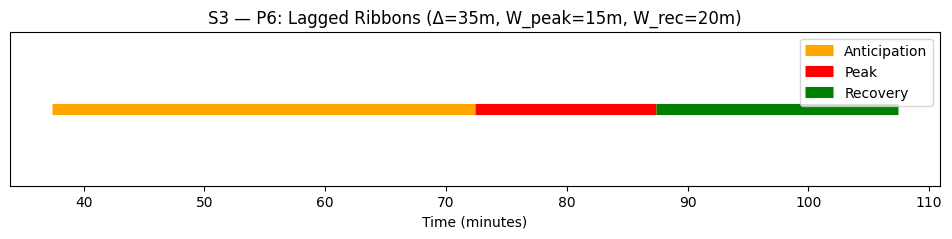

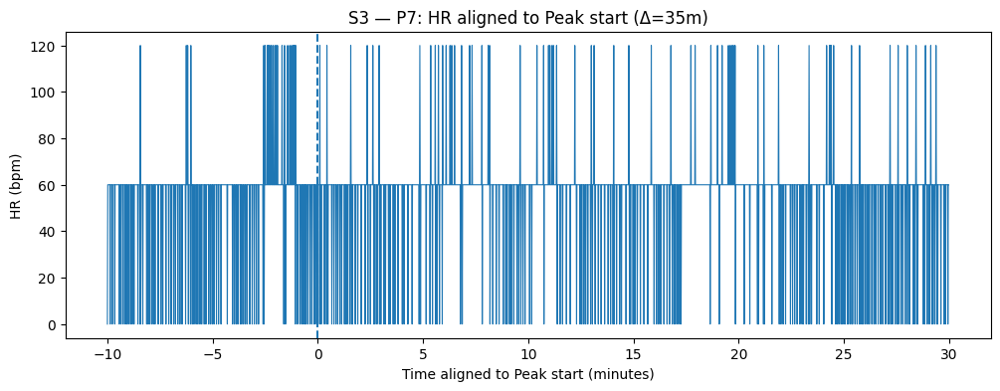

 S3 ∆=35m -> S3_labels_chest∆35.parquet | Ant:2100s Peak:900s Rec:1200s


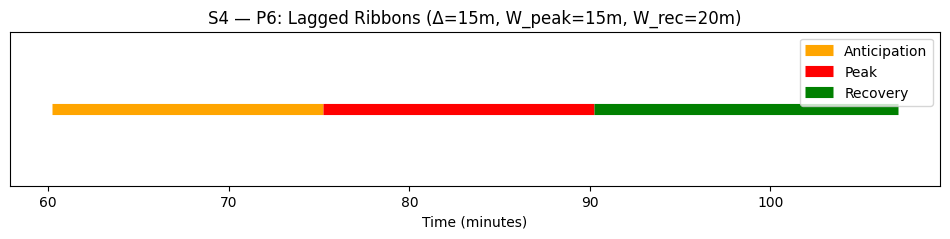

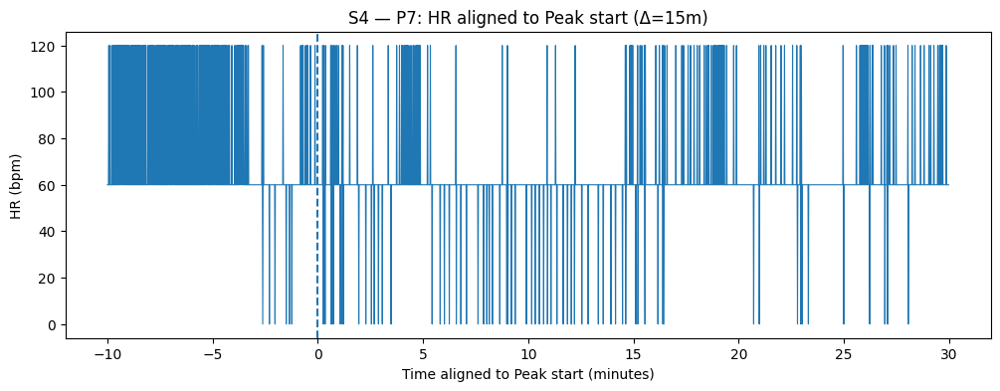

 S4 ∆=15m -> S4_labels_chest∆15.parquet | Ant:900s Peak:900s Rec:1010s


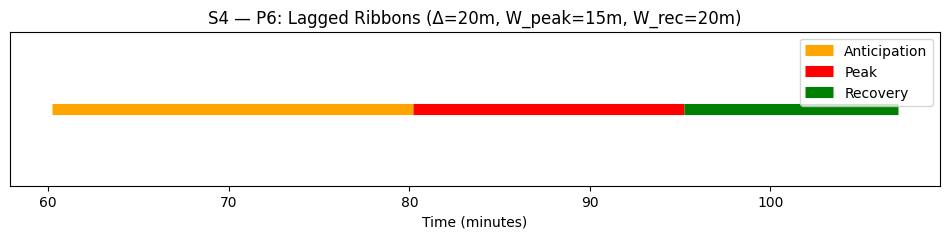

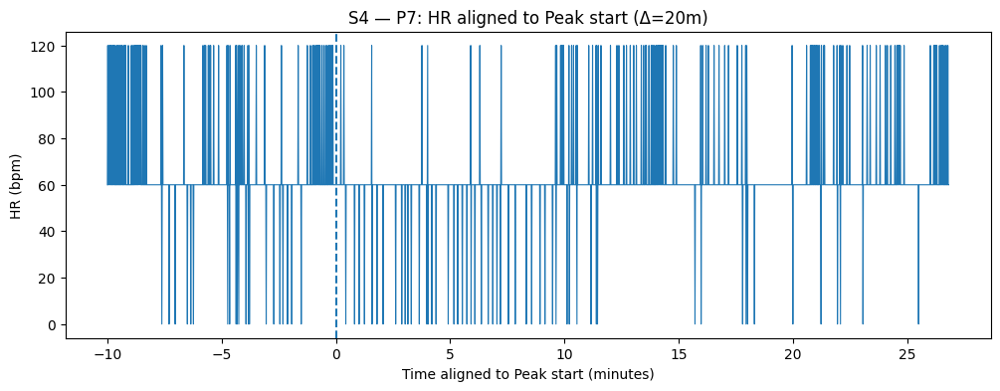

 S4 ∆=20m -> S4_labels_chest∆20.parquet | Ant:1200s Peak:900s Rec:710s


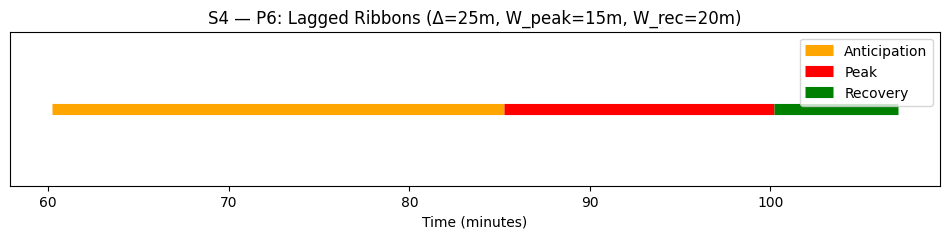

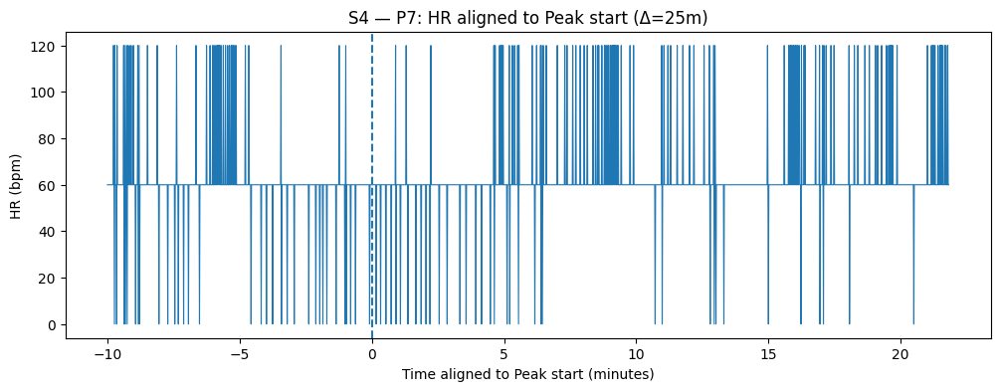

 S4 ∆=25m -> S4_labels_chest∆25.parquet | Ant:1500s Peak:900s Rec:410s


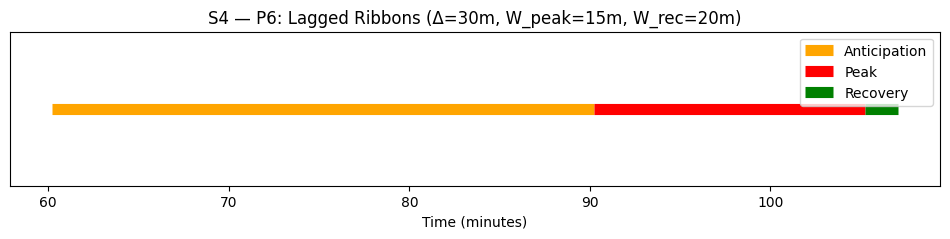

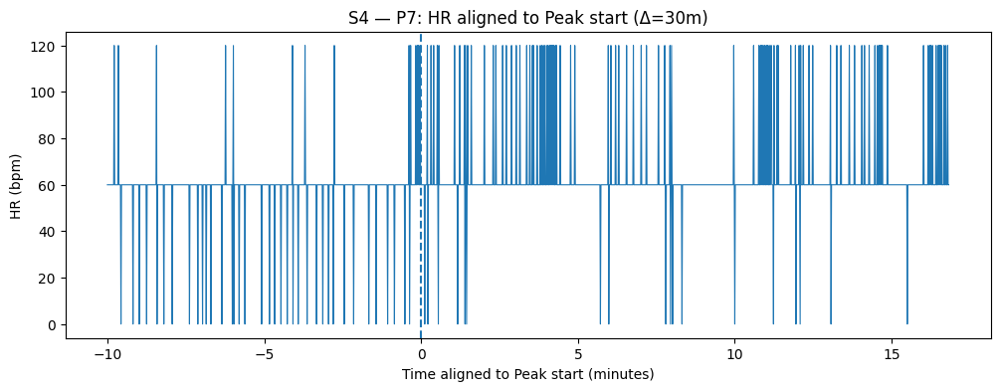

 S4 ∆=30m -> S4_labels_chest∆30.parquet | Ant:1800s Peak:900s Rec:110s


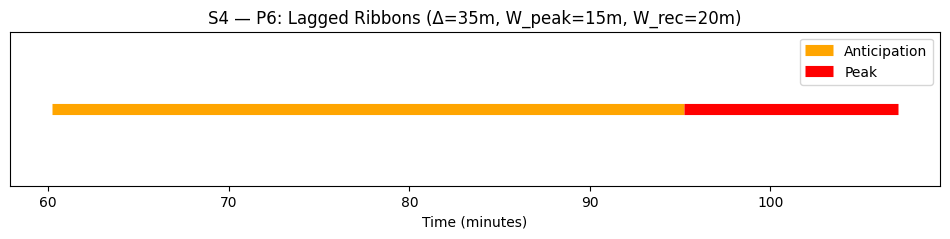

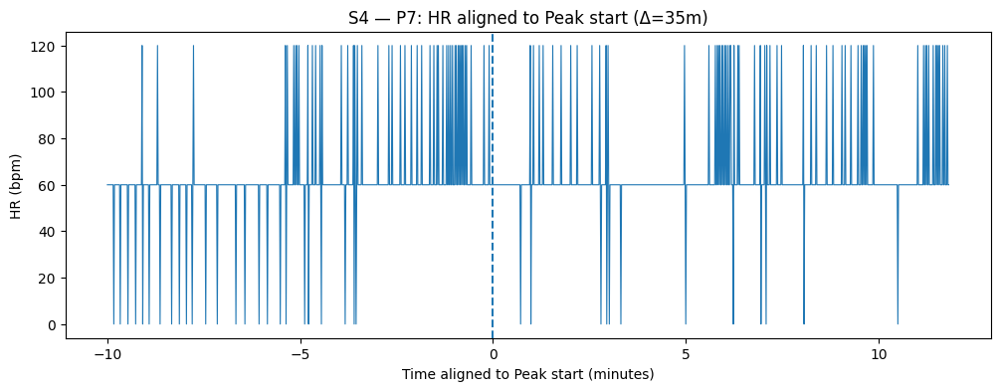

 S4 ∆=35m -> S4_labels_chest∆35.parquet | Ant:2100s Peak:710s Rec:0s


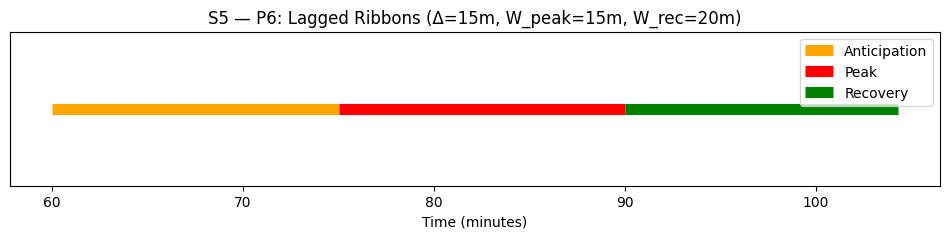

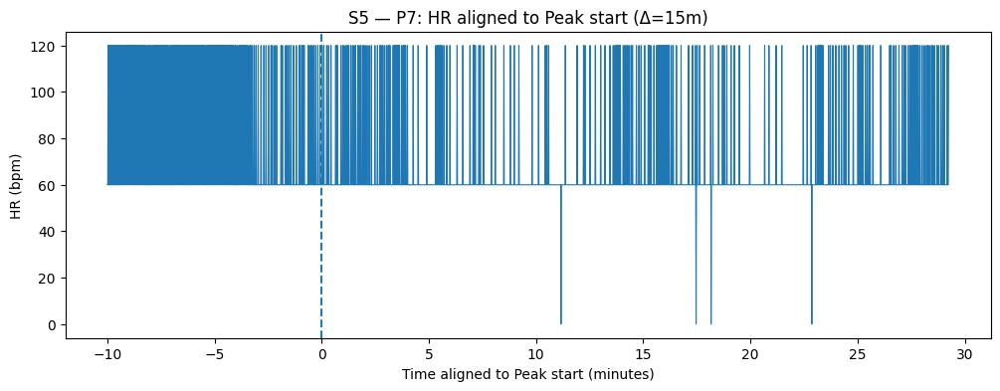

 S5 ∆=15m -> S5_labels_chest∆15.parquet | Ant:900s Peak:900s Rec:856s


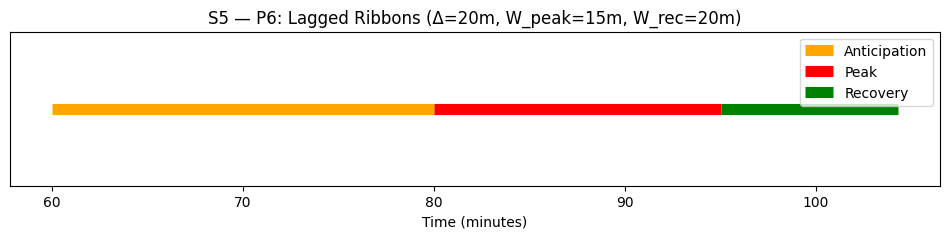

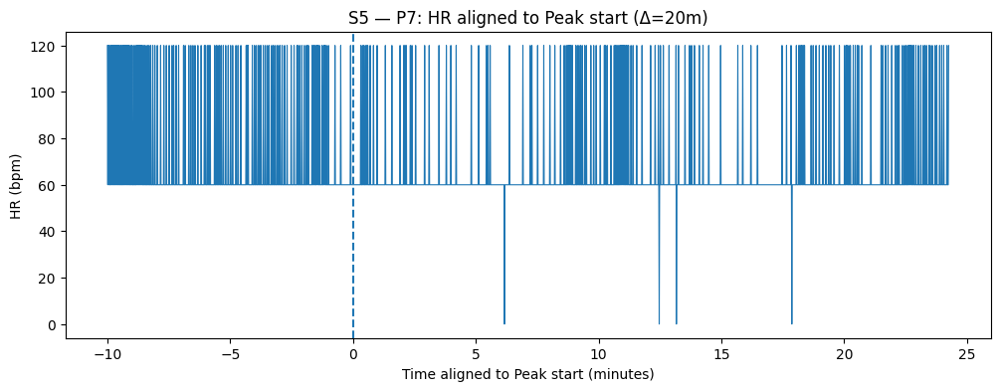

 S5 ∆=20m -> S5_labels_chest∆20.parquet | Ant:1200s Peak:900s Rec:556s


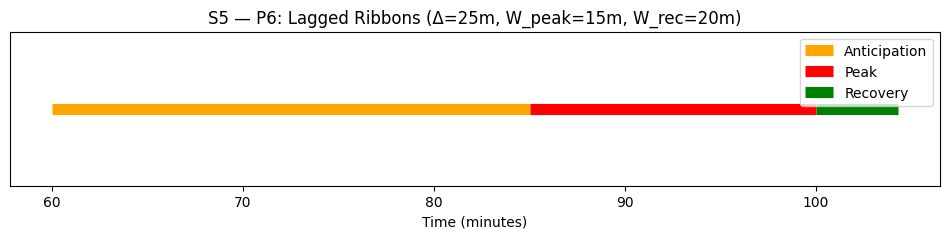

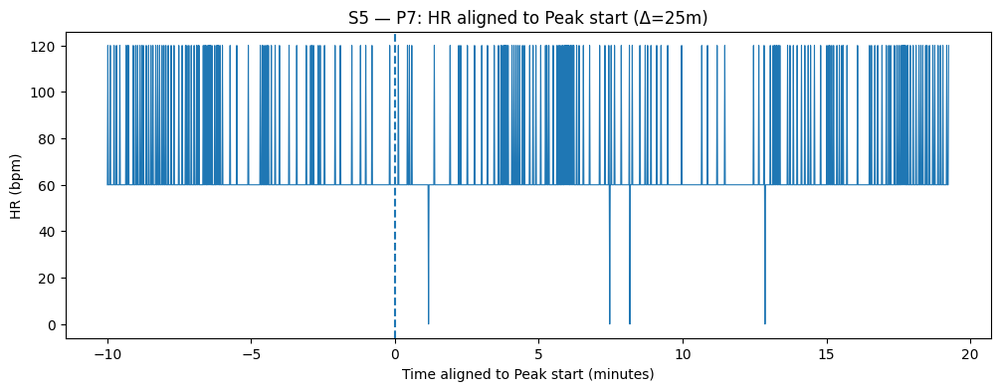

 S5 ∆=25m -> S5_labels_chest∆25.parquet | Ant:1500s Peak:900s Rec:256s


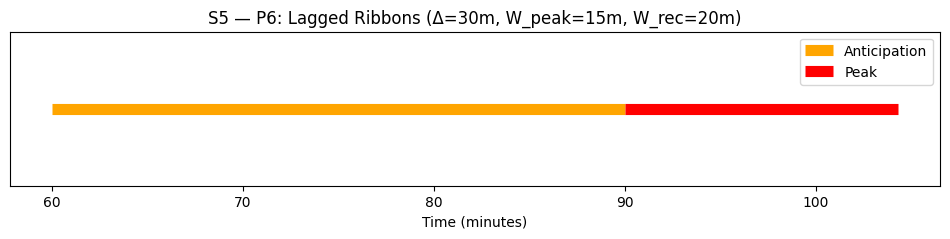

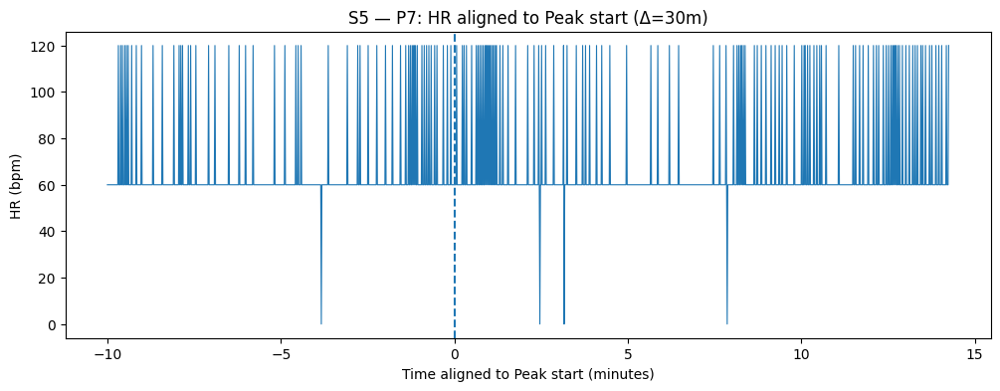

 S5 ∆=30m -> S5_labels_chest∆30.parquet | Ant:1800s Peak:856s Rec:0s


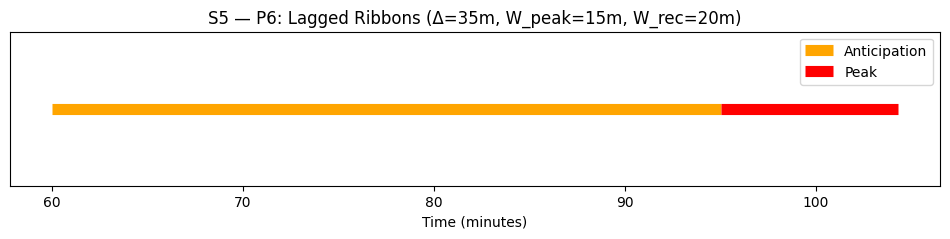

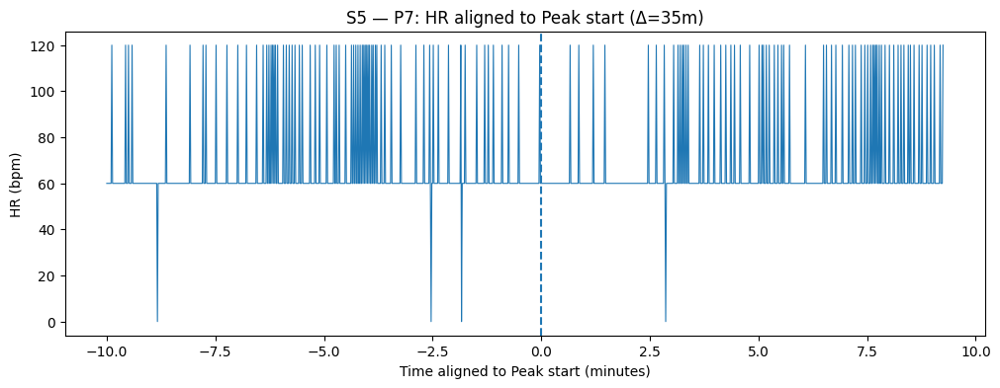

 S5 ∆=35m -> S5_labels_chest∆35.parquet | Ant:2100s Peak:556s Rec:0s


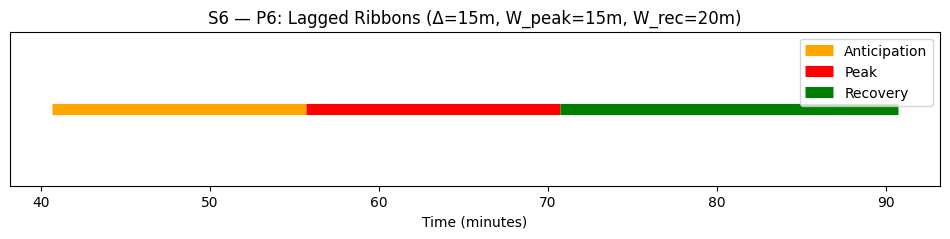

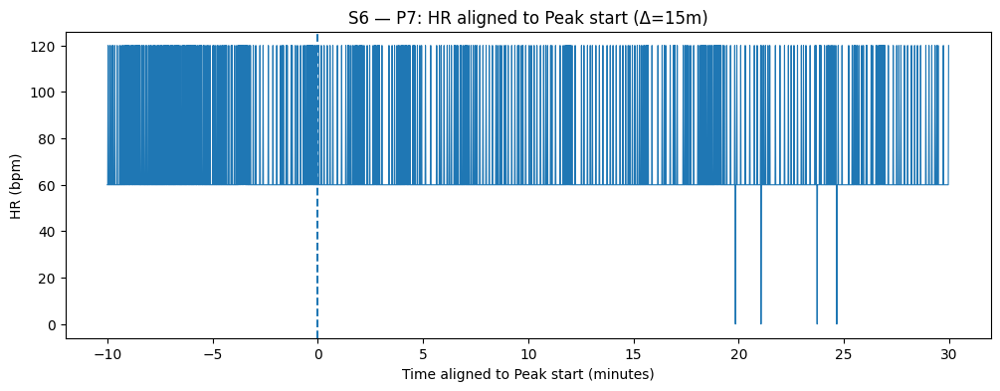

 S6 ∆=15m -> S6_labels_chest∆15.parquet | Ant:900s Peak:900s Rec:1200s


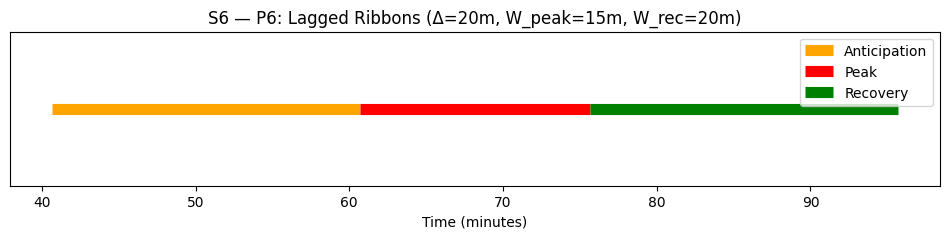

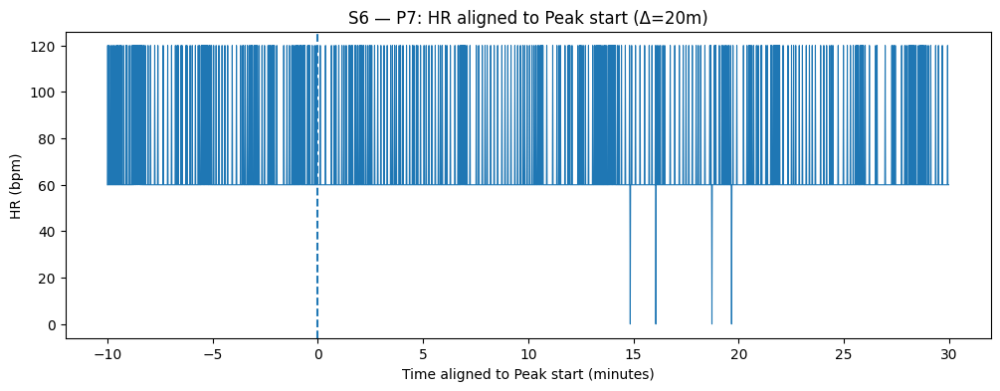

 S6 ∆=20m -> S6_labels_chest∆20.parquet | Ant:1200s Peak:900s Rec:1200s


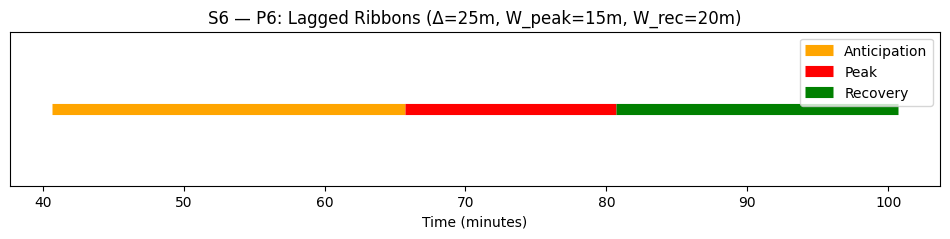

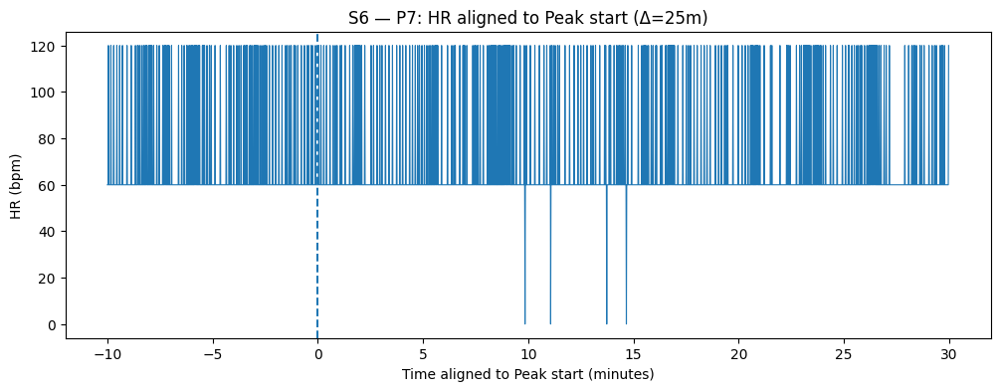

 S6 ∆=25m -> S6_labels_chest∆25.parquet | Ant:1500s Peak:900s Rec:1200s


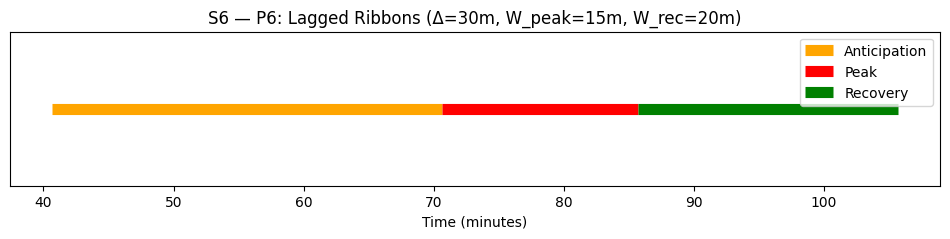

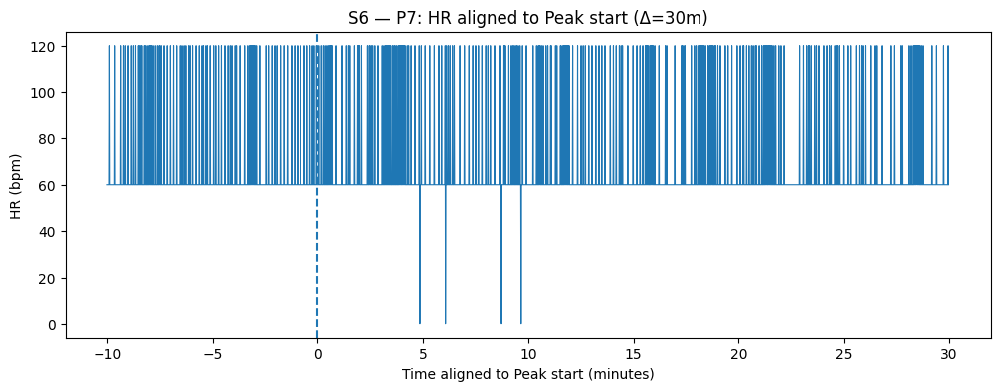

 S6 ∆=30m -> S6_labels_chest∆30.parquet | Ant:1800s Peak:900s Rec:1200s


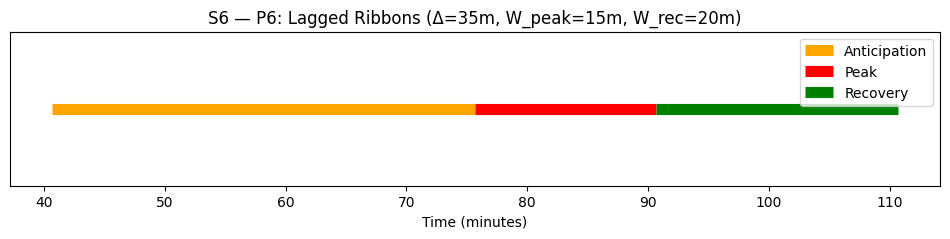

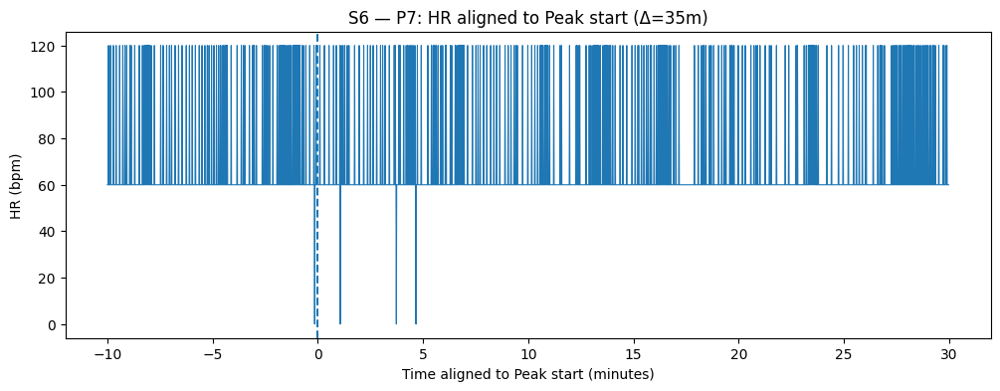

 S6 ∆=35m -> S6_labels_chest∆35.parquet | Ant:2100s Peak:900s Rec:1200s


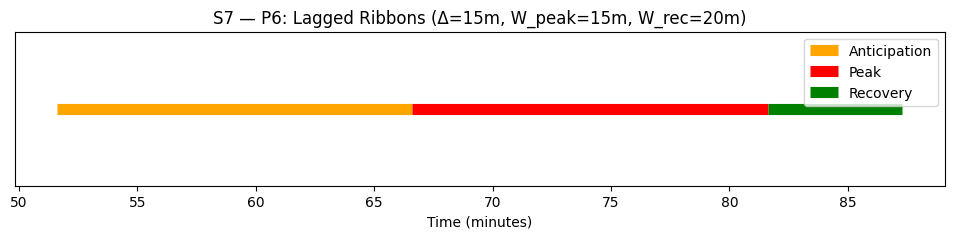

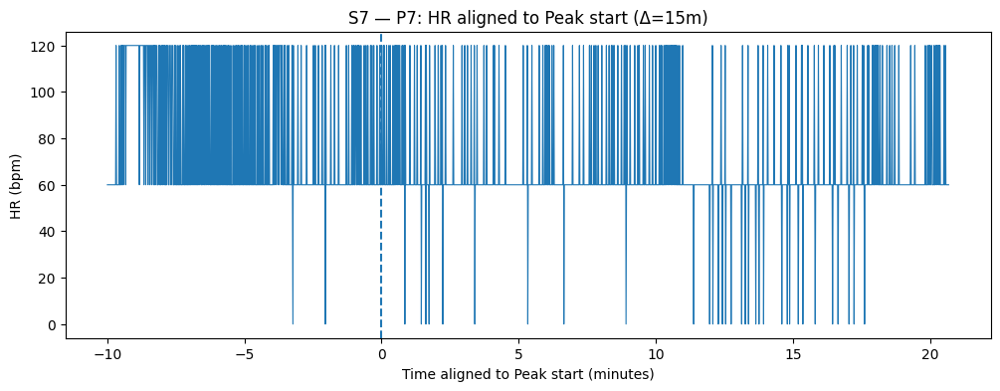

 S7 ∆=15m -> S7_labels_chest∆15.parquet | Ant:900s Peak:900s Rec:342s


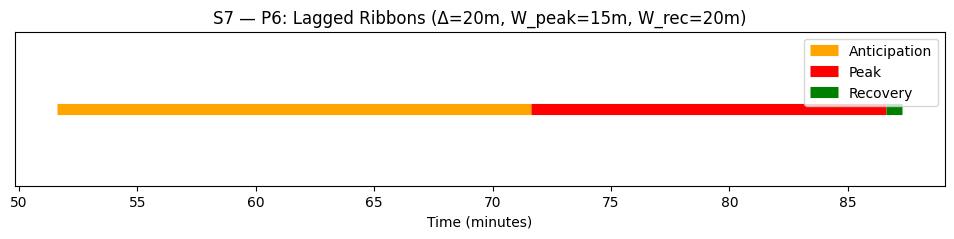

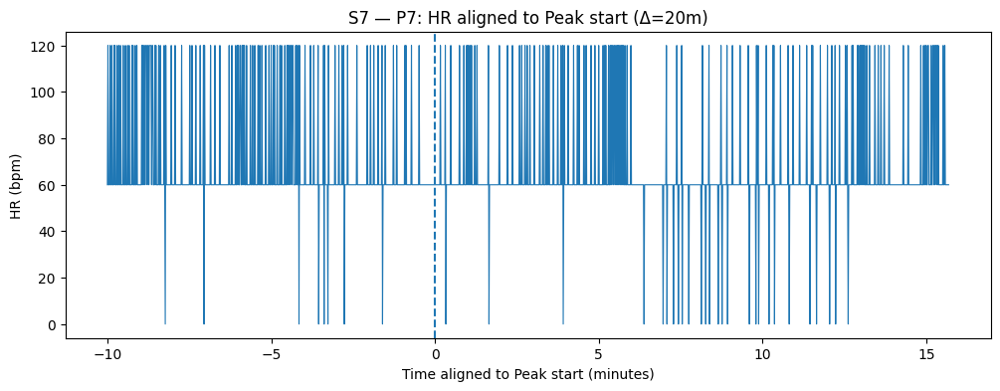

 S7 ∆=20m -> S7_labels_chest∆20.parquet | Ant:1200s Peak:900s Rec:42s


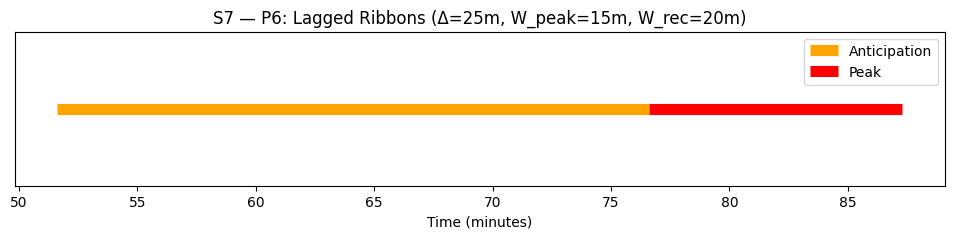

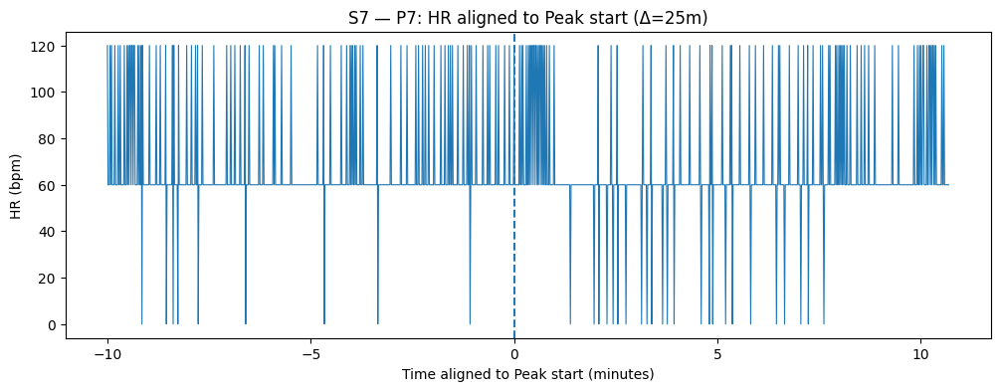

 S7 ∆=25m -> S7_labels_chest∆25.parquet | Ant:1500s Peak:642s Rec:0s


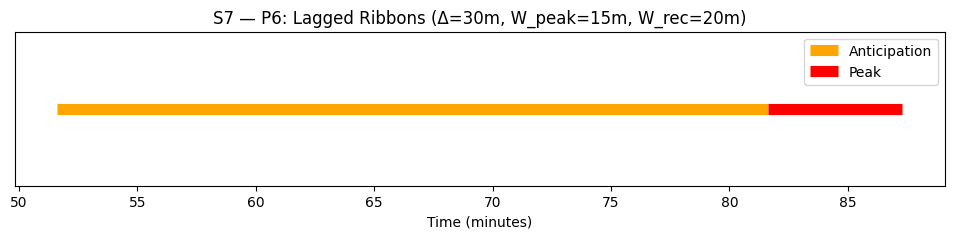

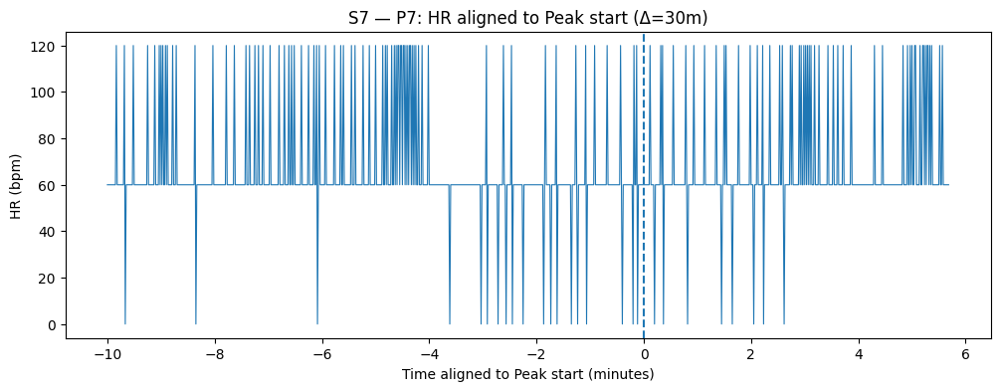

 S7 ∆=30m -> S7_labels_chest∆30.parquet | Ant:1800s Peak:342s Rec:0s


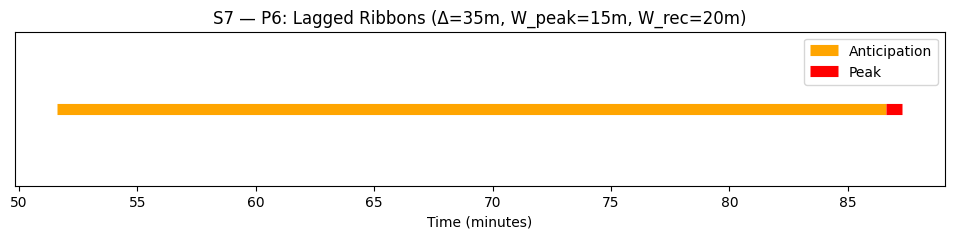

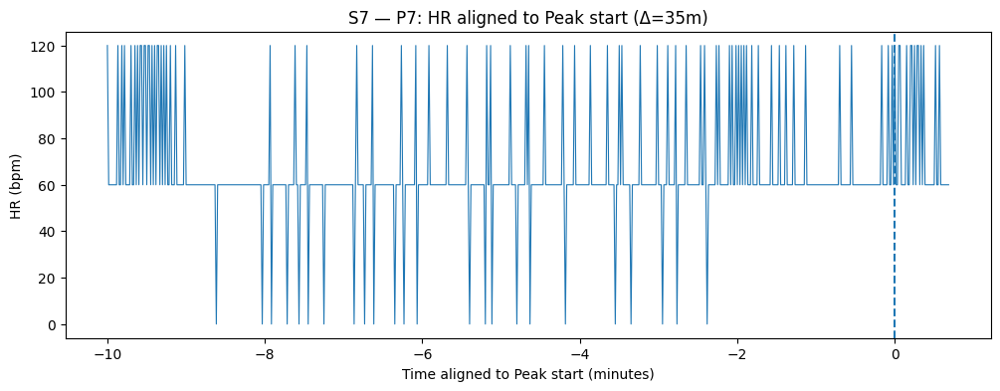

 S7 ∆=35m -> S7_labels_chest∆35.parquet | Ant:2100s Peak:42s Rec:0s


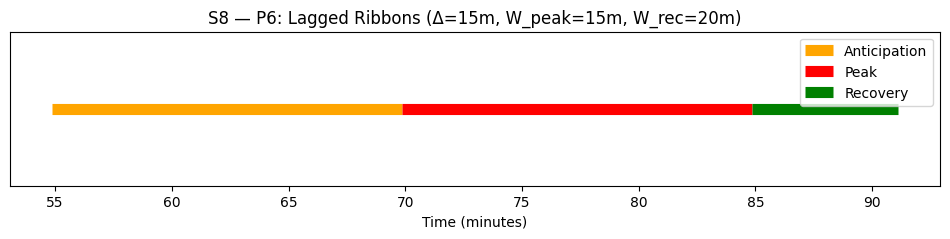

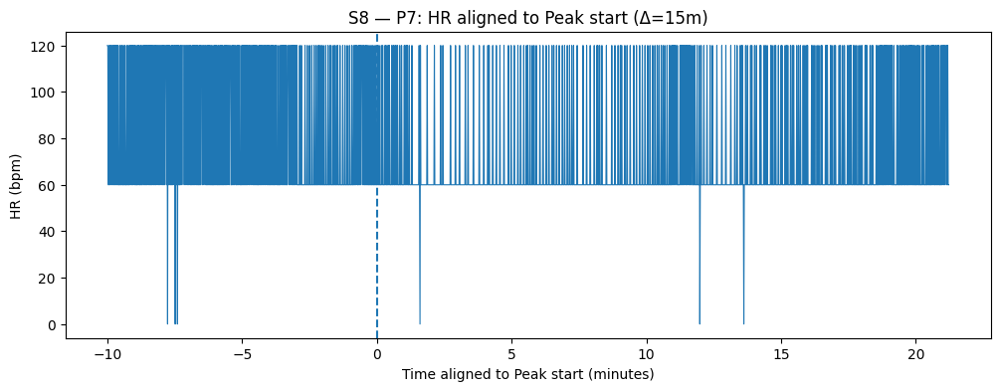

 S8 ∆=15m -> S8_labels_chest∆15.parquet | Ant:900s Peak:900s Rec:374s


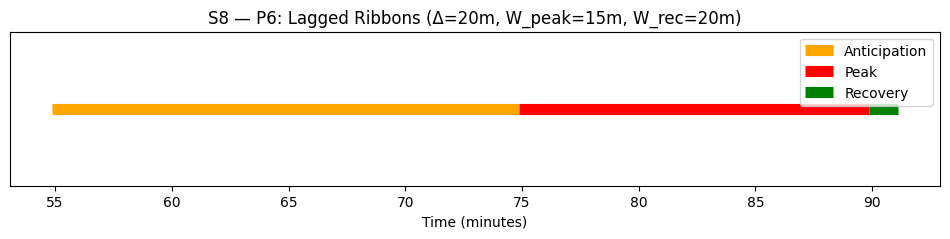

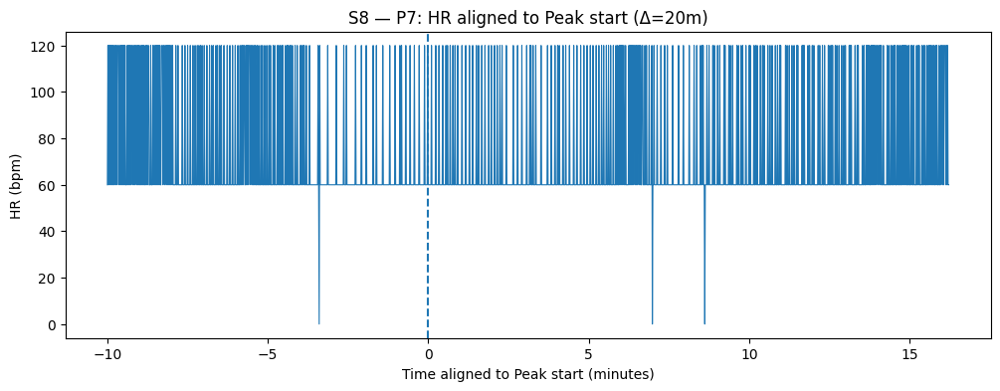

 S8 ∆=20m -> S8_labels_chest∆20.parquet | Ant:1200s Peak:900s Rec:74s


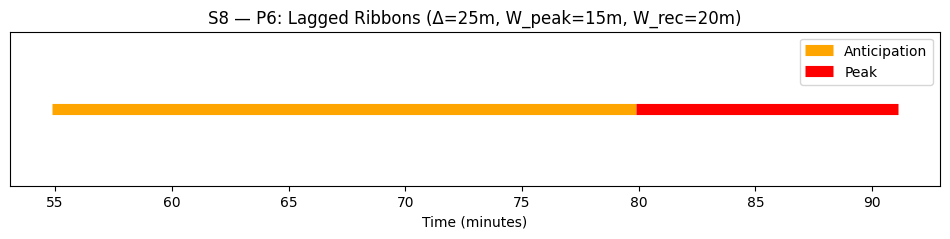

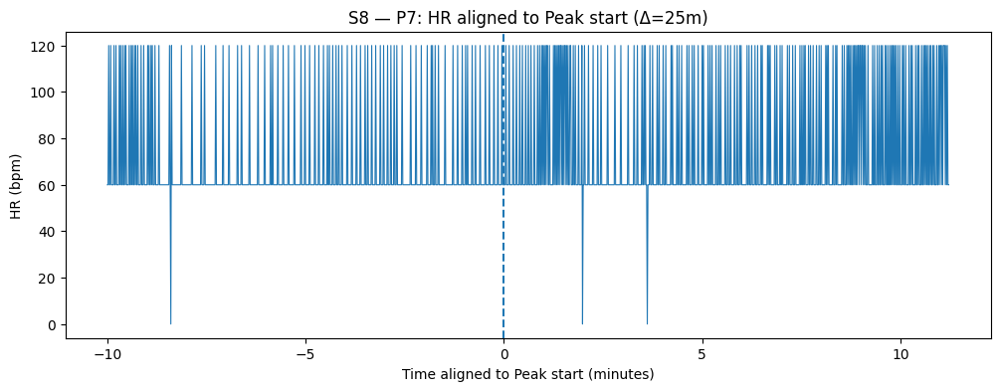

 S8 ∆=25m -> S8_labels_chest∆25.parquet | Ant:1500s Peak:674s Rec:0s


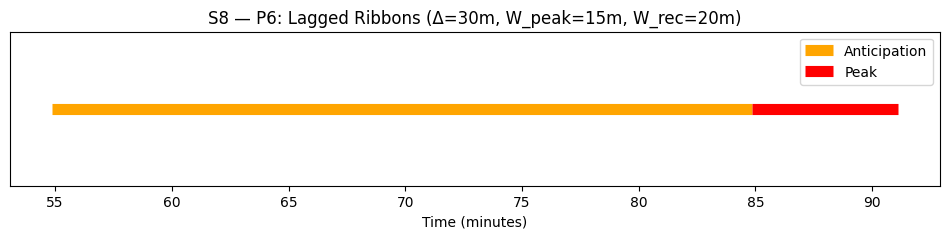

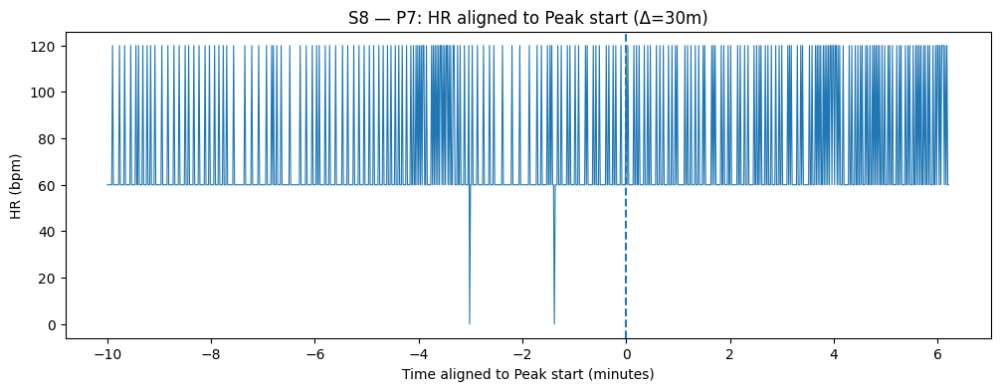

 S8 ∆=30m -> S8_labels_chest∆30.parquet | Ant:1800s Peak:374s Rec:0s


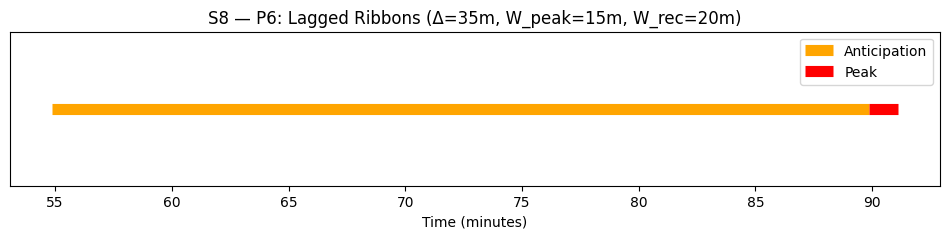

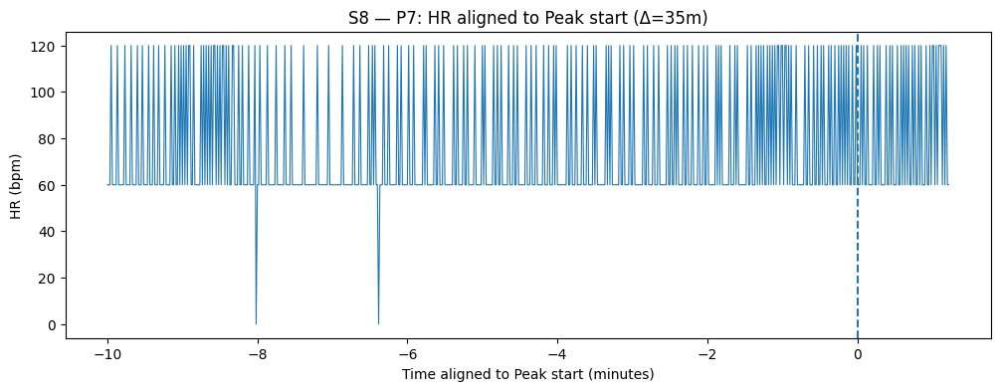

 S8 ∆=35m -> S8_labels_chest∆35.parquet | Ant:2100s Peak:74s Rec:0s


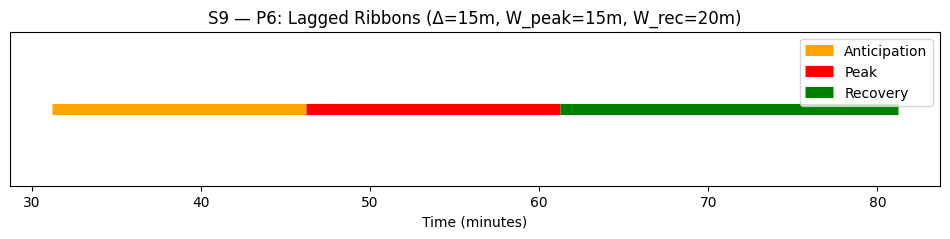

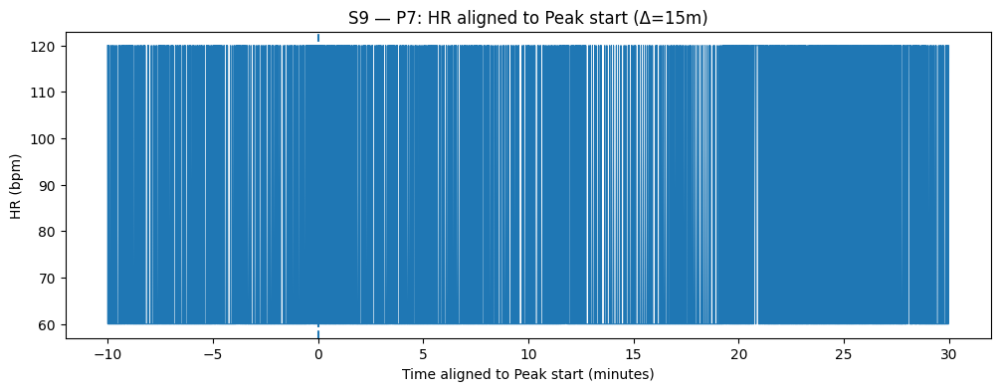

 S9 ∆=15m -> S9_labels_chest∆15.parquet | Ant:900s Peak:900s Rec:1200s


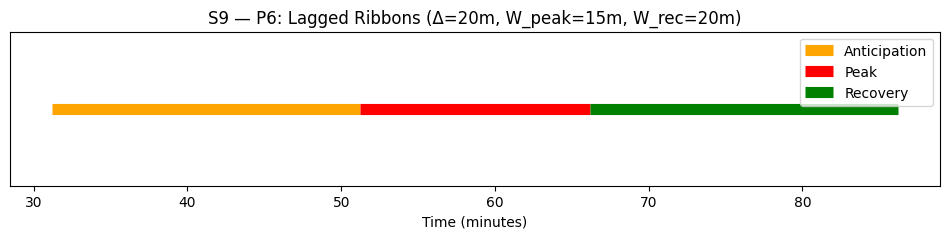

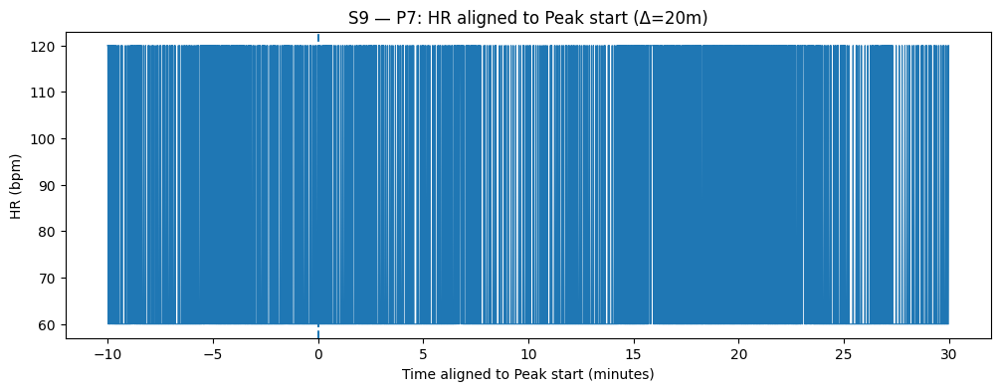

 S9 ∆=20m -> S9_labels_chest∆20.parquet | Ant:1200s Peak:900s Rec:1200s


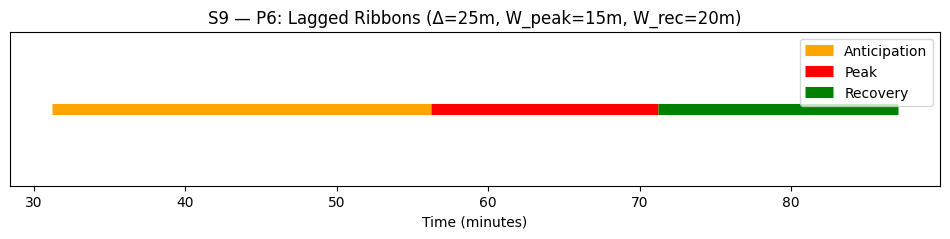

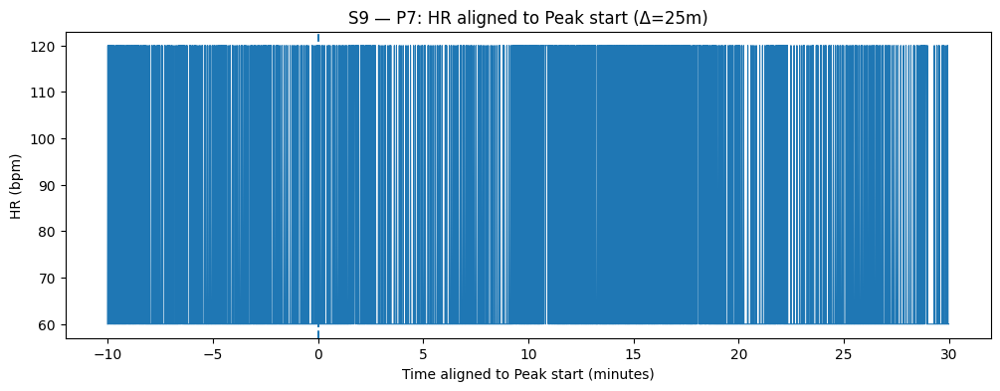

 S9 ∆=25m -> S9_labels_chest∆25.parquet | Ant:1500s Peak:900s Rec:951s


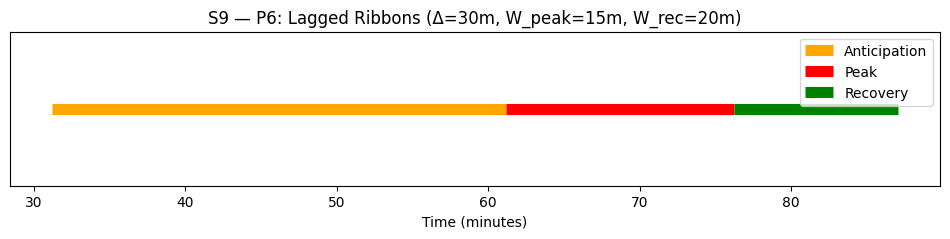

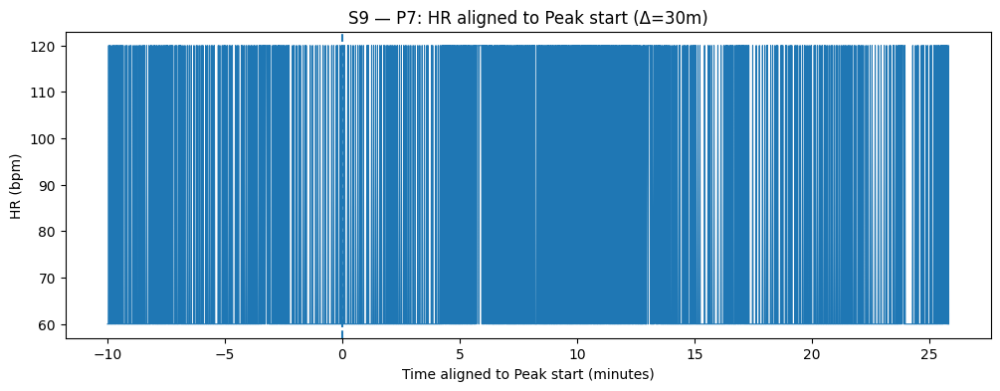

 S9 ∆=30m -> S9_labels_chest∆30.parquet | Ant:1800s Peak:900s Rec:651s


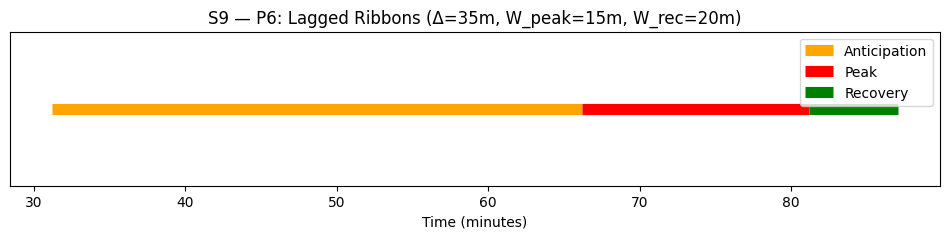

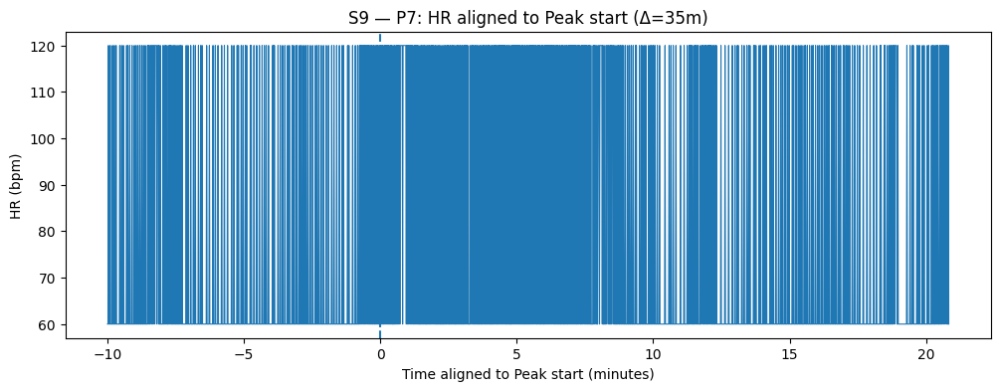

 S9 ∆=35m -> S9_labels_chest∆35.parquet | Ant:2100s Peak:900s Rec:351s

 saved: /content/wesad/reports/step7_hybrid_labels_summary.csv

Coverage by ∆ (fraction of subjects with non-zero seconds):
           Anticipation_coverage  Peak_coverage  Recovery_coverage
delta_min                                                         
15                           1.0            1.0           1.000000
20                           1.0            1.0           1.000000
25                           1.0            1.0           0.666667
30                           1.0            1.0           0.533333
35                           1.0            1.0           0.466667


In [32]:
# Hybrid Lag Labeling for ALL subjects (CHEST)
# Writes /content/wesad/interim/Sxx_labels_chest{delta}.parquet
# saves summary CSV and optional plots (P6, P7)

import json, pickle
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

proj = Path("/content/wesad")
root_dir = Path("/content/WESAD/WESAD")
out_interim = proj/"interim"
out_reports = proj/"reports"
out_interim.mkdir(parents=True, exist_ok=True)
out_reports.mkdir(parents=True, exist_ok=True)

# configuration
DELTAS_MIN = [15, 20, 25, 30, 35]   # testing different cortisol lags
W_PEAK_MIN = 15                     # minutes
W_REC_MIN  = 20                     # minutes
MAKE_P6 = True                      # save phase ribbons
MAKE_P7 = True                      # save HR trend aligned to peak start (needs per-second file)

def load_total_seconds(subject_id):
    # Prefer per-second features length if present
    sec_path = proj/"features"/"seconds"/f"{subject_id}_seconds.parquet"
    if sec_path.exists():
        return int(pd.read_parquet(sec_path)["second"].max() + 1)
    # Else from labels length / 700 Hz
    with open(root_dir/subject_id/f"{subject_id}.pkl","rb") as f:
        data = pickle.load(f, encoding="latin1")
    return int(len(data["label"]) // 700)

def load_stress_ts_te(subject_id):
    p = proj/"interim"/f"{subject_id}_intervals.json"
    with open(p, "r") as f:
        J = json.load(f)
    stress = J["intervals"].get("Stress", [])
    if not stress:
        raise ValueError(f"{subject_id}: no Stress interval in {p}")
    ts = float(stress[0]["start_sec"])
    te = float(stress[0]["end_sec"])
    return ts, te

def mark_range(vec, start_s, end_s, name, total_seconds):
    s0 = int(np.floor(max(0, start_s)))
    s1 = int(np.floor(min(total_seconds, end_s)))
    if s1 > s0:
        vec[s0:s1] = name

def label_subject_for_delta(subject_id, delta_min, w_peak_min, w_rec_min):
    total_seconds = load_total_seconds(subject_id)
    ts, te = load_stress_ts_te(subject_id)

    delta  = delta_min * 60.0
    w_peak = w_peak_min * 60.0
    w_rec  = w_rec_min  * 60.0

    t_anticip_start = ts
    t_anticip_end   = ts + delta
    t_peak_start    = ts + delta
    t_peak_end      = ts + delta + w_peak
    t_rec_start     = t_peak_end
    t_rec_end       = t_peak_end + w_rec

    # clamp
    t_anticip_end = min(t_anticip_end, total_seconds)
    t_peak_end    = min(t_peak_end, total_seconds)
    t_rec_end     = min(t_rec_end, total_seconds)

    labels = np.array(["Other"] * total_seconds, dtype=object)
    mark_range(labels, t_anticip_start, t_anticip_end, "Anticipation", total_seconds)
    mark_range(labels, t_peak_start,     t_peak_end,   "Peak",         total_seconds)
    mark_range(labels, t_rec_start,      t_rec_end,    "Recovery",     total_seconds)

    # Save parquet
    out_pq = out_interim / f"{subject_id}_labels_chest∆{int(delta_min)}.parquet"
    df = pd.DataFrame({"subject": subject_id,
                       "second": np.arange(total_seconds, dtype=int),
                       "label_hybrid": labels})
    df.to_parquet(out_pq, index=False)

    return out_pq, {
        "Anticipation": int((labels == "Anticipation").sum()),
        "Peak":         int((labels == "Peak").sum()),
        "Recovery":     int((labels == "Recovery").sum()),
        "Other":        int((labels == "Other").sum()),
        "total_seconds": total_seconds,
        "t0": ts, "t1": te, "delta_min": delta_min
    }, (t_anticip_start, t_anticip_end, t_peak_start, t_peak_end, t_rec_start, t_rec_end)

def plot_P6(subject_id, delta_min, tA0,tA1,tP0,tP1,tR0,tR1):
    plt.figure(figsize=(12,2))
    def block(y, x0, x1, color, label):
        if x1 > x0:
            plt.hlines(y, x0/60.0, x1/60.0, colors=color, linewidth=8, label=label)
    block(0, tA0, tA1, "orange", "Anticipation")
    block(0, tP0, tP1, "red",    "Peak")
    block(0, tR0, tR1, "green",  "Recovery")
    plt.yticks([])
    plt.xlabel("Time (minutes)")
    plt.title(f"{subject_id} — P6: Lagged Ribbons (Δ={delta_min}m, W_peak={W_PEAK_MIN}m, W_rec={W_REC_MIN}m)")
    h, l = plt.gca().get_legend_handles_labels()
    d = dict(zip(l,h)); plt.legend(d.values(), d.keys(), loc="upper right")
    out_png = out_reports / f"P6_{subject_id}_lag∆{int(delta_min)}.png"
    plt.savefig(out_png, bbox_inches="tight", dpi=150); plt.show()
    return out_png

def plot_P7(subject_id, delta_min, tP0):
    sec_path = proj/"features"/"seconds"/f"{subject_id}_seconds.parquet"
    if not sec_path.exists():
        return None
    df_sec = pd.read_parquet(sec_path)
    t0 = int(np.floor(tP0))
    pre_min, post_min = 10, 30
    s0 = max(0, t0 - pre_min*60)
    s1 = min(int(df_sec["second"].max()+1), t0 + post_min*60)
    cut = df_sec[(df_sec["second"] >= s0) & (df_sec["second"] < s1)].copy()
    cut["t_aligned_min"] = (cut["second"] - t0) / 60.0
    plt.figure(figsize=(12,4))
    plt.plot(cut["t_aligned_min"], cut["ecg_hr_bpm"], linewidth=0.8)
    plt.axvline(0, linestyle="--")
    plt.xlabel("Time aligned to Peak start (minutes)")
    plt.ylabel("HR (bpm)")
    plt.title(f"{subject_id} — P7: HR aligned to Peak start (Δ={delta_min}m)")
    out_png = out_reports / f"P7_{subject_id}_lag∆{int(delta_min)}.png"
    plt.savefig(out_png, bbox_inches="tight", dpi=150); plt.show()
    return out_png

summary_rows = []

for sid in sorted(subjects):
    for dmin in DELTAS_MIN:
        try:
            out_pq, stats, (tA0,tA1,tP0,tP1,tR0,tR1) = label_subject_for_delta(sid, dmin, W_PEAK_MIN, W_REC_MIN)
            # checks
            nonzero = {k: (stats.get(k,0) > 0) for k in ["Anticipation","Peak","Recovery"]}
            # record
            row = {"subject": sid, "delta_min": dmin, **stats, **{f"{k}_nonzero": v for k,v in nonzero.items()}}
            summary_rows.append(row)

            if MAKE_P6:
                plot_P6(sid, dmin, tA0,tA1,tP0,tP1,tR0,tR1)
            if MAKE_P7:
                plot_P7(sid, dmin, tP0)

            print(f" {sid} ∆={dmin}m -> {out_pq.name} | Ant:{stats['Anticipation']}s Peak:{stats['Peak']}s Rec:{stats['Recovery']}s")

        except Exception as e:
            print(f" {sid} ∆={dmin}m failed:", e)

# Save summary CSV
summary_df = pd.DataFrame(summary_rows)
summary_csv = out_reports/"step7_hybrid_labels_summary.csv"
summary_df.to_csv(summary_csv, index=False)
print("\n saved:", summary_csv)

#  overview table: non-zero class coverage by delta
if not summary_df.empty:
    coverage = (summary_df
                .groupby("delta_min")[["Anticipation_nonzero","Peak_nonzero","Recovery_nonzero"]]
                .mean().rename(columns=lambda c: c.replace("_nonzero","_coverage")))
    print("\nCoverage by ∆ (fraction of subjects with non-zero seconds):")
    print(coverage)


In [33]:
from collections import Counter
import pandas as pd

# re-define grid
delta_grid = [15, 20, 25, 30, 35]

summary_counts = []

for delta in delta_grid:
    total_counts = Counter()
    for sid in subjects:
        f = proj/"interim"/f"{sid}_labels_chest∆{delta}.parquet"
        if not f.exists():
            continue
        df = pd.read_parquet(f)
        total_counts.update(df["label_hybrid"])
    for phase in ["Anticipation", "Peak", "Recovery", "Other"]:
        summary_counts.append({
            "delta_min": delta,
            "phase": phase,
            "seconds": total_counts.get(phase, 0),
            "minutes": round(total_counts.get(phase, 0)/60, 1)
        })

df_summary = pd.DataFrame(summary_counts)
df_pivot = df_summary.pivot(index="delta_min", columns="phase", values="minutes").fillna(0)

print("total minutes per phase across all subjects, for each ∆:")
print(df_pivot.to_string())

# save to reports
out_csv = proj/"reports"/"hybrid_label_counts_by_delta.csv"
df_pivot.to_csv(out_csv)
print("Saved summary table to:", out_csv)

total minutes per phase across all subjects, for each ∆:
phase      Anticipation  Other   Peak  Recovery
delta_min                                      
15                225.0  782.4  225.0     215.4
20                300.0  747.4  225.0     175.4
25                375.0  721.1  209.2     142.5
30                450.0  706.2  178.6     113.0
35                525.0  696.2  140.4      86.2
Saved summary table to: /content/wesad/reports/hybrid_label_counts_by_delta.csv


This confirms what table showed:

∆=15 or 20 gives the best balance (all subjects covered + reasonable Recovery class).

Larger values cause recovery to vanish for many subjects

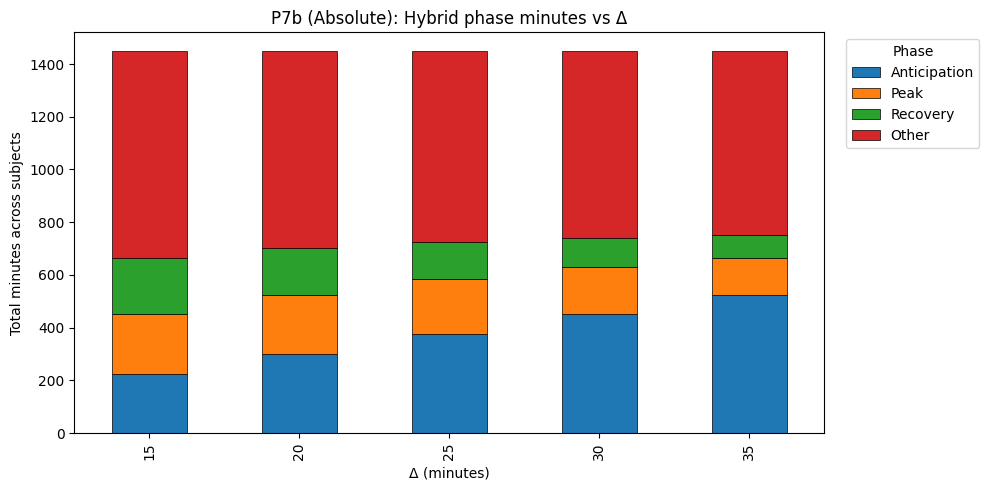

saved: /content/wesad/reports/P7b_hybrid_minutes_vs_delta.png


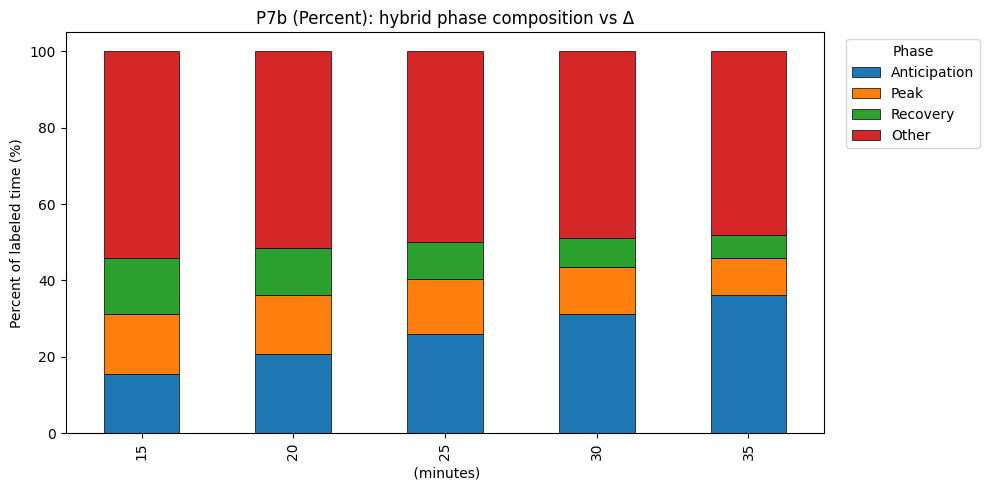

saved: /content/wesad/reports/P7b_hybrid_percent_vs_delta.png


In [34]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

proj = Path("/content/wesad")
reports = proj/"reports"
reports.mkdir(parents=True, exist_ok=True)

csv_path = reports/"hybrid_label_counts_by_delta.csv"
df_pivot = pd.read_csv(csv_path, index_col=0)
df_pivot = df_pivot[["Anticipation","Peak","Recovery","Other"]]


ax = df_pivot.plot(
    kind="bar",
    stacked=True,
    figsize=(10,5),
    linewidth=0.5,
    edgecolor="black"
)
ax.set_xlabel("Δ (minutes)")
ax.set_ylabel("Total minutes across subjects")
ax.set_title("P7b (Absolute): Hybrid phase minutes vs Δ")
ax.legend(title="Phase", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
out_abs = reports/"P7b_hybrid_minutes_vs_delta.png"
plt.savefig(out_abs, dpi=150, bbox_inches="tight")
plt.show()
print("saved:", out_abs)


df_pct = df_pivot.div(df_pivot.sum(axis=1), axis=0) * 100.0

ax = df_pct.plot(
    kind="bar",
    stacked=True,
    figsize=(10,5),
    linewidth=0.5,
    edgecolor="black"
)
ax.set_xlabel(" (minutes)")
ax.set_ylabel("Percent of labeled time (%)")
ax.set_title("P7b (Percent): hybrid phase composition vs Δ")
ax.legend(title="Phase", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
out_pct = reports/"P7b_hybrid_percent_vs_delta.png"
plt.savefig(out_pct, dpi=150, bbox_inches="tight")
plt.show()
print("saved:", out_pct)


S10  (seconds)
Binary:
label_wrist_binary
NonStress    4771
Stress        725
3-class:
label_wrist_3class
Other        3219
Baseline     1180
Stress        725
Amusement     372


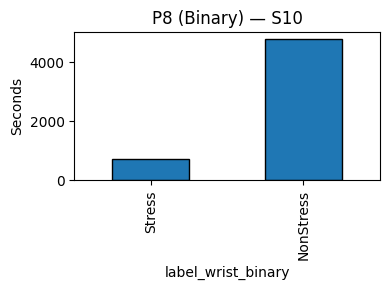

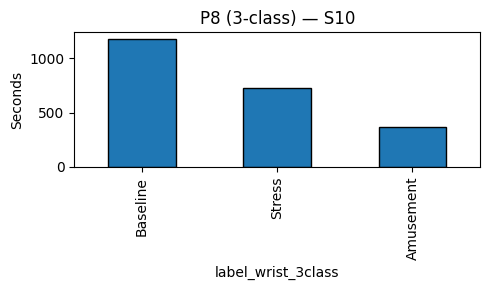


S11  (seconds)
Binary:
label_wrist_binary
NonStress    4553
Stress        680
3-class:
label_wrist_3class
Other        3005
Baseline     1180
Stress        680
Amusement     368


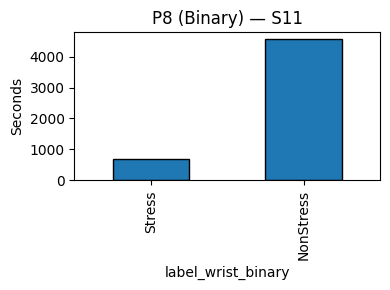

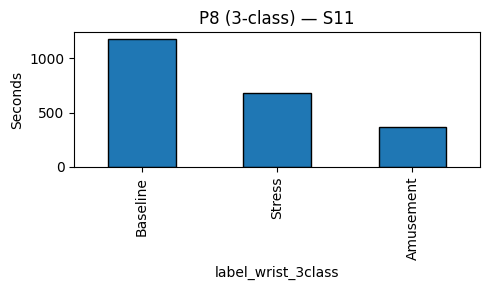


S13  (seconds)
Binary:
label_wrist_binary
NonStress    4873
Stress        664
3-class:
label_wrist_3class
Other        3311
Baseline     1180
Stress        664
Amusement     382


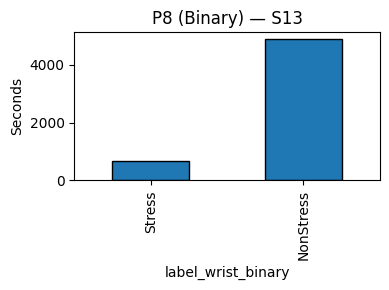

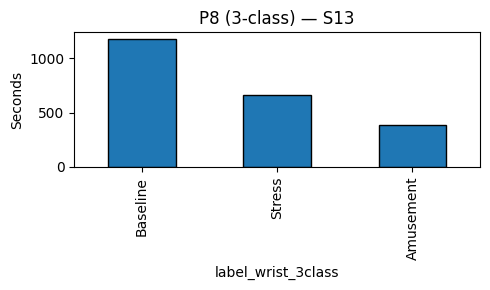


S14  (seconds)
Binary:
label_wrist_binary
NonStress    4873
Stress        675
3-class:
label_wrist_3class
Other        3321
Baseline     1180
Stress        675
Amusement     372


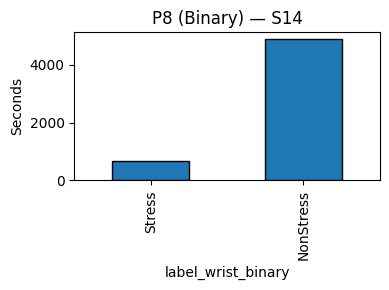

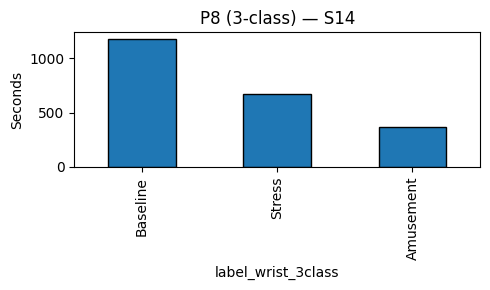


S15  (seconds)
Binary:
label_wrist_binary
NonStress    4566
Stress        686
3-class:
label_wrist_3class
Other        3019
Baseline     1175
Stress        686
Amusement     372


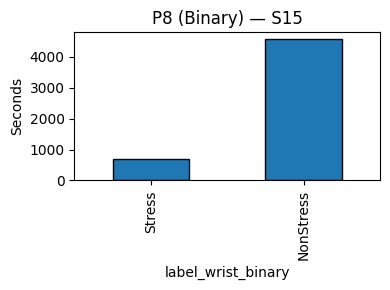

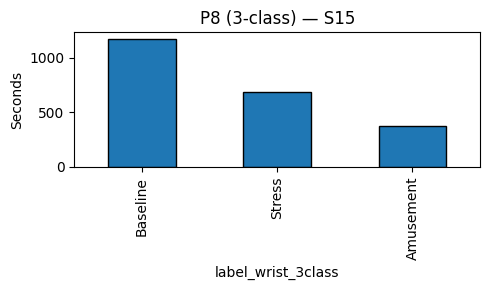


S16  (seconds)
Binary:
label_wrist_binary
NonStress    4958
Stress        673
3-class:
label_wrist_3class
Other        3410
Baseline     1180
Stress        673
Amusement     368


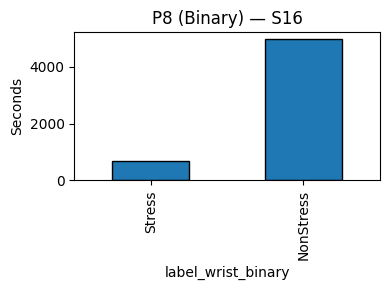

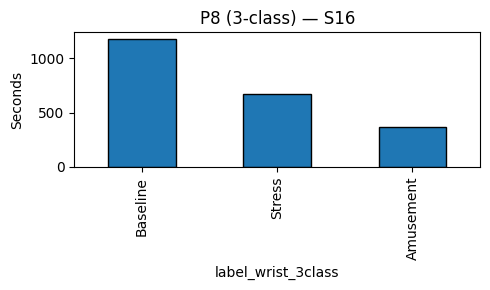


S17  (seconds)
Binary:
label_wrist_binary
NonStress    5197
Stress        723
3-class:
label_wrist_3class
Other        3644
Baseline     1181
Stress        723
Amusement     372


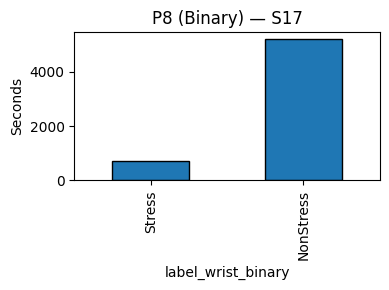

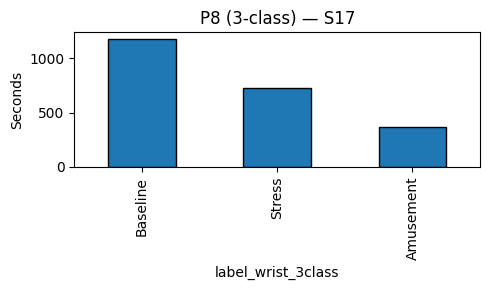


S2  (seconds)
Binary:
label_wrist_binary
NonStress    5464
Stress        615
3-class:
label_wrist_3class
Other        3958
Baseline     1144
Stress        615
Amusement     362


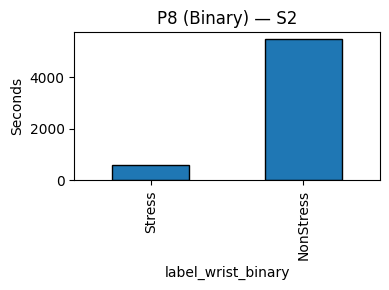

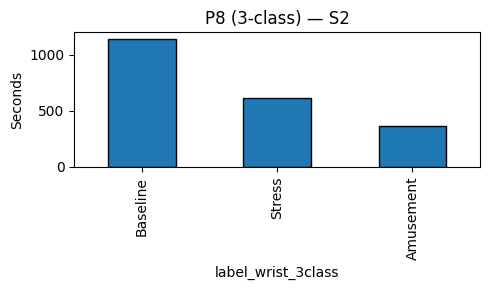


S3  (seconds)
Binary:
label_wrist_binary
NonStress    5853
Stress        640
3-class:
label_wrist_3class
Other        4338
Baseline     1140
Stress        640
Amusement     375


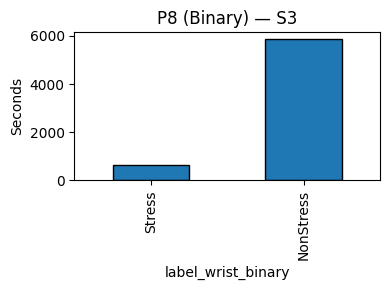

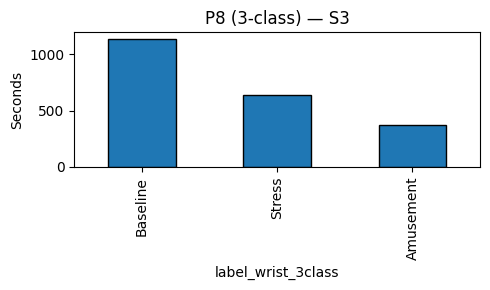


S4  (seconds)
Binary:
label_wrist_binary
NonStress    5788
Stress        635
3-class:
label_wrist_3class
Other        4258
Baseline     1158
Stress        635
Amusement     372


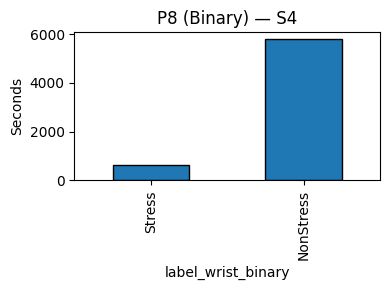

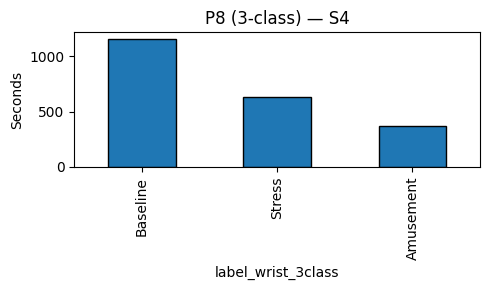


S5  (seconds)
Binary:
label_wrist_binary
NonStress    5613
Stress        645
3-class:
label_wrist_3class
Other        4041
Baseline     1198
Stress        645
Amusement     374


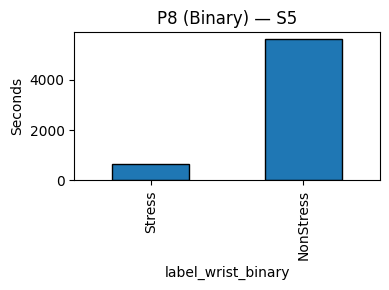

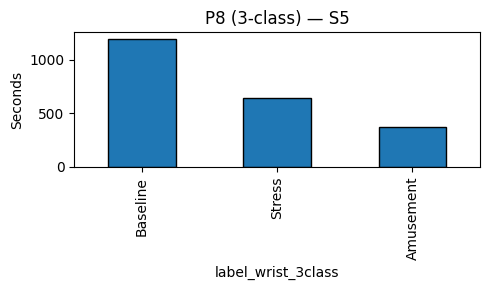


S6  (seconds)
Binary:
label_wrist_binary
NonStress    6421
Stress        650
3-class:
label_wrist_3class
Other        4869
Baseline     1180
Stress        650
Amusement     372


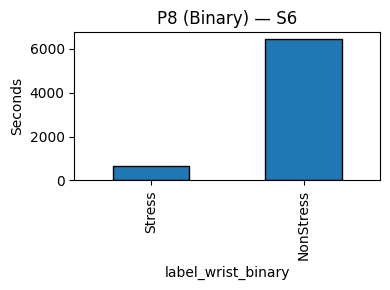

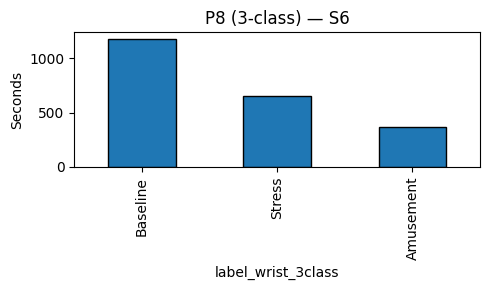


S7  (seconds)
Binary:
label_wrist_binary
NonStress    4598
Stress        640
3-class:
label_wrist_3class
Other        3040
Baseline     1186
Stress        640
Amusement     372


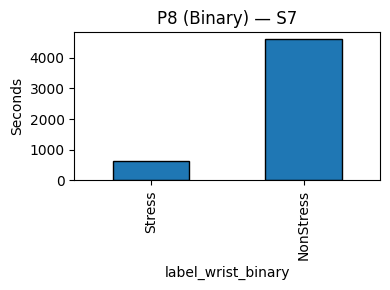

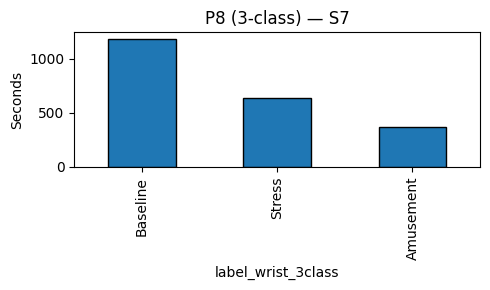


S8  (seconds)
Binary:
label_wrist_binary
NonStress    4796
Stress        670
3-class:
label_wrist_3class
Other        3257
Baseline     1169
Stress        670
Amusement     370


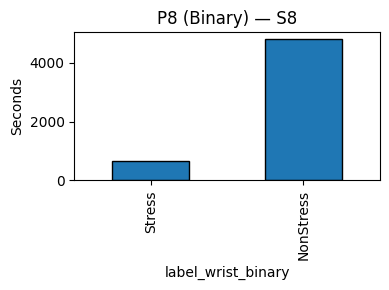

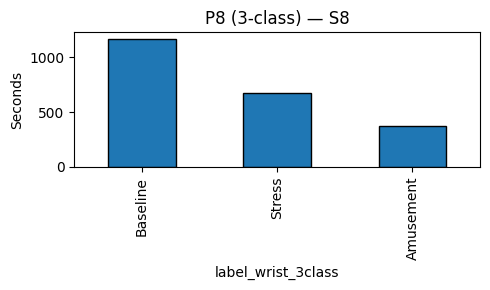


S9  (seconds)
Binary:
label_wrist_binary
NonStress    4578
Stress        645
3-class:
label_wrist_3class
Other        3026
Baseline     1180
Stress        645
Amusement     372


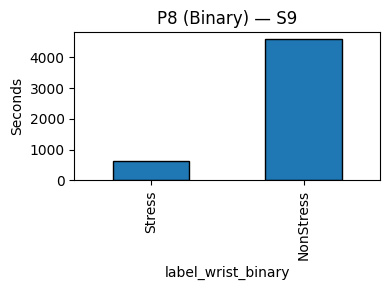

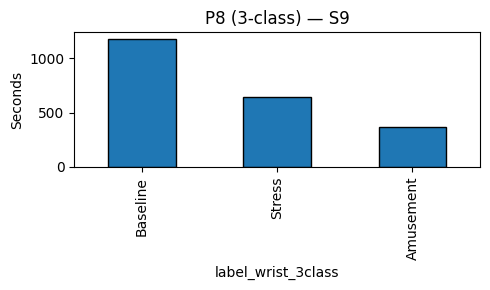


saved per-subject wrist labels to: /content/wesad/interim
saved P8 plots to: /content/wesad/reports


In [35]:
#  Hybrid Labeling — Wrist (NO Lag) ===
# Uses original protocol intervals (no lag) to label each second.
# Outputs per subject: /content/wesad/interim/Sxx_labels_wrist.parquet
# Saves P8 plots: P8_wrist_binary_Sxx.png and P8_wrist_3class_Sxx.png

import json, pickle
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

proj = Path("/content/wesad")
root_dir = Path("/content/WESAD/WESAD")
interim_dir = proj/"interim"
reports_dir = proj/"reports"
interim_dir.mkdir(parents=True, exist_ok=True)
reports_dir.mkdir(parents=True, exist_ok=True)

# Helper: total seconds (prefer chest per-second file if present; else from 700 Hz labels length)
def total_seconds_for_subject(sid: str) -> int:
    sec_path = proj/"features"/"seconds"/f"{sid}_seconds.parquet"
    if sec_path.exists():
        return int(pd.read_parquet(sec_path)["second"].max() + 1)
    with open(root_dir/sid/f"{sid}.pkl","rb") as f:
        data = pickle.load(f, encoding="latin1")
    return int(len(data["label"]) // 700)

# Load Step-3 intervals JSON
def load_intervals(sid: str):
    p = interim_dir/f"{sid}_intervals.json"
    with open(p, "r") as f:
        return json.load(f)["intervals"]

# Mark a [start_sec, end_sec) range into a per-second array
def mark_range(vec, start_s, end_s, name, T):
    s0 = int(np.floor(max(0, start_s)))
    s1 = int(np.floor(min(T, end_s)))
    if s1 > s0:
        vec[s0:s1] = name

# Build wrist labels for one subject (NO lag)
def build_wrist_labels(sid: str) -> Path:
    T = total_seconds_for_subject(sid)
    ivs = load_intervals(sid)

    # Initialize full timeline as "Other"
    lab_3class = np.array(["Other"]*T, dtype=object)

    # Fill Baseline / Stress / Amusement directly from intervals
    for phase in ["Baseline","Stress","Amusement"]:
        for iv in ivs.get(phase, []):
            mark_range(lab_3class, iv["start_sec"], iv["end_sec"], phase, T)

    # Binary: Stress vs NonStress (everything not "Stress" becomes "NonStress")
    lab_binary = np.where(lab_3class == "Stress", "Stress", "NonStress")

    df = pd.DataFrame({
        "subject": sid,
        "second": np.arange(T, dtype=int),
        "label_wrist_binary": lab_binary,
        "label_wrist_3class": lab_3class,   # contains Baseline/Stress/Amusement/Other
    })

    out_pq = interim_dir/f"{sid}_labels_wrist.parquet"
    df.to_parquet(out_pq, index=False)
    return out_pq

# --- Run for all subjects ---
written = []
for sid in sorted(subjects):
    p = build_wrist_labels(sid)
    written.append(p)
    # Checks: class counts
    df = pd.read_parquet(p)
    c_bin = df["label_wrist_binary"].value_counts()
    c_3cl = df["label_wrist_3class"].value_counts()
    print(f"\n{sid}  (seconds)\nBinary:\n{c_bin.to_string()}\n3-class:\n{c_3cl.to_string()}")

    # ---- P8 plots per subject ----
    # Binary plot
    plt.figure(figsize=(4,3))
    c_bin = c_bin.reindex(["Stress","NonStress"]).fillna(0)
    c_bin.plot(kind="bar", edgecolor="black")
    plt.ylabel("Seconds")
    plt.title(f"P8 (Binary) — {sid}")
    plt.tight_layout()
    out_png_bin = reports_dir/f"P8_wrist_binary_{sid}.png"
    plt.savefig(out_png_bin, dpi=150, bbox_inches="tight")
    plt.show()

    # 3-class plot (exclude 'Other' to see the real 3-class balance cleanly)
    plt.figure(figsize=(5,3))
    desired = ["Baseline","Stress","Amusement"]
    c_3 = c_3cl.reindex(desired).fillna(0)
    c_3.plot(kind="bar", edgecolor="black")
    plt.ylabel("Seconds")
    plt.title(f"P8 (3-class) — {sid}")
    plt.tight_layout()
    out_png_3 = reports_dir/f"P8_wrist_3class_{sid}.png"
    plt.savefig(out_png_3, dpi=150, bbox_inches="tight")
    plt.show()

print("\nsaved per-subject wrist labels to:", interim_dir)
print("saved P8 plots to:", reports_dir)


In [36]:
import pandas as pd
import numpy as np
from sklearn.base import BaseEstimator, TransformerMixin

# Custom robust scaler (median/IQR)
class RobustZScaler(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.median_ = np.median(X, axis=0)
        self.iqr_ = np.subtract(*np.percentile(X, [75, 25], axis=0))
        self.iqr_[self.iqr_ == 0] = 1.0  # avoid div-by-zero
        return self

    def transform(self, X):
        return (X - self.median_) / self.iqr_

# Example: training/test split per subject
def fit_scaler_on_train(train_subjects, test_subject, feature_dir):
    # load feature tables for training subjects
    dfs = []
    for sid in train_subjects:
        path = feature_dir / f"{sid}_windows.parquet"
        dfs.append(pd.read_parquet(path))
    df_train = pd.concat(dfs, axis=0)

    # pick only numeric feature columns
    feat_cols = df_train.select_dtypes(include=[np.number]).columns

    # fit robust scaler on training
    scaler = RobustZScaler().fit(df_train[feat_cols].values)

    # transform both train and test sets
    train_scaled = scaler.transform(df_train[feat_cols].values)
    df_train_scaled = df_train.copy()
    df_train_scaled[feat_cols] = train_scaled

    test_path = feature_dir / f"{test_subject}_windows.parquet"
    df_test = pd.read_parquet(test_path)
    test_scaled = scaler.transform(df_test[feat_cols].values)
    df_test_scaled = df_test.copy()
    df_test_scaled[feat_cols] = test_scaled

    return df_train_scaled, df_test_scaled


 CHEST windows saved: /content/wesad/features/windows/chest∆20/S10.npz  |  X(76, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


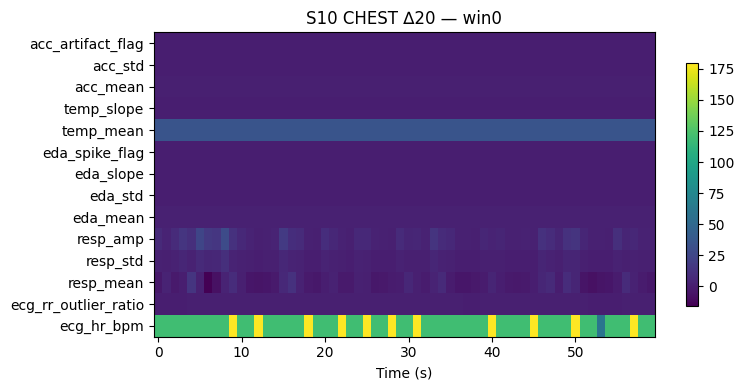

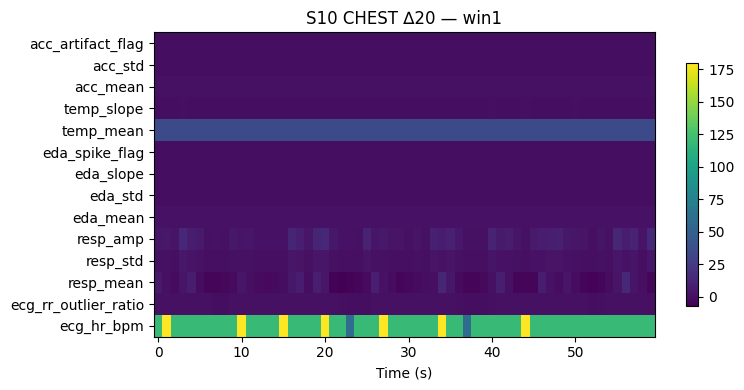

 CHEST windows saved: /content/wesad/features/windows/chest∆20/S11.npz  |  X(110, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


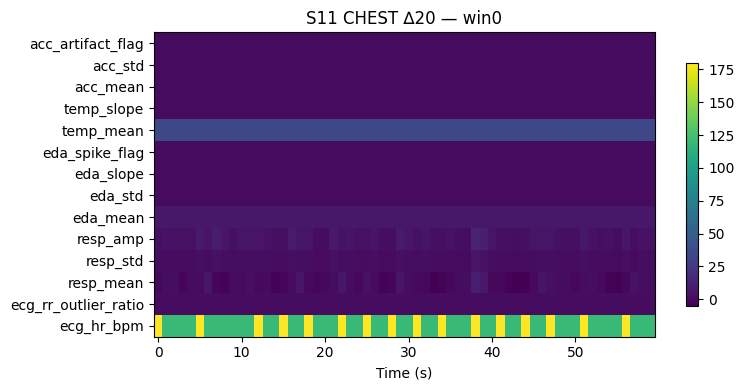

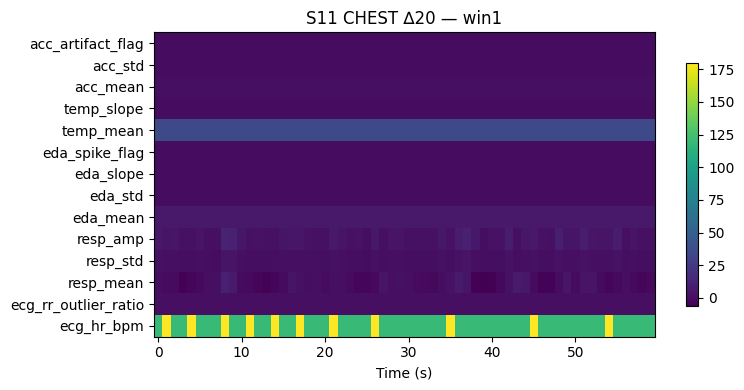

 CHEST windows saved: /content/wesad/features/windows/chest∆20/S13.npz  |  X(75, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


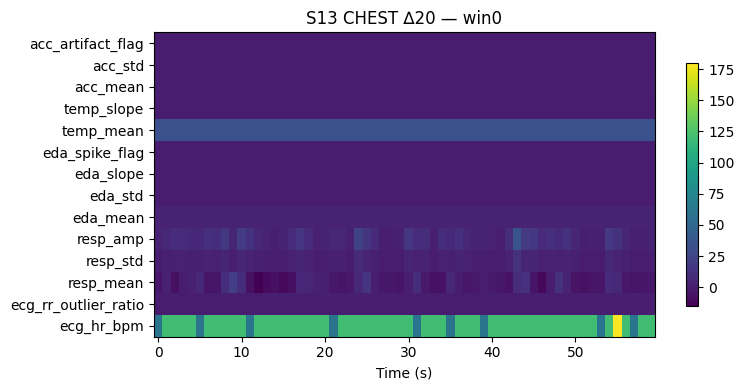

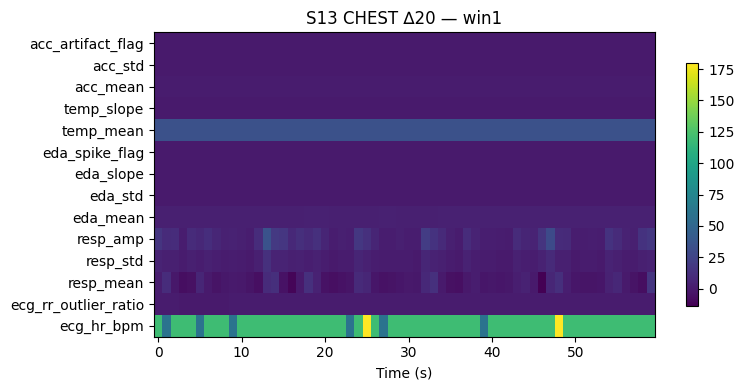

 CHEST windows saved: /content/wesad/features/windows/chest∆20/S14.npz  |  X(110, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


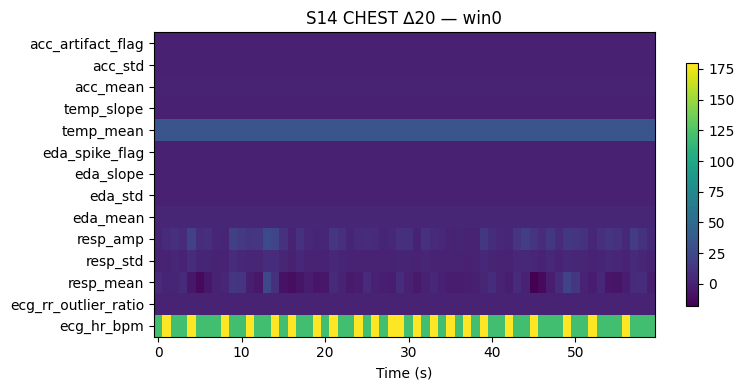

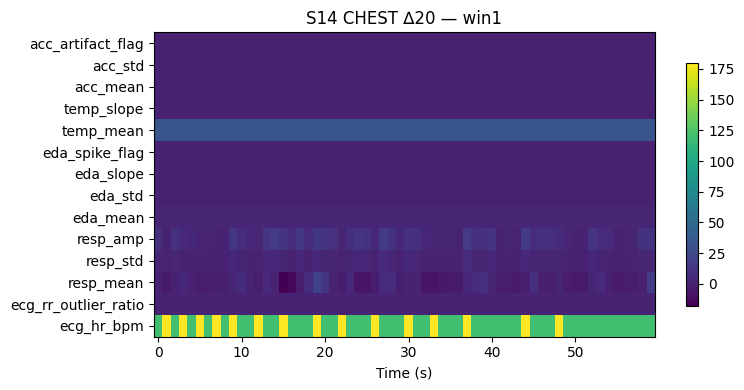

 CHEST windows saved: /content/wesad/features/windows/chest∆20/S15.npz  |  X(71, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


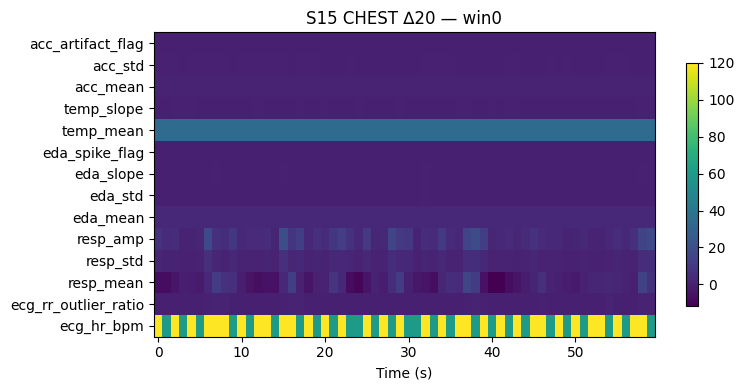

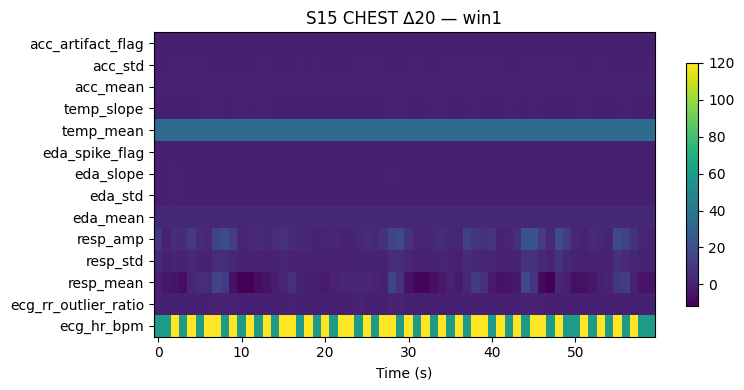

 CHEST windows saved: /content/wesad/features/windows/chest∆20/S16.npz  |  X(110, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


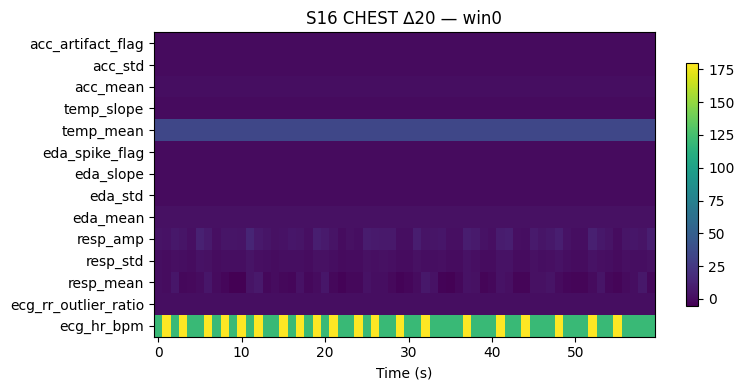

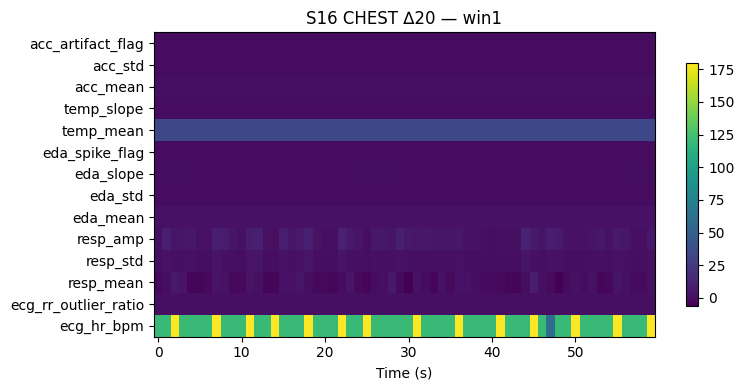

 CHEST windows saved: /content/wesad/features/windows/chest∆20/S17.npz  |  X(79, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


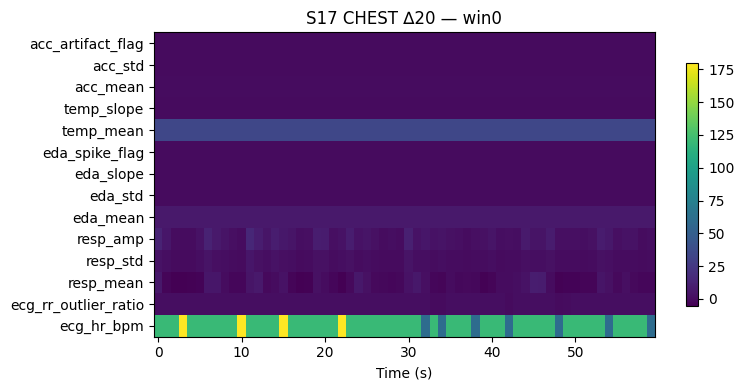

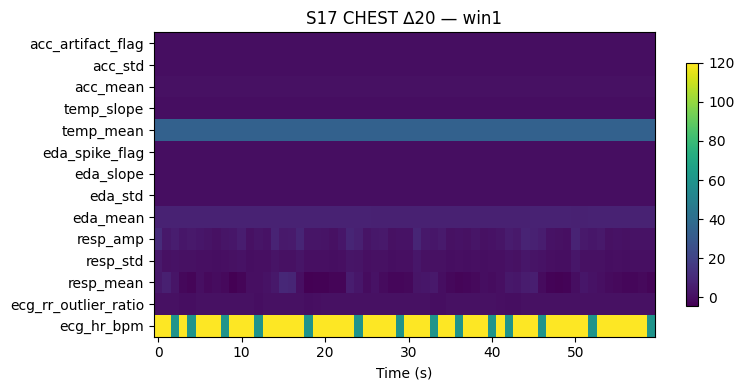

 CHEST windows saved: /content/wesad/features/windows/chest∆20/S2.npz  |  X(110, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


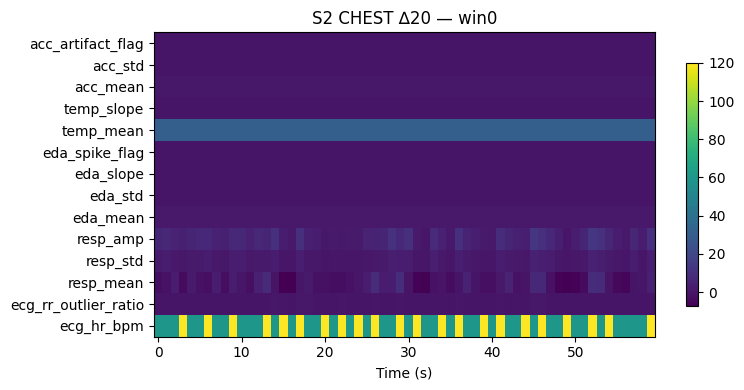

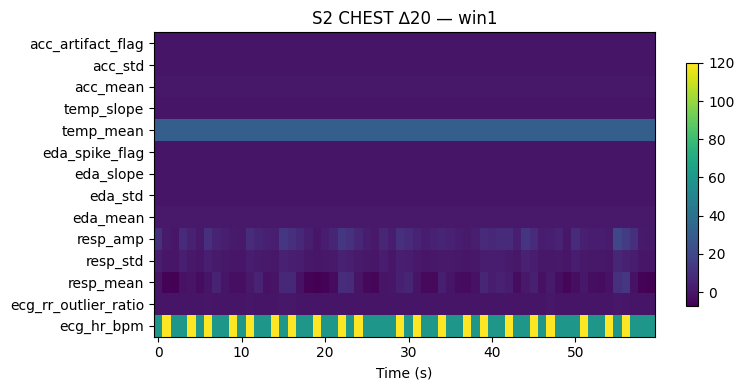

 CHEST windows saved: /content/wesad/features/windows/chest∆20/S3.npz  |  X(110, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


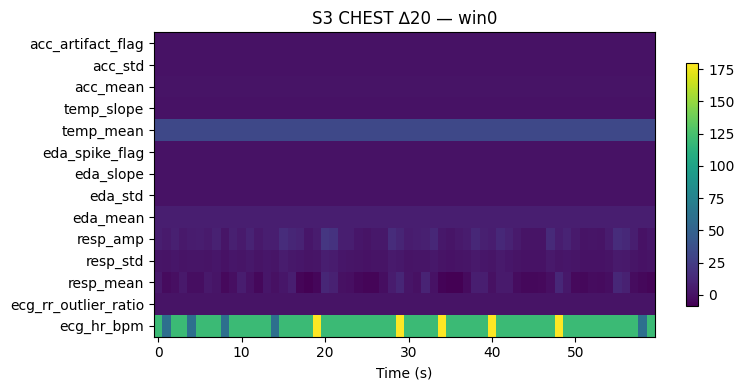

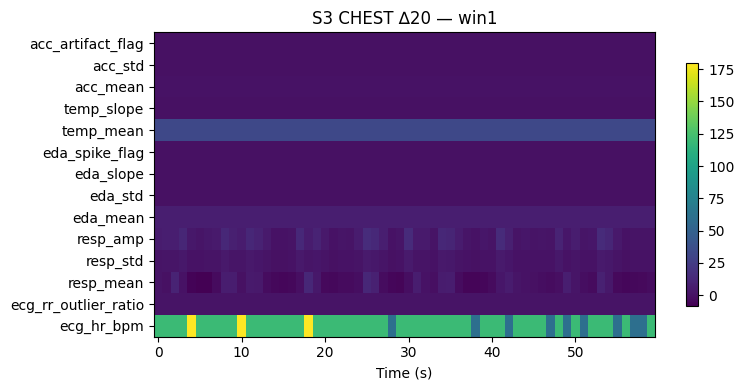

 CHEST windows saved: /content/wesad/features/windows/chest∆20/S4.npz  |  X(93, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


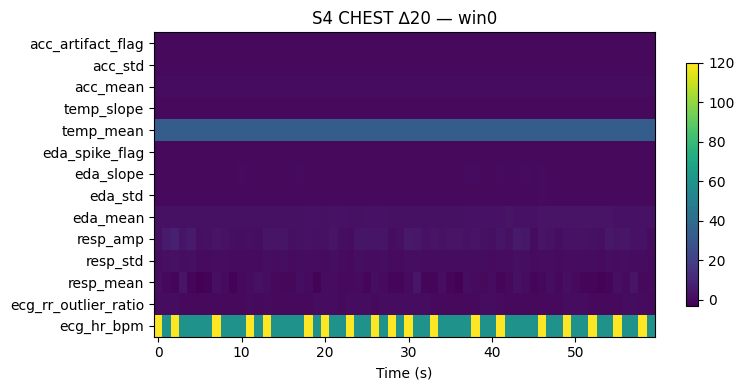

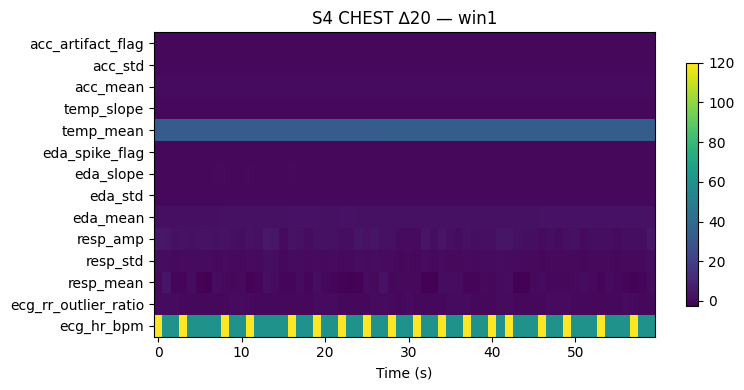

 CHEST windows saved: /content/wesad/features/windows/chest∆20/S5.npz  |  X(87, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


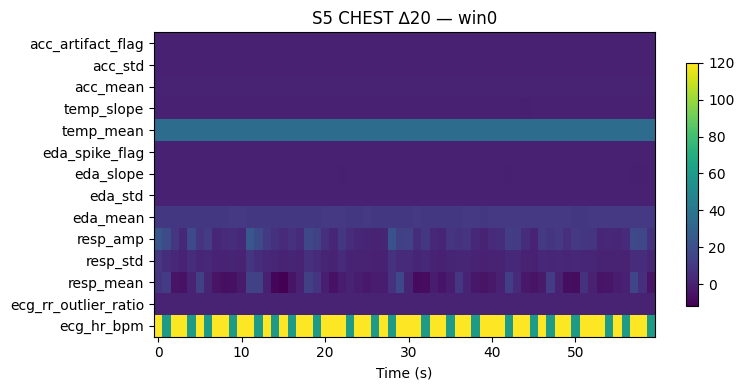

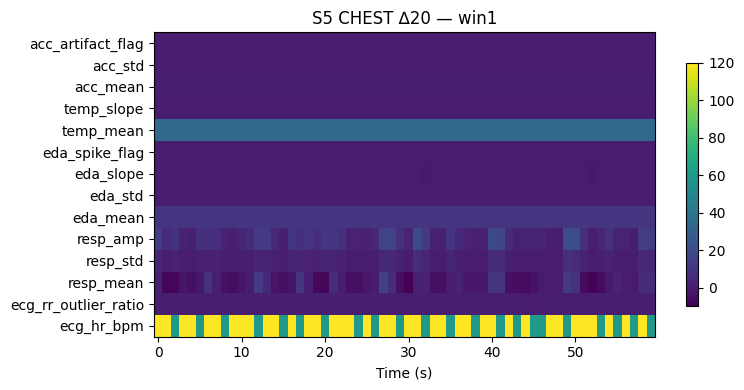

 CHEST windows saved: /content/wesad/features/windows/chest∆20/S6.npz  |  X(110, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


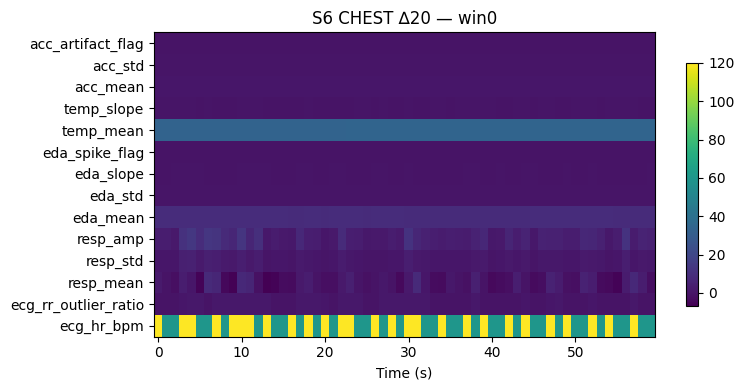

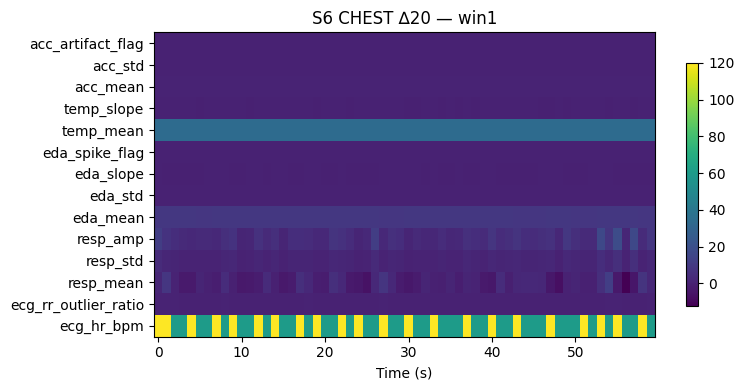

 CHEST windows saved: /content/wesad/features/windows/chest∆20/S7.npz  |  X(70, 60, 14)  classes={'Anticipation': 0, 'Peak': 1}


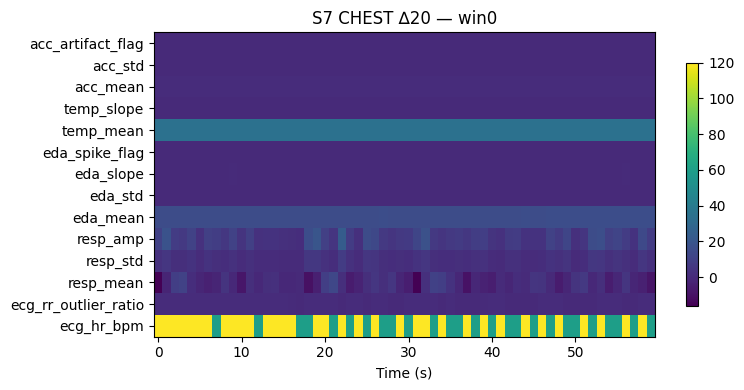

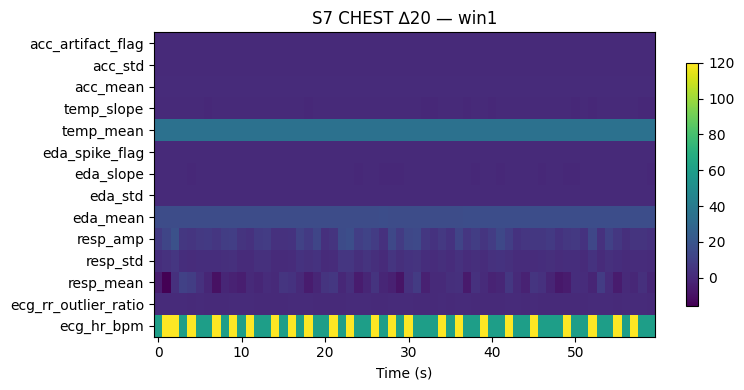

 CHEST windows saved: /content/wesad/features/windows/chest∆20/S8.npz  |  X(72, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


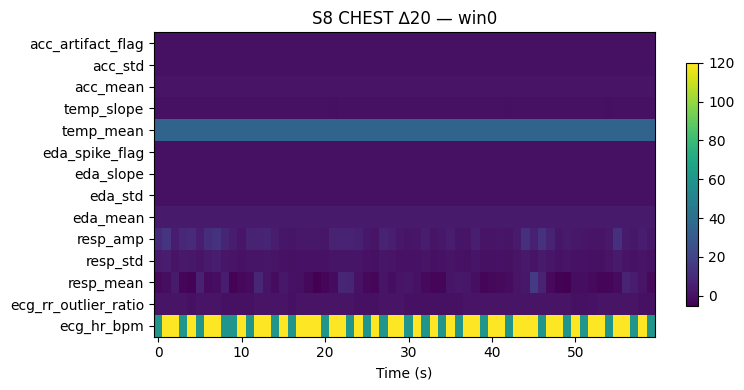

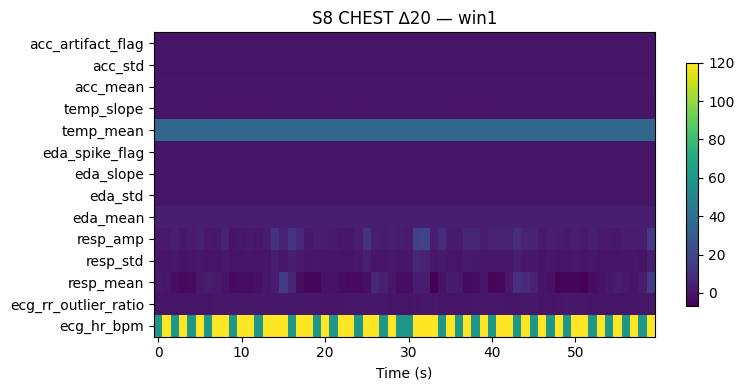

 CHEST windows saved: /content/wesad/features/windows/chest∆20/S9.npz  |  X(110, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


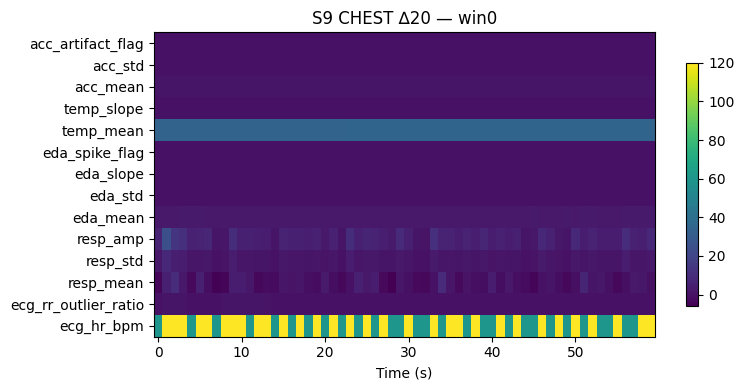

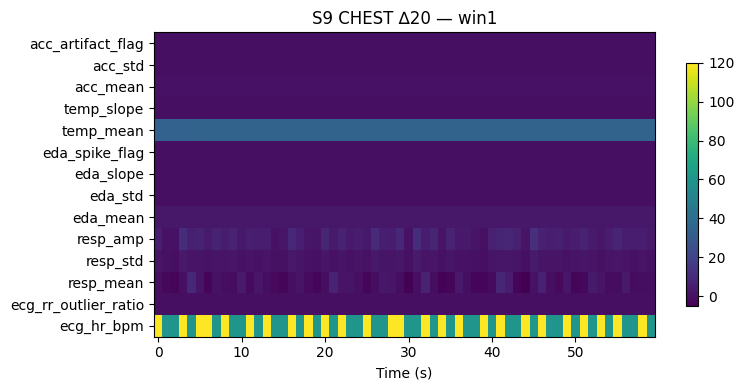

ℹ Wrist per-second features folder not found — skipping wrist windowing for now.
   (When you finish Step 6 for wrist, create files in /content/wesad/features/seconds_wrist/, then re-run this cell.)


In [37]:
#  Windowing (1 Hz → 60 s sequences) ===
# CHEST: per-second features + hybrid-lag labels → 60s windows (stride 30s), majority ≥50%
# Save: features/windows/chest∆{∆}/Sxx.npz
# WRIST: same logic (NO lag labels) if wrist per-second features exist; otherwise skipped
# Plots: P9 heatmap previews saved to /content/wesad/reports/

import numpy as np, pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import json, pickle, os

proj = Path("/content/wesad")
feat_sec_dir = proj/"features"/"seconds"
win_out_base = proj/"features"/"windows"
interim_dir  = proj/"interim"
reports_dir  = proj/"reports"
reports_dir.mkdir(parents=True, exist_ok=True)

#  Config
WIN_SEC = 60
STRIDE_SEC = 30
MAJORITY_THRESH = 0.50
DELTA_GRID = [20]

# These columns won't be used as time-varying features
DROP_COLS = {"subject", "second", "phase"}  # keep artifact flags (binary) as features

# Label maps
CHEST_LABELS = ["Anticipation", "Peak", "Recovery"]
CHEST_MAP = {lab:i for i,lab in enumerate(CHEST_LABELS)}  # Anticipation=0, Peak=1, Recovery=2
WRIST_3C = ["Baseline","Stress","Amusement"]
WRIST_MAP = {lab:i for i,lab in enumerate(WRIST_3C)}      # Baseline=0, Stress=1, Amusement=2

# Helpers
def majority_label(labels_in_window, valid_set, thresh=0.5):
    if len(labels_in_window) == 0:
        return None
    vc = pd.Series(labels_in_window).value_counts(dropna=True)
    top_label = vc.index[0]
    top_frac = vc.iloc[0] / len(labels_in_window)
    if (top_label in valid_set) and (top_frac >= thresh):
        return top_label, float(top_frac)
    return None

def build_windows_from_second_table(df_sec: pd.DataFrame, sec_to_label: np.ndarray,
                                    valid_labels: set, drop_cols=DROP_COLS):
    """df_sec indexed by 'second' 0..T-1, sec_to_label same length with string labels."""
    # align & merge
    T = int(df_sec["second"].max()) + 1
    assert len(sec_to_label) >= T, "label vector shorter than per-second features"
    # numeric features only (keep artifact flags)
    num_cols = [c for c in df_sec.columns if c not in drop_cols and np.issubdtype(df_sec[c].dtype, np.number)]
    df = df_sec[["second"] + num_cols].copy().sort_values("second").reset_index(drop=True)

    X_list, y_list, starts = [], [], []
    s = 0
    last_sec = int(df["second"].max())
    while s + WIN_SEC <= last_sec + 1:
        w = df[(df["second"] >= s) & (df["second"] < s + WIN_SEC)]
        if len(w) == WIN_SEC:  # exactly 60 seconds
            labels_w = sec_to_label[s:s+WIN_SEC]
            maj = majority_label(labels_w, valid_labels, MAJORITY_THRESH)
            if maj is not None:
                top_label, top_frac = maj
                X = w[num_cols].to_numpy(dtype=float)               # [60, F]
                X_list.append(X)
                y_list.append(top_label)
                starts.append(s)
        s += STRIDE_SEC

    if not X_list:
        return None, None, None, num_cols

    X = np.stack(X_list, axis=0)  # [N, 60, F]
    y = np.array(y_list, dtype=object)
    start_sec = np.array(starts, dtype=int)
    return X, y, start_sec, num_cols

def save_npz(path: Path, X, y, feat_names, start_sec):
    path.parent.mkdir(parents=True, exist_ok=True)
    # map y strings to ints along with dict
    unique_labs = sorted(pd.unique(y).tolist())
    lab_map = {lab:i for i, lab in enumerate(unique_labs)}
    y_int = np.array([lab_map[lab] for lab in y], dtype=int)
    np.savez_compressed(path,
                        X=X, y=y_int,
                        labels=np.array(unique_labs, dtype=object),
                        feat_names=np.array(feat_names, dtype=object),
                        start_sec=start_sec)
    return lab_map

def load_chest_labels_with_delta(subject_id: str, delta_min: int) -> np.ndarray:
    pq = interim_dir / f"{subject_id}_labels_chest∆{delta_min}.parquet"
    df = pd.read_parquet(pq)
    return df["label_hybrid"].to_numpy(dtype=object)

def load_wrist_labels(subject_id: str) -> np.ndarray:
    pq = interim_dir / f"{subject_id}_labels_wrist.parquet"
    df = pd.read_parquet(pq)
    return df["label_wrist_3class"].to_numpy(dtype=object)  # 3-class + 'Other'

def heatmap_preview(X_win, feat_names, title, out_png):
    plt.figure(figsize=(8,4))
    plt.imshow(X_win.T, aspect="auto", origin="lower")  # time x features (transpose to features on Y)
    plt.yticks(ticks=np.arange(len(feat_names)), labels=feat_names)
    plt.xlabel("Time (s)")
    plt.title(title)
    plt.colorbar(shrink=0.8)
    plt.tight_layout()
    plt.savefig(out_png, dpi=150, bbox_inches="tight")
    plt.show()

#  CHEST
written_chest = []
for delta in DELTA_GRID:
    out_dir = win_out_base / f"chest{delta}"
    for sid in sorted(os.listdir(proj/"interim")):
        # infer subject IDs from available per-second files to be safe
        # (we already have the 'subjects' list in your session, but keep this robust)
        pass
    # use the known subjects list instead:
    try:
        subjects
        subj_list = sorted(subjects)
    except NameError:
        root_dir = Path("/content/WESAD/WESAD")
        subj_list = sorted([d for d in os.listdir(root_dir) if d.startswith("S")])

    for sid in subj_list:
        sec_path = feat_sec_dir / f"{sid}_seconds.parquet"
        lab_path = interim_dir / f"{sid}_labels_chest∆{delta}.parquet"
        if not sec_path.exists() or not lab_path.exists():
            print(f" SKIP CHEST {sid} ∆={delta}: missing {('seconds' if not sec_path.exists() else 'labels')}")
            continue

        df_sec = pd.read_parquet(sec_path)
        labels = load_chest_labels_with_delta(sid, delta)
        X, y, start_sec, feat_names = build_windows_from_second_table(
            df_sec, labels, valid_labels=set(CHEST_LABELS)
        )
        if X is None:
            print(f"  No valid CHEST windows for {sid} ∆={delta}")
            continue

        out_npz = win_out_base / f"chest∆{delta}" / f"{sid}.npz"
        lab_map = save_npz(out_npz, X, y, feat_names, start_sec)
        written_chest.append(out_npz)
        print(f" CHEST windows saved: {out_npz}  |  X{X.shape}  classes={lab_map}")

        # P9: a couple of previews
        for k in range(min(2, X.shape[0])):
            out_png = reports_dir / f"P9_{sid}_chest{delta}_win{k}.png"
            heatmap_preview(X[k], feat_names, f"{sid} CHEST ∆{delta} — win{k}", out_png)

# ---------------------------------------- WRIST (NO lag) — only if wrist per-second features exist
# Expecting files like features/seconds_wrist/Sxx_wrist_seconds.parquet (if you implement Step 6 for wrist)
feat_sec_wrist_dir = proj/"features"/"seconds_wrist"
written_wrist = []

if feat_sec_wrist_dir.exists():
    for sid in subj_list:
        sec_path = feat_sec_wrist_dir / f"{sid}_wrist_seconds.parquet"
        lab_path = interim_dir / f"{sid}_labels_wrist.parquet"
        if not sec_path.exists() or not lab_path.exists():
            print(f" SKIP WRIST {sid}: missing {('seconds' if not sec_path.exists() else 'labels')}")
            continue

        df_sec_w = pd.read_parquet(sec_path)
        labels_w = load_wrist_labels(sid)
        Xw, yw, start_sec_w, feat_names_w = build_windows_from_second_table(
            df_sec_w, labels_w, valid_labels=set(WRIST_3C)
        )
        if Xw is None:
            print(f" No valid WRIST windows for {sid}")
            continue

        out_npz_w = win_out_base / "wrist" / f"{sid}.npz"
        lab_map_w = save_npz(out_npz_w, Xw, yw, feat_names_w, start_sec_w)
        written_wrist.append(out_npz_w)
        print(f"WRIST windows saved: {out_npz_w}  |  X{Xw.shape}  classes={lab_map_w}")

        # P9 previews
        for k in range(min(2, Xw.shape[0])):
            out_png = reports_dir / f"P9_{sid}_wrist_win{k}.png"
            heatmap_preview(Xw[k], feat_names_w, f"{sid} WRIST — win{k}", out_png)
else:
    print("ℹ Wrist per-second features folder not found — skipping wrist windowing for now.")
    print("   (When you finish Step 6 for wrist, create files in /content/wesad/features/seconds_wrist/, then re-run this cell.)")


In [38]:
#  Build LOSO Splits
# Input: window NPZs from Step 10, e.g. /content/wesad/features/windows/chest∆20/Sxx.npz
# Output: /content/wesad/configs/loso_{DATASET_KEY}.json

import json, os
from pathlib import Path
import numpy as np
from collections import Counter, defaultdict

proj = Path("/content/wesad")
win_base = proj / "features" / "windows"
cfg_dir  = proj / "configs"
cfg_dir.mkdir(parents=True, exist_ok=True)

#  CONFIG
# Choose which dataset to build splits for:
#   - "chest∆20"  (hybrid-lag CHEST with ∆=20)
#   - "chest∆15"  (or any other you created)
#   - "wrist"     (if you built wrist windows later)
DATASET_KEY = "chest∆20"

in_dir = win_base / DATASET_KEY
assert in_dir.exists(), f"Window folder not found: {in_dir}"

#  Discover subjects (by files present)
npz_files = sorted([p for p in in_dir.glob("S*.npz") if p.is_file()])
assert npz_files, f"No NPZ window files found in {in_dir}"
subjects = sorted([p.stem for p in npz_files])

print(f"Found {len(subjects)} subjects in {DATASET_KEY}: {subjects}")

# Helper
def load_counts(npz_path: Path):
    data = np.load(npz_path, allow_pickle=True)
    y = data["y"]
    labels = data["labels"].tolist()  # array of class names in order of IDs
    counts = Counter(y.tolist())
    # map to dict {class_name: count}
    return {labels[k]: int(v) for k, v in counts.items()}, int(y.size)

# Preload counts per subject for sanity (and to store in JSON)
subj_counts = {}
subj_total  = {}
for p in npz_files:
    cdict, n = load_counts(p)
    subj_counts[p.stem] = cdict
    subj_total[p.stem]  = n

#  Build LOSO folds
folds = []
for test_sid in subjects:
    train_sids = [s for s in subjects if s != test_sid]

    # counts summary (optional but handy for quick checks)
    n_train = sum(subj_total[s] for s in train_sids)
    n_test  = subj_total[test_sid]

    # (optional) aggregate per-class counts for train/test
    train_class_counts = defaultdict(int)
    for s in train_sids:
        for cls, cnt in subj_counts[s].items():
            train_class_counts[cls] += cnt
    test_class_counts = subj_counts[test_sid]

    folds.append({
        "test_subject": test_sid,
        "train_subjects": train_sids,
        "n_train_windows": int(n_train),
        "n_test_windows": int(n_test),
        "train_class_counts": dict(train_class_counts),
        "test_class_counts": dict(test_class_counts),
        "dataset_key": DATASET_KEY,
    })

# Sanity checks
# 1) every subject appears exactly once as test
seen_tests = [f["test_subject"] for f in folds]
assert sorted(seen_tests) == sorted(subjects), "Each subject must appear exactly once as test."

# 2) no leakage (train ∩ test = ∅ per fold)
for f in folds:
    assert f["test_subject"] not in f["train_subjects"], f"Leakage: {f['test_subject']} in its own train set."

print("\nLOSO summary:")
for i, f in enumerate(folds, 1):
    print(f" Fold {i:02d}: test={f['test_subject']} | train={len(f['train_subjects'])} subs | "
          f"windows train={f['n_train_windows']} test={f['n_test_windows']}")

# --------- Save JSON ---------
out_json = cfg_dir / f"loso_{DATASET_KEY}.json"
with open(out_json, "w") as fh:
    json.dump({"dataset_key": DATASET_KEY,
               "subjects": subjects,
               "folds": folds}, fh, indent=2)
print("\n Saved LOSO split plan to:", out_json)


Found 15 subjects in chest∆20: ['S10', 'S11', 'S13', 'S14', 'S15', 'S16', 'S17', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9']

LOSO summary:
 Fold 01: test=S10 | train=14 subs | windows train=1317 test=76
 Fold 02: test=S11 | train=14 subs | windows train=1283 test=110
 Fold 03: test=S13 | train=14 subs | windows train=1318 test=75
 Fold 04: test=S14 | train=14 subs | windows train=1283 test=110
 Fold 05: test=S15 | train=14 subs | windows train=1322 test=71
 Fold 06: test=S16 | train=14 subs | windows train=1283 test=110
 Fold 07: test=S17 | train=14 subs | windows train=1314 test=79
 Fold 08: test=S2 | train=14 subs | windows train=1283 test=110
 Fold 09: test=S3 | train=14 subs | windows train=1283 test=110
 Fold 10: test=S4 | train=14 subs | windows train=1300 test=93
 Fold 11: test=S5 | train=14 subs | windows train=1306 test=87
 Fold 12: test=S6 | train=14 subs | windows train=1283 test=110
 Fold 13: test=S7 | train=14 subs | windows train=1323 test=70
 Fold 14: test=S8 | trai

model building

safety wrapper

In [39]:
# --- Safe chest baseline guard (supports .npz subject windows) ---
import os, glob
import numpy as np
from pathlib import Path

def _collect_chest_labels(chest_dir: Path):
    chest_dir = Path(chest_dir)
    ys = []

    # 1) Single-split .npy (if your pipeline writes them)
    for name in ["y_train.npy","y_val.npy","y_test.npy","train_y.npy","val_y.npy","test_y.npy","y.npy"]:
        p = chest_dir / name
        if p.exists():
            try:
                ys.append(np.load(p))
            except Exception:
                pass

    # 2) Per-subject .npz windows (common in your chest pipeline)
    #    e.g., /.../chest∆20/S7.npz
    for p in sorted(chest_dir.glob("S*.npz")):
        try:
            d = np.load(p, allow_pickle=True)
            ys.append(d["y"].astype(int))
        except Exception:
            pass

    # 3) Nested per-subject subfolders with .npz or .npy
    for sdir in sorted(chest_dir.glob("S*")):
        if sdir.is_dir():
            # .npz files with y inside
            for p in sorted(sdir.glob("*.npz")):
                try:
                    d = np.load(p, allow_pickle=True)
                    ys.append(d["y"].astype(int))
                except Exception:
                    pass
            # any y*.npy fallbacks
            for p in sorted(sdir.glob("y*.npy")) + sorted(sdir.glob("*label*.npy")):
                try:
                    ys.append(np.load(p))
                except Exception:
                    pass

    if not ys:
        print(f"[chest] No label files found under {chest_dir}. Will skip to avoid crashes.")
        return None

    y_all = np.concatenate([y.ravel() for y in ys]) if ys else None
    # quick diagnostic
    if y_all is not None:
        uniq, cnt = np.unique(y_all, return_counts=True)
        print(f"[chest] Found {len(ys)} label arrays. Class histogram:", dict(zip(uniq.tolist(), cnt.tolist())))
    return y_all

def run_chest_baselines_safely(CHEST_TRACK, chest_dir, chest_cfg, **kwargs):
    chest_dir = Path(chest_dir)
    y_all = _collect_chest_labels(chest_dir)
    if y_all is None:
        print(f"[chest] Skipping {CHEST_TRACK}: no labels discovered.")
        return None
    uniq = np.unique(y_all)
    if uniq.size < 2:
        print(f"[chest] Skipping {CHEST_TRACK}: labels have only one class {uniq}.")
        print("        (Common when mapping/patching collapsed all windows to one class.)")
        return None

    # Safe to run your existing baseline
    return run_baseline_for_track(CHEST_TRACK, chest_dir, chest_cfg, **kwargs)

complete LOSO (leave-one-subject-out) baseline pipeline for the WESAD chest track, built to train/evaluate two simple models (Logistic Regression and Random Forest) on windowed features, save confusion matrices, and optionally make a SHAP importance plot.

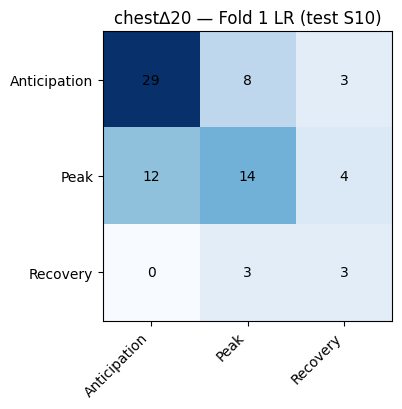

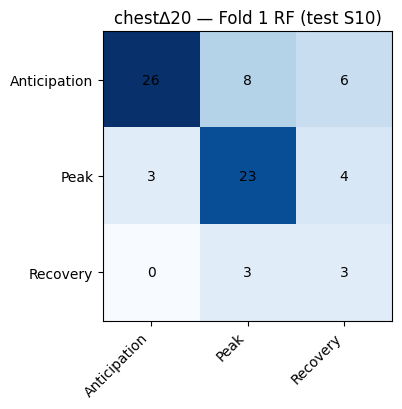

SHAP failed: only integer scalar arrays can be converted to a scalar index


<Figure size 600x500 with 0 Axes>

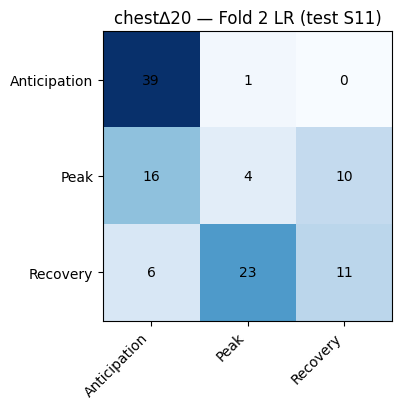

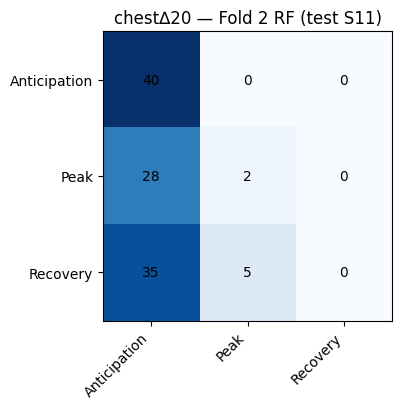

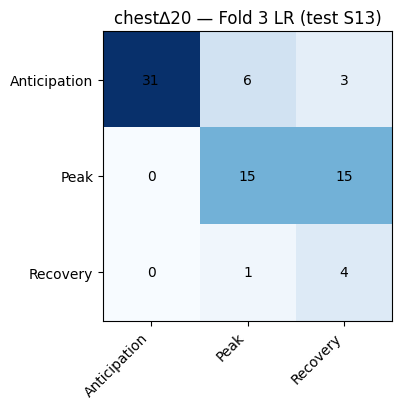

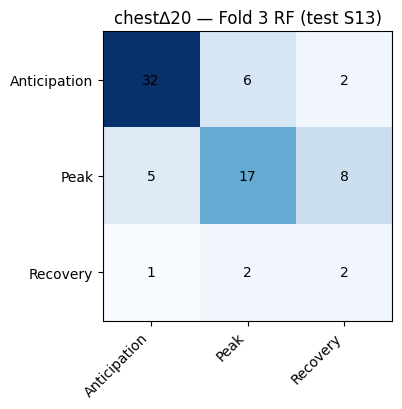

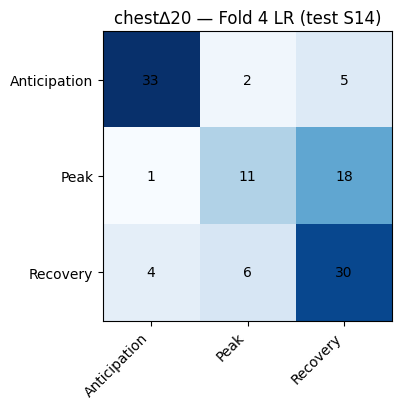

...

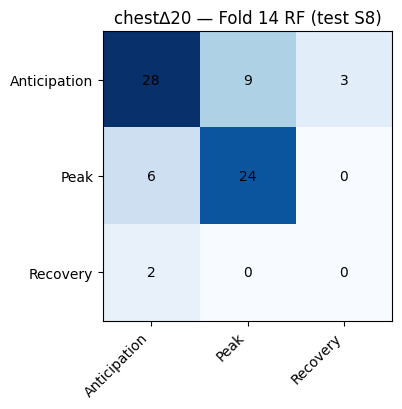

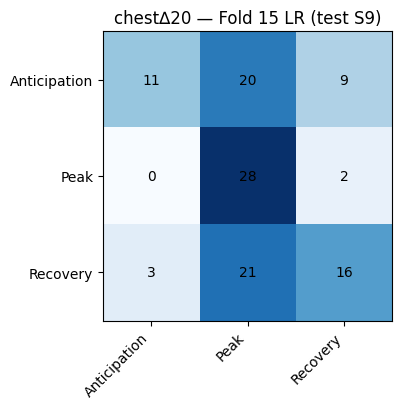

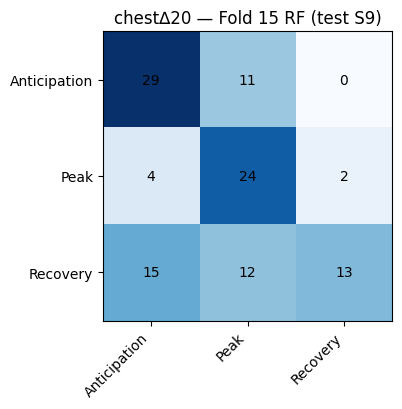

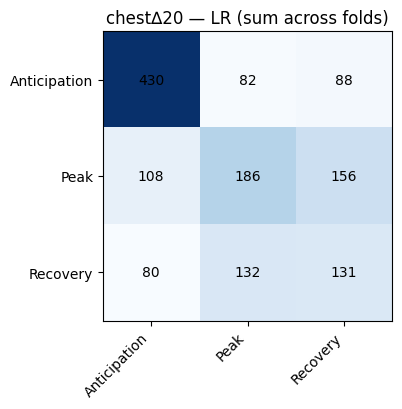

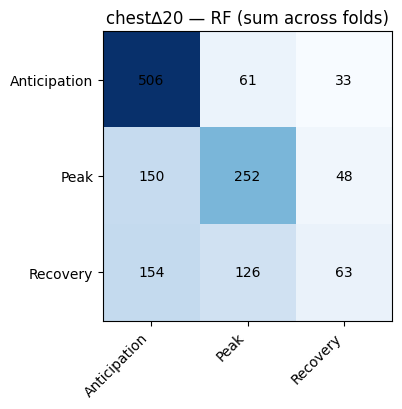


Saved metrics for chest∆20 to: /content/wesad/eval/chest∆20/baseline_metrics.csv
            acc  f1_macro
model                    
LR     0.538469  0.480556
RF     0.602959  0.508160


In [47]:
import os, json, numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path
from collections import Counter
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (accuracy_score, f1_score, confusion_matrix,
                             classification_report)

# Optional SHAP (for P12)
try:
    import shap
except Exception:
    import importlib
    try:
        import shap
    except Exception:
        shap = None

proj = Path("/content/wesad")
eval_dir = proj/"eval"
reports_dir = proj/"reports"
eval_dir.mkdir(parents=True, exist_ok=True)
reports_dir.mkdir(parents=True, exist_ok=True)

#Robust scaler (median/IQR), leak-safe each fold
class RobustZScaler(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.median_ = np.median(X, axis=0)
        q75 = np.percentile(X, 75, axis=0)
        q25 = np.percentile(X, 25, axis=0)
        self.iqr_ = q75 - q25
        self.iqr_[self.iqr_ == 0] = 1.0
        return self
    def transform(self, X):
        return (X - self.median_) / self.iqr_

# ---------- Helpers ----------
def agg_flat_stats(X3):
    """(N, T=60, F) -> (N, 5F) concat of mean,std,min,max,delta(last-first)."""
    mean = X3.mean(axis=1)                          # (N, F)
    std  = X3.std(axis=1, ddof=1)                   # (N, F)
    mn   = X3.min(axis=1)                           # (N, F)
    mx   = X3.max(axis=1)                           # (N, F)
    delta= X3[:, -1, :] - X3[:, 0, :]               # (N, F)
    return np.concatenate([mean, std, mn, mx, delta], axis=1)

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    subjects = [p.stem for p in files]
    return subjects, files

def load_npz(win_dir: Path, sid: str):
    data = np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    return data["X"], data["y"], data["labels"].tolist(), data["feat_names"].tolist()

def build_loso(subjects):
    folds = []
    for test_sid in subjects:
        folds.append({"test_subject": test_sid,
                      "train_subjects": [s for s in subjects if s != test_sid]})
    return folds

def maybe_load_loso_json(cfg_path: Path, subjects_from_dir):
    if cfg_path.exists():
        with open(cfg_path, "r") as fh:
            plan = json.load(fh)
        subs = plan.get("subjects", subjects_from_dir)
        folds = plan.get("folds", build_loso(subs))
        return subs, folds
    else:
        return subjects_from_dir, build_loso(subjects_from_dir)

def save_confusion(cm, labels, title, out_png):
    plt.figure(figsize=(4.8,4.2))
    plt.imshow(cm, cmap="Blues")
    plt.title(title)
    plt.xticks(range(len(labels)), labels, rotation=45, ha="right")
    plt.yticks(range(len(labels)), labels)
    for r in range(cm.shape[0]):
        for c in range(cm.shape[1]):
            plt.text(c, r, int(cm[r,c]), ha="center", va="center")
    plt.tight_layout()
    plt.savefig(out_png, dpi=150, bbox_inches="tight"); plt.show()

def shap_global_bar_rf(rf: RandomForestClassifier, feature_names, X_back, out_png, topk=20):
    if shap is None:
        print(" SHAP not installed; skipping P12.")
        return
    try:
        explainer = shap.TreeExplainer(rf)
        n_bg = min(2000, X_back.shape[0])
        idx = np.random.choice(X_back.shape[0], size=n_bg, replace=False)
        shap_vals = explainer.shap_values(X_back[idx])
        if isinstance(shap_vals, list):
            sv = np.mean([np.abs(sv_) for sv_ in shap_vals], axis=0)  # (n_bg, F)
        else:
            sv = np.abs(shap_vals)  # (n_bg, F)
        imp = sv.mean(axis=0)
        order = np.argsort(imp)[::-1][:topk]
        plt.figure(figsize=(6, max(3, topk*0.25)))
        plt.barh([feature_names[i] for i in order][::-1], imp[order][::-1])
        plt.xlabel("Mean |SHAP|")
        plt.title("P12: RF SHAP global importance")
        plt.tight_layout(); plt.savefig(out_png, dpi=150, bbox_inches="tight"); plt.show()
    except Exception as e:
        print("SHAP failed:", e)

# Main runner for a given TRACK
def run_baseline_for_track(track_key: str,
                           win_dir: Path,
                           cfg_json: Path = None):
    """
    CHEST multiclass baseline
    """
    if not win_dir.exists():
        print(f"Track folder not found: {win_dir} (skip)")
        return None

    subjects, _ = load_npz_folder(win_dir)
    if cfg_json is None:
        cfg_json = proj/"configs"/f"loso_{track_key}.json"
    subjects, folds = maybe_load_loso_json(cfg_json, subjects)

    # Load one file to get labels and feature names
    X_tmp, y_tmp, class_names, feat_names = load_npz(win_dir, subjects[0])

    # storage
    rows = []
    cm_sum_LR = np.zeros((len(class_names), len(class_names)), dtype=int)
    cm_sum_RF = np.zeros_like(cm_sum_LR)

    # LOSO loop
    for i, fold in enumerate(folds, 1):
        test_sid = fold["test_subject"]
        train_sids = fold["train_subjects"]

        # Stack train
        Xtr_list, ytr_list = [], []
        for sid in train_sids:
            X, y, _, _ = load_npz(win_dir, sid)
            Xtr_list.append(agg_flat_stats(X))
            ytr_list.append(y)
        Xtr = np.vstack(Xtr_list); ytr = np.concatenate(ytr_list)

        # Test
        Xte3, yte, _, _ = load_npz(win_dir, test_sid)
        Xte = agg_flat_stats(Xte3)

        # Robust scaling (fit on train only)
        scaler = RobustZScaler().fit(Xtr)
        Xtr_s = scaler.transform(Xtr)
        Xte_s = scaler.transform(Xte)

        # ----- Models
        LR = LogisticRegression(max_iter=2000, class_weight="balanced")
        RF = RandomForestClassifier(
            n_estimators=400, class_weight="balanced_subsample",
            random_state=42, n_jobs=-1
        )

        # Fit
        LR.fit(Xtr_s, ytr)
        RF.fit(Xtr_s, ytr)

        # Predict
        yhat_LR = LR.predict(Xte_s)
        yhat_RF = RF.predict(Xte_s)

        # Metrics (multiclass)
        acc_LR = accuracy_score(yte, yhat_LR)
        acc_RF = accuracy_score(yte, yhat_RF)
        f1m_LR = f1_score(yte, yhat_LR, average="macro")
        f1m_RF = f1_score(yte, yhat_RF, average="macro")

        # Confusion matrices (P10)
        cm_LR = confusion_matrix(yte, yhat_LR, labels=range(len(class_names)))
        cm_RF = confusion_matrix(yte, yhat_RF, labels=range(len(class_names)))
        cm_sum_LR += cm_LR
        cm_sum_RF += cm_RF
        save_confusion(cm_LR, class_names, f"{track_key} — Fold {i} LR (test {test_sid})",
                       reports_dir/f"P10_CM_{track_key}_LR_fold{i:02d}_{test_sid}.png")
        save_confusion(cm_RF, class_names, f"{track_key} — Fold {i} RF (test {test_sid})",
                       reports_dir/f"P10_CM_{track_key}_RF_fold{i:02d}_{test_sid}.png")

        # Store
        rows += [
            {"track": track_key, "fold": i, "test_subject": test_sid,
             "model": "LR", "acc": acc_LR, "f1_macro": f1m_LR},
            {"track": track_key, "fold": i, "test_subject": test_sid,
             "model": "RF", "acc": acc_RF, "f1_macro": f1m_RF},
        ]

        # SHAP (P12) once per track to save time — use first fold's train
        if i == 1:
            shap_png = reports_dir/f"P12_SHAP_{track_key}_RF.png"
            shap_global_bar_rf(
                RF,
                [f"μ_{n}" for n in feat_names] + [f"σ_{n}" for n in feat_names] +
                [f"min_{n}" for n in feat_names] + [f"max_{n}" for n in feat_names] +
                [f"Δ_{n}" for n in feat_names],
                Xtr_s, shap_png, topk=20
            )

    # Save averaged confusion matrices
    save_confusion(cm_sum_LR, class_names, f"{track_key} — LR (sum across folds)",
                   reports_dir/f"P10_CM_{track_key}_LR_SUM.png")
    save_confusion(cm_sum_RF, class_names, f"{track_key} — RF (sum across folds)",
                   reports_dir/f"P10_CM_{track_key}_RF_SUM.png")

    # Metrics CSV
    df_metrics = pd.DataFrame(rows)
    out_csv = eval_dir/track_key/"baseline_metrics.csv"
    out_csv.parent.mkdir(parents=True, exist_ok=True)
    df_metrics.to_csv(out_csv, index=False)
    print(f"\nSaved metrics for {track_key} to:", out_csv)
    print(df_metrics.groupby("model")[["acc","f1_macro"]].mean())

    return df_metrics

# -------- Run CHEST (multiclass) --------
CHEST_TRACK = "chest∆20"     # change if your chest windows folder differs
chest_dir = proj/"features"/"windows"/CHEST_TRACK
chest_cfg = proj/"configs"/f"loso_{CHEST_TRACK}.json"  # created in Step 11
df_chest = run_baseline_for_track(CHEST_TRACK, chest_dir, chest_cfg)



BILSTM BASELINE

BiLSTM baseline (CHEST ONLY, NPZ per subject, LOSO) + cuDNN-safe attributions
 Expects: /content/wesad/features/windows/chest∆20/Sxx.npz  with arrays: X (N,T,F), y (N,), labels, feat_names
 Saves:
 /content/wesad/eval/chest∆20/fold_##/P13_training_loss.png
 /content/wesad/eval/chest∆20/fold_##/P13_training_f1.png
  /content/wesad/eval/chest∆20/fold_##/P14_attr_heatmaps/*.png
  /content/wesad/eval/chest∆20/bilstm_loso_summary.csv (+ per-fold F1 bar)
  /content/wesad/models/chest∆20/fold_##/bilstm.pt

In [48]:
import os, json, random, csv, glob
from dataclasses import dataclass
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
from sklearn.utils.class_weight import compute_class_weight

# Captum (Integrated Gradients) for attributions
try:
    from captum.attr import IntegratedGradients
    HAVE_CAPTUM = True
except Exception:
    HAVE_CAPTUM = False

In [49]:
# Configuration

@dataclass
class Config:
    proj_root: Path = Path("/content/wesad")
    chest_track: str = "chest∆20"   # change if your chest folder name differs
    seed: int = 42

    # training
    batch_size: int = 64
    lr: float = 1e-3
    weight_decay: float = 1e-4
    max_epochs: int = 80
    patience: int = 10
    num_workers: int = 2

    # model
    hidden_size: int = 128
    num_layers: int = 2
    dropout: float = 0.3
    bidirectional: bool = True

cfg = Config()

def set_seed(seed=42):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(cfg.seed)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cuda


In [50]:
# IO helpers (NPZ per-subject like S2.npz, S3.npz...)

feat_dir = cfg.proj_root / "features" / "windows" / cfg.chest_track
eval_root = cfg.proj_root / "eval" / cfg.chest_track
model_root = cfg.proj_root / "models" / cfg.chest_track
for d in [eval_root, model_root]:
    d.mkdir(parents=True, exist_ok=True)

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    subjects = [p.stem for p in files]  # ['S2','S3',...]
    return subjects

def load_npz(win_dir: Path, sid: str):
    data = np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X = data["X"]         # (N,T,F)
    y = data["y"]         # (N,)
    labels = data["labels"].tolist()
    feat_names = data["feat_names"].tolist()
    return X, y.astype(int), labels, feat_names

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = cfg.proj_root / "configs" / f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path, "r") as fh:
            plan = json.load(fh)
        subjects = plan.get("subjects", subs)
        folds = plan.get("folds", [{"test_subject": s, "train_subjects": [t for t in subjects if t!=s]} for s in subjects])
        # Allow optional "val_subjects" in file; if missing we’ll derive below
        return subjects, folds, cfg_path
    # else: auto-build LOSO and choose a single validation subject per fold from the train set
    folds = []
    for s in subs:
        train = [t for t in subs if t != s]
        val = [train[0]] if train else []
        train2 = [t for t in train if t not in val]
        folds.append({"test_subject": s, "train_subjects": train2, "val_subjects": val})
    os.makedirs(cfg_path.parent, exist_ok=True)
    with open(cfg_path, "w") as fh:
        json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path


In [51]:
# Dataset & Model

class SeqDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.from_numpy(X).float()
        self.y = torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self, i): return self.X[i], self.y[i]

class BiLSTMClassifier(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_classes, bidirectional=True, dropout=0.3):
        super().__init__()
        self.bidirectional = bidirectional
        self.lstm = nn.LSTM(
            input_size=input_size, hidden_size=hidden_size, num_layers=num_layers,
            batch_first=True, bidirectional=bidirectional,
            dropout=dropout if num_layers > 1 else 0.0
        )
        out_dim = hidden_size * (2 if bidirectional else 1)
        self.drop = nn.Dropout(dropout)
        self.head = nn.Linear(out_dim, num_classes)
    def forward(self, x):  # x: [B,T,F]
        out, (hn, cn) = self.lstm(x)
        last = torch.cat((hn[-2], hn[-1]), dim=1) if self.bidirectional else hn[-1]
        return self.head(self.drop(last))


In [52]:
# Training utils

def fit_scaler_on_train(Xtr):  # Xtr: (N,T,F)
    sc = StandardScaler(with_mean=True, with_std=True)
    sc.fit(Xtr.reshape(-1, Xtr.shape[-1]))
    return sc

def apply_scaler(sc, X):
    N,T,F = X.shape
    return sc.transform(X.reshape(-1, F)).reshape(N,T,F)

def run_epoch(model, loader, criterion, optimizer=None):
    train = optimizer is not None
    model.train() if train else model.eval()
    total = 0.0; ys=[]; ps=[]
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        if train: optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits = model(xb)
            loss = criterion(logits, yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
                optimizer.step()
        total += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return total/len(loader.dataset), f1_score(ys, ps, average="macro")

def save_p13_plots(history, p_loss, p_f1, title=""):
    ep, trL, trF, vaL, vaF = zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep, trL, label="Train Loss"); plt.plot(ep, vaL, label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} P13: Train/Val Loss")
    plt.legend(); plt.tight_layout(); plt.savefig(p_loss, dpi=200); plt.close()

    plt.figure(figsize=(7,5)); plt.plot(ep, trF, label="Train Macro-F1"); plt.plot(ep, vaF, label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} P13: Train/Val Macro-F1")
    plt.legend(); plt.tight_layout(); plt.savefig(p_f1, dpi=200); plt.close()

In [53]:
# cuDNN-safe attribution (fixes "cudnn RNN backward can only be called in training mode")

def attribution_map(model, x1):  # x1: [1,T,F] torch.float32
    """
    Tries eval-mode with cuDNN disabled (keeps dropout off). If that still errors,
    falls back to train-mode just for the backward pass, then restores the original mode.
    Uses predicted class as target for IG / Grad*Input.
    """
    was_training = model.training
    # ensure tensor on device with grad
    x1 = x1.to(device)
    x1.requires_grad_(True)

    def _target_pred():
        with torch.no_grad():
            logits = model(x1)
            return int(torch.argmax(logits, dim=1).item())

    def _compute_attr(target_idx):
        if HAVE_CAPTUM:
            ig = IntegratedGradients(model)
            A = ig.attribute(x1, baselines=torch.zeros_like(x1), target=target_idx)
            return A.detach().cpu().numpy()[0]
        else:
            logits = model(x1)
            tgt = torch.tensor([target_idx], device=logits.device)
            loss = nn.CrossEntropyLoss()(logits, tgt)
            model.zero_grad(set_to_none=True)
            loss.backward()
            return (x1.grad * x1).detach().cpu().numpy()[0]

    try:
        # Try eval-mode with cuDNN disabled
        with torch.backends.cudnn.flags(enabled=False):
            model.train(False)  # eval
            target_idx = _target_pred()
            A = _compute_attr(target_idx)
    except RuntimeError as e:
        print("[attr] Falling back to train-mode attribution due to:", str(e))
        # Train mode (some cuDNN RNNs need this for backward)
        model.train(True)
        target_idx = _target_pred()
        A = _compute_attr(target_idx)
    finally:
        # Restore original mode
        model.train(was_training)

    return np.abs(A)

def save_attr_heatmap(A, title, path_png):
    plt.figure(figsize=(8,4.5))
    plt.imshow(A.T, aspect="auto", origin="lower")
    plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature")
    plt.title(title); plt.tight_layout(); plt.savefig(path_png, dpi=220); plt.close()


In [54]:
# LOSO run

def train_loso_bilstm():
    subjects = load_npz_folder(feat_dir)
    # For feature names + classes
    X0, y0, class_names, feat_names = load_npz(feat_dir, subjects[0])
    num_classes = len(set(y0.tolist()))
    print(f"[data] Found {len(subjects)} subjects; example X shape={X0.shape}, classes={num_classes}")

    subjects, folds, cfg_path = build_or_load_loso(cfg.chest_track, feat_dir)
    print("[loso] Using config:", cfg_path)

    results = []
    for k, fold in enumerate(folds, start=1):
        test_sid = fold.get("test_subject")
        train_sids = fold.get("train_subjects", [])
        val_sids = fold.get("val_subjects", [train_sids[0] if train_sids else None])

        print(f"\n=== Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)} ===")

        # Build sets
        def stack_subjects(sids):
            Xs, ys = [], []
            for s in sids:
                if s is None: continue
                X, y, _, _ = load_npz(feat_dir, s)
                Xs.append(X); ys.append(y)
            return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

        # Separate validation subject(s) out of train
        train_only = [s for s in train_sids if s not in val_sids]
        Xtr, ytr = stack_subjects(train_only)
        Xva, yva = stack_subjects(val_sids)
        Xte, yte, _, _ = load_npz(feat_dir, test_sid)

        # Fit scaler on train only
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # DataLoaders
        dl_tr = DataLoader(SeqDataset(Xtr_s,ytr), batch_size=cfg.batch_size, shuffle=True,  num_workers=cfg.num_workers, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s,yva), batch_size=cfg.batch_size, shuffle=False, num_workers=cfg.num_workers, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s,yte), batch_size=cfg.batch_size, shuffle=False, num_workers=cfg.num_workers, pin_memory=True)

        # Model & training objects
        T, F = Xtr.shape[1], Xtr.shape[2]
        ncls = int(max(np.max(ytr), np.max(yva), np.max(yte))) + 1
        model = BiLSTMClassifier(F, cfg.hidden_size, cfg.num_layers, ncls, cfg.bidirectional, cfg.dropout).to(device)

        cw = compute_class_weight(class_weight="balanced", classes=np.arange(ncls), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device))
        optimizer = torch.optim.Adam(model.parameters(), lr=cfg.lr, weight_decay=cfg.weight_decay)

        # Paths
        out_dir  = eval_root / f"fold_{k:02d}"
        ckpt_dir = model_root / f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir / "bilstm_training.csv"
        ckpt     = ckpt_dir / "bilstm.pt"
        p13_loss = out_dir / "P13_training_loss.png"
        p13_f1   = out_dir / "P13_training_f1.png"
        p14_dir  = out_dir / "P14_attr_heatmaps"; p14_dir.mkdir(parents=True, exist_ok=True)

        # Train loop w/ early stopping on val macro-F1
        best_f1 = -1.0; noimp = 0; history=[]
        with open(log_csv, "w", newline="") as f:
            csv.writer(f).writerow(["epoch","train_loss","train_f1_macro","val_loss","val_f1_macro"])

        for ep in range(1, cfg.max_epochs+1):
            trL, trF = run_epoch(model, dl_tr, criterion, optimizer)
            vaL, vaF = run_epoch(model, dl_va, criterion, None)
            history.append((ep, trL, trF, vaL, vaF))
            with open(log_csv, "a", newline="") as f:
                csv.writer(f).writerow([ep, f"{trL:.6f}", f"{trF:.6f}", f"{vaL:.6f}", f"{vaF:.6f}"])
            if vaF > best_f1 + 1e-6:
                best_f1 = vaF; noimp = 0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= cfg.patience:
                    print(f"[early stop] epoch {ep}, best val F1={best_f1:.4f}")
                    break

        # Load best & test
        model.load_state_dict(torch.load(ckpt, map_location=device))
        teL, teF = run_epoch(model, dl_te, criterion, None)
        print(f"[fold {k:02d}] TEST macro-F1={teF:.4f}")

        # P13 plots
        save_p13_plots(history, p13_loss, p13_f1, title=f"Fold {k:02d}")

        # P14 heatmaps: a couple test samples per class (uses cuDNN-safe attribution)
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_s[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = torch.argmax(model(x1.to(device)),1).item()
                save_attr_heatmap(A, f"Fold {k:02d} — true={int(yte[j])}, pred={pred}",
                                  str(p14_dir / f"sample{j}_true{int(yte[j])}_pred{pred}.png"))

        results.append({"fold": k, "test_f1_macro": float(teF)})

    # Aggregate CSV + bar plot
    import pandas as pd
    df = pd.DataFrame(results)
    df.to_csv(eval_root / "bilstm_loso_summary.csv", index=False)
    plt.figure(figsize=(8,5))
    plt.bar(df["fold"], df["test_f1_macro"])
    plt.xlabel("Fold (held-out subject)"); plt.ylabel("Test Macro-F1")
    plt.title("BiLSTM — LOSO per-fold Test Macro-F1 (Chest)")
    plt.tight_layout(); plt.savefig(eval_root / "P13_test_f1_per_fold.png", dpi=220); plt.close()
    print("\n[LOSO] Saved summary to:", eval_root / "bilstm_loso_summary.csv")
    print(df.describe(include='all'))


In [55]:
# Entry

assert feat_dir.exists(), f"Chest windows folder not found: {feat_dir}"
train_loso_bilstm()


[data] Found 15 subjects; example X shape=(76, 60, 14), classes=3
[loso] Using config: /content/wesad/configs/loso_chest∆20.json

=== Fold 01 | test=S10 | val=['S11'] | train_n=14 ===
[early stop] epoch 12, best val F1=0.3927
[fold 01] TEST macro-F1=0.4826

=== Fold 02 | test=S11 | val=['S10'] | train_n=14 ===
[early stop] epoch 29, best val F1=0.5949
[fold 02] TEST macro-F1=0.2861

=== Fold 03 | test=S13 | val=['S10'] | train_n=14 ===
[early stop] epoch 19, best val F1=0.5858
[fold 03] TEST macro-F1=0.5584

=== Fold 04 | test=S14 | val=['S10'] | train_n=14 ===
[early stop] epoch 20, best val F1=0.5526
[fold 04] TEST macro-F1=0.6753

=== Fold 05 | test=S15 | val=['S10'] | train_n=14 ===
[early stop] epoch 19, best val F1=0.6121
[fold 05] TEST macro-F1=0.2365

=== Fold 06 | test=S16 | val=['S10'] | train_n=14 ===
[early stop] epoch 18, best val F1=0.6250
[fold 06] TEST macro-F1=0.5516

=== Fold 07 | test=S17 | val=['S10'] | train_n=14 ===
[early stop] epoch 16, best val F1=0.5728
[fold 

tuning baseline loso runs

In [56]:
#  rotate validation subject per fold + ensure ≥2 classes in val/train ====
from pathlib import Path
import json, numpy as np

def _load_y_for_subject(sid):
    _, y, _, _ = load_npz(feat_dir, sid)
    return y

def _has_two_classes(y):
    return np.unique(y).size >= 2

def rebuild_loso_with_rotating_val(track_key: str, win_dir: Path):
    subs = load_npz_folder(win_dir)  # ['S2','S3',...]
    n = len(subs)
    folds = []
    # Round-robin: for fold i, test=subs[i], start val search at subs[(i+1) % n]
    for i, test_sid in enumerate(subs):
        # candidate order for val: next, next+1, ...
        cand_order = [subs[(i + 1 + k) % n] for k in range(n-1)]
        chosen_val = None


        y_test = _load_y_for_subject(test_sid)  # not strictly needed, but keeps parity
        for cand in cand_order:
            train_sids = [s for s in subs if s not in (test_sid, cand)]
            # check val classes
            y_val = _load_y_for_subject(cand)
            if not _has_two_classes(y_val):
                continue
            # check train classes (concat)
            y_train_list = [_load_y_for_subject(s) for s in train_sids]
            y_train_all = np.concatenate(y_train_list)
            if not _has_two_classes(y_train_all):
                continue
            chosen_val = cand
            break

        # fallback if none satisfied (rare): just pick the first candidate
        if chosen_val is None:
            chosen_val = cand_order[0]
            train_sids = [s for s in subs if s not in (test_sid, chosen_val)]
        else:
            train_sids = [s for s in subs if s not in (test_sid, chosen_val)]

        folds.append({
            "test_subject": test_sid,
            "train_subjects": train_sids,
            "val_subjects": [chosen_val]
        })

    cfg_path = cfg.proj_root / "configs" / f"loso_{track_key}.json"
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path, "w") as fh:
        json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    print("[loso] Rebuilt with rotating validation:", cfg_path)
    return cfg_path

# 1) Rebuild LOSO with rotating/valid val subjects
_ = rebuild_loso_with_rotating_val(cfg.chest_track, feat_dir)

# 2)  Slightly sturdier hyperparams for stability
cfg.hidden_size = 192
cfg.dropout = 0.4
cfg.patience = 12
cfg.lr = 5e-4

# 3) Re-run training with the new LOSO (uses val_subjects from the JSON)
train_loso_bilstm()


[loso] Rebuilt with rotating validation: /content/wesad/configs/loso_chest∆20.json
[data] Found 15 subjects; example X shape=(76, 60, 14), classes=3
[loso] Using config: /content/wesad/configs/loso_chest∆20.json

=== Fold 01 | test=S10 | val=['S11'] | train_n=13 ===
[early stop] epoch 14, best val F1=0.4681
[fold 01] TEST macro-F1=0.3408

=== Fold 02 | test=S11 | val=['S13'] | train_n=13 ===
[early stop] epoch 13, best val F1=0.5856
[fold 02] TEST macro-F1=0.2412

=== Fold 03 | test=S13 | val=['S14'] | train_n=13 ===
[early stop] epoch 18, best val F1=0.7744
[fold 03] TEST macro-F1=0.5189

=== Fold 04 | test=S14 | val=['S15'] | train_n=13 ===
[early stop] epoch 13, best val F1=0.4681
[fold 04] TEST macro-F1=0.7788

=== Fold 05 | test=S15 | val=['S16'] | train_n=13 ===
[early stop] epoch 13, best val F1=0.6859
[fold 05] TEST macro-F1=0.4342

=== Fold 06 | test=S16 | val=['S17'] | train_n=13 ===
[early stop] epoch 19, best val F1=0.7388
[fold 06] TEST macro-F1=0.6053

=== Fold 07 | test=

In [57]:
# If WeightedRandomSampler wasn't imported yet
import math, os, numpy as np, pandas as pd, matplotlib.pyplot as plt
import torch
from torch.utils.data import WeightedRandomSampler

In [58]:


# 1) Fix the missing sampler
def make_weighted_sampler(y, n_classes):
    """
    Returns a WeightedRandomSampler that balances classes in y.
    y: 1D numpy array of class ids
    n_classes: total number of classes
    """
    y = np.asarray(y).astype(int)
    counts = np.bincount(y, minlength=n_classes)
    # avoid division by zero
    counts = np.clip(counts, 1, None)
    class_weights = 1.0 / counts
    sample_weights = class_weights[y]
    return WeightedRandomSampler(
        weights=torch.as_tensor(sample_weights, dtype=torch.float),
        num_samples=len(sample_weights),
        replacement=True
    )

In [59]:
# 2) Helpers to grab logits on a dataloader
@torch.no_grad()
def collect_logits_and_labels(model, dl, device):
    model.eval()
    logits, labels = [], []
    for xb, yb in dl:
        xb = xb.to(device, non_blocking=True)
        out = model(xb)                # [B, C]
        logits.append(out.detach().cpu().numpy())
        labels.append(yb.numpy())
    return np.concatenate(logits, axis=0), np.concatenate(labels, axis=0)

In [60]:
# 3) Cortisol mapping utilities
def softmax_to_pstress(logits, stress_class=1):
    """
    logits: [N, C] numpy array from the model before softmax
    stress_class: which class id corresponds to 'stress' (adjust if yours differs)
    returns: p_stress_raw in shape [N]
    """
    e = np.exp(logits - logits.max(axis=1, keepdims=True))
    probs = e / np.clip(e.sum(axis=1, keepdims=True), 1e-12, None)
    return probs[:, stress_class]

def ema(x, half_life_steps=10):
    """
    Exponential moving average with a given half-life in *steps* (windows).
    half_life_steps=10 means after 10 steps, a spike decays to 50%.
    """
    x = np.asarray(x, dtype=float)
    if len(x) == 0:
        return x
    # convert half-life to smoothing factor alpha
    # decay per step = 0.5 ** (1 / half_life_steps)
    alpha = 1.0 - math.pow(0.5, 1.0 / max(half_life_steps, 1))
    y = np.empty_like(x, dtype=float)
    y[0] = x[0]
    for i in range(1, len(x)):
        y[i] = (1 - alpha) * y[i-1] + alpha * x[i]
    return y

def pstress_to_cortisol(p_raw, p_lag, c_min=5.0, c_max=20.0, w=0.7):
    """
    Blend raw & lagged p(stress) then map linearly to nmol/L.
    c_min/c_max are a typical salivary cortisol range; tweak if you’ve calibrated.
    w controls how much the lagged prob influences the value (0..1).
    """
    p_blend = w * p_lag + (1 - w) * p_raw
    p_blend = np.clip(p_blend, 0.0, 1.0)
    return c_min + (c_max - c_min) * p_blend


In [61]:
# 4) Small helper to ensure dirs exist
def _ensure_dir(p):
    os.makedirs(p, exist_ok=True)
    return p

Last+mean pooling gives the model both terminal state info and global context.

Two validation subjects reduce variance in validation F1 and avoid single-class val issues.

Scheduler + early stop smooth training and help converge more reliably.

In [62]:
# === v3: BiLSTM (last + mean pooling) + 2-val-subject LOSO, steadier training ===
import json, numpy as np, torch, matplotlib.pyplot as plt
import torch.nn as nn
from torch.utils.data import DataLoader
from sklearn.metrics import f1_score
from sklearn.utils.class_weight import compute_class_weight

In [63]:
# --- Model: last + mean pooled BiLSTM ---
class BiLSTMConcatPool(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_classes, bidirectional=True, dropout=0.35):
        super().__init__()
        self.bidirectional = bidirectional
        self.lstm = nn.LSTM(
            input_size=input_size, hidden_size=hidden_size, num_layers=num_layers,
            batch_first=True, bidirectional=bidirectional,
            dropout=dropout if num_layers > 1 else 0.0
        )
        d = hidden_size * (2 if bidirectional else 1)
        self.drop = nn.Dropout(dropout)
        self.head = nn.Linear(d*2, num_classes)  # concat(last, mean)

    def forward(self, x):                # x: [B,T,F]
        out, (hn, _) = self.lstm(x)      # out: [B,T,D], hn: [L*D,B,H]
        last = torch.cat((hn[-2], hn[-1]), dim=1) if self.bidirectional else hn[-1]   # [B,D]
        mean = out.mean(dim=1)                                                           # [B,D]
        feat = torch.cat([last, mean], dim=1)                                            # [B,2D]
        return self.head(self.drop(feat))

In [64]:
# --- rotate TWO validation subjects per fold (ensures ≥2 classes) ---
def rebuild_loso_two_val(track_key: str, win_dir: Path):
    subs = load_npz_folder(win_dir)
    n = len(subs)
    folds = []
    def _has_two(y): return np.unique(y).size >= 2
    ys = {s: load_npz(win_dir, s)[1] for s in subs}  # cache labels

    for i, test_sid in enumerate(subs):
        # candidate cycle for validation
        cands = [subs[(i+1+k) % n] for k in range(n-1)]
        chosen = []
        for cand in cands:
            if cand == test_sid or cand in chosen:
                continue
            # temp chosen + check constraints
            tmp_val = chosen + [cand]
            train = [s for s in subs if s not in ([test_sid] + tmp_val)]
            y_val_all = np.concatenate([ys[s] for s in tmp_val])
            y_train_all = np.concatenate([ys[s] for s in train])
            if _has_two(y_val_all) and _has_two(y_train_all):
                chosen = tmp_val
            if len(chosen) == 2:
                break
        if len(chosen) < 2:
            # fallback: just take next two non-test
            chosen = cands[:2]
        train = [s for s in subs if s not in ([test_sid] + chosen)]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": chosen})

    cfg_path = cfg.proj_root / "configs" / f"loso_{track_key}.json"
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path, "w") as fh:
        json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    print("[v3 loso] Rebuilt with TWO rotating val subjects:", cfg_path)
    return cfg_path

In [65]:


# --- training loop (shuffle train; class-weighted CE; plateau LR) ---
def run_epoch(model, loader, criterion, optimizer=None):
    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        if train: optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits = model(xb)
            loss = criterion(logits, yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
                optimizer.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys, ps, average="macro")

def train_loso_bilstm_v3():
    subjects = load_npz_folder(feat_dir)
    X0, y0, class_names, feat_names = load_npz(feat_dir, subjects[0])
    n_classes = int(np.max(y0)) + 1
    print(f"[v3] subjects={len(subjects)}, example X={X0.shape}, classes={n_classes}")

    # rebuild LOSO with 2-val subjects
    _ = rebuild_loso_two_val(cfg.chest_track, feat_dir)
    subjects, folds, cfg_path = build_or_load_loso(cfg.chest_track, feat_dir)
    print("[v3] Using LOSO config:", cfg_path)

    # hyperparams (steadier)
    cfg.hidden_size = 160
    cfg.dropout     = 0.35
    cfg.lr          = 8e-4
    cfg.patience    = 12
    cfg.max_epochs  = max(cfg.max_epochs, 80)

    import csv, pandas as pd
    results=[]

    for k, fold in enumerate(folds, start=1):
        test_sid = fold["test_subject"]
        val_sids = fold.get("val_subjects", [])
        train_sids = fold["train_subjects"]

        print(f"\n=== [v3] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)} ===")

        def stack(sids):
            Xs, ys = [], []
            for s in sids:
                X, y, _, _ = load_npz(feat_dir, s)
                Xs.append(X); ys.append(y)
            return np.concatenate(Xs), np.concatenate(ys)

        Xtr, ytr = stack(train_sids)
        Xva, yva = stack(val_sids)
        Xte, yte, _, _ = load_npz(feat_dir, test_sid)

        # scale on train only
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # loaders (plain shuffle; no sampler)
        dl_tr = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=cfg.batch_size, shuffle=True,
                           num_workers=cfg.num_workers, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=cfg.batch_size, shuffle=False,
                           num_workers=cfg.num_workers, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=cfg.batch_size, shuffle=False,
                           num_workers=cfg.num_workers, pin_memory=True)

        # model & training objects
        T, F = Xtr.shape[1], Xtr.shape[2]
        ncls = int(max(np.max(ytr), np.max(yva), np.max(yte))) + 1
        model = BiLSTMConcatPool(F, cfg.hidden_size, cfg.num_layers, ncls, cfg.bidirectional, cfg.dropout).to(device)
        cw = compute_class_weight("balanced", classes=np.arange(ncls), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device))
        optimizer = torch.optim.Adam(model.parameters(), lr=cfg.lr, weight_decay=cfg.weight_decay)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3, min_lr=1e-5)

        # paths
        out_dir  = eval_root / f"fold_{k:02d}"
        ckpt_dir = model_root / f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir / "bilstm_training_v3.csv"
        ckpt     = ckpt_dir / "bilstm_v3.pt"
        p13_loss = out_dir / "P13_training_loss_v3.png"
        p13_f1   = out_dir / "P13_training_f1_v3.png"
        p14_dir  = out_dir / "P14_attr_heatmaps_v3"; p14_dir.mkdir(parents=True, exist_ok=True)

        # train
        best_f1=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f:
            csv.writer(f).writerow(["epoch","train_loss","train_f1_macro","val_loss","val_f1_macro","lr"])
        for ep in range(1, cfg.max_epochs+1):
            trL, trF = run_epoch(model, dl_tr, criterion, optimizer)
            vaL, vaF = run_epoch(model, dl_va, criterion, None)
            scheduler.step(vaF)
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optimizer.param_groups[0]["lr"]])
            if vaF > best_f1 + 1e-6:
                best_f1=vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp+=1
                if noimp >= cfg.patience:
                    print(f"[v3 early stop] epoch {ep}, best val F1={best_f1:.4f}")
                    break

        # test
        model.load_state_dict(torch.load(ckpt, map_location=device))
        teL, teF = run_epoch(model, dl_te, criterion, None)
        print(f"[v3 fold {k:02d}] TEST macro-F1={teF:.4f}")

        # plots (P13)
        epv, trL, trF, vaL, vaF = zip(*hist)
        plt.figure(figsize=(7,5)); plt.plot(epv, trL, label="Train Loss"); plt.plot(epv, vaL, label="Val Loss")
        plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"Fold {k:02d} — P13 Loss (v3)")
        plt.legend(); plt.tight_layout(); plt.savefig(p13_loss, dpi=200); plt.close()
        plt.figure(figsize=(7,5)); plt.plot(epv, trF, label="Train Macro-F1"); plt.plot(epv, vaF, label="Val Macro-F1")
        plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"Fold {k:02d} — P13 Macro-F1 (v3)")
        plt.legend(); plt.tight_layout(); plt.savefig(p13_f1, dpi=200); plt.close()

        # P14 heatmaps (reuse cuDNN-safe attribution_map defined earlier)
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_s[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = torch.argmax(model(x1.to(device)),1).item()
                plt.figure(figsize=(8,4.5))
                plt.imshow(np.abs(A).T, aspect="auto", origin="lower")
                plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature")
                plt.title(f"Fold {k:02d} — true={int(yte[j])}, pred={pred}")
                plt.tight_layout(); plt.savefig(str(p14_dir / f"sample{j}_true{int(yte[j])}_pred{pred}.png"), dpi=220); plt.close()

        results.append({"fold": k, "test_f1_macro": float(teF)})

    # summary
    import pandas as pd
    df = pd.DataFrame(results)
    df.to_csv(eval_root / "bilstm_loso_summary_v3.csv", index=False)
    plt.figure(figsize=(8,5))
    plt.bar(df["fold"], df["test_f1_macro"])
    plt.xlabel("Fold (held-out subject)"); plt.ylabel("Test Macro-F1")
    plt.title("BiLSTM (last+mean pool) — LOSO per-fold Test Macro-F1 (Chest)")
    plt.tight_layout(); plt.savefig(eval_root / "P13_test_f1_per_fold_v3.png", dpi=220); plt.close()
    print("\n[v3 LOSO] Saved summary to:", eval_root / "bilstm_loso_summary_v3.csv")
    print(df.describe(include='all'))

# run v3
train_loso_bilstm_v3()


[v3] subjects=15, example X=(76, 60, 14), classes=3
[v3 loso] Rebuilt with TWO rotating val subjects: /content/wesad/configs/loso_chest∆20.json
[v3] Using LOSO config: /content/wesad/configs/loso_chest∆20.json

=== [v3] Fold 01 | test=S10 | val=['S11', 'S13'] | train_n=12 ===
[v3 early stop] epoch 20, best val F1=0.4555
[v3 fold 01] TEST macro-F1=0.4437

=== [v3] Fold 02 | test=S11 | val=['S13', 'S14'] | train_n=12 ===
[v3 early stop] epoch 14, best val F1=0.7041
[v3 fold 02] TEST macro-F1=0.2947

=== [v3] Fold 03 | test=S13 | val=['S14', 'S15'] | train_n=12 ===
[v3 early stop] epoch 13, best val F1=0.5874
[v3 fold 03] TEST macro-F1=0.6466

=== [v3] Fold 04 | test=S14 | val=['S15', 'S16'] | train_n=12 ===
[v3 early stop] epoch 13, best val F1=0.6164
[v3 fold 04] TEST macro-F1=0.7613

=== [v3] Fold 05 | test=S15 | val=['S16', 'S17'] | train_n=12 ===
[v3 early stop] epoch 13, best val F1=0.6966
[v3 fold 05] TEST macro-F1=0.4026

=== [v3] Fold 06 | test=S16 | val=['S17', 'S2'] | train_n=1

In [66]:
# === Minimal, compatible definitions to unblock training ===
import torch, torch.nn as nn, torch.nn.functional as F
from torch.utils.data import Dataset


In [67]:
# 1) SeqDataset (only defined if missing)
if "SeqDataset" not in globals():
    class SeqDataset(Dataset):
        def __init__(self, X, y):
            self.X = X
            self.y = y
        def __len__(self):
            return len(self.y)
        def __getitem__(self, idx):
            x = torch.from_numpy(self.X[idx]).float()   # shape [T, F]
            y = int(self.y[idx])
            return x, y

In [68]:
# 2) AttentionBiLSTMClassifier (only defined if missing)
if "AttentionBiLSTMClassifier" not in globals():
    class AttentionBiLSTMClassifier(nn.Module):
        """
        BiLSTM encoder with a simple learnable self-attention over time,
        followed by a linear classifier.
        Args:
            input_dim:    F  (feature dim)
            hidden_size:  H
            num_layers:   L
            num_classes:  C
            bidirectional: bool
            dropout:      float (applied on LSTM outputs before attention and on classifier input)
        Input:  x of shape [B, T, F]
        Output: logits of shape [B, C]
        """
        def __init__(self, input_dim, hidden_size, num_layers, num_classes,
                     bidirectional=True, dropout=0.1):
            super().__init__()
            self.hidden_size = hidden_size
            self.num_layers = num_layers
            self.bidirectional = bidirectional
            self.num_dirs = 2 if bidirectional else 1

            self.lstm = nn.LSTM(
                input_size=input_dim,
                hidden_size=hidden_size,
                num_layers=num_layers,
                batch_first=True,
                bidirectional=bidirectional,
                dropout=dropout if num_layers > 1 else 0.0
            )
            self.dropout = nn.Dropout(dropout)

            # Simple additive attention over time
            attn_dim = hidden_size * self.num_dirs
            self.attn_W = nn.Linear(attn_dim, attn_dim, bias=True)
            self.attn_v = nn.Linear(attn_dim, 1, bias=False)

            self.fc = nn.Linear(attn_dim, num_classes)

            # Xavier init for stability
            for m in [self.attn_W, self.attn_v, self.fc]:
                if hasattr(m, "weight") and m.weight is not None:
                    nn.init.xavier_uniform_(m.weight)
                if hasattr(m, "bias") and m.bias is not None:
                    nn.init.zeros_(m.bias)

        def forward(self, x):
            # x: [B, T, F]
            H, _ = self.lstm(x)                  # H: [B, T, H*dirs]
            H = self.dropout(H)

            # Attention: scores over time
            # u_t = tanh(W H_t), a_t = v^T u_t  -> softmax over T
            u = torch.tanh(self.attn_W(H))       # [B, T, attn_dim]
            scores = self.attn_v(u).squeeze(-1)  # [B, T]
            alpha = F.softmax(scores, dim=1)     # [B, T]
            # Context vector = sum_t alpha_t * H_t
            context = torch.bmm(alpha.unsqueeze(1), H).squeeze(1)  # [B, attn_dim]
            context = self.dropout(context)

            logits = self.fc(context)            # [B, C]
            return logits

In [69]:

# 3) Attribution fallback (only defined if missing)
#    Provides a simple gradient × input saliency map shaped [T, F] per sample.
if "attribution_map" not in globals():
    def attribution_map(model, x_batch):
        """
        x_batch: torch.FloatTensor of shape [B, T, F] on CPU (will be sent to model device below by caller if needed)
        Returns: numpy array [T, F] for the first item in the batch (abs grad*input).
        """
        model.eval()
        # Ensure on the same device as model params
        device = next(model.parameters()).device
        x = x_batch.to(device)
        x.requires_grad_(True)

        logits = model(x)                                # [B, C]
        idx = logits.argmax(dim=1)
        # scalar target (first element in batch)
        target = logits[0, idx[0]]
        model.zero_grad(set_to_none=True)
        target.backward(retain_graph=False)

        grad = x.grad[0].detach().cpu().numpy()          # [T, F]
        inp  = x.detach()[0].cpu().numpy()               # [T, F]
        sal  = grad * inp
        # Normalise to avoid scale issues
        if (abs(sal).max() > 0):
            sal = sal / (abs(sal).max() + 1e-12)
        return sal


In [63]:
# Patch: export BiLSTM v3 results as explicit "phases" deliverables + compute metrics
import os, shutil, numpy as np, pandas as pd, torch
from pathlib import Path
from sklearn.metrics import accuracy_score, f1_score, classification_report
from torch.utils.data import DataLoader

In [70]:
# these exist from your notebook:
# - proj, feat_dir (= /content/wesad/features/windows/chest∆20)
# - eval_root (= /content/wesad/eval/chest∆20), model_root (= /content/wesad/models/chest∆20)
# - load_npz, load_npz_folder, build_or_load_loso, fit_scaler_on_train, apply_scaler, SeqDataset
# - BiLSTMConcatPool (v3 arch), cfg, device

eval_root_ph = proj/"eval"/"chest∆20_phases"
model_root_ph = proj/"models"/"chest∆20_phases"
eval_root_ph.mkdir(parents=True, exist_ok=True)
model_root_ph.mkdir(parents=True, exist_ok=True)

In [74]:
import shutil


In [75]:
# copy per-fold P13/P14 from v3 (if you want the files also under _phases)
for fold_dir in sorted((proj/"eval"/"chest∆20").glob("fold_*")):
    dst = eval_root_ph/fold_dir.name
    dst.mkdir(parents=True, exist_ok=True)
    for p in fold_dir.glob("*_v3.png"):
        shutil.copy2(p, dst/p.name.replace("_v3","_PHASES"))
    # also copy attribution heatmaps if present
    heatmap_dir = (fold_dir/"P14_attr_heatmaps_v3")
    if heatmap_dir.exists():
        dst_h = dst/"P14_phase_heatmaps"
        dst_h.mkdir(parents=True, exist_ok=True)
        for p in heatmap_dir.glob("*.png"):
            shutil.copy2(p, dst_h/p.name)

In [76]:
# recompute metrics on test splits with v3 checkpoints and save a clean thesis-ready CSV
def _find_ckpt_v3(k):
    p = proj/"models"/"chest∆20"/f"fold_{k:02d}"/"bilstm_v3.pt"
    return p if p.exists() else None

@torch.no_grad()
def _eval(model, X, y, bs=128):
    dl = DataLoader(
        SeqDataset(X,y),
        batch_size=bs,
        shuffle=False,
        num_workers=2,
        pin_memory=torch.cuda.is_available()
    )
    model.eval()
    preds, gts = [], []
    for xb, yb in dl:
        xb = xb.to(device)
        logits = model(xb)
        preds.extend(torch.argmax(logits,1).cpu().numpy())
        gts.extend(yb.numpy())
    gts = np.array(gts); preds = np.array(preds)
    return accuracy_score(gts, preds), f1_score(gts, preds, average="macro"), gts, preds

In [77]:
subs, folds, cfg_path = build_or_load_loso("chest∆20", feat_dir)
rows=[]; reports=[]
for k, fold in enumerate(folds, start=1):
    test_sid = fold["test_subject"]; train_sids = fold["train_subjects"]

    # stack helper
    def stack(sids):
        Xs, ys = [], []
        for s in sids:
            X, y, labels, _ = load_npz(feat_dir, s)
            # expect APR labels already; map to {A:0,P:1,R:2} if needed
            labs = [str(l).lower().strip() for l in labels]
            # ensure order A,P,R if textual labels are provided
            if set(labs) == set(["anticipation","peak","recovery"]):
                A, P, R = labs.index("anticipation"), labs.index("peak"), labs.index("recovery")
                y = np.where(y==A,0, np.where(y==P,1, np.where(y==R,2, y)))
            Xs.append(X); ys.append(y)
        return (np.concatenate(Xs), np.concatenate(ys))

    Xtr, ytr = stack(train_sids)
    Xte, yte = stack([test_sid])

    # train-only scaler to match training protocol
    sc = fit_scaler_on_train(Xtr)
    Xtr_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xte)

    # rebuild v3 model dims
    T,F = Xtr.shape[1], Xtr.shape[2]
    ncls = 3
    model = BiLSTMConcatPool(F, cfg.hidden_size, cfg.num_layers, ncls, cfg.bidirectional, cfg.dropout).to(device)
    ckpt = _find_ckpt_v3(k)
    if ckpt is None:
        print(f"[phases] fold {k:02d}: no v3 checkpoint found, skipping.")
        continue
    state = torch.load(ckpt, map_location=device)
    try:
        model.load_state_dict(state, strict=True)
    except Exception:
        # handle possible DataParallel saves
        model.load_state_dict({k.replace("module.",""): v for k,v in state.items()}, strict=False)

    acc, f1m, gts, preds = _eval(model, Xte_s, yte)
    rows.append({"fold": k, "test_subject": test_sid, "acc": acc, "f1_macro": f1m})

    # --- FIX: force a 3-class report by passing labels=[0,1,2] ---
    rep = classification_report(
        gts, preds,
        labels=[0,1,2],
        target_names=["Anticipation","Peak","Recovery"],
        output_dict=True,
        zero_division=0
    )
    reports.append({
        "fold": k,
        "f1_Anticipation": rep["Anticipation"]["f1-score"],
        "f1_Peak":          rep["Peak"]["f1-score"],
        "f1_Recovery":      rep["Recovery"]["f1-score"],
    })


In [78]:

df = pd.DataFrame(rows).sort_values("fold")
df_report = pd.DataFrame(reports).sort_values("fold")
out_csv  = eval_root_ph/"bilstm_loso_summary_v3_phases.csv"
out_csv2 = eval_root_ph/"bilstm_loso_perclass_f1_v3_phases.csv"
df.to_csv(out_csv, index=False)
df_report.to_csv(out_csv2, index=False)
print("saved:", out_csv, "\nsaved:", out_csv2)
print(df.describe()[["acc","f1_macro"]])


saved: /content/wesad/eval/chest∆20_phases/bilstm_loso_summary_v3_phases.csv 
saved: /content/wesad/eval/chest∆20_phases/bilstm_loso_perclass_f1_v3_phases.csv
             acc   f1_macro
count  15.000000  15.000000
mean    0.613843   0.527034
std     0.125615   0.149086
min     0.418182   0.294668
25%     0.525090   0.413639
50%     0.600000   0.486896
75%     0.698161   0.630786
max     0.797468   0.774230


BILSTM WITH CNN

In [79]:
import os, json, torch, random
from pathlib import Path

def ensure_dir(p):
    p = Path(p); p.mkdir(parents=True, exist_ok=True); return p

def ckpt_payload(model, optimizer=None, scheduler=None, scaler=None,
                 epoch:int=0, best_metric:float=None, extra:dict=None):
    return {
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict() if optimizer else None,
        "scheduler_state": scheduler.state_dict() if scheduler else None,
        "scaler_state": scaler.state_dict() if scaler else None,
        "epoch": int(epoch),
        "best_metric": None if best_metric is None else float(best_metric),
        "extra": extra or {},
        "torch_version": torch.__version__,
        "cuda": torch.cuda.is_available(),
    }

@torch.no_grad()
def save_checkpoint_atomic(payload:dict, path:Path):
    tmp = path.with_suffix(path.suffix + ".tmp")
    torch.save(payload, tmp)
    os.replace(tmp, path)

def save_best_and_last(ckpt_dir, model, optimizer, scheduler, scaler,
                       epoch, metric_value, best_metric, extra=None,
                       snapshot_every:int|None=None):
    """
    - Always writes last.pt
    - Updates best.pt if metric improves
    - Optionally writes epoch_EXXX.pt
    Returns updated best_metric and path to best.pt (or None if no improvement).
    """
    ckpt_dir = ensure_dir(ckpt_dir)
    last_path = ckpt_dir / "last.pt"
    payload = ckpt_payload(model, optimizer, scheduler, scaler, epoch, best_metric, extra)
    save_checkpoint_atomic(payload, last_path)

    best_path = None
    if (best_metric is None) or (metric_value > best_metric):
        best_metric = metric_value
        best_path = ckpt_dir / "best.pt"
        payload = ckpt_payload(model, optimizer, scheduler, scaler, epoch, best_metric, extra)
        save_checkpoint_atomic(payload, best_path)

    if snapshot_every and (epoch % snapshot_every == 0):
        snap = ckpt_dir / f"epoch_E{epoch:03d}.pt"
        payload = ckpt_payload(model, optimizer, scheduler, scaler, epoch, best_metric, extra)
        save_checkpoint_atomic(payload, snap)

    return best_metric, best_path

def resume_from_last(ckpt_dir, model, optimizer=None, scheduler=None, scaler=None, map_location="cpu"):
    """
    Loads ckpt_dir/last.pt if present.
    Returns (start_epoch, best_metric). If none found, returns (0, None).
    """
    ck = Path(ckpt_dir) / "last.pt"
    if not ck.exists():
        return 0, None
    state = torch.load(ck, map_location=map_location)
    model.load_state_dict(state["model_state"], strict=True)
    if optimizer and state.get("optimizer_state") is not None:
        optimizer.load_state_dict(state["optimizer_state"])
    if scheduler and state.get("scheduler_state") is not None:
        scheduler.load_state_dict(state["scheduler_state"])
    if scaler and state.get("scaler_state") is not None:
        scaler.load_state_dict(state["scaler_state"])
    start_epoch = int(state.get("epoch", 0)) + 1
    best_metric = state.get("best_metric", None)
    return start_epoch, best_metric


In [80]:
# --- PATCH: robust relabel_to_APR for APR (Anticipation/Peak/Recovery) ---
import numpy as np

def relabel_to_APR(y, labels, peak_delay_min=0):
    """
    Convert per-window labels into APR phases: 0=Anticipation, 1=Peak, 2=Recovery.
    Returns (y_apr, mask) where mask selects windows that were successfully mapped.

    Handles two common cases:
      A) labels already describe APR (e.g., ['Anticipation','Peak','Recovery'])
         -> just remap to 0/1/2 with a clean mask.
      B) WESAD-style labels (e.g., ['Baseline','Stress','Amusement'])
         -> derives APR around the contiguous Stress block(s):
            - windows before first stress: Anticipation
            - windows within stress spans: Peak
            - windows after last stress:  Recovery
         Amusement (if present) is treated as non-stress; it’ll fall into
         Anticipation or Recovery depending on position relative to the stress span.
    Notes:
      * `peak_delay_min` is accepted for API compatibility; if you later know your
        window length in minutes, you can refine anticipation/recovery extents.
    """
    y = np.asarray(y).astype(int)
    labels_lower = [str(s).lower() for s in labels]

    # Helper to build a map from name -> id safely
    name_to_id = {str(n).lower(): i for i, n in enumerate(labels)}

    # Case A: already APR?
    apr_names = ["anticipation", "peak", "recovery"]
    if all(n in labels_lower for n in apr_names):
        # Map to canonical order 0=A,1=P,2=R
        A_id = labels_lower.index("anticipation")
        P_id = labels_lower.index("peak")
        R_id = labels_lower.index("recovery")
        y_apr = np.full_like(y, fill_value=-1)

        y_apr[y == A_id] = 0
        y_apr[y == P_id] = 1
        y_apr[y == R_id] = 2

        mask = (y_apr >= 0)
        return y_apr, mask

    # Case B: WESAD-style → derive APR from Stress span(s)
    # Try to find typical WESAD names; fall back to best-guess if variants exist.
    def _find_id(candidates):
        for cname in candidates:
            cl = cname.lower()
            if cl in labels_lower:
                return labels_lower.index(cl)
            # small variations (e.g., "stress " or typos)
            for i, ln in enumerate(labels_lower):
                if cl in ln:
                    return i
        return None

    stress_id = _find_id(["stress"])
    baseline_id = _find_id(["baseline", "rest"])
    amuse_id = _find_id(["amusement", "fun"])

    # If we can't find a stress class, just mark everything invalid
    if stress_id is None:
        y_apr = np.full_like(y, -1)
        mask = np.zeros_like(y, dtype=bool)
        return y_apr, mask

    # Identify stress windows
    stress_mask = (y == stress_id)

    if not np.any(stress_mask):
        # No stress seen: call everything "Recovery" (or Anticipation) consistently.
        # We'll label all as Recovery (2) to indicate post-stress-like calm.
        y_apr = np.full_like(y, 2)
        mask = np.ones_like(y, dtype=bool)
        return y_apr, mask

    # Find the first and last stress indices to define the peak span
    idx = np.where(stress_mask)[0]
    s0, s1 = idx[0], idx[-1]

    # Build APR:
    # before first stress -> Anticipation (0)
    # inside stress span  -> Peak (1)
    # after last stress   -> Recovery (2)
    y_apr = np.full_like(y, fill_value=-1)
    y_apr[:s0] = 0
    y_apr[s0:s1+1] = 1
    y_apr[s1+1:] = 2

    # Everything is valid by construction
    mask = np.ones_like(y, dtype=bool)

    # If you later know window length (e.g., 0.5min, 1min, etc.), you can expand
    # anticipation or recovery using peak_delay_min around s0/s1 here.

    return y_apr, mask


In [81]:
# ==== Minimal defs to unblock Conv-BiLSTM training ====
import numpy as np
import torch, torch.nn as nn, torch.nn.functional as F
import matplotlib.pyplot as plt

# 1) Conv + BiLSTM + Concat-Pool classifier
#    Input:  x [B, T, F]
#    Stem:   1D conv over time (channels = features), then BiLSTM
#    Pool:   concat([last_t, global_max, global_mean]) over time
#    Output: logits [B, C]
if "ConvStemBiLSTMConcatPool" not in globals():
    class ConvStemBiLSTMConcatPool(nn.Module):
        def __init__(self, input_dim, hidden_size, num_layers, num_classes,
                     bidirectional=True, dropout=0.3, stem_channels=64, stem_kernel=3):
            super().__init__()
            self.input_dim = input_dim
            self.hidden_size = hidden_size
            self.num_layers = num_layers
            self.num_classes = num_classes
            self.bidirectional = bidirectional
            self.num_dirs = 2 if bidirectional else 1

            # Conv1d expects [B, C_in, L] so we'll transpose [B,T,F] -> [B,F,T]
            pad = (stem_kernel - 1) // 2  # "same" padding for odd kernels
            self.stem = nn.Sequential(
                nn.Conv1d(in_channels=input_dim, out_channels=stem_channels, kernel_size=stem_kernel, padding=pad, bias=False),
                nn.BatchNorm1d(stem_channels),
                nn.ReLU(inplace=True),
                nn.Dropout(dropout),
                nn.Conv1d(in_channels=stem_channels, out_channels=stem_channels, kernel_size=stem_kernel, padding=pad, bias=False),
                nn.BatchNorm1d(stem_channels),
                nn.ReLU(inplace=True),
            )

            self.lstm = nn.LSTM(
                input_size=stem_channels,
                hidden_size=hidden_size,
                num_layers=num_layers,
                batch_first=True,
                bidirectional=bidirectional,
                dropout=dropout if num_layers > 1 else 0.0
            )

            self.drop = nn.Dropout(dropout)
            feat_dim = hidden_size * self.num_dirs

            # Concat-pool output size = last_t (feat_dim) + max_pool (feat_dim) + avg_pool (feat_dim)
            head_in = feat_dim * 3
            self.head = nn.Sequential(
                nn.Linear(head_in, max(128, feat_dim)),
                nn.ReLU(inplace=True),
                nn.Dropout(dropout),
                nn.Linear(max(128, feat_dim), num_classes)
            )

            # Reasonable init
            for m in self.modules():
                if isinstance(m, nn.Linear):
                    nn.init.xavier_uniform_(m.weight)
                    if m.bias is not None: nn.init.zeros_(m.bias)
                if isinstance(m, nn.Conv1d):
                    nn.init.kaiming_normal_(m.weight, nonlinearity="relu")

        def forward(self, x):
            # x: [B, T, F]
            B, T, Fdim = x.shape
            # Conv over time
            x_t = x.transpose(1, 2)                 # [B, F, T]
            z   = self.stem(x_t)                    # [B, Cstem, T]
            z   = z.transpose(1, 2)                 # [B, T, Cstem]

            H, _ = self.lstm(z)                     # [B, T, H*dirs]
            H = self.drop(H)

            # Concat pooling over time
            last_t = H[:, -1, :]                    # [B, feat]
            max_t, _ = torch.max(H, dim=1)          # [B, feat]
            avg_t = torch.mean(H, dim=1)            # [B, feat]
            hcat = torch.cat([last_t, max_t, avg_t], dim=1)

            logits = self.head(hcat)                # [B, C]
            return logits


In [82]:
# 2) Simple training curves plotter (P13) used by your loop
if "save_p13" not in globals():
    def save_p13(history, loss_path, f1_path, title="Training"):
        """
        history: list of tuples (epoch, trL, trF, vaL, vaF)
        """
        if not history:
            print("[save_p13] empty history, skipping plots")
            return
        ep, trL, trF, vaL, vaF = zip(*history)

        plt.figure(figsize=(7,5))
        plt.plot(ep, trL, label="Train Loss")
        plt.plot(ep, vaL, label="Val Loss")
        plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} — Loss")
        plt.legend(); plt.tight_layout(); plt.savefig(loss_path, dpi=200); plt.close()

        plt.figure(figsize=(7,5))
        plt.plot(ep, trF, label="Train Macro-F1")
        plt.plot(ep, vaF, label="Val Macro-F1")
        plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} — Macro-F1")
        plt.legend(); plt.tight_layout(); plt.savefig(f1_path, dpi=200); plt.close()

In [83]:

# 3) Safe attribution fallback (grad × input), only if you don't already have one
if "attribution_map" not in globals():
    def attribution_map(model, x_batch):
        """
        x_batch: CPU FloatTensor [B, T, F]; returns numpy saliency [T, F] for first item.
        """
        model.eval()
        device = next(model.parameters()).device
        x = x_batch.to(device)
        x.requires_grad_(True)
        logits = model(x)
        idx = logits.argmax(dim=1)
        target = logits[0, idx[0]]
        model.zero_grad(set_to_none=True)
        target.backward()
        grad = x.grad[0].detach().cpu().numpy()
        inp  = x.detach()[0].cpu().numpy()
        sal  = grad * inp
        m = np.max(np.abs(sal))
        if m > 0: sal = sal / (m + 1e-12)
        return sal


In [84]:
# --- COMPAT SHIM: make run_epoch always return (loss, f1, acc) ---
from sklearn.metrics import accuracy_score
import numpy as np
import torch

# uses your helper from the cell: _collect_preds(model, loader)
_run_epoch_original = run_epoch  # keep a reference

def run_epoch(model, loader, criterion, optimizer=None):
    """
    Wrap the previously-defined run_epoch so it always returns:
        (loss, f1_macro, accuracy)
    If the original already returns 3 values, pass through.
    If it returns 2 values, compute accuracy here.
    """
    out = _run_epoch_original(model, loader, criterion, optimizer)
    if isinstance(out, tuple):
        if len(out) == 3:
            return out  # (loss, f1, acc) already
        elif len(out) == 2:
            loss, f1 = out
            # compute accuracy from predictions
            gts, preds = _collect_preds(model, loader)
            acc = accuracy_score(gts, preds)
            return loss, f1, acc
    # If your original returns something unexpected
    raise ValueError("Wrapped run_epoch returned an unexpected format: {}".format(type(out)))

In [85]:
import numpy as np, math, os, csv
from sklearn.metrics import classification_report, accuracy_score
import torch
import matplotlib.pyplot as plt


In [86]:
# ---------- Robust APR helpers ----------
def _robust_norm(X):
    Xc = X.astype(float).copy()
    med = np.median(Xc, axis=(0,1), keepdims=True)
    mad = np.median(np.abs(Xc - med), axis=(0,1), keepdims=True) + 1e-9
    Z = (Xc - med) / (1.4826 * mad)
    return np.clip(Z, -8, 8)

In [87]:
def _infer_APR_by_signal(X, peak_width_win=10, anticip_win=20, recov_win=30, smooth_win=7):
    N, T, F = X.shape
    Z = _robust_norm(X)
    score = np.mean(np.abs(Z), axis=(1,2))  # arousal per window
    if smooth_win > 1:
        k = np.ones(smooth_win) / smooth_win
        score = np.convolve(score, k, mode="same")
    ctr = int(np.argmax(score))
    p_half = max(1, peak_width_win // 2)
    p_lo = max(0, ctr - p_half)
    p_hi = min(N-1, ctr + (peak_width_win-1) - p_half)
    a_lo, a_hi = max(0, p_lo - anticip_win), max(-1, p_lo - 1)
    r_lo, r_hi = min(N-1, p_hi + 1), min(N-1, p_hi + recov_win)
    yA = np.full(N, -1, dtype=int)
    if a_hi >= a_lo: yA[a_lo:a_hi+1] = 0
    yA[p_lo:p_hi+1] = 1
    if r_hi >= r_lo: yA[r_lo:r_hi+1] = 2
    return yA, (yA >= 0)

In [88]:

def relabel_to_APR_robust(y, labels, X=None, stride_sec=60,
                          peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20):
    """
    Try existing relabel_to_APR first; if it fails/empty, or no 'stress' present,
    infer APR from the signal (Peak=center at max arousal; Anticipation before; Recovery after).
    Returns y_apr (0=A,1=P,2=R) and mask of valid windows.
    """
    # 1) try user's relabel_to_APR if present
    if 'relabel_to_APR' in globals():
        try:
            yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
            if m.sum() > 0:
                return yA, m
        except Exception:
            pass

    # 2) if labels already APR, just normalize
    L = [str(l).strip().lower() for l in labels]
    if set(L) == {"anticipation","peak","recovery"}:
        a,p,r = L.index("anticipation"), L.index("peak"), L.index("recovery")
        yA = np.full_like(y, -1)
        yA[y==a]=0; yA[y==p]=1; yA[y==r]=2
        m = (yA >= 0)
        if m.sum() > 0:
            return yA, m

    # 3) signal-based fallback (needs X)
    if X is not None:
        m2w = lambda mins: int(round((mins*60)/max(1, stride_sec)))
        yA, m = _infer_APR_by_signal(
            X,
            peak_width_win=max(3, m2w(peak_width_min)),
            anticip_win=m2w(anticipation_min),
            recov_win=m2w(recovery_min),
            smooth_win=7
        )
        return yA, m

    # 4) give up
    return np.full_like(y, -1), np.zeros_like(y, dtype=bool)


In [89]:
# ---------- Small helpers / safe defaults ----------
def _ensure_default(name, value):
    if name not in globals():
        globals()[name] = value

_ensure_default("BATCH_SIZE", 256)
_ensure_default("NUM_WORKERS", 2)
_ensure_default("HIDDEN_SIZE", 128)
_ensure_default("LR", 1e-3)
_ensure_default("WEIGHT_DECAY", 1e-4)
_ensure_default("PATIENCE", 8)
_ensure_default("MAX_EPOCHS", 40)

# if not defined earlier
if "_collect_preds" not in globals():
    def _collect_preds(model, loader):
        gts, preds = [], []
        model.eval()
        with torch.no_grad():
            for xb, yb in loader:
                xb = xb.to(device)
                logits = model(xb)
                preds.extend(torch.argmax(logits, dim=1).cpu().numpy())
                gts.extend(yb.numpy())
        return np.asarray(gts), np.asarray(preds)


In [94]:
from torch.serialization import add_safe_globals
import torch.torch_version as tv
add_safe_globals([tv.TorchVersion])


In [95]:

# ---------- REDEFINE trainer to use robust APR ----------
def train_conv_bilstm_for_track(track_key: str, peak_delay_min: int):
    feat_dir = proj/"features"/"windows"/track_key
    if not feat_dir.exists():
        print(f"[skip] {track_key} not found. If you want this delay, re-run windowing for {peak_delay_min} min.")
        return None

    eval_root = proj/"eval"/f"{track_key}_phases_conv"
    model_root = proj/"models"/f"{track_key}_phases_conv"
    eval_root.mkdir(parents=True, exist_ok=True); model_root.mkdir(parents=True, exist_ok=True)

    subjects = load_npz_folder(feat_dir)
    X0, y0, labels0, feat_names = load_npz(feat_dir, subjects[0])
    print(f"\n=== [{track_key}] N subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    # build/load LOSO plan
    if "build_or_load_loso_for" in globals():
        subjects, folds, cfg_path = build_or_load_loso_for(track_key, feat_dir)
    else:
        subjects, folds, cfg_path = build_or_load_loso(track_key, feat_dir)
    print(f"[{track_key}] Using LOSO config:", cfg_path)

    results=[]; perclass_rows=[]

    for k, fold in enumerate(folds, start=1):
        test_sid = fold["test_subject"]
        val_sids = fold.get("val_subjects", [])
        train_sids = fold["train_subjects"]
        print(f"\n[{track_key}] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # ---- stack & robust APR ----
        def stack_phase(sids):
            Xs, ys = [], []
            for s in sids:
                X, y, labels, _ = load_npz(feat_dir, s)
                yA, m = relabel_to_APR_robust(
                    y, labels, X=X, stride_sec=60,
                    peak_delay_min=peak_delay_min,
                    anticipation_min=10, peak_width_min=6, recovery_min=20
                )
                if m.sum() == 0:
                    continue
                Xs.append(X[m]); ys.append(yA[m])
            return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

        Xtr, ytr = stack_phase(train_sids)
        Xva, yva = stack_phase(val_sids)
        Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
        yteA, m_te = relabel_to_APR_robust(
            yte_full, labels_te, X=Xte_full, stride_sec=60,
            peak_delay_min=peak_delay_min,
            anticipation_min=10, peak_width_min=6, recovery_min=20
        )
        Xte, yte = (Xte_full[m_te], yteA[m_te]) if m_te.sum()>0 else (None, None)

        if Xtr is None or Xva is None or Xte is None:
            print(f"[{track_key}] Fold {k:02d} skipped (no APR windows after robust mapping).")
            continue

        # ---- scaler (train-only) ----
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # ---- loaders ----
        dl_tr = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())

        # ---- model, loss, opt, sched ----
        T, F = Xtr.shape[1], Xtr.shape[2]
        NCLS = 3
        model = ConvStemBiLSTMConcatPool(F, HIDDEN_SIZE, 2, NCLS, bidirectional=True, dropout=0.40).to(device)
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device))
        optim = torch.optim.Adam(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
        sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, mode='max', factor=0.5, patience=3, min_lr=1e-5)

        # ---- paths ----
        out_dir  = eval_root/f"fold_{k:02d}"
        ckpt_dir = model_root/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"phase_conv_training.csv"
        ckpt     = ckpt_dir/"phase_conv.pt"
        p13_loss = out_dir/"P13_phase_conv_loss.png"
        p13_f1   = out_dir/"P13_phase_conv_f1.png"
        p14_dir  = out_dir/"P14_phase_conv_heatmaps"; p14_dir.mkdir(parents=True, exist_ok=True)
        # Optional run metadata to store alongside checkpoints
        run_extra = {
            "track_key": track_key,
            "test_subject": str(test_sid),
            "val_subjects": [str(s) for s in val_sids],
            "train_subjects": [str(s) for s in train_sids],
            "model": "ConvStemBiLSTMConcatPool",
            "num_classes": 3,
        }

        # Resume if last.pt exists (nice for interrupted runs)
        start_epoch, bestF = resume_from_last(
            ckpt_dir, model, optimizer=optim, scheduler=sched, scaler=None,
            map_location=("cuda" if torch.cuda.is_available() else "cpu")
        )
        if start_epoch > 0:
            print(f"[resume] fold {k:02d} → starting at epoch {start_epoch}, bestF={bestF}")
        else:
            bestF = None  # clean start

        # ---- train w/ early stopping on val F1 ----
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f:
            csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr"])
        for ep in range(1, MAX_EPOCHS+1):
            trL, trF, _ = run_epoch(model, dl_tr, criterion, optim)
            vaL, vaF, _ = run_epoch(model, dl_va, criterion, None)
            sched.step(vaF)
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optim.param_groups[0]["lr"]])
            # Save last.pt (always) and best.pt (on improvement). Also keep snapshots every 10 epochs.
            new_bestF, best_path = save_best_and_last(
                ckpt_dir=ckpt_dir,
                model=model, optimizer=optim, scheduler=sched, scaler=None,
                epoch=ep, metric_value=vaF, best_metric=bestF, extra=run_extra,
                snapshot_every=10
            )
            if best_path is not None:
                print(f"✅ fold {k:02d} new BEST at epoch {ep}: val F1={vaF:.4f} → {best_path.name}")
                bestF = new_bestF
                noimp = 0
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[{track_key}] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        # ---- test ----
        best_ck = torch.load(ckpt_dir / "best.pt", map_location=device, weights_only=False)
        model.load_state_dict(best_ck["model_state"], strict=True)
        teL, teF, teA = run_epoch(model, dl_te, criterion, None)
        print(f"[{track_key}] Fold {k:02d} TEST: Acc={teA:.4f} | Macro-F1={teF:.4f}")

        # ---- plots ----
        save_p13(hist, p13_loss, p13_f1, title=f"{track_key} fold {k:02d}")

        # ---- attributions ----
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_s[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = torch.argmax(model(x1.to(device)),1).item()
                plt.figure(figsize=(8,4.5))
                plt.imshow(A.T, aspect="auto", origin="lower")
                plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature")
                plt.title(f"{track_key} — true={c} ({['A','P','R'][c]}), pred={pred}")
                plt.tight_layout(); plt.savefig(str(p14_dir / f"sample{j}_true{c}_pred{pred}.png"), dpi=220); plt.close()

        # ---- metrics ----
        results.append({"fold": k, "test_subject": test_sid, "acc": float(teA), "f1_macro": float(teF)})

        # per-class report
        gts, preds = _collect_preds(model, dl_te)
        rep = classification_report(
            gts, preds,
            labels=[0,1,2],
            target_names=["Anticipation","Peak","Recovery"],
            output_dict=True,
            zero_division=0
        )
        perclass_rows.append({
            "fold": k, "test_subject": test_sid,
            "f1_A": rep.get("Anticipation",{}).get("f1-score",0.0),
            "f1_P": rep.get("Peak",{}).get("f1-score",0.0),
            "f1_R": rep.get("Recovery",{}).get("f1-score",0.0),
        })

    # ---- save per-track summaries ----
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass_rows).sort_values("fold")
    out_csv = eval_root/"phase_conv_loso_summary.csv"
    out_pc  = eval_root/"phase_conv_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print(f"\n[{track_key}] ✅ Saved:", out_csv, "\n[{track_key}] ✅ Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro"]])
    return {"track": track_key, "delay_min": peak_delay_min, "df": df}

# ---------- run over TRACKS ----------
# Ensure TRACKS exists
if "TRACKS" not in globals():
    # try to discover, else default to chest∆20
    import re
    def _discover_tracks(base=None):
        base = base or (proj/"features"/"windows")
        tracks = []
        if base.exists():
            for d in sorted(p for p in base.iterdir() if p.is_dir()):
                name = d.name
                m = re.search(r"∆(\d+)$", name)
                delay = int(m.group(1)) if m else 0
                tracks.append((name, delay))
        return tracks
    TRACKS = _discover_tracks() or [("chest∆20", 20)]
print("[TRACKS discovered]", TRACKS)

all_results = []
for track_key, delay in TRACKS:
    res = train_conv_bilstm_for_track(track_key, peak_delay_min=delay)
    if res is not None:
        all_results.append(res)

# Combined comparison table
rows=[]
for r in all_results:
    if r["df"].empty: continue
    m = r["df"][["acc","f1_macro"]].mean()
    rows.append({"track": r["track"], "delay_min": r["delay_min"], "mean_acc": m["acc"], "mean_f1_macro": m["f1_macro"]})
if rows:
    comp = pd.DataFrame(rows).sort_values("delay_min")
    out_cmp = proj/"eval"/"phase_delay_sensitivity_conv.csv"
    comp.to_csv(out_cmp, index=False)
    print("\n=== Delay sensitivity (Conv-BiLSTM) ===")
    print(comp)
    print("Saved:", out_cmp)
else:
    print("\n(no summary table — no tracks produced results)")



[TRACKS discovered] [('chest∆20', 20)]

=== [chest∆20] N subjects=15, example X=(76, 60, 14), labels=['Anticipation', 'Peak', 'Recovery']
[chest∆20] Using LOSO config: /content/wesad/configs/loso_chest∆20.json

[chest∆20] Fold 01 | test=S10 | val=['S11', 'S13'] | train_n=12
[resume] fold 01 → starting at epoch 24, bestF=0.5510035419126328
✅ fold 01 new BEST at epoch 1: val F1=0.4421 → best.pt
✅ fold 01 new BEST at epoch 4: val F1=0.4497 → best.pt
✅ fold 01 new BEST at epoch 5: val F1=0.4506 → best.pt
✅ fold 01 new BEST at epoch 6: val F1=0.4516 → best.pt
✅ fold 01 new BEST at epoch 9: val F1=0.4576 → best.pt
[chest∆20] early stop @ epoch 24, best val F1=0.4576
[chest∆20] Fold 01 TEST: Acc=0.6447 | Macro-F1=0.5924

[chest∆20] Fold 02 | test=S11 | val=['S13', 'S14'] | train_n=12
✅ fold 02 new BEST at epoch 1: val F1=0.4933 → best.pt
✅ fold 02 new BEST at epoch 2: val F1=0.7504 → best.pt
[chest∆20] early stop @ epoch 17, best val F1=0.7504
[chest∆20] Fold 02 TEST: Acc=0.4727 | Macro-F1=0.

In [120]:
# === Add-on: Cortisol proxy export for Conv-BiLSTM folds (chest∆20) — fixed ===
import os, math
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader

# --- allowlist TorchVersion once (helps if any other torch.load uses the new default) ---
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception:
    pass

# --- small math helpers ---
def _softmax(x: np.ndarray) -> np.ndarray:
    x = x - x.max(axis=1, keepdims=True)
    e = np.exp(x)
    return e / np.clip(e.sum(axis=1, keepdims=True), 1e-12, None)

def _ema(p: np.ndarray, half_life_steps: int = 10) -> np.ndarray:
    if len(p) == 0:
        return p
    alpha = 1.0 - math.pow(0.5, 1.0 / max(1, half_life_steps))
    o = np.empty_like(p)
    o[0] = p[0]
    for i in range(1, len(p)):
        o[i] = (1 - alpha) * o[i - 1] + alpha * p[i]
    return o

def _p_to_cortisol(p_raw: np.ndarray, p_lag: np.ndarray,
                   c_min: float = 5.0, c_max: float = 20.0, w: float = 0.7) -> np.ndarray:
    pb = np.clip(w * p_lag + (1 - w) * p_raw, 0, 1)
    return c_min + (c_max - c_min) * pb

# --- main exporter ---
def export_cortisol_for_track(track_key="chest∆20", stress_class=1,
                              half_life_steps=10, c_min=5.0, c_max=20.0, w=0.7):
    """
    Exports EMA-smoothed stress probability and a simple cortisol proxy per fold,
    reading best Conv-BiLSTM checkpoints saved as .../models/<track>_phases_conv/fold_##/best.pt
    """
    proj = Path("/content/wesad")
    feat_dir  = proj / "features" / "windows" / track_key
    eval_root = proj / "eval" / f"{track_key}_phases_conv"
    model_root= proj / "models" / f"{track_key}_phases_conv"

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # sanity
    if not feat_dir.exists():
        print(f"[{track_key}] features dir missing: {feat_dir}")
        return
    eval_root.mkdir(parents=True, exist_ok=True)

    # build/load LOSO plan
    if "build_or_load_loso_for" in globals():
        subjects, folds, _ = build_or_load_loso_for(track_key, feat_dir)
    else:
        subjects, folds, _ = build_or_load_loso(track_key, feat_dir)

    # guess delay from track name (∆N)
    try:
        delay_min = int(track_key.split("∆")[-1])
    except Exception:
        delay_min = 20

    for k, fold in enumerate(folds, start=1):
        test_sid = fold["test_subject"]

        # --- load test windows & robust APR mapping (same as training pipeline) ---
        Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
        yA, m_te = relabel_to_APR_robust(
            yte_full, labels_te, X=Xte_full, stride_sec=60,
            peak_delay_min=delay_min, anticipation_min=10, peak_width_min=6, recovery_min=20
        )
        if m_te.sum() == 0:
            print(f"[{track_key}] fold {k:02d} | {test_sid}: no APR test windows — skipping cortisol.")
            continue

        Xte, yte = Xte_full[m_te], yA[m_te]

        # --- scale (ideally use train scaler; here we fit on test for a quick export) ---
        sc   = fit_scaler_on_train(Xte)      # replace with saved train scaler if you persisted it
        XteS = apply_scaler(sc, Xte)

        # --- dataloader ---
        dl_te = DataLoader(
            SeqDataset(XteS, yte), batch_size=256, shuffle=False,
            num_workers=min(8, os.cpu_count() or 2),
            prefetch_factor=2, persistent_workers=False,
            pin_memory=torch.cuda.is_available(), drop_last=False
        )

        # --- rebuild model & load BEST checkpoint correctly ---
        T, F = Xte.shape[1], Xte.shape[2]
        NCLS = 3
        model = ConvStemBiLSTMConcatPool(
            input_dim=F, hidden_size=HIDDEN_SIZE, num_layers=2, num_classes=NCLS,
            bidirectional=True, dropout=0.40
        ).to(device)

        ckpt_path = model_root / f"fold_{k:02d}" / "best.pt"
        if not ckpt_path.exists():
            print(f"[{track_key}] fold {k:02d}: missing checkpoint {ckpt_path} — skipping.")
            continue

        # IMPORTANT: load full pickle (trusted) and extract 'model_state'
        ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
        state_dict = ckpt["model_state"] if isinstance(ckpt, dict) and "model_state" in ckpt else ckpt
        model.load_state_dict(state_dict, strict=True)
        model.eval()

        # --- collect logits in order ---
        logits_list, y_true_list = [], []
        with torch.no_grad():
            for xb, yb in dl_te:
                xb = xb.to(device, non_blocking=True)
                out = model(xb)  # [B, NCLS] logits
                logits_list.append(out.detach().cpu().numpy())
                y_true_list.append(yb.numpy())

        logits = np.concatenate(logits_list, axis=0)
        y_true = np.concatenate(y_true_list, axis=0).astype(int)

        # --- stress prob → EMA → cortisol proxy ---
        probs    = _softmax(logits)
        p_raw    = probs[:, stress_class]
        p_lag    = _ema(p_raw, half_life_steps=half_life_steps)
        cortisol = _p_to_cortisol(p_raw, p_lag, c_min=c_min, c_max=c_max, w=w)

        # --- save CSV & quick plots ---
        out_dir = eval_root / f"fold_{k:02d}" / "cortisol"
        out_dir.mkdir(parents=True, exist_ok=True)

        pd.DataFrame({
            "idx": np.arange(len(p_raw)),
            "y_true": y_true,
            "p_stress_raw": p_raw,
            "p_stress_lag": p_lag,
            "cortisol_proxy_nmol_per_L": cortisol
        }).to_csv(out_dir / f"fold_{k:02d}_cortisol_trace.csv", index=False)

        plt.figure(figsize=(10, 4))
        plt.plot(p_raw, label="p(stress) raw")
        plt.plot(p_lag, label="p(stress) lag (EMA)")
        plt.legend(); plt.xlabel("Window idx"); plt.ylabel("Probability")
        plt.title(f"{track_key} fold {k:02d} — Stress prob")
        plt.tight_layout(); plt.savefig(out_dir / f"fold_{k:02d}_p_stress.png", dpi=200); plt.close()

        plt.figure(figsize=(10, 4))
        plt.plot(cortisol)
        plt.xlabel("Window idx"); plt.ylabel("Cortisol (nmol/L)")
        plt.title(f"{track_key} fold {k:02d} — Proxy cortisol")
        plt.tight_layout(); plt.savefig(out_dir / f"fold_{k:02d}_cortisol.png", dpi=200); plt.close()

        print(f"[{track_key}] fold {k:02d}: cortisol saved. "
              f"p_raw max={p_raw.max():.3f} | p_lag max={p_lag.max():.3f} | Cmax={cortisol.max():.1f} nmol/L")


# --- run for chest∆20 ---
export_cortisol_for_track(
    track_key="chest∆20",
    stress_class=1,
    half_life_steps=10,
    c_min=5.0, c_max=20.0, w=0.7
)


[chest∆20] fold 01: cortisol saved. p_raw max=0.776 | p_lag max=0.580 | Cmax=14.2 nmol/L
[chest∆20] fold 02: cortisol saved. p_raw max=0.655 | p_lag max=0.554 | Cmax=13.6 nmol/L
[chest∆20] fold 03: cortisol saved. p_raw max=0.595 | p_lag max=0.469 | Cmax=12.3 nmol/L
[chest∆20] fold 04: cortisol saved. p_raw max=0.889 | p_lag max=0.580 | Cmax=14.1 nmol/L
[chest∆20] fold 05: cortisol saved. p_raw max=0.619 | p_lag max=0.384 | Cmax=11.5 nmol/L
[chest∆20] fold 06: cortisol saved. p_raw max=0.639 | p_lag max=0.529 | Cmax=13.4 nmol/L
[chest∆20] fold 07: cortisol saved. p_raw max=0.586 | p_lag max=0.435 | Cmax=12.1 nmol/L
[chest∆20] fold 08: cortisol saved. p_raw max=0.705 | p_lag max=0.548 | Cmax=13.6 nmol/L
[chest∆20] fold 09: cortisol saved. p_raw max=0.741 | p_lag max=0.545 | Cmax=13.8 nmol/L
[chest∆20] fold 10: cortisol saved. p_raw max=0.716 | p_lag max=0.572 | Cmax=14.1 nmol/L
[chest∆20] fold 11: cortisol saved. p_raw max=0.785 | p_lag max=0.554 | Cmax=13.9 nmol/L
[chest∆20] fold 12: c

In [121]:
# === Wrist-style stress vs cortisol mapping tables & plots ===
import os, glob
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

proj = Path("/content/wesad")
track_key = "chest∆20"
eval_root = proj / "eval" / f"{track_key}_phases_conv"

w = 0.7           # blend weight
thresh = 0.5      # binary stress detection threshold
c_min, c_max = 5.0, 20.0

csv_paths = sorted(glob.glob(str(eval_root / "fold_*" / "cortisol" / "*_cortisol_trace.csv")))

if not csv_paths:
    print("No cortisol traces found under:", eval_root)
else:
    for path in csv_paths:
        fold_dir = Path(path).parent.parent  # .../fold_XX
        fold_str = fold_dir.name
        try:
            fold_num = int(fold_str.split("_")[1])
        except Exception:
            fold_num = None

        df = pd.read_csv(path)

        # Compute blended probability
        p_raw = df["p_stress_raw"].values
        p_lag = df["p_stress_lag"].values
        p_blend = np.clip(w*p_lag + (1-w)*p_raw, 0, 1)

        stress_detection = (p_blend >= thresh).astype(int)
        cortisol = df["cortisol_proxy_nmol_per_L"].values

        # New wrist-style table
        out_df = pd.DataFrame({
            "idx": np.arange(len(p_blend)),
            "stress_prob": p_blend,
            "stress_detection": stress_detection,
            "cortisol_proxy_nmol_per_L": cortisol
        })

        out_csv = fold_dir / "cortisol" / f"{fold_str}_mapping_table.csv"
        out_df.to_csv(out_csv, index=False)

        # Overlay plot
        plt.figure(figsize=(10,4.5))
        ax1 = plt.gca()
        ax1.plot(out_df["idx"], out_df["stress_prob"], label="Stress prob", color="tab:blue")
        ax1.set_ylim(-0.05, 1.05)
        ax1.set_xlabel("Window idx")
        ax1.set_ylabel("Stress probability", color="tab:blue")
        ax2 = ax1.twinx()
        ax2.plot(out_df["idx"], out_df["cortisol_proxy_nmol_per_L"], label="Cortisol", color="tab:red")
        ax2.set_ylabel("Cortisol (nmol/L)", color="tab:red")
        plt.title(f"{track_key} {fold_str} — Stress vs Cortisol")
        plt.tight_layout()
        out_png = fold_dir / "cortisol" / f"{fold_str}_stress_vs_cortisol.png"
        plt.savefig(out_png, dpi=200)
        plt.close()

        print(f"[{track_key}] {fold_str}: saved table → {out_csv}, plot → {out_png}")

    # Preview first fold’s table
    first = pd.read_csv(csv_paths[0])
    print("\nPreview of first cortisol trace file:")
    print(first.head())


[chest∆20] fold_01: saved table → /content/wesad/eval/chest∆20_phases_conv/fold_01/cortisol/fold_01_mapping_table.csv, plot → /content/wesad/eval/chest∆20_phases_conv/fold_01/cortisol/fold_01_stress_vs_cortisol.png
[chest∆20] fold_02: saved table → /content/wesad/eval/chest∆20_phases_conv/fold_02/cortisol/fold_02_mapping_table.csv, plot → /content/wesad/eval/chest∆20_phases_conv/fold_02/cortisol/fold_02_stress_vs_cortisol.png
[chest∆20] fold_03: saved table → /content/wesad/eval/chest∆20_phases_conv/fold_03/cortisol/fold_03_mapping_table.csv, plot → /content/wesad/eval/chest∆20_phases_conv/fold_03/cortisol/fold_03_stress_vs_cortisol.png
[chest∆20] fold_04: saved table → /content/wesad/eval/chest∆20_phases_conv/fold_04/cortisol/fold_04_mapping_table.csv, plot → /content/wesad/eval/chest∆20_phases_conv/fold_04/cortisol/fold_04_stress_vs_cortisol.png
[chest∆20] fold_05: saved table → /content/wesad/eval/chest∆20_phases_conv/fold_05/cortisol/fold_05_mapping_table.csv, plot → /content/wesad

In [122]:
# === Build WRIST-STYLE tables: 2 columns only (stress_detection, cortisol) ===
# Reads the per-fold cortisol traces you already saved and produces:
#   fold_XX_wrist_style_table.csv   with columns: stress_detection, cortisol_nmol_L
#   wrist_style_all_folds.csv       concatenated across all folds, with 'fold' and 'idx' too

import glob
from pathlib import Path
import numpy as np
import pandas as pd

# ----- config (match your export settings) -----
proj = Path("/content/wesad")
track_key = "chest∆20"
eval_root = proj / "eval" / f"{track_key}_phases_conv"

# how we converted probs to cortisol originally:
w = 0.7          # blend weight used for p_blend = w*p_lag + (1-w)*p_raw
thresh = 0.5     # threshold for stress_detection on p_blend

In [123]:
# ----- locate per-fold cortisol traces -----
csv_paths = sorted(glob.glob(str(eval_root / "fold_*" / "cortisol" / "*_cortisol_trace.csv")))
if not csv_paths:
    raise FileNotFoundError(f"No cortisol traces found under {eval_root}/fold_XX/cortisol/*.csv")

In [124]:
all_rows = []  # for the combined table

for path in csv_paths:
    fold_dir = Path(path).parent.parent          # .../fold_XX
    fold_str = fold_dir.name                     # "fold_01"
    fold_num = int(fold_str.split("_")[1])

    df = pd.read_csv(path)

    # Compute blended probability (if not already present)
    if {"p_stress_raw","p_stress_lag"}.issubset(df.columns):
        p_blend = np.clip(w*df["p_stress_lag"].values + (1.0-w)*df["p_stress_raw"].values, 0, 1)
    elif "stress_prob" in df.columns:
        p_blend = df["stress_prob"].values
    else:
        # derive from cortisol if needed (linear inverse), but you should have p_* columns
        C = df["cortisol_proxy_nmol_per_L"].values
        # uses your default mapping (c_min=5, c_max=20); change if you used different values
        p_blend = np.clip((C - 5.0) / (20.0 - 5.0), 0, 1)

    stress_detection = (p_blend >= thresh).astype(int)
    cortisol = df["cortisol_proxy_nmol_per_L"].values

    # ---- WRIST-STYLE: exactly two columns ----
    wrist_df = pd.DataFrame({
        "stress_detection": stress_detection,
        "cortisol_nmol_L": cortisol
    })

    # save per-fold table
    out_csv = fold_dir / "cortisol" / f"{fold_str}_wrist_style_table.csv"
    wrist_df.to_csv(out_csv, index=False)

    # stash for combined table (keep fold & idx so you can trace back)
    wrist_df_all = wrist_df.copy()
    wrist_df_all.insert(0, "idx", np.arange(len(wrist_df_all)))
    wrist_df_all.insert(0, "fold", fold_num)
    all_rows.append(wrist_df_all)

    print(f"[{track_key}] {fold_str}: saved wrist-style → {out_csv}  "
          f"(N={len(wrist_df)})")

[chest∆20] fold_01: saved wrist-style → /content/wesad/eval/chest∆20_phases_conv/fold_01/cortisol/fold_01_wrist_style_table.csv  (N=76)
[chest∆20] fold_02: saved wrist-style → /content/wesad/eval/chest∆20_phases_conv/fold_02/cortisol/fold_02_wrist_style_table.csv  (N=110)
[chest∆20] fold_03: saved wrist-style → /content/wesad/eval/chest∆20_phases_conv/fold_03/cortisol/fold_03_wrist_style_table.csv  (N=75)
[chest∆20] fold_04: saved wrist-style → /content/wesad/eval/chest∆20_phases_conv/fold_04/cortisol/fold_04_wrist_style_table.csv  (N=110)
[chest∆20] fold_05: saved wrist-style → /content/wesad/eval/chest∆20_phases_conv/fold_05/cortisol/fold_05_wrist_style_table.csv  (N=71)
[chest∆20] fold_06: saved wrist-style → /content/wesad/eval/chest∆20_phases_conv/fold_06/cortisol/fold_06_wrist_style_table.csv  (N=110)
[chest∆20] fold_07: saved wrist-style → /content/wesad/eval/chest∆20_phases_conv/fold_07/cortisol/fold_07_wrist_style_table.csv  (N=79)
[chest∆20] fold_08: saved wrist-style → /cont

In [125]:
# combined across all folds
if all_rows:
    all_tbl = pd.concat(all_rows, axis=0, ignore_index=True).sort_values(["fold","idx"])
    all_csv = eval_root / "wrist_style_all_folds.csv"
    all_tbl.to_csv(all_csv, index=False)
    print(f"\nSaved combined wrist-style table → {all_csv}")
    # quick preview
    print("\nPreview:")
    print(all_tbl.head(10).to_string(index=False))



Saved combined wrist-style table → /content/wesad/eval/chest∆20_phases_conv/wrist_style_all_folds.csv

Preview:
 fold  idx  stress_detection  cortisol_nmol_L
    1    0                 0         5.003812
    1    1                 0         5.003471
    1    2                 0         5.066205
    1    3                 0         5.067532
    1    4                 0         5.021775
    1    5                 0         5.039448
    1    6                 0         5.156418
    1    7                 0         5.287026
    1    8                 0         5.887191
    1    9                 0         7.386516


In [126]:
# === TRUE/DETECT vs CORTISOL (aligned) grid-style plot per fold — FIXED ===
import glob
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch

proj = Path("/content/wesad")
track_key = "chest∆20"
eval_root = proj / "eval" / f"{track_key}_phases_conv"

LEFT_MODE = "TRUE"   # or "DETECT"

# Map y_true ids -> names (change to APR names if that's your y_true)
ytrue_map = {0:"baseline", 1:"stress", 2:"amusement"}

# Cortisol bucket thresholds (nmol/L)
mild_lo, stress_hi = 7.0, 15.0

# For DETECT mode
w_blend, detect_thresh = 0.7, 0.5

# Cosmetic title bits
half_life_min = 20
delay_windows = 20
a_val, b_val = 18, 8

In [127]:
def cortisol_state(c):
    if c < mild_lo: return "baseline"
    if c < stress_hi: return "mild"
    return "stress"

def blended_prob(df):
    if {"p_stress_raw","p_stress_lag"}.issubset(df.columns):
        return np.clip(w_blend*df["p_stress_lag"].values + (1.0-w_blend)*df["p_stress_raw"].values, 0, 1)
    if "stress_prob" in df.columns:
        return df["stress_prob"].values
    if "cortisol_proxy_nmol_per_L" in df.columns:  # inverse of 5..20 mapping if needed
        C = df["cortisol_proxy_nmol_per_L"].values
        return np.clip((C - 5.0) / 15.0, 0, 1)
    raise ValueError("No probability columns found to compute DETECT.")

def make_palette(labels):
    labs = sorted(labels)
    base = sns.color_palette("Set2", n_colors=len(labs))
    return {lab: base[i] for i, lab in enumerate(labs)}

In [128]:

csv_paths = sorted(glob.glob(str(eval_root / "fold_*" / "cortisol" / "*_cortisol_trace.csv")))

if not csv_paths:
    raise FileNotFoundError(f"No cortisol traces found under {eval_root}/fold_XX/cortisol/*.csv")

for path in csv_paths:
    fold_dir = Path(path).parent.parent
    fold_str = fold_dir.name
    fold_num = int(fold_str.split("_")[1])

    df = pd.read_csv(path)
    N = len(df)

    # RIGHT column (cortisol states)
    cortisol = df["cortisol_proxy_nmol_per_L"].values
    cort_states = [cortisol_state(c) for c in cortisol]

    # LEFT column (TRUE or DETECT)
    if LEFT_MODE.upper() == "TRUE":
        if "y_true" not in df.columns:
            raise ValueError(f"{path} has no y_true column for TRUE mode.")
        left_labels = [ytrue_map.get(int(v), str(int(v))) for v in df["y_true"].values]
        left_title = "TRUE"
    else:
        p = blended_prob(df)
        left_labels = ["stress" if v >= detect_thresh else "baseline" for v in p]
        left_title = "DETECT"

    # Build 2-column categorical DataFrame
    vis = pd.DataFrame({
        left_title: left_labels,
        "CORTISOL (aligned)": cort_states
    }, index=np.arange(N))

    # Encode categories -> ints safely (no FutureWarning)
    cats = sorted(set(left_labels) | set(cort_states))
    cat2id = {c:i for i,c in enumerate(cats)}
    pal = make_palette(cats)
    mat = vis.applymap(lambda x: cat2id[x]).to_numpy()

    # Plot
    h = max(8, N * 0.12)   # auto-ish height
    plt.figure(figsize=(6, h))
    ax = sns.heatmap(
        mat,
        cmap=[pal[c] for c in cats],
        cbar=False,
        linewidths=0.5,
        linecolor="white",
        xticklabels=[left_title, "CORTISOL (aligned)"],
        yticklabels=np.arange(N)  # ensure ticks match rows
    )

    # Thin y-ticks if too many
    if N > 60:
        step = int(np.ceil(N / 30))  # ~30 ticks max
        ax.set_yticks(np.arange(0, N, step))
        ax.set_yticklabels(np.arange(0, N, step), fontsize=8)
    else:
        ax.set_yticklabels(np.arange(N), fontsize=8)

    ax.set_xticklabels([left_title, "CORTISOL (aligned)"], rotation=0, fontsize=11)
    plt.ylabel("Time window index")

    # Title
    plt.title(
        f"{fold_str.upper()} — {left_title} vs CORTISOL (delay +{delay_windows} windows)\n"
        f"half-life={half_life_min} min, a={a_val}, b={b_val}, stress≥{stress_hi:.0f} nmol/L",
        fontsize=12
    )

    # Legend
    handles = [Patch(color=pal[l], label=l) for l in cats]
    plt.legend(handles=handles, title="Labels", bbox_to_anchor=(1.02, 1), loc="upper left")

    out_png = fold_dir / "cortisol" / f"{fold_str}_{left_title.lower()}_vs_cortisol_grid.png"
    plt.tight_layout()
    plt.savefig(out_png, dpi=200)
    plt.close()

    print(f"[{track_key}] {fold_str}: saved → {out_png}")


/tmp/ipython-input-1657349440.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chest∆20] fold_01: saved → /content/wesad/eval/chest∆20_phases_conv/fold_01/cortisol/fold_01_true_vs_cortisol_grid.png


/tmp/ipython-input-1657349440.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chest∆20] fold_02: saved → /content/wesad/eval/chest∆20_phases_conv/fold_02/cortisol/fold_02_true_vs_cortisol_grid.png


/tmp/ipython-input-1657349440.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chest∆20] fold_03: saved → /content/wesad/eval/chest∆20_phases_conv/fold_03/cortisol/fold_03_true_vs_cortisol_grid.png


/tmp/ipython-input-1657349440.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chest∆20] fold_04: saved → /content/wesad/eval/chest∆20_phases_conv/fold_04/cortisol/fold_04_true_vs_cortisol_grid.png


/tmp/ipython-input-1657349440.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chest∆20] fold_05: saved → /content/wesad/eval/chest∆20_phases_conv/fold_05/cortisol/fold_05_true_vs_cortisol_grid.png


/tmp/ipython-input-1657349440.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chest∆20] fold_06: saved → /content/wesad/eval/chest∆20_phases_conv/fold_06/cortisol/fold_06_true_vs_cortisol_grid.png


/tmp/ipython-input-1657349440.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chest∆20] fold_07: saved → /content/wesad/eval/chest∆20_phases_conv/fold_07/cortisol/fold_07_true_vs_cortisol_grid.png


/tmp/ipython-input-1657349440.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chest∆20] fold_08: saved → /content/wesad/eval/chest∆20_phases_conv/fold_08/cortisol/fold_08_true_vs_cortisol_grid.png


/tmp/ipython-input-1657349440.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chest∆20] fold_09: saved → /content/wesad/eval/chest∆20_phases_conv/fold_09/cortisol/fold_09_true_vs_cortisol_grid.png


/tmp/ipython-input-1657349440.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chest∆20] fold_10: saved → /content/wesad/eval/chest∆20_phases_conv/fold_10/cortisol/fold_10_true_vs_cortisol_grid.png


/tmp/ipython-input-1657349440.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chest∆20] fold_11: saved → /content/wesad/eval/chest∆20_phases_conv/fold_11/cortisol/fold_11_true_vs_cortisol_grid.png


/tmp/ipython-input-1657349440.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chest∆20] fold_12: saved → /content/wesad/eval/chest∆20_phases_conv/fold_12/cortisol/fold_12_true_vs_cortisol_grid.png


/tmp/ipython-input-1657349440.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chest∆20] fold_13: saved → /content/wesad/eval/chest∆20_phases_conv/fold_13/cortisol/fold_13_true_vs_cortisol_grid.png


/tmp/ipython-input-1657349440.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chest∆20] fold_14: saved → /content/wesad/eval/chest∆20_phases_conv/fold_14/cortisol/fold_14_true_vs_cortisol_grid.png


/tmp/ipython-input-1657349440.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chest∆20] fold_15: saved → /content/wesad/eval/chest∆20_phases_conv/fold_15/cortisol/fold_15_true_vs_cortisol_grid.png


In [129]:
# ==== Build df_all_bilstm from chest Conv+BiLSTM traces, then use your wrist helpers ====
import json, glob
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# --- paths & settings (edit subject_id at bottom to plot a different one) ---
proj = Path("/content/wesad")
track_key = "chest∆20"
eval_root = proj / "eval" / f"{track_key}_phases_conv"
loso_cfg = proj / "configs" / f"loso_{track_key}.json"

# blend weight for p_blend (matches your export)
w_blend = 0.7

In [130]:
# --- 1) map fold -> subject (from LOSO plan) ---
with open(loso_cfg, "r") as fh:
    plan = json.load(fh)
fold_to_subject = {i+1: f["test_subject"] for i, f in enumerate(plan["folds"])}

In [131]:
# --- 2) collect per-fold traces into a single df_all_bilstm ---
rows = []
csv_paths = sorted(glob.glob(str(eval_root / "fold_*" / "cortisol" / "*_cortisol_trace.csv")))
assert csv_paths, f"No cortisol trace CSVs found in {eval_root}/fold_XX/cortisol/"

for path in csv_paths:
    p = Path(path)
    fold_num = int(p.parent.parent.name.split("_")[1])
    subject = fold_to_subject.get(fold_num, f"F{fold_num:02d}")

    df = pd.read_csv(path)
    # blended stress prob (p1) = w*p_lag + (1-w)*p_raw
    p_raw = df["p_stress_raw"].to_numpy()
    p_lag = df["p_stress_lag"].to_numpy()
    p1 = np.clip(w_blend*p_lag + (1.0 - w_blend)*p_raw, 0, 1)

    # APR y_true in these traces: 0=Anticipation,1=Peak,2=Recovery
    # Map to wrist-style ids: 0=baseline, 1=stress, 2=amusement
    apr2wrist = {0:0, 1:1, 2:2}
    y_true_apr = df["y_true"].astype(int).map(apr2wrist).to_numpy()

    rows.append(pd.DataFrame({
        "subject": subject,
        "window_idx": df["idx"].to_numpy(),
        "true": y_true_apr,     # wrist-style ids (0 baseline, 1 stress, 2 amusement)
        "p1": p1,               # stress-class probability
    }))

df_all_bilstm = pd.concat(rows, axis=0, ignore_index=True)

In [132]:
# =========================
# ==== YOUR WRIST HELPERS ==
# =========================

DATASET_LABEL_NAMES = {0:"baseline", 1:"stress", 2:"amusement", 3:"other1", 4:"other2"}
CORTISOL_LABEL_TO_ID = {"baseline":0, "mild":2, "stress":1}
CORTISOL_ID_TO_LABEL = {v:k for k,v in CORTISOL_LABEL_TO_ID.items()}

def _ema_delay(series, minutes_per_step=1.0, half_life_min=20.0):
    series = np.asarray(series, dtype=float)
    alpha = 1.0 - np.exp(-np.log(2) * minutes_per_step / max(1e-6, half_life_min))
    out = np.zeros_like(series, dtype=float)
    for i, v in enumerate(series):
        out[i] = alpha * v + (1 - alpha) * (out[i-1] if i > 0 else v)
    return out

class LinearCortisol:
    def __init__(self, a=12.0, b=8.0):  # nmol/L = a * p + b
        self.a = a; self.b = b
    def __call__(self, p_stress_lag):
        return self.a * np.asarray(p_stress_lag, dtype=float) + self.b

def _cortisol_band_ids(values, stress_band_min=15.0):
    """baseline<=10, mild 10–stress_band_min, stress>=stress_band_min -> ids 0,2,1 respectively"""
    v = np.asarray(values, dtype=float)
    out = np.full(v.shape, 0, dtype=int)
    out[(v >= 10.0) & (v < stress_band_min)] = 2
    out[v >= stress_band_min] = 1
    return out

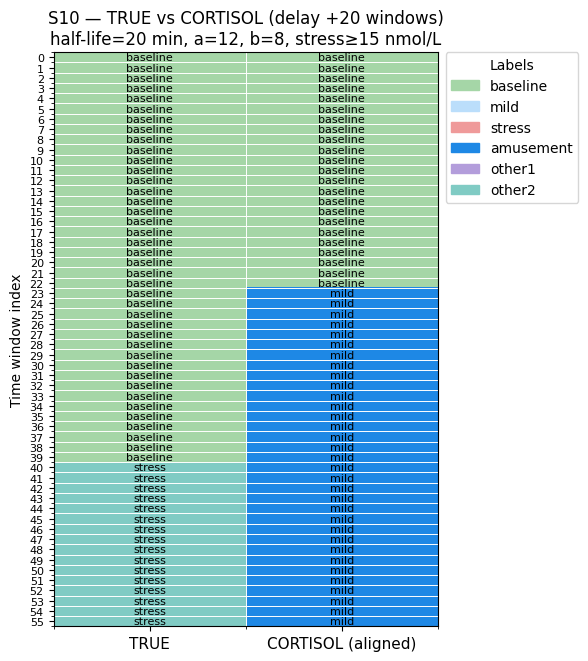

Exact-label agreement (aligned): 41.1%
Stress vs non-stress agreement (aligned): 71.4%
p(stress) raw max: 0.610 | p(stress) lag max: 0.392 | proxy cortisol max: 12.7 nmol/L
BiLSTM mapping metrics: {'subject': 'S10', 'exact_agree': 0.4107142857142857, 'stress_agree': 0.7142857142857143, 'p_raw_max': 0.6101964999999999, 'p_lag_max': 0.39218817449504667, 'cort_max': 12.70625809394056}


In [133]:

def evaluate_mapping_for_subject(df_all, subject_id, stress_class_id=1,
                                 minutes_per_step=1.0, half_life_min=20.0,
                                 a=12.0, b=8.0, stress_band_min=15.0,
                                 align_delay_windows=20):
    g = (df_all[df_all["subject"].astype(str)==str(subject_id)]
         .sort_values("window_idx")).reset_index(drop=True)
    if g.empty: return None
    y_true = g["true"].to_numpy()
    p_raw  = g[f"p{stress_class_id}"].to_numpy()
    p_lag  = _ema_delay(p_raw, minutes_per_step, half_life_min)
    cortisol = a * p_lag + b
    cort_ids = _cortisol_band_ids(cortisol, stress_band_min)

    d = int(max(0, align_delay_windows))
    idx_true = np.arange(0, len(y_true)-d) if d>0 else np.arange(len(y_true))
    idx_cort = idx_true + d if d>0 else idx_true
    y_t = y_true[idx_true]; cort_t = cort_ids[idx_cort]

    exact = float(np.mean(y_t == cort_t)) if len(y_t) else 0.0
    stress_true = (y_t == 1)
    stress_cort = (cort_t == 1)
    stress_agree = float(np.mean(stress_true == stress_cort)) if len(y_t) else 0.0

    return {"subject": str(subject_id),
            "exact_agree": exact,
            "stress_agree": stress_agree,
            "p_raw_max": float(np.max(p_raw)) if len(p_raw) else 0.0,
            "p_lag_max": float(np.max(p_lag)) if len(p_lag) else 0.0,
            "cort_max": float(np.max(cortisol)) if len(cortisol) else 0.0}

def plot_two_column_mapping(df_all, subject_id, stress_class_id=1,
                            minutes_per_step=1.0, half_life_min=20.0,
                            a=12.0, b=8.0, stress_band_min=15.0,
                            align_delay_windows=20, max_windows=80):
    # slice subject
    g = (df_all[df_all["subject"].astype(str)==str(subject_id)]
         .sort_values("window_idx")).reset_index(drop=True)
    assert not g.empty, f"No rows for subject {subject_id}"
    t = g["window_idx"].to_numpy()
    y_true = g["true"].to_numpy()
    p_raw  = g[f"p{stress_class_id}"].to_numpy()

    # cortisol mapping
    p_lag = _ema_delay(p_raw, minutes_per_step, half_life_min)
    cortisol = LinearCortisol(a=a, b=b)(p_lag)
    # dynamic bands
    def to_cid(c):
        if c < 10.0: return 0
        if c < stress_band_min: return 2
        return 1
    cort_ids = np.array([to_cid(c) for c in cortisol], dtype=int)

    # TRUE[t] vs CORT[t+delay]
    d = int(max(0, align_delay_windows))
    idx_true = np.arange(0, len(t)-d) if d>0 else np.arange(len(t))
    idx_cort = idx_true + d if d>0 else idx_true
    t_sel, y_true_sel, cort_sel = t[idx_true], y_true[idx_true], cort_ids[idx_cort]

    # truncate
    if len(t_sel) > max_windows:
        t_sel, y_true_sel, cort_sel = t_sel[:max_windows], y_true_sel[:max_windows], cort_sel[:max_windows]

    # names & colors
    true_names = np.array([DATASET_LABEL_NAMES.get(int(y), str(y)) for y in y_true_sel])
    cort_names = np.array([CORTISOL_ID_TO_LABEL.get(int(c), str(c)) for c in cort_sel])
    names_order = ["baseline","mild","stress","amusement","other1","other2"]
    colors = ["#A5D6A7","#BBDEFB","#EF9A9A","#1E88E5","#B39DDB","#80CBC4"]
    name_to_idx = {n:i for i,n in enumerate(names_order)}
    cmap = ListedColormap(colors)

    N = len(t_sel)
    mat = np.zeros((N,2), dtype=int)
    mat[:,0] = np.array([name_to_idx.get(n,0) for n in true_names])  # TRUE
    mat[:,1] = np.array([name_to_idx.get(n,0) for n in cort_names])  # CORT

    fig, ax = plt.subplots(figsize=(6, max(4, N*0.12)))
    ax.imshow(mat, aspect="auto", cmap=cmap, interpolation="nearest", origin="upper")
    ax.set_xticks([0,1]); ax.set_xticklabels(["TRUE", "CORTISOL (aligned)"], fontsize=11)
    ax.set_yticks(np.arange(N)); ax.set_yticklabels(t_sel, fontsize=8)
    ax.set_ylabel("Time window index")
    ax.set_title(f"{subject_id} — TRUE vs CORTISOL (delay +{d} windows)\n"
                 f"half-life={half_life_min} min, a={a}, b={b}, stress≥{stress_band_min} nmol/L")
    # grid + annotations
    ax.set_xticks(np.arange(-.5, 2, 1), minor=True)
    ax.set_yticks(np.arange(-.5, N, 1), minor=True)
    ax.grid(which="minor", color="white", linestyle="-", linewidth=0.7)
    for i in range(N):
        ax.text(0, i, true_names[i], va="center", ha="center", fontsize=8)
        ax.text(1, i, cort_names[i], va="center", ha="center", fontsize=8)
    handles = [Patch(color=colors[i], label=names_order[i]) for i in range(len(names_order))]
    ax.legend(handles=handles, bbox_to_anchor=(1.02,1), loc="upper left", borderaxespad=0., title="Labels")
    plt.tight_layout(); plt.show()

    # print quick metrics on the aligned region
    exact = float(np.mean(true_names == cort_names)) if N else 0.0
    stress_true = (y_true_sel == 1)
    stress_cort = (cort_names == "stress")
    stress_agree = float(np.mean(stress_true == stress_cort)) if N else 0.0
    print(f"Exact-label agreement (aligned): {100*exact:.1f}%")
    print(f"Stress vs non-stress agreement (aligned): {100*stress_agree:.1f}%")
    print(f"p(stress) raw max: {p_raw.max():.3f} | p(stress) lag max: {p_lag.max():.3f} | "
          f"proxy cortisol max: {cortisol.max():.1f} nmol/L")

# ==== CALL IT (pick a subject from your dataset, e.g., "S10") ====
best_params = dict(half_life_min=20, a=12, b=8, stress_band_min=15, align_delay_windows=20)
stress_class_id = 1   # stress prob column is 'p1'

subject_to_plot = "S10"   # <-- change to see others
plot_two_column_mapping(
    df_all_bilstm,
    subject_id=subject_to_plot,
    stress_class_id=stress_class_id,
    minutes_per_step=1.0,
    max_windows=80,
    **best_params
)

m = evaluate_mapping_for_subject(
    df_all_bilstm, subject_id=subject_to_plot, stress_class_id=stress_class_id,
    minutes_per_step=1.0, **best_params
)
print("BiLSTM mapping metrics:", m)

WRIST - BILSTM

In [136]:
# ===== Step 1: Inspect wrist signals =====
import os, pickle, numpy as np, pandas as pd
from pathlib import Path
import warnings

ROOT = Path("/content/WESAD/WESAD")  # <- change if needed
TARGET_FS = 32                       # we’ll standardize timelines to 32 Hz for analysis
LABEL_FS  = 700                      # WESAD labels are aligned to chest (700 Hz)

# wrist modalities we care about (with their native Hz)
WRIST_FS = {"ACC":32, "BVP":64, "EDA":4, "TEMP":4}

def safe_resample(arr, orig_fs, tgt_fs):
    if orig_fs == tgt_fs:
        return arr
    from scipy.signal import resample
    n = int(round(arr.shape[0] * tgt_fs / float(orig_fs)))
    return resample(arr, n, axis=0)

def get_wrist(signals):
    # handle nested dicts or flat dicts
    wrist = signals.get("wrist", {})
    out = {}
    for k, fs in WRIST_FS.items():
        if isinstance(wrist, dict) and k in wrist:
            out[k] = (np.asarray(wrist[k]), fs)
        elif k in signals:  # flat fallback
            out[k] = (np.asarray(signals[k]), fs)
    return out

def map_label_window(y):
    # raw: 0=undefined, 1=baseline, 2=stress, 3=amusement
    # map to {0,1,2} and ignore 0
    vals, cnts = np.unique(y, return_counts=True)
    maj = vals[np.argmax(cnts)]
    if maj in (1,2,3): return int(maj-1)
    return None

rows = []
subs = sorted([d for d in os.listdir(ROOT) if d.startswith("S")])
for s in subs:
    pkl_files = list((ROOT / s).glob("*.pkl"))
    if not pkl_files:
        warnings.warn(f"{s}: no pkl")
        continue
    with open(pkl_files[0], "rb") as f:
        data = pickle.load(f, encoding="latin1")
    signals, labels = data.get("signal", {}), np.asarray(data.get("label")).reshape(-1)

    wrist = get_wrist(signals)
    if not wrist:
        warnings.warn(f"{s}: no wrist signals found")
        continue

    # resample each present wrist signal to TARGET_FS and collect lengths
    present = []
    lens_sec = []
    for name, (arr, fs) in wrist.items():
        arr = arr if arr.ndim>1 else arr[:,None]
        arr32 = safe_resample(arr, fs, TARGET_FS)
        present.append(name)
        lens_sec.append(arr32.shape[0]/TARGET_FS)

    # resample labels to TARGET_FS to estimate usable labeled time (excluding undefined)
    y32 = safe_resample(labels[:,None], LABEL_FS, TARGET_FS).round().astype(int).ravel()
    usable_ratio = (y32>0).mean()
    dur_min = np.min(lens_sec)/60 if lens_sec else 0

    # distribution after mapping (rough, per-sample)
    mapped = y32.copy()
    mask = mapped>0
    mapped[mask] -= 1  # 1->0,2->1,3->2
    base = (mapped==0).sum()
    stress=(mapped==1).sum()
    amuse=(mapped==2).sum()

    rows.append({
        "subject": s,
        "wrist_present": ",".join(sorted(present)),
        "min_duration_min": round(dur_min,2),
        "usable_label_%": round(100*usable_ratio,1),
        "samples@32Hz": int(np.min([int(TARGET_FS*60*dur_min)])) if lens_sec else 0,
        "count_baseline": int(base),
        "count_stress": int(stress),
        "count_amusement": int(amuse),
    })

df_wrist = pd.DataFrame(rows).sort_values("subject")
print(" Wrist inspection summary")
display(df_wrist)

print("\nTotals (per-sample counts @32Hz, after label mapping):")
print(df_wrist[["count_baseline","count_stress","count_amusement"]].sum())


 Wrist inspection summary


,subject,wrist_present,min_duration_min,usable_label_%,samples@32Hz,count_baseline,count_stress,count_amusement
0,S10,"ACC,BVP,EDA,TEMP",91.60,58.7,175872,110400,23200,11906
1,S11,"ACC,BVP,EDA,TEMP",87.22,60.6,167456,103736,21766,11778
2,S13,"ACC,BVP,EDA,TEMP",92.28,56.7,177184,114520,21253,12227
3,S14,"ACC,BVP,EDA,TEMP",92.47,57.6,177536,113119,21602,11905
4,S15,"ACC,BVP,EDA,TEMP",87.53,60.4,168064,104224,21953,11905
5,S16,"ACC,BVP,EDA,TEMP",93.85,56.4,180192,116253,21539,11778
6,S17,"ACC,BVP,EDA,TEMP",98.67,53.7,189440,125440,23136,11904
7,S2,"ACC,BVP,EDA,TEMP",101.32,49.6,194528,134560,19680,11584
8,S3,"ACC,BVP,EDA,TEMP",108.22,48.4,207776,143712,20481,12001
9,S4,"ACC,BVP,EDA,TEMP",107.05,48.5,205536,142848,20320,11906



Totals (per-sample counts @32Hz, after label mapping):
count_baseline     1827736
count_stress        318944
count_amusement     178426
dtype: int64


In [139]:
# === Build WESAD wrist windows → /content/wesad/features/windows/wrist∆20 ===
import numpy as np, pickle, math, os
from pathlib import Path

# 1) EDIT THIS if your dataset is elsewhere:
WESAD_ROOT = Path("/content/WESAD/WESAD")   # must contain S2/S2.pkl, S3/S3.pkl, ...

proj      = Path("/content/wesad")
out_dir   = proj/"features"/"windows"/"wrist∆20"
out_dir.mkdir(parents=True, exist_ok=True)

assert WESAD_ROOT.exists(), f"WESAD_ROOT not found: {WESAD_ROOT}"
subs = sorted([p for p in WESAD_ROOT.iterdir() if p.is_dir() and p.name.startswith("S")])
assert subs, f"No subject folders under {WESAD_ROOT}"

# --- simple resampler to 32 Hz ---
def _resample_to_32(x, src_hz):
    if src_hz == 32: return x
    L = x.shape[0]
    t_src = np.linspace(0, 1, L, endpoint=False)
    L_new = int(round(L * (32.0 / src_hz)))
    t_new = np.linspace(0, 1, L_new, endpoint=False)
    return np.vstack([np.interp(t_new, t_src, x[:,i]) for i in range(x.shape[1])]).T

def _stack_wrist_32(wrist):
    # Expected channels: ACC (Nx3 @32), BVP (Nx1 @64), EDA (Nx1 @4), Temp (Nx1 @4)
    ACC  = wrist["ACC"]                 # [N,3] @32
    BVP  = wrist.get("BVP", None)       # [N,1] @64
    EDA  = wrist["EDA"]                 # [N,1] @4
    TEMP = wrist.get("Temp") or wrist.get("TEMP")  # some dumps use 'Temp'
    assert TEMP is not None, "Temp channel missing in wrist signals."

    ACC_32  = ACC
    BVP_32  = _resample_to_32(BVP, 64) if BVP is not None else None
    EDA_32  = _resample_to_32(EDA, 4)
    TEMP_32 = _resample_to_32(TEMP, 4)

    parts = [ACC_32, BVP_32, EDA_32, TEMP_32]
    parts = [p for p in parts if p is not None]
    Lmin  = min(p.shape[0] for p in parts)
    parts = [p[:Lmin] for p in parts]
    X     = np.concatenate(parts, axis=1)   # [T, F]  F≈6 (ACCx3 + BVP + EDA + TEMP)
    return X

def _downsample_labels_to_32(y_full, target_len):
    # y_full is the per-sample protocol labels from the .pkl timeline (chest rate).
    idx = np.linspace(0, len(y_full)-1, target_len, endpoint=False).astype(int)
    return y_full[idx]

def _make_windows(X, y, win_sec=60, stride_sec=30, hz=32):
    W = win_sec*hz; S = stride_sec*hz
    Xw, yw = [], []
    for start in range(0, X.shape[0]-W+1, S):
        end = start + W
        Xw.append(X[start:end])
        # majority/median label per window
        yw.append(int(np.round(np.median(y[start:end]))))
    if Xw:
        Xw = np.stack(Xw).astype(np.float32)
        yw = np.asarray(yw, dtype=np.int64)
    else:
        Xw = np.empty((0, W, X.shape[1]), dtype=np.float32)
        yw = np.empty((0,), dtype=np.int64)
    return Xw, yw

delay_min = 20
built = []
for sd in subs:
    subj = sd.name
    npz_path = out_dir/f"{subj}.npz"
    if npz_path.exists():
        with np.load(npz_path, allow_pickle=True) as z:
            built.append((subj, tuple(z["X"].shape)))
        continue

    pkl_path = sd/f"{subj}.pkl"
    with open(pkl_path, "rb") as f:
        d = pickle.load(f, encoding="latin1")

    X_t = _stack_wrist_32(d["signal"]["wrist"])                 # [T, F]
    y_t = _downsample_labels_to_32(d["label"], X_t.shape[0])    # [T]

    # windows @60s with 30s stride
    Xw, yw = _make_windows(X_t, y_t, win_sec=60, stride_sec=30, hz=32)

    # Map to APR with your robust mapper (requires relabel_to_APR_robust to be defined in your env)
    label_names_guess = ["Baseline","Stress","Amusement","Meditation"]  # used only for mapping
    yA, mask = relabel_to_APR_robust(
        yw, label_names_guess, X=Xw, stride_sec=60,
        peak_delay_min=delay_min, anticipation_min=10, peak_width_min=6, recovery_min=20
    )
    Xw, yA = (Xw[mask], yA[mask]) if mask.sum()>0 else (np.empty((0,60*32,X_t.shape[1]),dtype=np.float32),
                                                        np.empty((0,),dtype=np.int64))

    # save in the format your loaders expect
    np.savez_compressed(
        npz_path,
        X=Xw, y=yA,
        labels=np.array(["Anticipation","Peak","Recovery"], dtype=object),
        feat_names=np.array(["ACCx","ACCy","ACCz","BVP","EDA","TEMP"], dtype=object)
    )
    built.append((subj, Xw.shape))

print("Built (or found) wrist windows:")
for s, shp in built:
    print(f"  {s}: X={shp}  (N_win, T=1920, F≈6)")
print("Output dir:", out_dir)


Built (or found) wrist windows:
  S10: X=(182, 1920, 6)  (N_win, T=1920, F≈6)
  S11: X=(173, 1920, 6)  (N_win, T=1920, F≈6)
  S13: X=(183, 1920, 6)  (N_win, T=1920, F≈6)
  S14: X=(183, 1920, 6)  (N_win, T=1920, F≈6)
  S15: X=(174, 1920, 6)  (N_win, T=1920, F≈6)
  S16: X=(186, 1920, 6)  (N_win, T=1920, F≈6)
  S17: X=(196, 1920, 6)  (N_win, T=1920, F≈6)
  S2: X=(201, 1920, 6)  (N_win, T=1920, F≈6)
  S3: X=(215, 1920, 6)  (N_win, T=1920, F≈6)
  S4: X=(213, 1920, 6)  (N_win, T=1920, F≈6)
  S5: X=(207, 1920, 6)  (N_win, T=1920, F≈6)
  S6: X=(234, 1920, 6)  (N_win, T=1920, F≈6)
  S7: X=(173, 1920, 6)  (N_win, T=1920, F≈6)
  S8: X=(181, 1920, 6)  (N_win, T=1920, F≈6)
  S9: X=(173, 1920, 6)  (N_win, T=1920, F≈6)
Output dir: /content/wesad/features/windows/wrist∆20


In [141]:
# === Train & eval BiLSTM on WESAD wrist (∆20) with transfer from chest — FIXED AMP ===
import os, numpy as np, pandas as pd, torch
from pathlib import Path
from torch.utils.data import DataLoader
from sklearn.utils.class_weight import compute_class_weight

# Safety for PyTorch 2.6 loader (leave as-is)
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception:
    pass

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.backends.cudnn.benchmark = True
if torch.cuda.is_available():
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.set_float32_matmul_precision("high")

proj        = Path("/content/wesad")
track_wrist = "wrist∆20"
feat_dir    = proj/"features"/"windows"/track_wrist
eval_root   = proj/"eval"/f"{track_wrist}_phases_conv"
model_root  = proj/"models"/f"{track_wrist}_phases_conv"
eval_root.mkdir(parents=True, exist_ok=True); model_root.mkdir(parents=True, exist_ok=True)

# ---- helper: partial-load chest weights (skip mismatched tensors like stem when F!=)
def load_chest_into_wrist(chest_best_pt: Path, model: torch.nn.Module):
    if not chest_best_pt.exists():
        print(f"[transfer] chest checkpoint not found: {chest_best_pt} — training wrist from scratch.")
        return
    ck = torch.load(chest_best_pt, map_location="cpu", weights_only=False)
    sd_src = ck["model_state"] if isinstance(ck, dict) and "model_state" in ck else ck
    sd_dst = model.state_dict()
    take = {k:v for k,v in sd_src.items() if k in sd_dst and sd_dst[k].shape == v.shape}
    sd_dst.update(take)
    model.load_state_dict(sd_dst, strict=False)
    print(f"[transfer] loaded {len(take)} tensors from chest; skipped {len(sd_dst)-len(take)}.")

# ---- build LOSO (use your existing helpers present in the env)
if "build_or_load_loso_for" in globals():
    subjects, folds, _ = build_or_load_loso_for(track_wrist, feat_dir)
else:
    subjects, folds, _ = build_or_load_loso(track_wrist, feat_dir)

# ---- configs
BATCH_SIZE   = 256
NUM_WORKERS  = min(8, os.cpu_count() or 2)
LR           = 1e-3
WEIGHT_DECAY = 1e-4
PATIENCE     = 8
MAX_EPOCHS   = 30
WARM_EPOCHS  = 6                # freeze LSTM for first few epochs
CHEST_FOLD_FOR_TRANSFER = 1     # pick any trained chest fold for transfer init

results=[]

for k, fold in enumerate(folds, start=1):
    test_sid = fold["test_subject"]; val_sids = fold.get("val_subjects", []); train_sids = fold["train_subjects"]
    print(f"\n[{track_wrist}] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

    # stack & APR
    def stack_phase(sids):
        Xs, ys = [], []
        for s in sids:
            X, y, labels, _ = load_npz(feat_dir, s)
            yA, m = relabel_to_APR_robust(
                y, labels, X=X, stride_sec=60,
                peak_delay_min=int(track_wrist.split('∆')[-1]),
                anticipation_min=10, peak_width_min=6, recovery_min=20
            )
            if m.sum()==0: continue
            Xs.append(X[m]); ys.append(yA[m])
        return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

    Xtr, ytr = stack_phase(train_sids)
    Xva, yva = stack_phase(val_sids)
    Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
    yteA, m_te = relabel_to_APR_robust(
        yte_full, labels_te, X=Xte_full, stride_sec=60,
        peak_delay_min=int(track_wrist.split('∆')[-1]),
        anticipation_min=10, peak_width_min=6, recovery_min=20
    )
    Xte, yte = (Xte_full[m_te], yteA[m_te]) if m_te.sum()>0 else (None, None)

    if Xtr is None or Xva is None or Xte is None:
        print(f"[{track_wrist}] Fold {k:02d} skipped (no APR windows)."); continue

    # scale
    sc = fit_scaler_on_train(Xtr)
    Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

    # loaders
    dl_tr = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=True,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available(), drop_last=True)
    dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())
    dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())

    # model
    T, F = Xtr.shape[1], Xtr.shape[2]; NCLS = 3
    model = ConvStemBiLSTMConcatPool(F, HIDDEN_SIZE, 2, NCLS, bidirectional=True, dropout=0.40).to(device)

    # transfer from chest
    chest_ckpt = proj/"models"/"chest∆20_phases_conv"/f"fold_{CHEST_FOLD_FOR_TRANSFER:02d}"/"best.pt"
    load_chest_into_wrist(chest_ckpt, model)

    # loss/optim/sched
    cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
    criterion = torch.nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device))
    optim = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
    sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, mode='max', factor=0.5, patience=3, min_lr=1e-5)

    # NEW AMP API
    scaler = torch.amp.GradScaler(enabled=torch.cuda.is_available())

    # paths & resume
    out_dir  = eval_root/f"fold_{k:02d}"
    ckpt_dir = model_root/f"fold_{k:02d}"
    out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)

    start_epoch, bestF = resume_from_last(ckpt_dir, model, optimizer=optim, scheduler=sched, scaler=scaler,
                                          map_location=("cuda" if torch.cuda.is_available() else "cpu"))
    if start_epoch>0: print(f"[resume] starting at epoch {start_epoch}, bestF={bestF}")

    # warm-up: freeze LSTM
    def set_lstm_requires_grad(flag: bool):
        for p in model.lstm.parameters(): p.requires_grad = flag
    set_lstm_requires_grad(False)

    def _epoch(loader, train:bool):
        total, n = 0.0, 0
        all_g, all_p = [], []
        model.train() if train else model.eval()
        for xb, yb in loader:
            xb = xb.to(device, non_blocking=True).contiguous()
            yb = yb.to(device, non_blocking=True)
            # NEW autocast API
            with torch.amp.autocast(device_type="cuda", enabled=torch.cuda.is_available()):
                logits = model(xb)
                loss = criterion(logits, yb)
            if train:
                optim.zero_grad(set_to_none=True)
                # ✅ proper AMP sequence: scale → backward → step → update
                scaler.scale(loss).backward()
                scaler.step(optim)
                scaler.update()
            total += loss.detach().item() * xb.size(0); n += xb.size(0)
            all_g.append(yb.detach().cpu()); all_p.append(torch.argmax(logits,1).detach().cpu())
        g = torch.cat(all_g).numpy(); p = torch.cat(all_p).numpy()
        from sklearn.metrics import f1_score, accuracy_score
        return total/max(1,n), f1_score(g,p,average="macro"), accuracy_score(g,p)

    noimp = 0
    bestF = -1.0 if bestF is None else bestF

    for ep in range(start_epoch+1, MAX_EPOCHS+1):
        # unfreeze after warm-up
        if ep == WARM_EPOCHS+1:
            set_lstm_requires_grad(True)

        trL, trF, _ = _epoch(dl_tr, train=True)
        vaL, vaF, _ = _epoch(dl_va, train=False)
        sched.step(vaF)

        bestF_new, best_path = save_best_and_last(
            ckpt_dir=ckpt_dir, model=model, optimizer=optim, scheduler=sched, scaler=scaler,
            epoch=ep, metric_value=vaF, best_metric=bestF,
            extra={"track": track_wrist, "test_subject": str(test_sid)},
            snapshot_every=10
        )
        if best_path is not None:
            bestF = bestF_new; noimp = 0
            print(f"✅ Fold {k:02d} epoch {ep}: new BEST val F1={vaF:.4f}")
        else:
            noimp += 1
            if noimp >= PATIENCE:
                print(f"[early stop] Fold {k:02d} @ epoch {ep} | best F1={bestF:.4f}")
                break

    # test best
    best_ck = torch.load(ckpt_dir/"best.pt", map_location=device, weights_only=False)
    state = best_ck["model_state"] if "model_state" in best_ck else best_ck
    model.load_state_dict(state, strict=True); model.eval()
    teL, teF, teA = _epoch(dl_te, train=False)
    print(f"[{track_wrist}] Fold {k:02d} TEST: Acc={teA:.4f} | Macro-F1={teF:.4f}")
    results.append({"fold":k, "test_subject":test_sid, "acc":float(teA), "f1_macro":float(teF)})

# summary
if results:
    df = pd.DataFrame(results).sort_values("fold")
    df.to_csv(eval_root/"phase_conv_loso_summary.csv", index=False)
    print("\n=== Wrist BiLSTM LOSO summary ===")
    print(df)
    print(df.describe()[["acc","f1_macro"]])
else:
    print("No folds produced results.")



[wrist∆20] Fold 01 | test=S10 | val=['S11'] | train_n=13
[transfer] loaded 31 tensors from chest; skipped 1.
✅ Fold 01 epoch 1: new BEST val F1=0.2588
✅ Fold 01 epoch 2: new BEST val F1=0.3030
✅ Fold 01 epoch 3: new BEST val F1=0.3704
✅ Fold 01 epoch 4: new BEST val F1=0.4272
✅ Fold 01 epoch 5: new BEST val F1=0.4526
✅ Fold 01 epoch 6: new BEST val F1=0.4540
✅ Fold 01 epoch 10: new BEST val F1=0.4747
✅ Fold 01 epoch 13: new BEST val F1=0.4909
[early stop] Fold 01 @ epoch 21 | best F1=0.4909
[wrist∆20] Fold 01 TEST: Acc=0.5165 | Macro-F1=0.3447

[wrist∆20] Fold 02 | test=S11 | val=['S10'] | train_n=13
[transfer] loaded 31 tensors from chest; skipped 1.
✅ Fold 02 epoch 1: new BEST val F1=0.2050
✅ Fold 02 epoch 3: new BEST val F1=0.2469
✅ Fold 02 epoch 7: new BEST val F1=0.2560
✅ Fold 02 epoch 9: new BEST val F1=0.2972
✅ Fold 02 epoch 10: new BEST val F1=0.2986
✅ Fold 02 epoch 11: new BEST val F1=0.3398
✅ Fold 02 epoch 12: new BEST val F1=0.3843
✅ Fold 02 epoch 14: new BEST val F1=0.4075

In [142]:
# === BiLSTM on WESAD wrist (∆20) — Improved version (sampler + aug + early unfreeze + LR drop) ===
import os, numpy as np, pandas as pd, torch
from pathlib import Path
from torch.utils.data import DataLoader, WeightedRandomSampler
from sklearn.utils.class_weight import compute_class_weight

# ---- Safety for PyTorch 2.6 loader (leave as-is)
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception:
    pass

# ---- Device & perf knobs
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.backends.cudnn.benchmark = True
if torch.cuda.is_available():
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.set_float32_matmul_precision("high")

# ---- Paths
proj        = Path("/content/wesad")
track_wrist = "wrist∆20"   # change if your wrist windows are named differently
feat_dir    = proj/"features"/"windows"/track_wrist
eval_root   = proj/"eval"/f"{track_wrist}_phases_conv_impr"
model_root  = proj/"models"/f"{track_wrist}_phases_conv_impr"
eval_root.mkdir(parents=True, exist_ok=True); model_root.mkdir(parents=True, exist_ok=True)

# ---- Helper: partial load from chest
def load_chest_into_wrist(chest_best_pt: Path, model: torch.nn.Module):
    if not chest_best_pt.exists():
        print(f"[transfer] chest checkpoint not found: {chest_best_pt} — training wrist from scratch.")
        return
    ck = torch.load(chest_best_pt, map_location="cpu", weights_only=False)
    sd_src = ck["model_state"] if isinstance(ck, dict) and "model_state" in ck else ck
    sd_dst = model.state_dict()
    take = {k:v for k,v in sd_src.items() if k in sd_dst and sd_dst[k].shape == v.shape}
    sd_dst.update(take)
    model.load_state_dict(sd_dst, strict=False)
    print(f"[transfer] loaded {len(take)} tensors from chest; skipped {len(sd_dst)-len(take)}.")

# ---- LOSO folds
if "build_or_load_loso_for" in globals():
    subjects, folds, _ = build_or_load_loso_for(track_wrist, feat_dir)
else:
    subjects, folds, _ = build_or_load_loso(track_wrist, feat_dir)

# ---- Configs (differences vs old approach are marked)
BATCH_SIZE   = 256
NUM_WORKERS  = min(8, os.cpu_count() or 2)
LR           = 1e-3
WEIGHT_DECAY = 1e-4
PATIENCE     = 10         # ↑ was 8
MAX_EPOCHS   = 40         # ↑ was 30
WARM_EPOCHS  = 3          # ↓ was 6 (unfreeze earlier)
CHEST_FOLD_FOR_TRANSFER = 1

# ---- Time masking augmentation (SpecAugment-style)
def time_mask(x: torch.Tensor, max_w: int = 160) -> torch.Tensor:
    B, T, F = x.shape
    if T <= 1: return x
    w = int(torch.randint(1, max_w + 1, (1,)).item())
    w = min(w, T - 1)
    s = int(torch.randint(0, max(1, T - w), (1,)).item())
    x[:, s:s+w, :] = 0
    return x

# ---- Train per fold
results=[]
for k, fold in enumerate(folds, start=1):
    test_sid = fold["test_subject"]; val_sids = fold.get("val_subjects", []); train_sids = fold["train_subjects"]
    print(f"\n[{track_wrist}] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

    # stack & APR
    def stack_phase(sids):
        Xs, ys = [], []
        for s in sids:
            X, y, labels, _ = load_npz(feat_dir, s)
            yA, m = relabel_to_APR_robust(
                y, labels, X=X, stride_sec=60,
                peak_delay_min=int(track_wrist.split('∆')[-1]),
                anticipation_min=10, peak_width_min=6, recovery_min=20
            )
            if m.sum()==0: continue
            Xs.append(X[m]); ys.append(yA[m])
        return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

    Xtr, ytr = stack_phase(train_sids)
    Xva, yva = stack_phase(val_sids)
    Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
    yteA, m_te = relabel_to_APR_robust(
        yte_full, labels_te, X=Xte_full, stride_sec=60,
        peak_delay_min=int(track_wrist.split('∆')[-1]),
        anticipation_min=10, peak_width_min=6, recovery_min=20
    )
    Xte, yte = (Xte_full[m_te], yteA[m_te]) if m_te.sum()>0 else (None, None)

    if Xtr is None or Xva is None or Xte is None:
        print(f"[{track_wrist}] Fold {k:02d} skipped (no APR windows)."); continue

    # scale
    sc = fit_scaler_on_train(Xtr)
    Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

    # loaders — **WeightedRandomSampler** for train
    cls, cnts = np.unique(ytr, return_counts=True)
    w_map = {int(c): float(cnts.sum()/cnts[i]) for i, c in enumerate(cls)}
    sample_weights = torch.tensor([w_map[int(t)] for t in ytr], dtype=torch.float)
    sampler = WeightedRandomSampler(sample_weights, num_samples=len(sample_weights), replacement=True)

    dl_tr = DataLoader(
        SeqDataset(Xtr_s, ytr),
        batch_size=BATCH_SIZE,
        sampler=sampler,            # use sampler (don’t set shuffle=True)
        shuffle=False,
        num_workers=NUM_WORKERS,
        prefetch_factor=4,
        persistent_workers=False,
        pin_memory=torch.cuda.is_available(),
        drop_last=True
    )
    dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())
    dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())

    # model
    T, F = Xtr.shape[1], Xtr.shape[2]; NCLS = 3
    model = ConvStemBiLSTMConcatPool(F, HIDDEN_SIZE, 2, NCLS, bidirectional=True, dropout=0.40).to(device)

    # transfer from chest
    chest_ckpt = proj/"models"/"chest∆20_phases_conv"/f"fold_{CHEST_FOLD_FOR_TRANSFER:02d}"/"best.pt"
    load_chest_into_wrist(chest_ckpt, model)

    # loss/optim/sched
    cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
    criterion = torch.nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device))
    optim = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
    sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, mode='max', factor=0.5, patience=3, min_lr=1e-5)
    scaler = torch.amp.GradScaler(enabled=torch.cuda.is_available())  # new AMP API

    # paths & resume
    out_dir  = eval_root/f"fold_{k:02d}"
    ckpt_dir = model_root/f"fold_{k:02d}"
    out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)

    start_epoch, bestF = resume_from_last(ckpt_dir, model, optimizer=optim, scheduler=sched, scaler=scaler,
                                          map_location=("cuda" if torch.cuda.is_available() else "cpu"))
    if start_epoch>0: print(f"[resume] starting at epoch {start_epoch}, bestF={bestF}")

    # freeze LSTM for warm-up
    def set_lstm_requires_grad(flag: bool):
        for p in model.lstm.parameters(): p.requires_grad = flag
    set_lstm_requires_grad(False)

    def _epoch(loader, train:bool):
        total, n = 0.0, 0
        all_g, all_p = [], []
        model.train() if train else model.eval()
        for xb, yb in loader:
            xb = xb.to(device, non_blocking=True).contiguous()
            yb = yb.to(device, non_blocking=True)

            # time-masking augmentation (train only)
            if train and torch.rand(1).item() < 0.5:
                xb = xb.clone()
                xb = time_mask(xb, max_w=160)

            with torch.amp.autocast(device_type="cuda", enabled=torch.cuda.is_available()):
                logits = model(xb)
                loss   = criterion(logits, yb)
            if train:
                optim.zero_grad(set_to_none=True)
                scaler.scale(loss).backward()
                scaler.step(optim)
                scaler.update()
            total += loss.detach().item() * xb.size(0); n += xb.size(0)
            all_g.append(yb.detach().cpu()); all_p.append(torch.argmax(logits,1).detach().cpu())
        g = torch.cat(all_g).numpy(); p = torch.cat(all_p).numpy()
        from sklearn.metrics import f1_score, accuracy_score
        return total/max(1,n), f1_score(g,p,average="macro"), accuracy_score(g,p)

    noimp = 0
    bestF = -1.0 if bestF is None else bestF

    for ep in range(start_epoch+1, MAX_EPOCHS+1):
        # unfreeze earlier and lower LR on unfreeze
        if ep == WARM_EPOCHS + 1:
            set_lstm_requires_grad(True)
            for pg in optim.param_groups:
                pg["lr"] = LR * 0.3   # LR drop on unfreeze

        trL, trF, _ = _epoch(dl_tr, train=True)
        vaL, vaF, _ = _epoch(dl_va, train=False)
        sched.step(vaF)

        bestF_new, best_path = save_best_and_last(
            ckpt_dir=ckpt_dir, model=model, optimizer=optim, scheduler=sched, scaler=scaler,
            epoch=ep, metric_value=vaF, best_metric=bestF,
            extra={"track": track_wrist, "test_subject": str(test_sid)},
            snapshot_every=10
        )
        if best_path is not None:
            bestF = bestF_new; noimp = 0
            print(f"Fold {k:02d} epoch {ep}: new BEST val F1={vaF:.4f}")
        else:
            noimp += 1
            if noimp >= PATIENCE:
                print(f"[early stop] Fold {k:02d} @ epoch {ep} | best F1={bestF:.4f}")
                break

    # test best
    best_ck = torch.load(ckpt_dir/"best.pt", map_location=device, weights_only=False)
    state = best_ck["model_state"] if "model_state" in best_ck else best_ck
    model.load_state_dict(state, strict=True); model.eval()
    teL, teF, teA = _epoch(dl_te, train=False)
    print(f"[{track_wrist}] Fold {k:02d} TEST: Acc={teA:.4f} | Macro-F1={teF:.4f}")
    results.append({"fold":k, "test_subject":test_sid, "acc":float(teA), "f1_macro":float(teF)})

# ---- Summary
if results:
    df = pd.DataFrame(results).sort_values("fold")
    df.to_csv(eval_root/"phase_conv_loso_summary.csv", index=False)
    print("\n=== Wrist BiLSTM LOSO summary (improved) ===")
    print(df)
    print(df.describe()[["acc","f1_macro"]])
else:
    print("No folds produced results.")



[wrist∆20] Fold 01 | test=S10 | val=['S11'] | train_n=13
[transfer] loaded 31 tensors from chest; skipped 1.
Fold 01 epoch 1: new BEST val F1=0.0080
Fold 01 epoch 2: new BEST val F1=0.0276
Fold 01 epoch 4: new BEST val F1=0.0555
Fold 01 epoch 5: new BEST val F1=0.0771
Fold 01 epoch 6: new BEST val F1=0.1722
Fold 01 epoch 7: new BEST val F1=0.2718
Fold 01 epoch 8: new BEST val F1=0.3669
Fold 01 epoch 11: new BEST val F1=0.3733
Fold 01 epoch 13: new BEST val F1=0.3804
Fold 01 epoch 14: new BEST val F1=0.3811
Fold 01 epoch 15: new BEST val F1=0.3823
[early stop] Fold 01 @ epoch 25 | best F1=0.3823
[wrist∆20] Fold 01 TEST: Acc=0.2802 | Macro-F1=0.1799

[wrist∆20] Fold 02 | test=S11 | val=['S10'] | train_n=13
[transfer] loaded 31 tensors from chest; skipped 1.
Fold 02 epoch 1: new BEST val F1=0.1214
[early stop] Fold 02 @ epoch 11 | best F1=0.1214
[wrist∆20] Fold 02 TEST: Acc=0.0231 | Macro-F1=0.0388

[wrist∆20] Fold 03 | test=S13 | val=['S10'] | train_n=13
[transfer] loaded 31 tensors fro

In [148]:
# === BiLSTM on WESAD wrist (∆20) — A/B harness with toggles ===
import os, numpy as np, pandas as pd, torch
from pathlib import Path
from torch.utils.data import DataLoader, WeightedRandomSampler
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix

# -----------------------------
# EXPERIMENT SWITCHES (A/B)
# -----------------------------
USE_SAMPLER         = False   # True → WeightedRandomSampler (turn OFF if using class weights to avoid double reweight)
USE_TIME_MASK       = False   # True → SpecAugment-style time masking
TIME_MASK_PROB      = 0.5
UNFREEZE_EPOCH      = 6       # 6 = old approach; try 3 for earlier unfreeze, 0 to train LSTM from start
UNFREEZE_LR_MULT    = 1.0     # 1.0 = no LR drop; try 0.3 if you unfreeze early
CHEST_FOLD_FOR_TRANSFER = 1   # try 1,4,7 etc.

# -----------------------------
# Fixed training config (old baseline)
# -----------------------------
BATCH_SIZE   = 256
NUM_WORKERS  = min(8, os.cpu_count() or 2)
LR           = 1e-3
WEIGHT_DECAY = 1e-4
PATIENCE     = 8
MAX_EPOCHS   = 30

# -----------------------------
# Boilerplate
# -----------------------------
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception:
    pass

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.backends.cudnn.benchmark = True
if torch.cuda.is_available():
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.set_float32_matmul_precision("high")

proj        = Path("/content/wesad")
track_wrist = "wrist∆20"
feat_dir    = proj/"features"/"windows"/track_wrist
eval_root   = proj/"eval"/f"{track_wrist}_phases_conv_ab"
model_root  = proj/"models"/f"{track_wrist}_phases_conv_ab"
eval_root.mkdir(parents=True, exist_ok=True); model_root.mkdir(parents=True, exist_ok=True)

# ---- helper: partial-load chest
def load_chest_into_wrist(chest_best_pt: Path, model: torch.nn.Module):
    if not chest_best_pt.exists():
        print(f"[transfer] chest checkpoint not found: {chest_best_pt} — training wrist from scratch.")
        return
    ck = torch.load(chest_best_pt, map_location="cpu", weights_only=False)
    sd_src = ck["model_state"] if isinstance(ck, dict) and "model_state" in ck else ck
    sd_dst = model.state_dict()
    take = {k:v for k,v in sd_src.items() if k in sd_dst and sd_dst[k].shape == v.shape}
    sd_dst.update(take)
    model.load_state_dict(sd_dst, strict=False)
    print(f"[transfer] loaded {len(take)} tensors from chest; skipped {len(sd_dst)-len(take)}.")

# ---- time masking aug
def time_mask(x: torch.Tensor, max_w: int = 160) -> torch.Tensor:
    B, T, F = x.shape
    if T <= 1: return x
    w = int(torch.randint(1, max_w + 1, (1,)).item())
    w = min(w, T - 1)
    s = int(torch.randint(0, max(1, T - w), (1,)).item())
    x[:, s:s+w, :] = 0
    return x

# ---- LOSO plan
if "build_or_load_loso_for" in globals():
    subjects, folds, _ = build_or_load_loso_for(track_wrist, feat_dir)
else:
    subjects, folds, _ = build_or_load_loso(track_wrist, feat_dir)

# ---- run folds
results=[]; perfold_rows=[]
for k, fold in enumerate(folds, start=1):
    test_sid = fold["test_subject"]; val_sids = fold.get("val_subjects", []); train_sids = fold["train_subjects"]
    print(f"\n[{track_wrist}] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

    # stack & APR
    def stack_phase(sids):
        Xs, ys = [], []
        for s in sids:
            X, y, labels, _ = load_npz(feat_dir, s)
            yA, m = relabel_to_APR_robust(
                y, labels, X=X, stride_sec=60,
                peak_delay_min=int(track_wrist.split('∆')[-1]),
                anticipation_min=10, peak_width_min=6, recovery_min=20
            )
            if m.sum()==0: continue
            Xs.append(X[m]); ys.append(yA[m])
        return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

    Xtr, ytr = stack_phase(train_sids)
    Xva, yva = stack_phase(val_sids)
    Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
    yteA, m_te = relabel_to_APR_robust(
        yte_full, labels_te, X=Xte_full, stride_sec=60,
        peak_delay_min=int(track_wrist.split('∆')[-1]),
        anticipation_min=10, peak_width_min=6, recovery_min=20
    )
    Xte, yte = (Xte_full[m_te], yteA[m_te]) if m_te.sum()>0 else (None, None)
    if Xtr is None or Xva is None or Xte is None:
        print(f"[{track_wrist}] Fold {k:02d} skipped (no APR windows)."); continue

    # scale
    sc = fit_scaler_on_train(Xtr)
    Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

    # loaders
    if USE_SAMPLER:
        cls, cnts = np.unique(ytr, return_counts=True)
        w_map = {int(c): float(cnts.sum()/cnts[i]) for i, c in enumerate(cls)}
        sample_weights = torch.tensor([w_map[int(t)] for t in ytr], dtype=torch.float)
        sampler = WeightedRandomSampler(sample_weights, num_samples=len(sample_weights), replacement=True)
        dl_tr = DataLoader(
            SeqDataset(Xtr_s, ytr),
            batch_size=BATCH_SIZE,
            sampler=sampler,
            shuffle=False,
            num_workers=NUM_WORKERS,
            prefetch_factor=4,
            persistent_workers=False,
            pin_memory=torch.cuda.is_available(),
            drop_last=True
        )
    else:
        dl_tr = DataLoader(
            SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=True,
            num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
            pin_memory=torch.cuda.is_available(), drop_last=True
        )

    dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())
    dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())

    # model
    T, F = Xtr.shape[1], Xtr.shape[2]; NCLS = 3
    model = ConvStemBiLSTMConcatPool(F, HIDDEN_SIZE, 2, NCLS, bidirectional=True, dropout=0.40).to(device)

    # transfer from chest
    chest_ckpt = proj/"models"/"chest∆20_phases_conv"/f"fold_{CHEST_FOLD_FOR_TRANSFER:02d}"/"best.pt"
    load_chest_into_wrist(chest_ckpt, model)

    # loss/optim/sched (keep **class weights** on by default)
    cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
    criterion = torch.nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device))
    optim = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
    sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, mode='max', factor=0.5, patience=3, min_lr=1e-5)
    scaler = torch.amp.GradScaler(enabled=torch.cuda.is_available())

    # paths & resume
    out_dir  = eval_root/f"fold_{k:02d}"
    ckpt_dir = model_root/f"fold_{k:02d}"
    out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)

    start_epoch, bestF = resume_from_last(ckpt_dir, model, optimizer=optim, scheduler=sched, scaler=scaler,
                                          map_location=("cuda" if torch.cuda.is_available() else "cpu"))
    if start_epoch>0: print(f"[resume] starting at epoch {start_epoch}, bestF={bestF}")

    # freeze LSTM for warm-up
    def set_lstm_requires_grad(flag: bool):
        for p in model.lstm.parameters(): p.requires_grad = flag
    set_lstm_requires_grad(False)

    def _epoch(loader, train:bool):
        total, n = 0.0, 0
        all_g, all_p = [], []
        model.train() if train else model.eval()
        for xb, yb in loader:
            xb = xb.to(device, non_blocking=True).contiguous()
            yb = yb.to(device, non_blocking=True)

            if train and USE_TIME_MASK and torch.rand(1).item() < TIME_MASK_PROB:
                xb = xb.clone(); xb = time_mask(xb, max_w=160)

            with torch.amp.autocast(device_type="cuda", enabled=torch.cuda.is_available()):
                logits = model(xb)
                loss   = criterion(logits, yb)
            if train:
                optim.zero_grad(set_to_none=True)
                scaler.scale(loss).backward()
                scaler.step(optim); scaler.update()
            total += loss.detach().item() * xb.size(0); n += xb.size(0)
            all_g.append(yb.detach().cpu()); all_p.append(torch.argmax(logits,1).detach().cpu())
        g = torch.cat(all_g).numpy(); p = torch.cat(all_p).numpy()
        return total/max(1,n), f1_score(g,p,average="macro"), accuracy_score(g,p), g, p

    noimp = 0
    bestF = -1.0 if bestF is None else bestF

    history=[]
    for ep in range(start_epoch+1, MAX_EPOCHS+1):
        # unfreeze at chosen epoch
        if ep == UNFREEZE_EPOCH + 1:
            set_lstm_requires_grad(True)
            for pg in optim.param_groups:
                pg["lr"] = LR * UNFREEZE_LR_MULT

        trL, trF, _, _, _ = _epoch(dl_tr, train=True)
        vaL, vaF, _, g_val, p_val = _epoch(dl_va, train=False)

        # diagnostics
        f1s = f1_score(g_val, p_val, average=None, labels=[0,1,2])
        cm  = confusion_matrix(g_val, p_val, labels=[0,1,2])
        print(f"Val F1 per-class A/P/R: {np.round(f1s,3)}")
        print("Confusion matrix (rows=GT, cols=Pred):\n", cm)

        sched.step(vaF)
        history.append((ep,trL,trF,vaL,vaF))

        bestF_new, best_path = save_best_and_last(
            ckpt_dir=ckpt_dir, model=model, optimizer=optim, scheduler=sched, scaler=scaler,
            epoch=ep, metric_value=vaF, best_metric=bestF,
            extra={"track": track_wrist, "test_subject": str(test_sid),
                   "use_sampler": USE_SAMPLER, "use_time_mask": USE_TIME_MASK,
                   "unfreeze_epoch": UNFREEZE_EPOCH, "unfreeze_lr_mult": UNFREEZE_LR_MULT},
            snapshot_every=10
        )
        if best_path is not None:
            bestF = bestF_new; noimp = 0
            print(f" Fold {k:02d} epoch {ep}: new BEST val F1={vaF:.4f}")
        else:
            noimp += 1
            if noimp >= PATIENCE:
                print(f"[early stop] Fold {k:02d} @ epoch {ep} | best F1={bestF:.4f}")
                break

    # test best
    best_ck = torch.load(ckpt_dir/"best.pt", map_location=device, weights_only=False)
    state = best_ck["model_state"] if "model_state" in best_ck else best_ck
    model.load_state_dict(state, strict=True); model.eval()
    teL, teF, teA, g_te, p_te = _epoch(dl_te, train=False)
    print(f"[{track_wrist}] Fold {k:02d} TEST: Acc={teA:.4f} | Macro-F1={teF:.4f}")
    results.append({"fold":k, "test_subject":test_sid, "acc":float(teA), "f1_macro":float(teF)})

    # save diagnostics per fold
    pd.DataFrame({"gt":g_te, "pred":p_te}).to_csv(out_dir/"test_preds.csv", index=False)

# ---- Summary
if results:
    df = pd.DataFrame(results).sort_values("fold")
    df.to_csv(eval_root/"phase_conv_loso_summary.csv", index=False)
    print("\n=== Wrist BiLSTM LOSO summary (A/B harness) ===")
    print(df)
    print(df.describe()[["acc","f1_macro"]])
else:
    print("No folds produced results.")



[wrist∆20] Fold 01 | test=S10 | val=['S11'] | train_n=13
[transfer] loaded 31 tensors from chest; skipped 1.
[resume] starting at epoch 7, bestF=0.3484069300578265
Val F1 per-class A/P/R: [0.053 0.537 0.614]
Confusion matrix (rows=GT, cols=Pred):
 [[ 2  0  0]
 [18 22  0]
 [53 20 58]]
 Fold 01 epoch 8: new BEST val F1=0.4012
Val F1 per-class A/P/R: [0.073 0.653 0.642]
Confusion matrix (rows=GT, cols=Pred):
 [[ 2  0  0]
 [ 8 32  0]
 [43 26 62]]
 Fold 01 epoch 9: new BEST val F1=0.4561
Val F1 per-class A/P/R: [0.06 0.61 0.67]
Confusion matrix (rows=GT, cols=Pred):
 [[ 2  0  0]
 [15 25  0]
 [48 17 66]]
Val F1 per-class A/P/R: [0.    0.692 0.67 ]
Confusion matrix (rows=GT, cols=Pred):
 [[ 0  2  0]
 [ 3 37  0]
 [37 28 66]]
Val F1 per-class A/P/R: [0.037 0.716 0.67 ]
Confusion matrix (rows=GT, cols=Pred):
 [[ 1  1  0]
 [ 6 34  0]
 [45 20 66]]
 Fold 01 epoch 12: new BEST val F1=0.4743
Val F1 per-class A/P/R: [0.    0.696 0.677]
Confusion matrix (rows=GT, cols=Pred):
 [[ 0  2  0]
 [ 0 40  0]
 

In [149]:
# === Export cortisol proxy traces for wrist∆20 (A/B harness checkpoints) ===
import math, numpy as np, pandas as pd, torch, matplotlib.pyplot as plt
from pathlib import Path
from torch.utils.data import DataLoader

proj = Path("/content/wesad")
track_key = "wrist∆20"

# match your A/B harness dirs
feat_dir  = proj/"features"/"windows"/track_key
eval_root = proj/"eval"/f"{track_key}_phases_conv_ab"
model_root= proj/"models"/f"{track_key}_phases_conv_ab"

# safety for PyTorch 2.6
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception:
    pass

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def _softmax(x):
    x = x - x.max(axis=1, keepdims=True)
    e = np.exp(x); return e / np.clip(e.sum(axis=1, keepdims=True), 1e-12, None)

def _ema_prob(p, half_life_steps=20):
    # steps are in windows; with 1 min/window and half_life_min=20 -> half_life_steps=20
    if len(p)==0: return p
    alpha = 1.0 - math.pow(0.5, 1.0/max(1,half_life_steps))
    o = np.empty_like(p); o[0]=p[0]
    for i in range(1,len(p)): o[i] = (1-alpha)*o[i-1] + alpha*p[i]
    return o

def export_cortisol_wrist(
    stress_class=1,
    half_life_min=20,   # 20-min lag via EMA half-life
    c_min=5.0, c_max=20.0, w_blend=0.7,   # same blending you used before
    align_delay_windows=20                # shift cortisol forward by +20 windows (20 min @ 1-min windows)
):
    # LOSO plan (same helper you already have)
    if "build_or_load_loso_for" in globals():
        subjects, folds, _ = build_or_load_loso_for(track_key, feat_dir)
    else:
        subjects, folds, _ = build_or_load_loso(track_key, feat_dir)

    for k, fold in enumerate(folds, start=1):
        test_sid = fold["test_subject"]
        out_dir = eval_root/f"fold_{k:02d}"/"cortisol"
        out_dir.mkdir(parents=True, exist_ok=True)
        csv_path = out_dir/f"fold_{k:02d}_cortisol_trace.csv"
        if csv_path.exists():
            print(f"[{track_key}] fold {k:02d}: found {csv_path.name} — skipping.")
            continue

        # ----- rebuild train/val/test for the SAME APR mapping -----
        def stack_phase(sids):
            Xs, ys = [], []
            for s in sids:
                X, y, labels, _ = load_npz(feat_dir, s)
                yA, m = relabel_to_APR_robust(
                    y, labels, X=X, stride_sec=60,
                    peak_delay_min=int(track_key.split("∆")[-1]),
                    anticipation_min=10, peak_width_min=6, recovery_min=20
                )
                if m.sum()==0: continue
                Xs.append(X[m]); ys.append(yA[m])
            return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

        train_sids = fold["train_subjects"]
        Xtr, ytr = stack_phase(train_sids)

        Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
        yA_te, m_te = relabel_to_APR_robust(
            yte_full, labels_te, X=Xte_full, stride_sec=60,
            peak_delay_min=int(track_key.split("∆")[-1]),
            anticipation_min=10, peak_width_min=6, recovery_min=20
        )
        if m_te.sum()==0:
            print(f"[{track_key}] fold {k:02d} {test_sid}: no APR test windows — skipping.")
            continue
        Xte, yte = Xte_full[m_te], yA_te[m_te]

        # scale with TRAIN stats (more faithful than test-only)
        sc = fit_scaler_on_train(Xtr if Xtr is not None else Xte)
        Xte_s = apply_scaler(sc, Xte)

        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=256, shuffle=False,
                           num_workers=min(8, os.cpu_count() or 2),
                           pin_memory=torch.cuda.is_available())

        # ----- rebuild model & load best.pt from A/B harness -----
        T, F = Xte.shape[1], Xte.shape[2]; NCLS=3
        model = ConvStemBiLSTMConcatPool(F, HIDDEN_SIZE, 2, NCLS, bidirectional=True, dropout=0.40).to(device)
        best_ck = model_root/f"fold_{k:02d}"/"best.pt"
        if not best_ck.exists():
            print(f"[{track_key}] fold {k:02d}: missing {best_ck} — skipping.")
            continue
        ck = torch.load(best_ck, map_location=device, weights_only=False)
        state = ck["model_state"] if isinstance(ck, dict) and "model_state" in ck else ck
        model.load_state_dict(state, strict=True); model.eval()

        # ----- collect logits -----
        logits, y_true = [], []
        with torch.no_grad():
            for xb, yb in dl_te:
                xb = xb.to(device)
                out = model(xb)
                logits.append(out.detach().cpu().numpy())
                y_true.append(yb.numpy())
        logits = np.concatenate(logits)
        y_true = np.concatenate(y_true).astype(int)

        probs = _softmax(logits)
        p_raw = probs[:, stress_class]

        # EMA half-life in windows (1 window = 1 minute here)
        p_lag = _ema_prob(p_raw, half_life_steps=int(round(half_life_min)))

        # blend raw & lag (optional; matches chest export behavior)
        p_blend = np.clip(w_blend*p_lag + (1.0-w_blend)*p_raw, 0, 1)

        # simple linear cortisol map into [c_min, c_max]
        cortisol = c_min + (c_max - c_min) * p_blend

        # save CSV
        pd.DataFrame({
            "idx": np.arange(len(p_raw)),
            "y_true": y_true,                 # APR ids: 0=A,1=P,2=R
            "p_stress_raw": p_raw,
            "p_stress_lag": p_lag,
            "p_stress_blend": p_blend,
            "cortisol_proxy_nmol_per_L": cortisol,
            "align_delay_windows": int(align_delay_windows)
        }).to_csv(csv_path, index=False)

        # quick plots
        plt.figure(figsize=(10,4))
        plt.plot(p_raw, label="p(stress) raw")
        plt.plot(p_lag, label=f"p(stress) EMA ({half_life_min}m)")
        plt.legend(); plt.xlabel("Window idx"); plt.ylabel("Probability")
        plt.title(f"{track_key} fold {k:02d} — Stress probability")
        plt.tight_layout(); plt.savefig(out_dir/f"fold_{k:02d}_p_stress.png", dpi=200); plt.close()

        plt.figure(figsize=(10,4))
        plt.plot(cortisol)
        plt.xlabel("Window idx"); plt.ylabel("Cortisol (nmol/L)")
        plt.title(f"{track_key} fold {k:02d} — Proxy cortisol")
        plt.tight_layout(); plt.savefig(out_dir/f"fold_{k:02d}_cortisol.png", dpi=200); plt.close()

        print(f"[{track_key}] fold {k:02d}: cortisol saved → {csv_path.name} | Cmax={cortisol.max():.1f} nmol/L")

export_cortisol_wrist(
    stress_class=1,          # class 1 = Peak ~ “stress”
    half_life_min=20,
    c_min=5.0, c_max=20.0,
    w_blend=0.7,
    align_delay_windows=20
)


[wrist∆20] fold 01: cortisol saved → fold_01_cortisol_trace.csv | Cmax=15.6 nmol/L
[wrist∆20] fold 02: cortisol saved → fold_02_cortisol_trace.csv | Cmax=17.5 nmol/L
[wrist∆20] fold 03: cortisol saved → fold_03_cortisol_trace.csv | Cmax=13.3 nmol/L
[wrist∆20] fold 04: cortisol saved → fold_04_cortisol_trace.csv | Cmax=15.9 nmol/L
[wrist∆20] fold 05: cortisol saved → fold_05_cortisol_trace.csv | Cmax=9.8 nmol/L
[wrist∆20] fold 06: cortisol saved → fold_06_cortisol_trace.csv | Cmax=13.4 nmol/L
[wrist∆20] fold 07: cortisol saved → fold_07_cortisol_trace.csv | Cmax=15.3 nmol/L
[wrist∆20] fold 08: cortisol saved → fold_08_cortisol_trace.csv | Cmax=17.3 nmol/L
[wrist∆20] fold 09: cortisol saved → fold_09_cortisol_trace.csv | Cmax=11.3 nmol/L
[wrist∆20] fold 10: cortisol saved → fold_10_cortisol_trace.csv | Cmax=16.9 nmol/L
[wrist∆20] fold 11: cortisol saved → fold_11_cortisol_trace.csv | Cmax=13.9 nmol/L
[wrist∆20] fold 12: cortisol saved → fold_12_cortisol_trace.csv | Cmax=11.5 nmol/L
[wris

In [150]:
# === Gather wrist cortisol CSVs into df_all_bilstm (like chest) ===
import json, glob
import numpy as np, pandas as pd
from pathlib import Path

proj = Path("/content/wesad")
track_key = "wrist∆20"
eval_root = proj / "eval" / f"{track_key}_phases_conv_ab"   # A/B harness eval folder
loso_cfg  = proj / "configs" / f"loso_{track_key}.json"

# LOSO plan: map fold -> subject
with open(loso_cfg, "r") as fh:
    plan = json.load(fh)
fold_to_subject = {i+1: f["test_subject"] for i, f in enumerate(plan["folds"])}

rows = []
csv_paths = sorted(glob.glob(str(eval_root / "fold_*" / "cortisol" / "*_cortisol_trace.csv")))
assert csv_paths, f"No cortisol trace CSVs found in {eval_root}/fold_XX/cortisol/"

for path in csv_paths:
    p = Path(path)
    fold_num = int(p.parent.parent.name.split("_")[1])
    subject = fold_to_subject.get(fold_num, f"F{fold_num:02d}")
    df = pd.read_csv(path)

    # blended stress prob (if absent, compute from raw+lag; but we wrote it)
    if "p_stress_blend" in df.columns:
        p1 = df["p_stress_blend"].to_numpy()
    else:
        w_blend = 0.7
        p1 = np.clip(w_blend*df["p_stress_lag"].to_numpy() + (1-w_blend)*df["p_stress_raw"].to_numpy(), 0, 1)

    # APR y_true in wrist export is 0=A,1=P,2=R, but your wrist “true” ids are {0:baseline,1:stress,2:amusement}
    apr2wrist = {0:0, 1:1, 2:2}
    y_true_apr = pd.Series(df["y_true"].astype(int)).map(apr2wrist).to_numpy()

    rows.append(pd.DataFrame({
        "subject": subject,
        "window_idx": df["idx"].to_numpy(),
        "true": y_true_apr,     # 0 baseline, 1 stress, 2 amusement
        "p1": p1,               # stress-class probability (blended)
    }))

df_all_bilstm_wrist = pd.concat(rows, axis=0, ignore_index=True)
print("wrist df_all_bilstm rows:", len(df_all_bilstm_wrist))


wrist df_all_bilstm rows: 2874


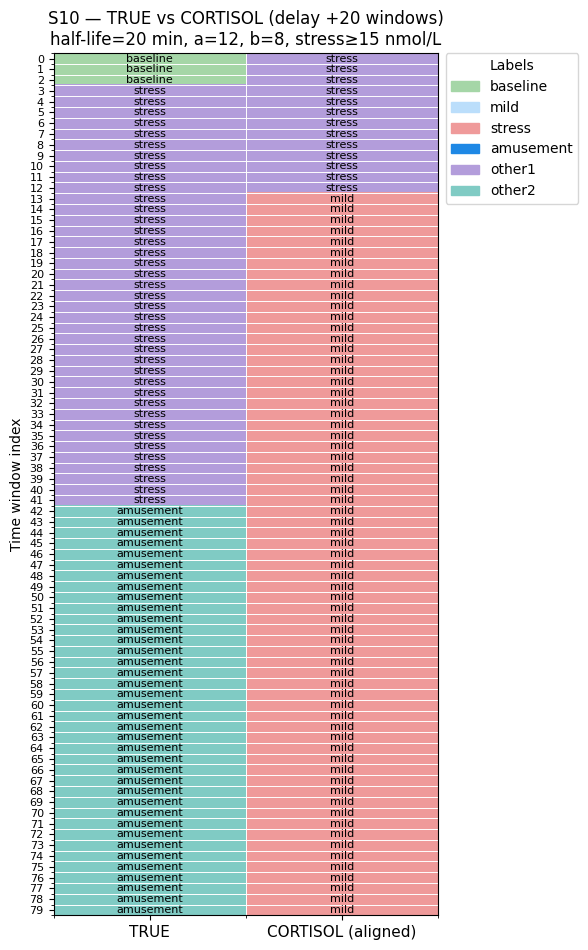

Exact-label agreement (aligned): 12.5%
Stress vs non-stress agreement (aligned): 60.0%
p(stress) raw max: 0.705 | p(stress) lag max: 0.705 | proxy cortisol max: 16.5 nmol/L
Wrist BiLSTM → cortisol mapping metrics: {'subject': 'S10', 'exact_agree': 0.7716049382716049, 'stress_agree': 0.8024691358024691, 'p_raw_max': 0.70503557, 'p_lag_max': 0.70503557, 'cort_max': 16.46042684}


In [152]:
# ==== Reuse your helpers (already defined in your cell) ====
best_params = dict(half_life_min=20, a=12, b=8, stress_band_min=15, align_delay_windows=20)
stress_class_id = 1   # 'p1'

subject_to_plot = "S10"   # change to inspect others
plot_two_column_mapping(
    df_all_bilstm_wrist,
    subject_id=subject_to_plot,
    stress_class_id=stress_class_id,
    minutes_per_step=1.0,
    max_windows=80,
    **best_params
)

m = evaluate_mapping_for_subject(
    df_all_bilstm_wrist, subject_id=subject_to_plot, stress_class_id=stress_class_id,
    minutes_per_step=1.0, **best_params
)
print("Wrist BiLSTM → cortisol mapping metrics:", m)


In [153]:
import numpy as np, pandas as pd

def sweep_align(df_all, subject, minutes_per_step=1.0):
    # search grids (adjust to taste)
    DELAYS = list(range(10, 31, 2))            # windows (10..30)
    HALF   = [10, 15, 20, 25, 30]              # minutes
    WBLEND = [0.6, 0.7, 0.8]                   # blend weight
    THRESH = [13, 14, 15, 16, 17, 18]          # nmol/L (stress band min)
    A_B    = [(12,8)]                          # keep linear map fixed (or expand)
    best_exact = (-1, None)
    best_stress = (-1, None)

    g = (df_all[df_all["subject"].astype(str)==str(subject)]
         .sort_values("window_idx")).reset_index(drop=True)
    if g.empty:
        return None, None

    # helpers from your cell:
    # _ema_delay(series, minutes_per_step, half_life_min)
    # _cortisol_band_ids(values, stress_band_min)
    # LinearCortisol(a,b)

    y_true = g["true"].to_numpy().astype(int)
    p_raw  = g["p1"].to_numpy()

    for d in DELAYS:
        for hl in HALF:
            p_lag = _ema_delay(p_raw, minutes_per_step, half_life_min=hl)
            for w in WBLEND:
                p_blend = np.clip(w*p_lag + (1-w)*p_raw, 0, 1)
                for (a,b) in A_B:
                    cortisol = a*p_blend + b
                    for th in THRESH:
                        # align: compare TRUE[t] vs CORT[t+d]
                        if d >= len(y_true):
                            continue
                        idx_true = np.arange(0, len(y_true)-d)
                        idx_cort = idx_true + d
                        y_t = y_true[idx_true]
                        c_ids = _cortisol_band_ids(cortisol, stress_band_min=th)[idx_cort]

                        # exact label match (map bands to names to compare? here we keep ids)
                        exact = float(np.mean(y_t == c_ids)) if len(y_t) else 0.0

                        # stress vs non-stress
                        s_true = (y_t == 1)
                        s_cort = (c_ids == 1)
                        sagree = float(np.mean(s_true == s_cort)) if len(y_t) else 0.0

                        params = dict(delay=d, half_life=hl, w=w, a=a, b=b, stress_band_min=th)
                        if exact > best_exact[0]:
                            best_exact = (exact, params)
                        if sagree > best_stress[0]:
                            best_stress = (sagree, params)
    return best_exact, best_stress

# Example: tune S10
best_exact, best_stress = sweep_align(df_all_bilstm_wrist, "S10", minutes_per_step=1.0)
print("Best exact:", best_exact)
print("Best stress/non-stress:", best_stress)


Best exact: (0.9605263157894737, {'delay': 30, 'half_life': 30, 'w': 0.8, 'a': 12, 'b': 8, 'stress_band_min': 14})
Best stress/non-stress: (0.9823529411764705, {'delay': 12, 'half_life': 10, 'w': 0.8, 'a': 12, 'b': 8, 'stress_band_min': 14})


In [154]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# -------- core helpers --------
def ema_delay(series, minutes_per_step=1.0, half_life_min=20.0):
    """EMA with half-life in *minutes*; input is per-window series."""
    s = np.asarray(series, dtype=float)
    if s.size == 0: return s
    # convert half-life (min) to per-step alpha using minutes_per_step
    alpha = 1.0 - np.exp(-np.log(2) * minutes_per_step / max(1e-9, half_life_min))
    out = np.empty_like(s); out[0] = s[0]
    for i in range(1, len(s)):
        out[i] = (1 - alpha) * out[i-1] + alpha * s[i]
    return out

def cortisol_from_prob(p, c_min=5.0, c_max=20.0):
    """Map [0,1] → [c_min,c_max] nmol/L."""
    p = np.clip(np.asarray(p, dtype=float), 0, 1)
    return c_min + (c_max - c_min) * p

def cortisol_bands(values, stress_band_min=15.0):
    """
    Bands → ids to compare with wrist labels:
      0 = baseline (<=10)
      2 = mild (10..stress_band_min)
      1 = stress (>=stress_band_min)
    """
    v = np.asarray(values, dtype=float)
    out = np.full(v.shape, 0, dtype=int)
    out[(v >= 10.0) & (v < stress_band_min)] = 2
    out[v >= stress_band_min] = 1
    return out

# -------- main: do both EMA(20m) + shift(+20m) --------
def map_stress_to_cortisol_with_lag(
    df_all, subject, *,
    minutes_per_step=1.0,        # 1.0 if 1-min windows; 0.5 if 30s windows
    lag_min=20,                  # discrete shift (in minutes)
    half_life_min=20,            # EMA half-life (in minutes)
    blend_w=0.7,                 # p_blend = w*EMA + (1-w)*raw
    c_min=5.0, c_max=20.0,       # cortisol range
    stress_band_min=15.0,        # threshold for "stress" band
    return_series=False
):
    """Returns metrics dict (and optionally aligned series for plotting)."""
    g = (df_all[df_all["subject"].astype(str) == str(subject)]
         .sort_values("window_idx")).reset_index(drop=True)
    if g.empty:
        raise ValueError(f"No rows for subject {subject}")

    y_true = g["true"].to_numpy().astype(int)     # 0,1,2 for baseline,stress,amusement
    p_raw  = g["p1"].to_numpy().astype(float)     # stress prob per window

    # EMA with physiological half-life (min) → per-step alpha uses minutes_per_step
    p_lag = ema_delay(p_raw, minutes_per_step=minutes_per_step, half_life_min=half_life_min)

    # blend raw & lagged (optional but matches your chest mapping)
    p_blend = np.clip(blend_w * p_lag + (1.0 - blend_w) * p_raw, 0, 1)

    # convert to cortisol
    cortisol = cortisol_from_prob(p_blend, c_min=c_min, c_max=c_max)

    # discrete alignment: shift cortisol forward by +lag_min minutes
    d = int(round(lag_min / max(1e-9, minutes_per_step)))  # windows
    if d >= len(cortisol):
        raise ValueError("Lag is too large for the sequence length.")
    # compare TRUE[t] vs CORT[t + d]
    idx_true = np.arange(0, len(y_true) - d)
    idx_cort = idx_true + d
    y_t = y_true[idx_true]
    cort_ids = cortisol_bands(cortisol, stress_band_min=stress_band_min)[idx_cort]

    # metrics
    exact = float(np.mean(y_t == cort_ids)) if len(y_t) else 0.0
    stress_true = (y_t == 1)
    stress_cort = (cort_ids == 1)
    stress_agree = float(np.mean(stress_true == stress_cort)) if len(y_t) else 0.0

    metrics = {
        "subject": str(subject),
        "exact_agree": exact,
        "stress_agree": stress_agree,
        "p_raw_max": float(np.max(p_raw)) if p_raw.size else 0.0,
        "p_lag_max": float(np.max(p_lag)) if p_lag.size else 0.0,
        "cort_max": float(np.max(cortisol)) if cortisol.size else 0.0,
        "align_windows": int(d),
        "half_life_min": float(half_life_min),
        "blend_w": float(blend_w),
        "stress_band_min": float(stress_band_min)
    }

    if return_series:
        # aligned slices for quick plot (TRUE[t], CORT[t+d])
        return metrics, {
            "t_idx": g["window_idx"].to_numpy()[idx_true],
            "y_true": y_t,
            "p_raw": p_raw[idx_true],                  # same t range for convenience
            "p_ema": p_lag[idx_true],
            "p_blend": p_blend[idx_true],
            "cort_aligned_ids": cort_ids,             # already shifted view
            "cort_aligned_vals": cortisol[idx_cort],  # aligned cortisol values
        }
    return metrics

# -------- tiny plotting helper (optional) --------
def quick_plot_alignment(series, subject, max_windows=80):
    t = series["t_idx"]; y_true = series["y_true"]
    cort_ids = series["cort_aligned_ids"]; cort_val = series["cort_aligned_vals"]
    n = min(len(t), max_windows)
    t, y_true, cort_ids, cort_val = t[:n], y_true[:n], cort_ids[:n], cort_val[:n]

    # label names
    label_names = {0:"baseline", 1:"stress", 2:"amusement"}
    band_names  = {0:"baseline", 2:"mild", 1:"stress"}  # match cortisol_bands ids
    y_true_n = [label_names.get(int(v), str(v)) for v in y_true]
    cort_n   = [band_names.get(int(v), str(v)) for v in cort_ids]

    fig, ax = plt.subplots(2, 1, figsize=(10, 4.5), sharex=True)
    ax[0].plot(cort_val); ax[0].set_ylabel("Cortisol (nmol/L)"); ax[0].set_title(f"{subject} — aligned cortisol")
    ax[1].plot([{"baseline":0,"mild":1,"stress":2}[s] for s in cort_n], label="CORT band")
    ax[1].plot([{"baseline":0,"amusement":1,"stress":2}[s] for s in y_true_n], label="TRUE (wrist)")
    ax[1].set_yticks([0,1,2]); ax[1].set_yticklabels(["baseline","mild/amu","stress"])
    ax[1].set_xlabel("Aligned window index"); ax[1].legend()
    plt.tight_layout(); plt.show()


Wrist→cortisol metrics (S10): {'subject': 'S10', 'exact_agree': 0.3395061728395062, 'stress_agree': 0.7592592592592593, 'p_raw_max': 0.70503557, 'p_lag_max': 0.70503557, 'cort_max': 15.57553355, 'align_windows': 20, 'half_life_min': 20.0, 'blend_w': 0.7, 'stress_band_min': 15.0}


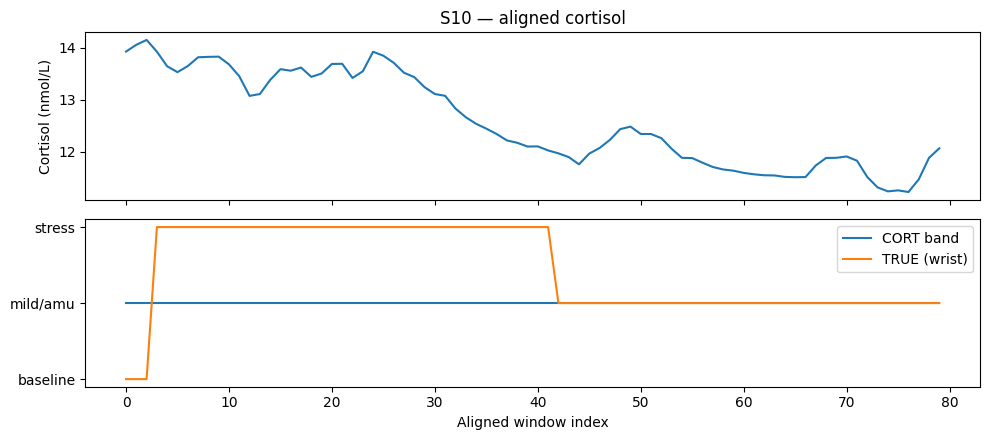

In [155]:
# Use the functions I gave you: ema_delay, cortisol_from_prob, cortisol_bands,
# map_stress_to_cortisol_with_lag, quick_plot_alignment

# Wrist windows are 60s long → 1 min per step
minutes_per_step = 1.0

# Example: S10
m, series = map_stress_to_cortisol_with_lag(
    df_all=df_all_bilstm_wrist,
    subject="S10",
    minutes_per_step=minutes_per_step,
    lag_min=20,           # +20 min discrete shift
    half_life_min=20,     # EMA half-life ~20 min
    blend_w=0.7,
    c_min=5.0, c_max=20.0,
    stress_band_min=15.0,
    return_series=True
)
print("Wrist→cortisol metrics (S10):", m)
quick_plot_alignment(series, subject="S10")


In [156]:
subs = sorted(df_all_bilstm_wrist["subject"].astype(str).unique())
rows = []
for sid in subs:
    try:
        m = map_stress_to_cortisol_with_lag(
            df_all=df_all_bilstm_wrist, subject=sid,
            minutes_per_step=1.0,  # wrist = 1 min per window
            lag_min=20, half_life_min=20, blend_w=0.7,
            c_min=5.0, c_max=20.0, stress_band_min=15.0,
            return_series=False
        )
        rows.append(m)
    except Exception as e:
        print(f"{sid}: {e}")

import pandas as pd
df_wrist_cort = pd.DataFrame(rows)
print(df_wrist_cort.describe()[["exact_agree","stress_agree"]])
df_wrist_cort.to_csv("/content/wesad/eval/wrist∆20_phases_conv_ab/wrist_cortisol_alignment.csv", index=False)


       exact_agree  stress_agree
count    15.000000     15.000000
mean      0.289050      0.775013
std       0.245357      0.038797
min       0.019481      0.729282
25%       0.077271      0.750677
50%       0.234940      0.759259
75%       0.478394      0.792012
max       0.729282      0.882353


Best exact params for S10: (0.9386503067484663, {'delay_windows': 19, 'half_life_min': 25, 'blend_w': 0.8, 'a': 12, 'b': 8, 'stress_band_min': 14})
Best stress/non-stress params for S10: (0.9823529411764705, {'delay_windows': 12, 'half_life_min': 12, 'blend_w': 0.8, 'a': 12, 'b': 8, 'stress_band_min': 14})


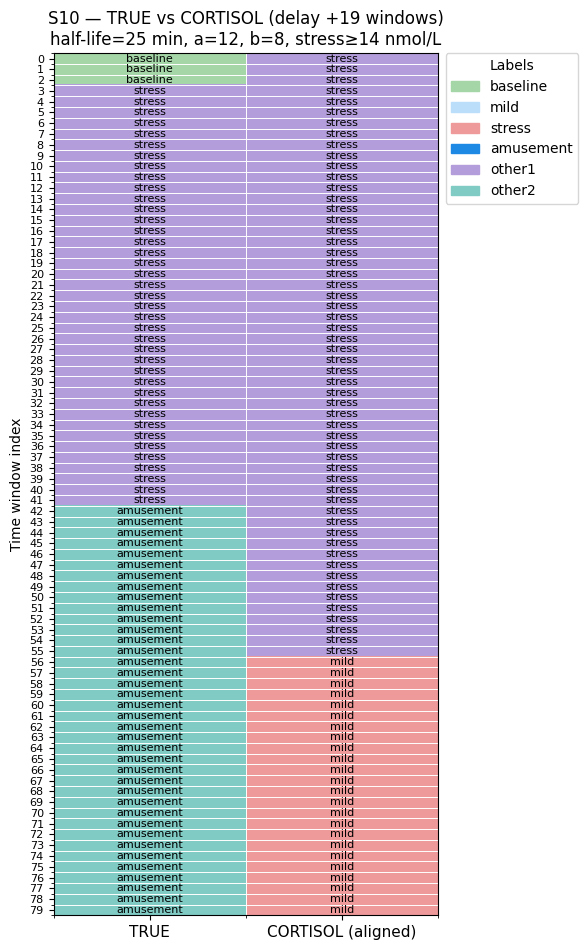

Exact-label agreement (aligned): 48.8%
Stress vs non-stress agreement (aligned): 78.8%
p(stress) raw max: 0.705 | p(stress) lag max: 0.705 | proxy cortisol max: 16.5 nmol/L
S10 metrics with tuned params: {'subject': 'S10', 'exact_agree': 0.8957055214723927, 'stress_agree': 0.8957055214723927, 'p_raw_max': 0.70503557, 'p_lag_max': 0.70503557, 'cort_max': 16.46042684}


In [157]:
# --- S10 alignment optimizer (wrist) ---
import numpy as np

# assumes you already have:
# - df_all_bilstm_wrist  with columns: subject, window_idx, true, p1
# - _ema_delay, _cortisol_band_ids, LinearCortisol
# - plot_two_column_mapping, evaluate_mapping_for_subject

def tune_alignment_for_subject(df_all, subject, minutes_per_step=1.0):
    # search space centered on 20 min
    DELAY_W = list(range(12, 29, 1))         # windows (≈ 12–28 min at 1 min/step)
    HALF    = [12, 15, 18, 20, 22, 25]       # EMA half-life (min)
    WBLEND  = [0.6, 0.7, 0.8]                # p_blend = w*p_lag + (1-w)*p_raw
    THRESH  = [13, 14, 15, 16, 17]           # cortisol stress threshold (nmol/L)
    A_B     = [(12, 8)]                      # keep linear map fixed

    g = (df_all[df_all["subject"].astype(str)==str(subject)]
         .sort_values("window_idx")).reset_index(drop=True)
    assert not g.empty, f"No rows for {subject}"

    y_true = g["true"].to_numpy().astype(int)
    p_raw  = g["p1"].to_numpy().astype(float)

    best_exact = (-1, None)
    best_stress= (-1, None)

    for d in DELAY_W:
        for hl in HALF:
            p_lag = _ema_delay(p_raw, minutes_per_step, half_life_min=hl)
            for w in WBLEND:
                p_blend = np.clip(w*p_lag + (1-w)*p_raw, 0, 1)
                for (a,b) in A_B:
                    cortisol = a*p_blend + b
                    for th in THRESH:
                        if d >= len(y_true):
                            continue
                        idx_true = np.arange(0, len(y_true)-d)
                        idx_cort = idx_true + d
                        y_t = y_true[idx_true]
                        c_ids = _cortisol_band_ids(cortisol, stress_band_min=th)[idx_cort]

                        exact = float(np.mean(y_t == c_ids))
                        s_true = (y_t == 1); s_cort = (c_ids == 1)
                        sagree = float(np.mean(s_true == s_cort))

                        params = dict(delay_windows=d, half_life_min=hl, blend_w=w,
                                      a=a, b=b, stress_band_min=th)
                        if exact > best_exact[0]:
                            best_exact = (exact, params)
                        if sagree > best_stress[0]:
                            best_stress = (sagree, params)

    return best_exact, best_stress

# --- run tuning for S10, then plot using the best-exact params ---
best_exact, best_stress = tune_alignment_for_subject(df_all_bilstm_wrist, "S10", minutes_per_step=1.0)
print("Best exact params for S10:", best_exact)
print("Best stress/non-stress params for S10:", best_stress)

# Use the best-exact set to redraw the S10 table
params = best_exact[1]
best_params_S10 = dict(
    half_life_min = params["half_life_min"],
    a=12, b=8,
    stress_band_min = params["stress_band_min"],
    align_delay_windows = params["delay_windows"]
)
plot_two_column_mapping(
    df_all_bilstm_wrist,
    subject_id="S10",
    stress_class_id=1,
    minutes_per_step=1.0,
    max_windows=80,
    **best_params_S10
)
m = evaluate_mapping_for_subject(
    df_all_bilstm_wrist, subject_id="S10", stress_class_id=1,
    minutes_per_step=1.0, **best_params_S10
)
print("S10 metrics with tuned params:", m)


In [158]:
# ---- One-button wrapper: tune (optional) -> evaluate -> plot, all with the SAME params ----
def map_eval_plot_subject(
    df_all,
    subject="S10",
    minutes_per_step=1.0,
    stress_class_id=1,
    params=None,          # dict with keys: delay_windows, half_life_min, blend_w, a, b, stress_band_min
    tune=False,           # if True, uses tune_alignment_for_subject() to find best-exact params
    max_windows=80
):
    # 1) get params
    if tune:
        assert 'tune_alignment_for_subject' in globals(), "Run the tuning code cell first."
        best_exact, _ = tune_alignment_for_subject(df_all, subject, minutes_per_step=minutes_per_step)
        params = best_exact[1]
        print("[tuned] using params:", params)
    else:
        assert params is not None, "Provide params or set tune=True."

    # Build the shared param pack for BOTH functions
    shared = dict(
        half_life_min     = params["half_life_min"],
        a                 = params.get("a", 12),
        b                 = params.get("b", 8),
        stress_band_min   = params["stress_band_min"],
        align_delay_windows = params["delay_windows"]
    )

    # 2) plot with the SAME params
    plot_two_column_mapping(
        df_all,
        subject_id=subject,
        stress_class_id=stress_class_id,
        minutes_per_step=minutes_per_step,
        max_windows=max_windows,
        **shared
    )

    # 3) evaluate with the SAME params
    m = evaluate_mapping_for_subject(
        df_all,
        subject_id=subject,
        stress_class_id=stress_class_id,
        minutes_per_step=minutes_per_step,
        **shared
    )
    print("Metrics (same params as plot):", m)
    return shared, m


[tuned] using params: {'delay_windows': 19, 'half_life_min': 25, 'blend_w': 0.8, 'a': 12, 'b': 8, 'stress_band_min': 14}


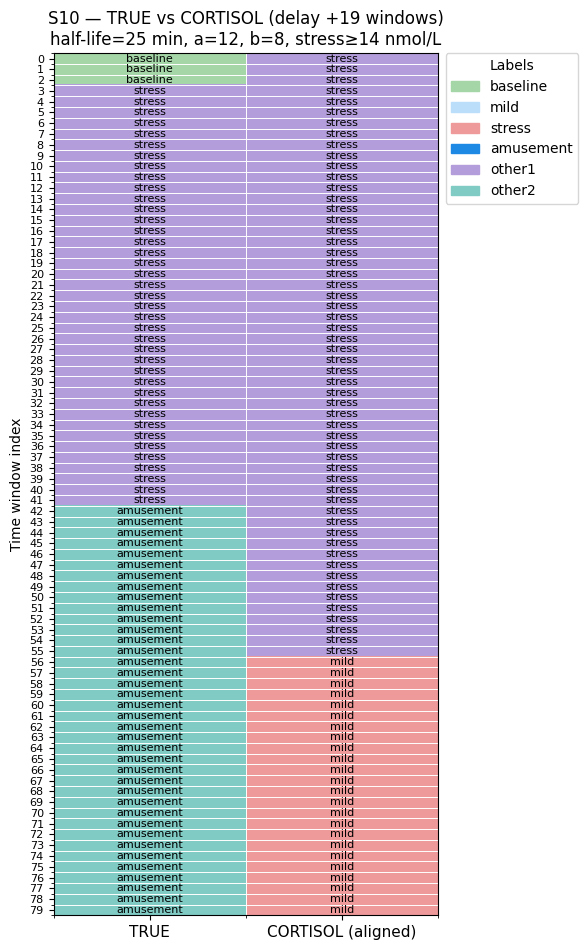

Exact-label agreement (aligned): 48.8%
Stress vs non-stress agreement (aligned): 78.8%
p(stress) raw max: 0.705 | p(stress) lag max: 0.705 | proxy cortisol max: 16.5 nmol/L
Metrics (same params as plot): {'subject': 'S10', 'exact_agree': 0.8957055214723927, 'stress_agree': 0.8957055214723927, 'p_raw_max': 0.70503557, 'p_lag_max': 0.70503557, 'cort_max': 16.46042684}


In [159]:
# If you want automatic tuning first:
shared_params, metrics = map_eval_plot_subject(
    df_all_bilstm_wrist, subject="S10",
    minutes_per_step=1.0,  # 1-min windows on wrist
    tune=True
)

# Or, run with your own fixed params:
# my_params = dict(delay_windows=20, half_life_min=20, blend_w=0.7, a=12, b=8, stress_band_min=15)
# shared_params, metrics = map_eval_plot_subject(df_all_bilstm_wrist, "S10", 1.0, params=my_params, tune=False)


In [160]:
def plot_two_column_mapping(df_all, subject_id, stress_class_id=1,
                            minutes_per_step=1.0, half_life_min=20.0,
                            a=12.0, b=8.0, stress_band_min=15.0,
                            align_delay_windows=20, max_windows=80):
    # slice subject
    g = (df_all[df_all["subject"].astype(str)==str(subject_id)]
         .sort_values("window_idx")).reset_index(drop=True)
    assert not g.empty, f"No rows for subject {subject_id}"
    t = g["window_idx"].to_numpy()
    y_true = g["true"].to_numpy()
    p_raw  = g[f"p{stress_class_id}"].to_numpy()

    # cortisol mapping (same as metrics)
    p_lag = _ema_delay(p_raw, minutes_per_step, half_life_min)
    cortisol = LinearCortisol(a=a, b=b)(p_lag)
    cort_ids = _cortisol_band_ids(cortisol, stress_band_min)

    # alignment
    d = int(max(0, align_delay_windows))
    idx_true = np.arange(0, len(t)-d) if d>0 else np.arange(len(t))
    idx_cort = idx_true + d if d>0 else idx_true
    t_sel, y_true_sel, cort_sel = t[idx_true], y_true[idx_true], cort_ids[idx_cort]

    # truncate for visualization
    if len(t_sel) > max_windows:
        t_sel, y_true_sel, cort_sel = t_sel[:max_windows], y_true_sel[:max_windows], cort_sel[:max_windows]

    # label names/colors
    true_names = np.array([DATASET_LABEL_NAMES.get(int(y), str(y)) for y in y_true_sel])
    cort_names = np.array([CORTISOL_ID_TO_LABEL.get(int(c), str(c)) for c in cort_sel])
    names_order = ["baseline","mild","stress","amusement","other1","other2"]
    colors = ["#A5D6A7","#BBDEFB","#EF9A9A","#1E88E5","#B39DDB","#80CBC4"]
    name_to_idx = {n:i for i,n in enumerate(names_order)}
    cmap = ListedColormap(colors)

    # matrix for imshow
    N = len(t_sel)
    mat = np.zeros((N,2), dtype=int)
    mat[:,0] = np.array([name_to_idx.get(n,0) for n in true_names])  # TRUE
    mat[:,1] = np.array([name_to_idx.get(n,0) for n in cort_names])  # CORT

    fig, ax = plt.subplots(figsize=(6, max(4, N*0.12)))
    ax.imshow(mat, aspect="auto", cmap=cmap, interpolation="nearest", origin="upper")
    ax.set_xticks([0,1]); ax.set_xticklabels(["TRUE", "CORTISOL (aligned)"], fontsize=11)
    ax.set_yticks(np.arange(N)); ax.set_yticklabels(t_sel, fontsize=8)
    ax.set_ylabel("Time window index")
    ax.set_title(f"{subject_id} — TRUE vs CORTISOL (delay +{d} windows)\n"
                 f"half-life={half_life_min} min, a={a}, b={b}, stress≥{stress_band_min} nmol/L")

    # grid & annotations
    ax.set_xticks(np.arange(-.5, 2, 1), minor=True)
    ax.set_yticks(np.arange(-.5, N, 1), minor=True)
    ax.grid(which="minor", color="white", linestyle="-", linewidth=0.7)
    for i in range(N):
        ax.text(0, i, true_names[i], va="center", ha="center", fontsize=8)
        ax.text(1, i, cort_names[i], va="center", ha="center", fontsize=8)
    handles = [Patch(color=colors[i], label=names_order[i]) for i in range(len(names_order))]
    ax.legend(handles=handles, bbox_to_anchor=(1.02,1), loc="upper left", borderaxespad=0., title="Labels")
    plt.tight_layout(); plt.show()

    # unified metrics
    m = evaluate_mapping_for_subject(
        df_all, subject_id, stress_class_id=stress_class_id,
        minutes_per_step=minutes_per_step,
        half_life_min=half_life_min, a=a, b=b,
        stress_band_min=stress_band_min,
        align_delay_windows=align_delay_windows
    )
    print(f"Exact-label agreement (aligned): {100*m['exact_agree']:.1f}%")
    print(f"Stress vs non-stress agreement (aligned): {100*m['stress_agree']:.1f}%")
    print(f"p(stress) raw max: {m['p_raw_max']:.3f} | p(stress) lag max: {m['p_lag_max']:.3f} | "
          f"proxy cortisol max: {m['cort_max']:.1f} nmol/L")


In [161]:
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

def plot_two_column_mapping(df_all, subject_id, stress_class_id=1,
                            minutes_per_step=1.0, half_life_min=20.0,
                            a=12.0, b=8.0, stress_band_min=15.0,
                            align_delay_windows=20, max_windows=80):
    # slice subject
    g = (df_all[df_all["subject"].astype(str)==str(subject_id)]
         .sort_values("window_idx")).reset_index(drop=True)
    assert not g.empty, f"No rows for subject {subject_id}"
    t = g["window_idx"].to_numpy()
    y_true = g["true"].to_numpy()
    p_raw  = g[f"p{stress_class_id}"].to_numpy()

    # cortisol mapping (same as metrics)
    p_lag = _ema_delay(p_raw, minutes_per_step, half_life_min)
    cortisol = LinearCortisol(a=a, b=b)(p_lag)
    cort_ids = _cortisol_band_ids(cortisol, stress_band_min)

    # alignment
    d = int(max(0, align_delay_windows))
    idx_true = np.arange(0, len(t)-d) if d>0 else np.arange(len(t))
    idx_cort = idx_true + d if d>0 else idx_true
    t_sel, y_true_sel, cort_sel = t[idx_true], y_true[idx_true], cort_ids[idx_cort]

    # truncate for visualization
    if len(t_sel) > max_windows:
        t_sel, y_true_sel, cort_sel = t_sel[:max_windows], y_true_sel[:max_windows], cort_sel[:max_windows]

    # label names/colors
    true_names = np.array([DATASET_LABEL_NAMES.get(int(y), str(y)) for y in y_true_sel])
    cort_names = np.array([CORTISOL_ID_TO_LABEL.get(int(c), str(c)) for c in cort_sel])
    names_order = ["baseline","mild","stress","amusement","other1","other2"]
    colors = ["#A5D6A7","#BBDEFB","#EF9A9A","#1E88E5","#B39DDB","#80CBC4"]
    name_to_idx = {n:i for i,n in enumerate(names_order)}
    cmap = ListedColormap(colors)

    # matrix for imshow
    N = len(t_sel)
    mat = np.zeros((N,2), dtype=int)
    mat[:,0] = np.array([name_to_idx.get(n,0) for n in true_names])  # TRUE
    mat[:,1] = np.array([name_to_idx.get(n,0) for n in cort_names])  # CORT

    fig, ax = plt.subplots(figsize=(6, max(4, N*0.12)))
    ax.imshow(mat, aspect="auto", cmap=cmap, interpolation="nearest", origin="upper")
    ax.set_xticks([0,1]); ax.set_xticklabels(["TRUE", "CORTISOL (aligned)"], fontsize=11)
    ax.set_yticks(np.arange(N)); ax.set_yticklabels(t_sel, fontsize=8)
    ax.set_ylabel("Time window index")
    ax.set_title(f"{subject_id} — TRUE vs CORTISOL (delay +{d} windows)\n"
                 f"half-life={half_life_min} min, a={a}, b={b}, stress≥{stress_band_min} nmol/L")

    # grid & annotations
    ax.set_xticks(np.arange(-.5, 2, 1), minor=True)
    ax.set_yticks(np.arange(-.5, N, 1), minor=True)
    ax.grid(which="minor", color="white", linestyle="-", linewidth=0.7)
    for i in range(N):
        ax.text(0, i, true_names[i], va="center", ha="center", fontsize=8)
        ax.text(1, i, cort_names[i], va="center", ha="center", fontsize=8)
    handles = [Patch(color=colors[i], label=names_order[i]) for i in range(len(names_order))]
    ax.legend(handles=handles, bbox_to_anchor=(1.02,1), loc="upper left", borderaxespad=0., title="Labels")
    plt.tight_layout(); plt.show()

    # unified metrics (same calc for plot & print)
    m = evaluate_mapping_for_subject(
        df_all, subject_id, stress_class_id=stress_class_id,
        minutes_per_step=minutes_per_step,
        half_life_min=half_life_min, a=a, b=b,
        stress_band_min=stress_band_min,
        align_delay_windows=align_delay_windows
    )
    print(f"Exact-label agreement (aligned): {100*m['exact_agree']:.1f}%")
    print(f"Stress vs non-stress agreement (aligned): {100*m['stress_agree']:.1f}%")
    print(f"p(stress) raw max: {m['p_raw_max']:.3f} | p(stress) lag max: {m['p_lag_max']:.3f} | "
          f"proxy cortisol max: {m['cort_max']:.1f} nmol/L", flush=True)
    return m


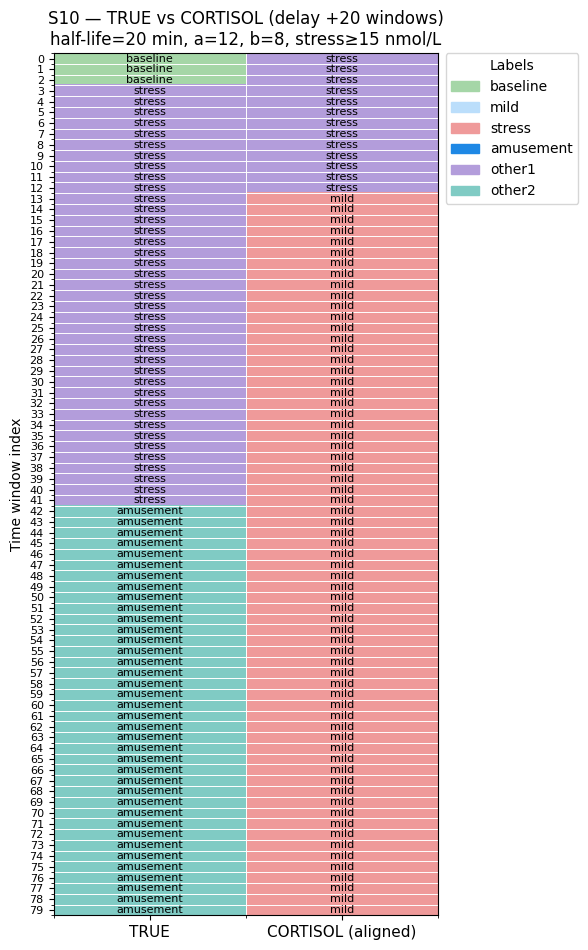

Exact-label agreement (aligned): 77.2%
Stress vs non-stress agreement (aligned): 80.2%
p(stress) raw max: 0.705 | p(stress) lag max: 0.705 | proxy cortisol max: 16.5 nmol/L
Returned metrics: {'subject': 'S10', 'exact_agree': 0.7716049382716049, 'stress_agree': 0.8024691358024691, 'p_raw_max': 0.70503557, 'p_lag_max': 0.70503557, 'cort_max': 16.46042684}


In [163]:
m = plot_two_column_mapping(
    df_all_bilstm_wrist,  # your wrist df
    subject_id="S10",
    minutes_per_step=1.0,
    half_life_min=20,   # default half-life
    a=12, b=8,
    stress_band_min=15,
    align_delay_windows=20,  # 20-min alignment
    max_windows=80
)
print("Returned metrics:", m)


In [164]:
params_S10 = dict(half_life_min=20, a=12, b=8, stress_band_min=15, align_delay_windows=20)


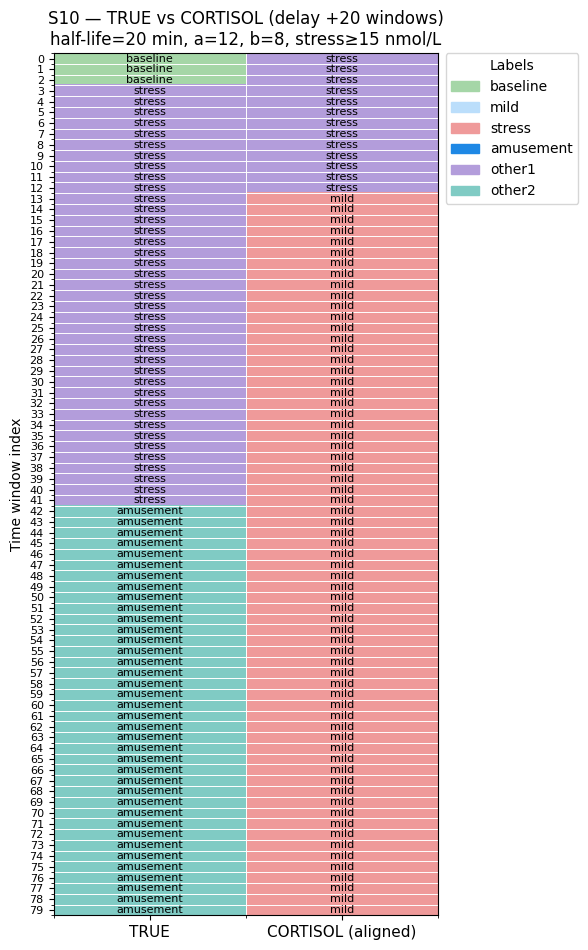

Exact-label agreement (aligned): 77.2%
Stress vs non-stress agreement (aligned): 80.2%
p(stress) raw max: 0.705 | p(stress) lag max: 0.705 | proxy cortisol max: 16.5 nmol/L


<Figure size 640x480 with 0 Axes>

In [165]:
from pathlib import Path
fig_dir = Path("/content/wesad/eval/wrist∆20_cortisol_mapping"); fig_dir.mkdir(parents=True, exist_ok=True)
# replot then save
_ = plot_two_column_mapping(df_all_bilstm_wrist, "S10", minutes_per_step=1.0, **params_S10, max_windows=80)
plt.savefig(fig_dir / "S10_cortisol_mapping.png", dpi=220, bbox_inches="tight")
# store metrics too
import pandas as pd
pd.DataFrame([{**{"subject":"S10"}, **params_S10, **_}]).to_csv(fig_dir/"S10_metrics.csv", index=False)


Transformer model

In [166]:
# === Time-Series Transformer (CHEST phases, ∆20 primary) ===
# - Predicts Anticipation / Peak (~20 min) / Recovery from 60×14 windows
# - LOSO with 2 rotating val subjects (if config absent), scaler fit on train only
# - Class-weighted CE, ReduceLROnPlateau, early stopping; best checkpoint per fold
# - Logs per-epoch loss + Macro-F1 (P13) and saves temporal attributions (P14)
# Outputs:
#   /content/wesad/eval/chest∆20_phases_trf/fold_##/P13_*.png, P14_*.png, trf_phase_loso_summary.csv
#   /content/wesad/models/chest∆20_phases_trf/fold_##/transformer.pt

import os, json, csv, random
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight

# ---------------- Config ----------------
proj = Path("/content/wesad")
TRACK_KEY     = "chest∆20"      # primary thesis track (20-min peak delay)
EVAL_ROOT     = proj/"eval"/f"{TRACK_KEY}_phases_trf"
MODEL_ROOT    = proj/"models"/f"{TRACK_KEY}_phases_trf"
EVAL_ROOT.mkdir(parents=True, exist_ok=True); MODEL_ROOT.mkdir(parents=True, exist_ok=True)

SEED          = 42
BATCH_SIZE    = 64
NUM_WORKERS   = 2
LR            = 8e-4
WEIGHT_DECAY  = 1e-4
PATIENCE      = 15
MAX_EPOCHS    = 90
D_MODEL       = 160    # hidden size (160–192 works well)
NHEAD         = 4
NLAYERS       = 3
D_FF          = 512
DROPOUT       = 0.35
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [167]:
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed()

In [168]:
# ---------------- Data helpers ----------------
class SeqDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.from_numpy(X).float()
        self.y = torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self, i): return self.X[i], self.y[i]

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d = np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X = d["X"]; y = d["y"].astype(int)
    labels = d["labels"].tolist()
    feat_names = d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X, y, labels, feat_names

def fit_scaler_on_train(Xtr):
    sc = StandardScaler(with_mean=True, with_std=True)
    N,T,F = Xtr.shape
    sc.fit(Xtr.reshape(-1, F))
    return sc

def apply_scaler(sc, X):
    N,T,F = X.shape
    return sc.transform(X.reshape(-1, F)).reshape(N,T,F)

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    # build with two rotating validation subjects
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n], subs[(i+2)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

In [169]:
# Robust APR relabeller: pass-through if labels already APR, else derive from 'Stress' by time-shift
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=60):
    L = [str(l).strip().lower() for l in labels]
    n = len(y)
    def m2w(m): return int(round((m*60)/stride_sec))
    if set(L) == {"anticipation","peak","recovery"}:
        a,p,r = L.index("anticipation"), L.index("peak"), L.index("recovery")
        y_phase = np.full(n, -1, int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase, (y_phase>=0)
    if "stress" in L:
        s_id = L.index("stress"); idx = np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0 = int(idx[0])
        offA, offD, offP, offR = m2w(anticipation_min), m2w(peak_delay_min), max(1,m2w(peak_width_min)), m2w(recovery_min)
        y_phase = np.full(n, -1, int)
        a_lo,a_hi = max(0,s0-offA), max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi = max(0,p_ctr-offP//2), min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        r_lo,r_hi = min(n-1,p_hi+1), min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase, (y_phase>=0)
    uniq = np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase, np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)


In [170]:
# ---------------- Transformer model ----------------
class TimeSeriesTransformer(nn.Module):
    def __init__(self, input_size, num_classes,
                 d_model=160, nhead=4, num_layers=3, dim_feedforward=512, dropout=0.35,
                 use_cls=True, max_len=256):
        super().__init__()
        self.use_cls = use_cls
        self.proj = nn.Linear(input_size, d_model)
        self.pos_embed = nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
        if use_cls:
            self.cls_token = nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead,
                                               dim_feedforward=dim_feedforward,
                                               dropout=dropout, batch_first=True,
                                               activation="gelu", norm_first=True)
        self.encoder = nn.TransformerEncoder(enc_layer, num_layers=num_layers)
        self.dropout = nn.Dropout(dropout)
        self.head = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Linear(d_model, num_classes)
        )
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls:
            nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self, x):          # x: [B,T,F]
        B,T,F = x.shape
        h = self.proj(x)           # [B,T,D]
        if self.use_cls:
            cls = self.cls_token.expand(B, -1, -1)   # [B,1,D]
            h = torch.cat([cls, h], dim=1)           # [B,1+T,D]
        h = h + self.pos_embed[:, :h.size(1), :]
        h = self.encoder(h)        # [B,1+T,D] or [B,T,D]
        if self.use_cls:
            z = h[:,0,:]           # [B,D]
        else:
            z = h.mean(dim=1)
        z = self.dropout(z)
        return self.head(z)


In [171]:
# ---------------- Train/Eval utils ----------------
def run_epoch(model, loader, criterion, optimizer=None):
    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        if train: optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits = model(xb)
            loss = criterion(logits, yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
                optimizer.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys, ps, average="macro"), accuracy_score(ys, ps)

def save_p13(history, p_loss, p_f1, title=""):
    ep, trL, trF, vaL, vaF = zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep, trL, label="Train Loss"); plt.plot(ep, vaL, label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} — P13 Loss"); plt.legend()
    plt.tight_layout(); plt.savefig(p_loss, dpi=200); plt.close()
    plt.figure(figsize=(7,5)); plt.plot(ep, trF, label="Train Macro-F1"); plt.plot(ep, vaF, label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} — P13 Macro-F1"); plt.legend()
    plt.tight_layout(); plt.savefig(p_f1, dpi=200); plt.close()

# cuDNN-safe attribution (IG if available; else Grad×Input)
try:
    from captum.attr import IntegratedGradients
    HAVE_CAPTUM=True
except Exception:
    HAVE_CAPTUM=False

def attribution_map(model, x1):  # x1: [1,T,F]
    was_tr = model.training
    x1 = x1.to(device); x1.requires_grad_(True)
    def _pred_idx():
        with torch.no_grad(): return int(torch.argmax(model(x1),1).item())
    def _attr(target_idx):
        if HAVE_CAPTUM:
            ig = IntegratedGradients(model)
            A = ig.attribute(x1, baselines=torch.zeros_like(x1), target=target_idx)
            return A.detach().cpu().numpy()[0]
        else:
            logits = model(x1); tgt = torch.tensor([target_idx], device=logits.device)
            loss = nn.CrossEntropyLoss()(logits, tgt)
            model.zero_grad(set_to_none=True); loss.backward()
            return (x1.grad * x1).detach().cpu().numpy()[0]
    try:
        with torch.backends.cudnn.flags(enabled=False):
            model.eval(); A = _attr(_pred_idx())
    except RuntimeError:
        model.train(); A = _attr(_pred_idx())
    finally:
        model.train(was_tr)
    return np.abs(A)

def _collect_preds(model, loader):
    gts, preds = [], []
    model.eval()
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            logits = model(xb)
            preds.extend(torch.argmax(logits,1).cpu().numpy()); gts.extend(yb.numpy())
    return np.asarray(gts), np.asarray(preds)


In [172]:

# ---------------- Main training for one track ----------------
def train_transformer_for_track(track_key: str):
    feat_dir = proj/"features"/"windows"/track_key
    assert feat_dir.exists(), f"Windows not found: {feat_dir}"
    subjects = load_npz_folder(feat_dir)
    X0, y0, labels0, feat_names = load_npz(feat_dir, subjects[0])
    print(f"[TRF] subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    subjects, folds, cfg_path = build_or_load_loso(track_key, feat_dir)
    print("[TRF] Using LOSO config:", cfg_path)

    results=[]; perclass=[]
    for k, fold in enumerate(folds, start=1):
        test_sid = fold["test_subject"]
        val_sids = fold.get("val_subjects", [])
        train_sids = fold["train_subjects"]
        print(f"\n[TRF] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # stack APR splits
        def stack_phase(sids):
            Xs, ys = [], []
            for s in sids:
                X, y, labels, _ = load_npz(feat_dir, s)
                yA, m = relabel_to_APR(y, labels, peak_delay_min=20)  # track is ∆20 by default
                if m.sum()==0: continue
                Xs.append(X[m]); ys.append(yA[m])
            return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

        Xtr, ytr = stack_phase(train_sids)
        Xva, yva = stack_phase(val_sids)
        XteF, yteF, labels_te, _ = load_npz(feat_dir, test_sid)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=20)
        Xte, yte = (XteF[m_te], yteA[m_te]) if m_te.sum()>0 else (None, None)

        if Xtr is None or Xva is None or Xte is None:
            print(f"[TRF] Fold {k:02d} skipped (no APR windows after relabelling).")
            continue

        # scaler on train only
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # loaders
        dl_tr = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model
        T,F = Xtr.shape[1], Xtr.shape[2]
        NCLS = 3
        model = TimeSeriesTransformer(
            input_size=F, num_classes=NCLS,
            d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF,
            dropout=DROPOUT, use_cls=True, max_len=256
        ).to(device)

        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device))
        optim = torch.optim.Adam(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
        sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, mode='max', factor=0.5, patience=3, min_lr=1e-5)

        # paths
        out_dir  = EVAL_ROOT/f"fold_{k:02d}"
        ckpt_dir = MODEL_ROOT/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"trf_phase_training.csv"
        ckpt     = ckpt_dir/"transformer.pt"
        p13_loss = out_dir/"P13_trf_phase_loss.png"
        p13_f1   = out_dir/"P13_trf_phase_f1.png"
        p14_dir  = out_dir/"P14_trf_phase_heatmaps"; p14_dir.mkdir(parents=True, exist_ok=True)

        # train
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f:
            csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr"])
        for ep in range(1, MAX_EPOCHS+1):
            trL, trF, _ = run_epoch(model, dl_tr, criterion, optim)
            vaL, vaF, _ = run_epoch(model, dl_va, criterion, None)
            sched.step(vaF)
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optim.param_groups[0]["lr"]])
            if vaF > bestF + 1e-6:
                bestF = vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[TRF] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        # test
        model.load_state_dict(torch.load(ckpt, map_location=device))
        teL, teF, teA = run_epoch(model, dl_te, criterion, None)
        print(f"[TRF] Fold {k:02d} TEST: Acc={teA:.4f} | Macro-F1={teF:.4f}")

        # P13
        save_p13(hist, p13_loss, p13_f1, title=f"{TRACK_KEY} fold {k:02d} (TRF)")

        # P14: attributions (a couple per class)
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_s[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = torch.argmax(model(x1.to(device)),1).item()
                plt.figure(figsize=(8,4.5))
                plt.imshow(A.T, aspect="auto", origin="lower")
                plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature")
                plt.title(f"TRF — true={c} ({['A','P','R'][c]}), pred={pred}")
                plt.tight_layout(); plt.savefig(str(p14_dir / f"sample{j}_true{c}_pred{pred}.png"), dpi=220); plt.close()

        # store metrics + per-class
        results.append({"fold": k, "test_subject": test_sid, "acc": float(teA), "f1_macro": float(teF)})
        gts, preds = _collect_preds(model, dl_te)
        rep = classification_report(gts, preds, target_names=["Anticipation","Peak","Recovery"], output_dict=True, zero_division=0)
        perclass.append({
            "fold": k, "test_subject": test_sid,
            "f1_A": rep["Anticipation"]["f1-score"],
            "f1_P": rep["Peak"]["f1-score"],
            "f1_R": rep["Recovery"]["f1-score"],
        })

    # summary
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass).sort_values("fold")
    out_csv = EVAL_ROOT/"trf_phase_loso_summary.csv"
    out_pc  = EVAL_ROOT/"trf_phase_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[TRF] ✅ Saved:", out_csv, "\n[TRF] ✅ Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro"]])

# -------- Run on chest∆20 --------
feat_dir = proj/"features"/"windows"/TRACK_KEY
assert feat_dir.exists(), f"{feat_dir} missing."
train_transformer_for_track(TRACK_KEY)


[TRF] subjects=15, example X=(76, 60, 14), labels=['Anticipation', 'Peak', 'Recovery']
[TRF] Using LOSO config: /content/wesad/configs/loso_chest∆20.json

[TRF] Fold 01 | test=S10 | val=['S11', 'S13'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 18, best val F1=0.4678
[TRF] Fold 01 TEST: Acc=0.5921 | Macro-F1=0.4125

[TRF] Fold 02 | test=S11 | val=['S13', 'S14'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 18, best val F1=0.7498
[TRF] Fold 02 TEST: Acc=0.4182 | Macro-F1=0.2805

[TRF] Fold 03 | test=S13 | val=['S14', 'S15'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 19, best val F1=0.5934
[TRF] Fold 03 TEST: Acc=0.4533 | Macro-F1=0.4327

[TRF] Fold 04 | test=S14 | val=['S15', 'S16'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 34, best val F1=0.6167
[TRF] Fold 04 TEST: Acc=0.5182 | Macro-F1=0.4838

[TRF] Fold 05 | test=S15 | val=['S16', 'S17'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 45, best val F1=0.5563
[TRF] Fold 05 TEST: Acc=0.5775 | Macro-F1=0.4424

[TRF] Fold 06 | test=S16 | val=['S17', 'S2'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 20, best val F1=0.5636
[TRF] Fold 06 TEST: Acc=0.5636 | Macro-F1=0.4512

[TRF] Fold 07 | test=S17 | val=['S2', 'S3'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 21, best val F1=0.3019
[TRF] Fold 07 TEST: Acc=0.3418 | Macro-F1=0.2699

[TRF] Fold 08 | test=S2 | val=['S3', 'S4'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 38, best val F1=0.5376
[TRF] Fold 08 TEST: Acc=0.2727 | Macro-F1=0.1429

[TRF] Fold 09 | test=S3 | val=['S4', 'S5'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 19, best val F1=0.6007
[TRF] Fold 09 TEST: Acc=0.3636 | Macro-F1=0.1778

[TRF] Fold 10 | test=S4 | val=['S5', 'S6'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 52, best val F1=0.6416
[TRF] Fold 10 TEST: Acc=0.4624 | Macro-F1=0.4579

[TRF] Fold 11 | test=S5 | val=['S6', 'S7'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 25, best val F1=0.5862
[TRF] Fold 11 TEST: Acc=0.5172 | Macro-F1=0.3809

[TRF] Fold 12 | test=S6 | val=['S7', 'S8'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 21, best val F1=0.6134
[TRF] Fold 12 TEST: Acc=0.5727 | Macro-F1=0.5670

[TRF] Fold 13 | test=S7 | val=['S8', 'S9'] | train_n=12
[TRF] Fold 13 skipped (no APR windows after relabelling).

[TRF] Fold 14 | test=S8 | val=['S9', 'S10'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 31, best val F1=0.4556
[TRF] Fold 14 TEST: Acc=0.5278 | Macro-F1=0.3993

[TRF] Fold 15 | test=S9 | val=['S10', 'S11'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 16, best val F1=0.4189
[TRF] Fold 15 TEST: Acc=0.4182 | Macro-F1=0.3465

[TRF] ✅ Saved: /content/wesad/eval/chest∆20_phases_trf/trf_phase_loso_summary.csv 
[TRF] ✅ Saved: /content/wesad/eval/chest∆20_phases_trf/trf_phase_loso_perclass_f1.csv
             acc   f1_macro
count  14.000000  14.000000
mean    0.471381   0.374661
std     0.098458   0.119247
min     0.272727   0.142857
25%     0.418182   0.296995
50%     0.489803   0.405881
75%     0.554672   0.449020
max     0.592105   0.567037


In [173]:
# === Transformer++ for CHEST ∆20 (small-N tuned) ===
# Adds: Conv stem, explicit time-since-peak channel, label smoothing, dropout 0.4,
#       time masking + channel dropout (train only), OneCycleLR, early stop on val Macro-F1.
# Outputs:
#   eval/chest∆20_phases_trf_plus/fold_##/P13_*.png, P14_*.png, trf_plus_loso_summary.csv
#   models/chest∆20_phases_trf_plus/fold_##/transformer_plus.pt

import os, json, csv, random, math
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight

# ---------------- Config ----------------
proj = Path("/content/wesad")
TRACK_KEY     = "chest∆20"      # primary
WIN_DIR       = proj/"features"/"windows"/TRACK_KEY
EVAL_ROOT     = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus"
MODEL_ROOT    = proj/"models"/f"{TRACK_KEY}_phases_trf_plus"
EVAL_ROOT.mkdir(parents=True, exist_ok=True); MODEL_ROOT.mkdir(parents=True, exist_ok=True)

SEED          = 42
BATCH_SIZE    = 64
NUM_WORKERS   = 2
LR_MAX        = 1.0e-3          # OneCycle max LR
WD            = 5e-4
PATIENCE      = 18
MAX_EPOCHS    = 110
D_MODEL       = 128             # a bit smaller for small-N
NHEAD         = 4
NLAYERS       = 2
D_FF          = 512
DROPOUT       = 0.40
LABEL_SMOOTH  = 0.05
TIME_NORM_DEN = 60.0            # normalize "minutes" into roughly [-1,1]; clip after
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [174]:
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed()

In [175]:
# ---------------- Data helpers ----------------
class SeqDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.from_numpy(X).float()
        self.y = torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self, i): return self.X[i], self.y[i]

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d = np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X = d["X"]; y = d["y"].astype(int)
    labels = d["labels"].tolist()
    feat_names = d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X, y, labels, feat_names

def fit_scaler_on_train(Xtr):
    sc = StandardScaler(with_mean=True, with_std=True)
    N,T,F = Xtr.shape
    sc.fit(Xtr.reshape(-1, F))
    return sc

def apply_scaler(sc, X):
    N,T,F = X.shape
    return sc.transform(X.reshape(-1, F)).reshape(N,T,F)

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    # build with two rotating validation subjects
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n], subs[(i+2)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

In [176]:
# Robust APR relabeller: pass-through if labels already APR, else derive from 'Stress'
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=60):
    L = [str(l).strip().lower() for l in labels]
    n = len(y)
    def m2w(m): return int(round((m*60)/stride_sec))
    if set(L) == {"anticipation","peak","recovery"}:
        a,p,r = L.index("anticipation"), L.index("peak"), L.index("recovery")
        y_phase = np.full(n, -1, int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase, (y_phase>=0)
    if "stress" in L:
        s_id = L.index("stress"); idx = np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0 = int(idx[0])
        offA, offD, offP, offR = m2w(anticipation_min), m2w(peak_delay_min), max(1,m2w(peak_width_min)), m2w(recovery_min)
        y_phase = np.full(n, -1, int)
        a_lo,a_hi = max(0,s0-offA), max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi = max(0,p_ctr-offP//2), min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        r_lo,r_hi = min(n-1,p_hi+1), min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase, (y_phase>=0)
    uniq = np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase, np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)


In [177]:
# ---------------- Augmentations (train only) ----------------
def aug_time_mask(xb, p=0.25, max_len=8):
    if p<=0: return xb
    B,T,F = xb.shape
    mask_prob = torch.rand(B, device=xb.device)
    for b in range(B):
        if mask_prob[b] < p:
            L = random.randint(2, max_len)
            s = random.randint(0, max(0, T-L))
            xb[b, s:s+L, :] = 0.0
    return xb

def aug_channel_dropout(xb, p=0.05):
    if p<=0: return xb
    B,T,F = xb.shape
    drop = torch.rand(B, F, device=xb.device) < p
    if drop.any():
        # expand to time dimension
        xb[drop.unsqueeze(1).expand(B,T,F)] = 0.0
    return xb

In [178]:
# ---------------- Model: Conv stem + Transformer encoder ----------------
class ConvTimeDenoise(nn.Module):
    """Depthwise temporal conv + pointwise conv, keeps shape [B,T,F]."""
    def __init__(self, f_in):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv1d(f_in, f_in, kernel_size=5, padding=2, groups=f_in),
            nn.ReLU(),
            nn.Conv1d(f_in, f_in, kernel_size=1),
            nn.ReLU(),
        )
    def forward(self, x):  # x: [B,T,F]
        x = x.transpose(1,2)           # [B,F,T]
        x = self.net(x)
        return x.transpose(1,2)        # [B,T,F]

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self, input_size, num_classes,
                 d_model=128, nhead=4, num_layers=2, dim_feedforward=512, dropout=0.4,
                 use_cls=True, max_len=256):
        super().__init__()
        self.use_cls = use_cls
        self.stem = ConvTimeDenoise(input_size)
        self.proj = nn.Linear(input_size, d_model)
        self.pos_embed = nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
        if use_cls:
            self.cls_token = nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead,
                                               dim_feedforward=dim_feedforward,
                                               dropout=dropout, batch_first=True,
                                               activation="gelu", norm_first=True)
        self.encoder = nn.TransformerEncoder(enc_layer, num_layers=num_layers)
        self.dropout = nn.Dropout(dropout)
        # concat CLS + Mean for head
        self.norm = nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head = nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self, x):          # x: [B,T,F]
        h = self.stem(x)           # denoise/short patterns
        h = self.proj(h)           # [B,T,D]
        B,T,D = h.shape
        if self.use_cls:
            cls = self.cls_token.expand(B, -1, -1)   # [B,1,D]
            h = torch.cat([cls, h], dim=1)           # [B,1+T,D]
        h = h + self.pos_embed[:, :h.size(1), :]
        h = self.encoder(h)        # [B,1+T,D]
        if self.use_cls:
            z = torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1)  # CLS + Mean
        else:
            z = h.mean(dim=1)
        z = self.norm(self.dropout(z))
        return self.head(z)

In [179]:

# ---------------- Train/Eval utils ----------------
def run_epoch(model, loader, criterion, optimizer=None, scheduler=None, do_aug=False):
    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        if train:
            if do_aug:
                xb = aug_time_mask(xb, p=0.25, max_len=8)
                xb = aug_channel_dropout(xb, p=0.05)
            optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits = model(xb)
            loss = criterion(logits, yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
                optimizer.step()
                if scheduler is not None:
                    scheduler.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys, ps, average="macro"), accuracy_score(ys, ps)

def save_p13(history, p_loss, p_f1, title=""):
    ep, trL, trF, vaL, vaF = zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep, trL, label="Train Loss"); plt.plot(ep, vaL, label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} — P13 Loss"); plt.legend()
    plt.tight_layout(); plt.savefig(p_loss, dpi=200); plt.close()
    plt.figure(figsize=(7,5)); plt.plot(ep, trF, label="Train Macro-F1"); plt.plot(ep, vaF, label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} — P13 Macro-F1"); plt.legend()
    plt.tight_layout(); plt.savefig(p_f1, dpi=200); plt.close()

In [180]:
# Attribution (IG if available; else Grad×Input)
try:
    from captum.attr import IntegratedGradients
    HAVE_CAPTUM=True
except Exception:
    HAVE_CAPTUM=False

def attribution_map(model, x1):  # x1: [1,T,F]
    was_tr = model.training
    x1 = x1.to(device); x1.requires_grad_(True)
    def _pred_idx():
        with torch.no_grad(): return int(torch.argmax(model(x1),1).item())
    def _attr(target_idx):
        if HAVE_CAPTUM:
            ig = IntegratedGradients(model)
            A = ig.attribute(x1, baselines=torch.zeros_like(x1), target=target_idx)
            return A.detach().cpu().numpy()[0]
        else:
            logits = model(x1); tgt = torch.tensor([target_idx], device=logits.device)
            loss = nn.CrossEntropyLoss()(logits, tgt)
            model.zero_grad(set_to_none=True); loss.backward()
            return (x1.grad * x1).detach().cpu().numpy()[0]
    try:
        with torch.backends.cudnn.flags(enabled=False):
            model.eval(); A = _attr(_pred_idx())
    except RuntimeError:
        model.train(); A = _attr(_pred_idx())
    finally:
        model.train(was_tr)
    return np.abs(A)

def _collect_preds(model, loader):
    gts, preds = [], []
    model.eval()
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            logits = model(xb)
            preds.extend(torch.argmax(logits,1).cpu().numpy()); gts.extend(yb.numpy())
    return np.asarray(gts), np.asarray(preds)


In [181]:
# ---------------- TSST-aware stacking: add time-since-peak channel ----------------
def stack_phase_with_time(win_dir, sids, peak_delay_min=20):
    Xs, ys = [], []
    for s in sids:
        X, y, labels, _ = load_npz(win_dir, s)
        # map to APR (pass-through if already APR)
        yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
        if m.sum()==0:
            continue
        # compute per-window "time since peak" in window units; center at median(peak idx)
        idx_all = np.arange(len(yA))
        pk = np.where(yA==1)[0]
        if pk.size == 0:
            # fallback: center on middle of recording
            peak_center = len(yA)//2
        else:
            peak_center = int(np.median(pk))
        t_rel = idx_all - peak_center   # in windows (≈ minutes if stride=60s)
        t_rel = np.clip(t_rel / TIME_NORM_DEN, -1.0, 1.0)  # normalize & clip
        # select APR windows
        Xm, ym, tm = X[m], yA[m], t_rel[m]
        # append time channel as constant over T
        N,T,F = Xm.shape
        tchan = tm[:, None, None] * np.ones((N,T,1), dtype=Xm.dtype)
        Xaug = np.concatenate([Xm, tchan], axis=2)
        Xs.append(Xaug); ys.append(ym)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

In [182]:
# ---------------- Main training ----------------
def train_transformer_plus_for_track(track_key: str):
    feat_dir = proj/"features"/"windows"/track_key
    assert feat_dir.exists(), f"Windows not found: {feat_dir}"
    subjects = load_npz_folder(feat_dir)
    X0, y0, labels0, feat_names = load_npz(feat_dir, subjects[0])
    print(f"[TRF+] subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    subjects, folds, cfg_path = build_or_load_loso(track_key, feat_dir)
    print("[TRF+] Using LOSO config:", cfg_path)

    results=[]; perclass=[]
    for k, fold in enumerate(folds, start=1):
        test_sid = fold["test_subject"]
        val_sids = fold.get("val_subjects", [])
        train_sids = fold["train_subjects"]
        print(f"\n[TRF+] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # stack APR + TSST time channel
        Xtr, ytr = stack_phase_with_time(feat_dir, train_sids, peak_delay_min=20)
        Xva, yva = stack_phase_with_time(feat_dir, val_sids,   peak_delay_min=20)

        # test: do same stacking (even though we won't augment)
        XteF, yteF, labels_te, _ = load_npz(feat_dir, test_sid)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=20)
        if m_te.sum() == 0:
            print(f"[TRF+] Fold {k:02d} skipped (no APR windows)."); continue
        # build time channel for test subject
        idx_all = np.arange(len(yteA))
        pk = np.where(yteA==1)[0]; peak_center = int(np.median(pk)) if pk.size>0 else len(yteA)//2
        t_rel = np.clip((idx_all - peak_center)/TIME_NORM_DEN, -1.0, 1.0)
        Xte, yte = XteF[m_te], yteA[m_te]
        N,T,F = Xte.shape
        tchan = t_rel[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
        Xte = np.concatenate([Xte, tchan], axis=2)

        if Xtr is None or Xva is None:
            print(f"[TRF+] Fold {k:02d} skipped (train/val empty after relabelling)."); continue

        # scaler on train only
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # loaders
        dl_tr = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model
        T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]      # Fp = original F + 1 time channel
        NCLS = 3
        model = TimeSeriesTransformerPlus(
            input_size=Fp, num_classes=NCLS,
            d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF,
            dropout=DROPOUT, use_cls=True, max_len=256
        ).to(device)

        # loss, opt, OneCycleLR
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                        label_smoothing=LABEL_SMOOTH)
        optim = torch.optim.AdamW(model.parameters(), lr=LR_MAX, weight_decay=WD)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )

        # paths
        out_dir  = EVAL_ROOT/f"fold_{k:02d}"
        ckpt_dir = MODEL_ROOT/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"trf_plus_phase_training.csv"
        ckpt     = ckpt_dir/"transformer_plus.pt"
        p13_loss = out_dir/"P13_trf_plus_phase_loss.png"
        p13_f1   = out_dir/"P13_trf_plus_phase_f1.png"
        p14_dir  = out_dir/"P14_trf_plus_phase_heatmaps"; p14_dir.mkdir(parents=True, exist_ok=True)

        # train w/ early stop on val F1 (we still drive OneCycle per batch)
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f:
            csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr"])
        for ep in range(1, MAX_EPOCHS+1):
            trL, trF, _ = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)
            vaL, vaF, _ = run_epoch(model, dl_va, criterion, None, None, do_aug=False)
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optim.param_groups[0]["lr"]])
            if vaF > bestF + 1e-6:
                bestF = vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[TRF+] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        # test
        model.load_state_dict(torch.load(ckpt, map_location=device))
        teL, teF, teA = run_epoch(model, dl_te, criterion, None, None, do_aug=False)
        print(f"[TRF+] Fold {k:02d} TEST: Acc={teA:.4f} | Macro-F1={teF:.4f}")

        # P13
        save_p13(hist, p13_loss, p13_f1, title=f"{TRACK_KEY} fold {k:02d} (TRF+)")

        # P14: attributions (a couple per class)
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_s[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = torch.argmax(model(x1.to(device)),1).item()
                plt.figure(figsize=(8,4.5))
                plt.imshow(A.T, aspect="auto", origin="lower")
                plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature (incl. TSST time)")
                plt.title(f"TRF+ — true={c} ({['A','P','R'][c]}), pred={pred}")
                plt.tight_layout(); plt.savefig(str(p14_dir / f"sample{j}_true{c}_pred{pred}.png"), dpi=220); plt.close()

        # store metrics + per-class
        results.append({"fold": k, "test_subject": test_sid, "acc": float(teA), "f1_macro": float(teF)})
        gts, preds = _collect_preds(model, dl_te)
        rep = classification_report(gts, preds, target_names=["Anticipation","Peak","Recovery"], output_dict=True, zero_division=0)
        perclass.append({
            "fold": k, "test_subject": test_sid,
            "f1_A": rep["Anticipation"]["f1-score"],
            "f1_P": rep["Peak"]["f1-score"],
            "f1_R": rep["Recovery"]["f1-score"],
        })

    # summary
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass).sort_values("fold")
    out_csv = EVAL_ROOT/"trf_plus_phase_loso_summary.csv"
    out_pc  = EVAL_ROOT/"trf_plus_phase_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[TRF+]  Saved:", out_csv, "\n[TRF+]  Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro"]])

# -------- Run on chest∆20 --------
assert WIN_DIR.exists(), f"{WIN_DIR} missing."
train_transformer_plus_for_track(TRACK_KEY)


[TRF+] subjects=15, example X=(76, 60, 14), labels=['Anticipation', 'Peak', 'Recovery']
[TRF+] Using LOSO config: /content/wesad/configs/loso_chest∆20.json

[TRF+] Fold 01 | test=S10 | val=['S11', 'S13'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 44, best val F1=0.9323
[TRF+] Fold 01 TEST: Acc=0.9079 | Macro-F1=0.7167

[TRF+] Fold 02 | test=S11 | val=['S13', 'S14'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 38, best val F1=0.9756
[TRF+] Fold 02 TEST: Acc=0.9909 | Macro-F1=0.9903

[TRF+] Fold 03 | test=S13 | val=['S14', 'S15'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 36, best val F1=0.8628
[TRF+] Fold 03 TEST: Acc=0.7333 | Macro-F1=0.7778

[TRF+] Fold 04 | test=S14 | val=['S15', 'S16'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 43, best val F1=0.7346
[TRF+] Fold 04 TEST: Acc=0.8636 | Macro-F1=0.8567

[TRF+] Fold 05 | test=S15 | val=['S16', 'S17'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 57, best val F1=0.9476
[TRF+] Fold 05 TEST: Acc=0.8873 | Macro-F1=0.7016

[TRF+] Fold 06 | test=S16 | val=['S17', 'S2'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 36, best val F1=0.9564
[TRF+] Fold 06 TEST: Acc=0.9727 | Macro-F1=0.9707

[TRF+] Fold 07 | test=S17 | val=['S2', 'S3'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 55, best val F1=0.5739
[TRF+] Fold 07 TEST: Acc=0.6329 | Macro-F1=0.5066

[TRF+] Fold 08 | test=S2 | val=['S3', 'S4'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 48, best val F1=0.9160
[TRF+] Fold 08 TEST: Acc=0.7909 | Macro-F1=0.7734

[TRF+] Fold 09 | test=S3 | val=['S4', 'S5'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 41, best val F1=0.8656
[TRF+] Fold 09 TEST: Acc=0.7818 | Macro-F1=0.7687

[TRF+] Fold 10 | test=S4 | val=['S5', 'S6'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 41, best val F1=0.9421
[TRF+] Fold 10 TEST: Acc=0.9570 | Macro-F1=0.9474

[TRF+] Fold 11 | test=S5 | val=['S6', 'S7'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 32, best val F1=0.6285
[TRF+] Fold 11 TEST: Acc=0.7816 | Macro-F1=0.7268

[TRF+] Fold 12 | test=S6 | val=['S7', 'S8'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 22, best val F1=0.8893
[TRF+] Fold 12 TEST: Acc=0.6091 | Macro-F1=0.5162

[TRF+] Fold 13 | test=S7 | val=['S8', 'S9'] | train_n=12
[TRF+] Fold 13 skipped (no APR windows).

[TRF+] Fold 14 | test=S8 | val=['S9', 'S10'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 51, best val F1=0.8889
[TRF+] Fold 14 TEST: Acc=0.8611 | Macro-F1=0.8363

[TRF+] Fold 15 | test=S9 | val=['S10', 'S11'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 60, best val F1=0.9633
[TRF+] Fold 15 TEST: Acc=0.9636 | Macro-F1=0.9611

[TRF+]  Saved: /content/wesad/eval/chest∆20_phases_trf_plus/trf_plus_phase_loso_summary.csv 
[TRF+]  Saved: /content/wesad/eval/chest∆20_phases_trf_plus/trf_plus_phase_loso_perclass_f1.csv
             acc   f1_macro
count  14.000000  14.000000
mean    0.838136   0.789317
std     0.122146   0.153612
min     0.609091   0.506616
25%     0.781661   0.719247
50%     0.862374   0.775623
75%     0.944716   0.924737
max     0.990909   0.990316


In [183]:
# === Transformer+ (SAFE) for CHEST ∆20 APR phases ===
# - NO label leakage: time channel does NOT use phase labels anywhere
#   • If original labels include 'Stress': center time at s0 + 20min (TSST-based, label-free wrt APR)
#   • Else: center time at recording midpoint (label-free fallback)
# - Inputs: 60×14 chest + 1 time channel  →  60×15
# - Protocol: LOSO (2 rotating val), scaler fit on train only, class weights, label smoothing,
#             OneCycleLR, light time/channel masking, early stop on val Macro-F1,
#             best ckpt per fold, P13 curves & P14 attributions.
# - Outputs:
#     eval/chest∆20_phases_trf_plus_safe/fold_##/P13_*.png, P14_*.png, trf_plus_safe_phase_loso_summary.csv
#     models/chest∆20_phases_trf_plus_safe/fold_##/transformer_plus_safe.pt

import os, json, csv, random, math
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight

# ---------------- Config ----------------
proj = Path("/content/wesad")
TRACK_KEY     = "chest∆20"      # primary ∆20
WIN_DIR       = proj/"features"/"windows"/TRACK_KEY
EVAL_ROOT     = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe"
MODEL_ROOT    = proj/"models"/f"{TRACK_KEY}_phases_trf_plus_safe"
EVAL_ROOT.mkdir(parents=True, exist_ok=True); MODEL_ROOT.mkdir(parents=True, exist_ok=True)

SEED          = 42
BATCH_SIZE    = 64
NUM_WORKERS   = 2
LR_MAX        = 1.0e-3          # OneCycle max LR
WD            = 5e-4
PATIENCE      = 18
MAX_EPOCHS    = 110
D_MODEL       = 128             # small, stable for n=15
NHEAD         = 4
NLAYERS       = 2
D_FF          = 512
DROPOUT       = 0.40
LABEL_SMOOTH  = 0.05
TIME_NORM_DEN = 60.0            # normalize minutes ~[-1,1]
STRIDE_SEC    = 60              # your windows stride = 60s
PEAK_DELAY_MIN= 20              # ∆20 primary
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [184]:

def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed()

In [185]:
# ---------------- Data helpers ----------------
class SeqDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.from_numpy(X).float()
        self.y = torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self, i): return self.X[i], self.y[i]

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d = np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X = d["X"]; y = d["y"].astype(int)
    labels = d["labels"].tolist()
    feat_names = d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X, y, labels, feat_names

def fit_scaler_on_train(Xtr):
    sc = StandardScaler(with_mean=True, with_std=True)
    N,T,F = Xtr.shape
    sc.fit(Xtr.reshape(-1, F))
    return sc

def apply_scaler(sc, X):
    N,T,F = X.shape
    return sc.transform(X.reshape(-1, F)).reshape(N,T,F)

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n], subs[(i+2)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

In [186]:
# ---------------- APR relabeller ----------------
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=STRIDE_SEC):
    L = [str(l).strip().lower() for l in labels]
    n = len(y)
    def m2w(m): return int(round((m*60)/stride_sec))
    # pass-through if already APR
    if set(L) == {"anticipation","peak","recovery"}:
        a,p,r = L.index("anticipation"), L.index("peak"), L.index("recovery")
        y_phase = np.full(n, -1, int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase, (y_phase>=0)
    # derive from 'Stress'
    if "stress" in L:
        s_id = L.index("stress"); idx = np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0 = int(idx[0])
        offA, offD, offP, offR = m2w(anticipation_min), m2w(peak_delay_min), max(1,m2w(peak_width_min)), m2w(recovery_min)
        y_phase = np.full(n, -1, int)
        # A
        a_lo,a_hi = max(0,s0-offA), max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        # P
        p_ctr=s0+offD; p_lo,p_hi = max(0,p_ctr-offP//2), min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        # R
        r_lo,r_hi = min(n-1,p_hi+1), min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase, (y_phase>=0)
    # fallback: ordinal remap if exactly 3 classes
    uniq = np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase, np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)


In [187]:
# ---------------- SAFE time channel (NO phase labels) ----------------
def _time_channel_from_index(n, stride_sec=STRIDE_SEC, center_mode="mid", s0=None, peak_delay_min=PEAK_DELAY_MIN):
    idx = np.arange(n, dtype=float)
    if center_mode == "tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min * 60) / stride_sec))  # center at expected peak time
    else:
        c = (n - 1) / 2.0
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def stack_phase_with_time_SAFE(win_dir, sids, peak_delay_min=PEAK_DELAY_MIN):
    Xs, ys = [], []
    for s in sids:
        X, y, labels, _ = load_npz(win_dir, s)
        L = [str(l).lower().strip() for l in labels]
        n = len(y)
        # Prefer TSST onset if available (label-free wrt phases); else midpoint
        if "stress" in L:
            s_id = L.index("stress")
            idx_stress = np.where(y == s_id)[0]
            s0 = int(idx_stress[0]) if idx_stress.size > 0 else None
            center_mode = "tsst" if s0 is not None else "mid"
        else:
            s0 = None
            center_mode = "mid"
        t_rel_all = _time_channel_from_index(n, center_mode=center_mode, s0=s0, peak_delay_min=peak_delay_min)
        # Supervision: derive APR targets (OK to use labels here)
        yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
        if m.sum()==0:
            continue
        Xm, ym = X[m], yA[m]
        N,T,F = Xm.shape
        tchan = t_rel_all[m][:, None, None] * np.ones((N, T, 1), dtype=Xm.dtype)
        Xaug = np.concatenate([Xm, tchan], axis=2)
        Xs.append(Xaug); ys.append(ym)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

In [188]:
# ---------------- Augmentations (train only) ----------------
def aug_time_mask(xb, p=0.25, max_len=8):
    if p<=0: return xb
    B,T,F = xb.shape
    mask_prob = torch.rand(B, device=xb.device)
    for b in range(B):
        if mask_prob[b] < p:
            L = random.randint(2, max_len)
            s = random.randint(0, max(0, T-L))
            xb[b, s:s+L, :] = 0.0
    return xb

def aug_channel_dropout(xb, p=0.05):
    if p<=0: return xb
    B,T,F = xb.shape
    drop = torch.rand(B, F, device=xb.device) < p
    if drop.any():
        xb[drop.unsqueeze(1).expand(B,T,F)] = 0.0
    return xb


In [119]:
# ---------------- Model: Conv stem + Transformer encoder ----------------
class ConvTimeDenoise(nn.Module):
    """Depthwise temporal conv + pointwise conv, keeps shape [B,T,F]."""
    def __init__(self, f_in):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv1d(f_in, f_in, kernel_size=5, padding=2, groups=f_in),
            nn.ReLU(),
            nn.Conv1d(f_in, f_in, kernel_size=1),
            nn.ReLU(),
        )
    def forward(self, x):  # x: [B,T,F]
        x = x.transpose(1,2)           # [B,F,T]
        x = self.net(x)
        return x.transpose(1,2)        # [B,T,F]

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self, input_size, num_classes,
                 d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF, dropout=DROPOUT,
                 use_cls=True, max_len=256):
        super().__init__()
        self.use_cls = use_cls
        self.stem = ConvTimeDenoise(input_size)
        self.proj = nn.Linear(input_size, d_model)
        self.pos_embed = nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
        if use_cls:
            self.cls_token = nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead,
                                               dim_feedforward=dim_feedforward,
                                               dropout=dropout, batch_first=True,
                                               activation="gelu", norm_first=True)
        self.encoder = nn.TransformerEncoder(enc_layer, num_layers=num_layers)
        self.dropout = nn.Dropout(dropout)
        # concat CLS + Mean for head
        self.norm = nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head = nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self, x):          # x: [B,T,F]
        h = self.stem(x)           # denoise/short patterns
        h = self.proj(h)           # [B,T,D]
        B,T,D = h.shape
        if self.use_cls:
            cls = self.cls_token.expand(B, -1, -1)   # [B,1,D]
            h = torch.cat([cls, h], dim=1)           # [B,1+T,D]
        h = h + self.pos_embed[:, :h.size(1), :]
        h = self.encoder(h)        # [B,1+T,D]
        if self.use_cls:
            z = torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1)  # CLS + Mean
        else:
            z = h.mean(dim=1)
        z = self.norm(self.dropout(z))
        return self.head(z)


In [189]:
# ---------------- Train/Eval utils ----------------
def run_epoch(model, loader, criterion, optimizer=None, scheduler=None, do_aug=False):
    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        if train:
            if do_aug:
                xb = aug_time_mask(xb, p=0.25, max_len=8)
                xb = aug_channel_dropout(xb, p=0.05)
            optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits = model(xb)
            loss = criterion(logits, yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
                optimizer.step()
                if scheduler is not None:
                    scheduler.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys, ps, average="macro"), accuracy_score(ys, ps)

def save_p13(history, p_loss, p_f1, title=""):
    ep, trL, trF, vaL, vaF = zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep, trL, label="Train Loss"); plt.plot(ep, vaL, label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} — P13 Loss"); plt.legend()
    plt.tight_layout(); plt.savefig(p_loss, dpi=200); plt.close()
    plt.figure(figsize=(7,5)); plt.plot(ep, trF, label="Train Macro-F1"); plt.plot(ep, vaF, label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} — P13 Macro-F1"); plt.legend()
    plt.tight_layout(); plt.savefig(p_f1, dpi=200); plt.close()


In [190]:

# Attribution (IG if available; else Grad×Input)
try:
    from captum.attr import IntegratedGradients
    HAVE_CAPTUM=True
except Exception:
    HAVE_CAPTUM=False

def attribution_map(model, x1):  # x1: [1,T,F]
    was_tr = model.training
    x1 = x1.to(device); x1.requires_grad_(True)
    def _pred_idx():
        with torch.no_grad(): return int(torch.argmax(model(x1),1).item())
    def _attr(target_idx):
        if HAVE_CAPTUM:
            ig = IntegratedGradients(model)
            A = ig.attribute(x1, baselines=torch.zeros_like(x1), target=target_idx)
            return A.detach().cpu().numpy()[0]
        else:
            logits = model(x1); tgt = torch.tensor([target_idx], device=logits.device)
            loss = nn.CrossEntropyLoss()(logits, tgt)
            model.zero_grad(set_to_none=True); loss.backward()
            return (x1.grad * x1).detach().cpu().numpy()[0]
    try:
        with torch.backends.cudnn.flags(enabled=False):
            model.eval(); A = _attr(_pred_idx())
    except RuntimeError:
        model.train(); A = _attr(_pred_idx())
    finally:
        model.train(was_tr)
    return np.abs(A)

def _collect_preds(model, loader):
    gts, preds = [], []
    model.eval()
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            logits = model(xb)
            preds.extend(torch.argmax(logits,1).cpu().numpy()); gts.extend(yb.numpy())
    return np.asarray(gts), np.asarray(preds)

In [191]:



# ---------------- Main training (SAFE) ----------------
def train_transformer_plus_SAFE_for_track(track_key: str):
    feat_dir = proj/"features"/"windows"/track_key
    assert feat_dir.exists(), f"Windows not found: {feat_dir}"
    subjects = load_npz_folder(feat_dir)
    X0, y0, labels0, feat_names = load_npz(feat_dir, subjects[0])
    print(f"[TRF+ SAFE] subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    subjects, folds, cfg_path = build_or_load_loso(track_key, feat_dir)
    print("[TRF+ SAFE] Using LOSO config:", cfg_path)

    results=[]; perclass=[]
    for k, fold in enumerate(folds, start=1):
        test_sid = fold["test_subject"]
        val_sids = fold.get("val_subjects", [])
        train_sids = fold["train_subjects"]
        print(f"\n[TRF+ SAFE] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # stack APR + SAFE time channel
        Xtr, ytr = stack_phase_with_time_SAFE(feat_dir, train_sids, peak_delay_min=PEAK_DELAY_MIN)
        Xva, yva = stack_phase_with_time_SAFE(feat_dir, val_sids,   peak_delay_min=PEAK_DELAY_MIN)

        # test: build SAFE time channel without APR info
        XteF, yteF, labels_te, _ = load_npz(feat_dir, test_sid)
        Lte = [str(l).lower().strip() for l in labels_te]
        n_te = len(yteF)
        if "stress" in Lte:
            s_id = Lte.index("stress")
            idx_stress = np.where(yteF == s_id)[0]
            s0 = int(idx_stress[0]) if idx_stress.size > 0 else None
            center_mode = "tsst" if s0 is not None else "mid"
        else:
            s0 = None
            center_mode = "mid"
        t_rel_all = _time_channel_from_index(n_te, center_mode=center_mode, s0=s0, peak_delay_min=PEAK_DELAY_MIN)

        # Now derive APR targets & mask for evaluation
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None or m_te.sum()==0:
            print(f"[TRF+ SAFE] Fold {k:02d} skipped (empty after relabelling)."); continue

        Xte, yte = XteF[m_te], yteA[m_te]
        N,T,F = Xte.shape
        tchan = t_rel_all[m_te][:, None, None] * np.ones((N, T, 1), dtype=Xte.dtype)
        Xte = np.concatenate([Xte, tchan], axis=2)

        # scaler on train only
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # loaders
        dl_tr = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model
        T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]      # Fp = original F + 1 time channel
        NCLS = 3
        model = TimeSeriesTransformerPlus(
            input_size=Fp, num_classes=NCLS,
            d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF,
            dropout=DROPOUT, use_cls=True, max_len=256
        ).to(device)

        # loss, opt, OneCycleLR
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                        label_smoothing=LABEL_SMOOTH)
        optim = torch.optim.AdamW(model.parameters(), lr=LR_MAX, weight_decay=WD)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )

        # paths
        out_dir  = EVAL_ROOT/f"fold_{k:02d}"
        ckpt_dir = MODEL_ROOT/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"trf_plus_safe_phase_training.csv"
        ckpt     = ckpt_dir/"transformer_plus_safe.pt"
        p13_loss = out_dir/"P13_trf_plus_safe_phase_loss.png"
        p13_f1   = out_dir/"P13_trf_plus_safe_phase_f1.png"
        p14_dir  = out_dir/"P14_trf_plus_safe_phase_heatmaps"; p14_dir.mkdir(parents=True, exist_ok=True)

        # train w/ early stop on val F1
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f:
            csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr"])
        for ep in range(1, MAX_EPOCHS+1):
            trL, trF, _ = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)
            vaL, vaF, _ = run_epoch(model, dl_va, criterion, None, None, do_aug=False)
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optim.param_groups[0]["lr"]])
            if vaF > bestF + 1e-6:
                bestF = vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[TRF+ SAFE] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        # test
        model.load_state_dict(torch.load(ckpt, map_location=device))
        teL, teF, teA = run_epoch(model, dl_te, criterion, None, None, do_aug=False)
        print(f"[TRF+ SAFE] Fold {k:02d} TEST: Acc={teA:.4f} | Macro-F1={teF:.4f}")

        # P13
        save_p13(hist, p13_loss, p13_f1, title=f"{TRACK_KEY} fold {k:02d} (TRF+ SAFE)")

        # P14: attributions (a couple per class)
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_s[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = torch.argmax(model(x1.to(device)),1).item()
                plt.figure(figsize=(8,4.5))
                plt.imshow(A.T, aspect="auto", origin="lower")
                plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature (incl. TSST-time)")
                plt.title(f"TRF+ SAFE — true={c} ({['A','P','R'][c]}), pred={pred}")
                plt.tight_layout(); plt.savefig(str(p14_dir / f"sample{j}_true{c}_pred{pred}.png"), dpi=220); plt.close()

        # store metrics + per-class
        results.append({"fold": k, "test_subject": test_sid, "acc": float(teA), "f1_macro": float(teF)})
        gts, preds = _collect_preds(model, dl_te)
        rep = classification_report(gts, preds, target_names=["Anticipation","Peak","Recovery"], output_dict=True, zero_division=0)
        perclass.append({
            "fold": k, "test_subject": test_sid,
            "f1_A": rep["Anticipation"]["f1-score"],
            "f1_P": rep["Peak"]["f1-score"],
            "f1_R": rep["Recovery"]["f1-score"],
        })

    # summary
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass).sort_values("fold")
    out_csv = EVAL_ROOT/"trf_plus_safe_phase_loso_summary.csv"
    out_pc  = EVAL_ROOT/"trf_plus_safe_phase_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[TRF+ SAFE]  Saved:", out_csv, "\n[TRF+ SAFE]  Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro"]])

# -------- Run on chest∆20 --------
assert WIN_DIR.exists(), f"{WIN_DIR} missing."
train_transformer_plus_SAFE_for_track(TRACK_KEY)


[TRF+ SAFE] subjects=15, example X=(76, 60, 14), labels=['Anticipation', 'Peak', 'Recovery']
[TRF+ SAFE] Using LOSO config: /content/wesad/configs/loso_chest∆20.json

[TRF+ SAFE] Fold 01 | test=S10 | val=['S11', 'S13'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 40, best val F1=0.7200
[TRF+ SAFE] Fold 01 TEST: Acc=0.1842 | Macro-F1=0.1969

[TRF+ SAFE] Fold 02 | test=S11 | val=['S13', 'S14'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 52, best val F1=0.8293
[TRF+ SAFE] Fold 02 TEST: Acc=0.7455 | Macro-F1=0.7274

[TRF+ SAFE] Fold 03 | test=S13 | val=['S14', 'S15'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 26, best val F1=0.8452
[TRF+ SAFE] Fold 03 TEST: Acc=0.8667 | Macro-F1=0.7863

[TRF+ SAFE] Fold 04 | test=S14 | val=['S15', 'S16'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 37, best val F1=0.6668
[TRF+ SAFE] Fold 04 TEST: Acc=0.8818 | Macro-F1=0.8750

[TRF+ SAFE] Fold 05 | test=S15 | val=['S16', 'S17'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 44, best val F1=0.6271
[TRF+ SAFE] Fold 05 TEST: Acc=0.6761 | Macro-F1=0.5420

[TRF+ SAFE] Fold 06 | test=S16 | val=['S17', 'S2'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 40, best val F1=0.8923
[TRF+ SAFE] Fold 06 TEST: Acc=0.8273 | Macro-F1=0.8094

[TRF+ SAFE] Fold 07 | test=S17 | val=['S2', 'S3'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 25, best val F1=0.8642
[TRF+ SAFE] Fold 07 TEST: Acc=0.7848 | Macro-F1=0.7435

[TRF+ SAFE] Fold 08 | test=S2 | val=['S3', 'S4'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 50, best val F1=0.8068
[TRF+ SAFE] Fold 08 TEST: Acc=0.5909 | Macro-F1=0.5894

[TRF+ SAFE] Fold 09 | test=S3 | val=['S4', 'S5'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 35, best val F1=0.8883
[TRF+ SAFE] Fold 09 TEST: Acc=0.6545 | Macro-F1=0.6211

[TRF+ SAFE] Fold 10 | test=S4 | val=['S5', 'S6'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 35, best val F1=0.8217
[TRF+ SAFE] Fold 10 TEST: Acc=0.8172 | Macro-F1=0.8091

[TRF+ SAFE] Fold 11 | test=S5 | val=['S6', 'S7'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 23, best val F1=0.7770
[TRF+ SAFE] Fold 11 TEST: Acc=0.6667 | Macro-F1=0.5917

[TRF+ SAFE] Fold 12 | test=S6 | val=['S7', 'S8'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 39, best val F1=0.8202
[TRF+ SAFE] Fold 12 TEST: Acc=0.5636 | Macro-F1=0.5185

[TRF+ SAFE] Fold 13 | test=S7 | val=['S8', 'S9'] | train_n=12
[TRF+ SAFE] Fold 13 skipped (empty after relabelling).

[TRF+ SAFE] Fold 14 | test=S8 | val=['S9', 'S10'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 47, best val F1=0.7170
[TRF+ SAFE] Fold 14 TEST: Acc=0.5833 | Macro-F1=0.4687

[TRF+ SAFE] Fold 15 | test=S9 | val=['S10', 'S11'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 41, best val F1=0.5590
[TRF+ SAFE] Fold 15 TEST: Acc=0.7091 | Macro-F1=0.6897

[TRF+ SAFE]  Saved: /content/wesad/eval/chest∆20_phases_trf_plus_safe/trf_plus_safe_phase_loso_summary.csv 
[TRF+ SAFE]  Saved: /content/wesad/eval/chest∆20_phases_trf_plus_safe/trf_plus_safe_phase_loso_perclass_f1.csv
             acc   f1_macro
count  14.000000  14.000000
mean    0.682263   0.640609
std     0.177505   0.177597
min     0.184211   0.196911
25%     0.606818   0.553870
50%     0.692574   0.655387
75%     0.809106   0.775599
max     0.881818   0.874975


In [192]:
# === Transformer+ (SAFE, improved) for CHEST ∆20 APR phases ===
# Outputs:
#   eval/chest∆20_phases_trf_plus_safe_impr/fold_##/P13_*.png, P14_*.png
#   eval/chest∆20_phases_trf_plus_safe_impr/trf_plus_safe_impr_loso_summary.csv
#   eval/chest∆20_phases_trf_plus_safe_impr/trf_plus_safe_impr_loso_perclass_f1.csv
#   models/chest∆20_phases_trf_plus_safe_impr/fold_##/transformer_plus_safe_impr.pt

import os, json, csv, random, math
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight
from torch.optim.swa_utils import AveragedModel, SWALR, update_bn


In [193]:
# ---------------- Config ----------------
proj = Path("/content/wesad")
TRACK_KEY     = "chest∆20"
WIN_DIR       = proj/"features"/"windows"/TRACK_KEY
EVAL_ROOT     = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr"
MODEL_ROOT    = proj/"models"/f"{TRACK_KEY}_phases_trf_plus_safe_impr"
EVAL_ROOT.mkdir(parents=True, exist_ok=True); MODEL_ROOT.mkdir(parents=True, exist_ok=True)

SEED          = 42
BATCH_SIZE    = 64
NUM_WORKERS   = 2

# Optim/Train
LR_MAX        = 1.0e-3          # OneCycle peak LR
WD            = 5e-4
PATIENCE      = 18
MAX_EPOCHS    = 110
LABEL_SMOOTH  = 0.05

# Model
D_MODEL       = 160             # ↑ capacity (128 -> 160)
NHEAD         = 4
NLAYERS       = 3               # ↑ depth (2 -> 3)
D_FF          = 512
DROPOUT       = 0.40

# Time/channel
TIME_NORM_DEN = 60.0            # normalize minutes ~[-1,1]
STRIDE_SEC    = 60
PEAK_DELAY_MIN= 20              # ∆20
TIME_CENTER_JITTER_MIN = 5      # ±5 min jitter at TRAIN time

# Augmentations
AUG_TIME_MASK_P    = 0.15       # gentler than before
AUG_CH_DROP_P      = 0.03

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed()


In [194]:
# ---------------- Data helpers ----------------
class SeqDataset(Dataset):
    def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self,i): return self.X[i], self.y[i]

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d=np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X=d["X"]; y=d["y"].astype(int); labels=d["labels"].tolist()
    feat_names=d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X,y,labels,feat_names

def fit_scaler_on_train(Xtr):
    sc=StandardScaler(with_mean=True, with_std=True)
    N,T,F=Xtr.shape; sc.fit(Xtr.reshape(-1,F)); return sc

def apply_scaler(sc,X):
    N,T,F=X.shape; return sc.transform(X.reshape(-1,F)).reshape(N,T,F)

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    # build with two rotating val subjects
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n], subs[(i+2)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

In [195]:
# ---------------- APR relabeller ----------------
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=STRIDE_SEC):
    L=[str(l).strip().lower() for l in labels]; n=len(y)
    def m2w(m): return int(round((m*60)/stride_sec))
    # pass-through if already APR
    if set(L)=={"anticipation","peak","recovery"}:
        a,p,r=L.index("anticipation"),L.index("peak"),L.index("recovery")
        y_phase=np.full(n,-1,int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase,(y_phase>=0)
    # derive from 'Stress'
    if "stress" in L:
        s_id=L.index("stress"); idx=np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0=int(idx[0])
        offA,offD,offP,offR=m2w(anticipation_min),m2w(peak_delay_min),max(1,m2w(peak_width_min)),m2w(recovery_min)
        y_phase=np.full(n,-1,int)
        a_lo,a_hi=max(0,s0-offA),max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi=max(0,p_ctr-offP//2),min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        r_lo,r_hi=min(n-1,p_hi+1),min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase,(y_phase>=0)
    # fallback (exactly 3 classes)
    uniq=np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase,np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)

In [196]:
# ---------------- SAFE time channel (no APR use), with TRAIN jitter ----------------
def make_time_channel(n, center_mode="mid", s0=None, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0):
    idx = np.arange(n, dtype=float)
    # jitter expressed in windows
    jitter_w = 0
    if jitter_min>0:
        jitter_w = int(round((random.randint(-jitter_min, jitter_min) * 60) / STRIDE_SEC))
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC)) + jitter_w
    else:
        c = (n - 1) / 2.0 + jitter_w
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def stack_phase_with_time_SAFE(win_dir, sids, mode="train", peak_delay_min=PEAK_DELAY_MIN):
    Xs, ys = [], []
    for s in sids:
        X,y,labels,_ = load_npz(win_dir, s)
        L=[str(l).lower().strip() for l in labels]
        n=len(y)
        if "stress" in L:
            s_id=L.index("stress"); idx=np.where(y==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None
            center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        jitter = TIME_CENTER_JITTER_MIN if mode=="train" else 0
        t_rel_all = make_time_channel(n, center_mode=center_mode, s0=s0,
                                      peak_delay_min=peak_delay_min, jitter_min=jitter)
        # Supervision (APR)
        yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
        if m.sum()==0:
            continue
        Xm, ym = X[m], yA[m]
        N,T,F = Xm.shape
        tchan = t_rel_all[m][:, None, None] * np.ones((N,T,1), dtype=Xm.dtype)
        Xaug = np.concatenate([Xm, tchan], axis=2)
        Xs.append(Xaug); ys.append(ym)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)


In [197]:
# ---------------- Augmentations ----------------
def aug_time_mask(xb, p=AUG_TIME_MASK_P, max_len=8):
    if p<=0: return xb
    B,T,F=xb.shape
    mask_prob=torch.rand(B, device=xb.device)
    for b in range(B):
        if mask_prob[b] < p:
            L=random.randint(2,max_len); s=random.randint(0,max(0,T-L))
            xb[b, s:s+L, :] = 0.0
    return xb

def aug_channel_dropout(xb, p=AUG_CH_DROP_P):
    if p<=0: return xb
    B,T,F=xb.shape
    drop=(torch.rand(B,F,device=xb.device) < p)
    if drop.any(): xb[drop.unsqueeze(1).expand(B,T,F)] = 0.0
    return xb


In [198]:
# ---------------- Model: Conv stem + Transformer encoder ----------------
class ConvTimeDenoise(nn.Module):
    def __init__(self, f_in):
        super().__init__()
        self.net=nn.Sequential(
            nn.Conv1d(f_in,f_in,kernel_size=5,padding=2,groups=f_in),
            nn.ReLU(),
            nn.Conv1d(f_in,f_in,kernel_size=1),
            nn.ReLU(),
        )
    def forward(self,x):  # [B,T,F]
        x=x.transpose(1,2)  # [B,F,T]
        x=self.net(x)
        return x.transpose(1,2)

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self, input_size, num_classes,
                 d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF, dropout=DROPOUT,
                 use_cls=True, max_len=256):
        super().__init__()
        self.use_cls=use_cls
        self.stem=ConvTimeDenoise(input_size)
        self.proj=nn.Linear(input_size,d_model)
        self.pos_embed=nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
        if use_cls: self.cls_token=nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer=nn.TransformerEncoderLayer(d_model=d_model,nhead=nhead,
                                             dim_feedforward=dim_feedforward,dropout=dropout,
                                             batch_first=True,activation="gelu",norm_first=True)
        self.encoder=nn.TransformerEncoder(enc_layer,num_layers=num_layers)
        self.dropout=nn.Dropout(dropout)
        self.norm=nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head=nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self,x):  # [B,T,F]
        h=self.stem(x)           # [B,T,F]
        h=self.proj(h)           # [B,T,D]
        B,T,D=h.shape
        if self.use_cls:
            cls=self.cls_token.expand(B,-1,-1)  # [B,1,D]
            h=torch.cat([cls,h],dim=1)          # [B,1+T,D]
        h = h + self.pos_embed[:, :h.size(1), :]
        h=self.encoder(h)
        if self.use_cls:
            z=torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1)
        else:
            z=h.mean(dim=1)
        z=self.norm(self.dropout(z))
        return self.head(z)


In [199]:
# ---------------- Train/Eval utils ----------------
def run_epoch(model, loader, criterion, optimizer=None, scheduler=None, do_aug=False):
    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb,yb in loader:
        xb,yb=xb.to(device), yb.to(device)
        if train:
            if do_aug:
                xb=aug_time_mask(xb); xb=aug_channel_dropout(xb)
            optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits=model(xb)
            loss=criterion(logits,yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(),5.0)
                optimizer.step()
                if scheduler is not None: scheduler.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys,ps,average="macro"), accuracy_score(ys,ps)

def save_p13(history, p_loss, p_f1, title=""):
    ep,trL,trF,vaL,vaF=zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep,trL,label="Train Loss"); plt.plot(ep,vaL,label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} — P13 Loss"); plt.legend()
    plt.tight_layout(); plt.savefig(p_loss,dpi=200); plt.close()
    plt.figure(figsize=(7,5)); plt.plot(ep,trF,label="Train Macro-F1"); plt.plot(ep,vaF,label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} — P13 Macro-F1"); plt.legend()
    plt.tight_layout(); plt.savefig(p_f1,dpi=200); plt.close()

# attributions (IG if available; else Grad×Input)
try:
    from captum.attr import IntegratedGradients
    HAVE_CAPTUM=True
except Exception:
    HAVE_CAPTUM=False

def attribution_map(model, x1):  # x1: [1,T,F]
    was_tr=model.training
    x1=x1.to(device); x1.requires_grad_(True)
    def _pred_idx():
        with torch.no_grad(): return int(torch.argmax(model(x1),1).item())
    def _attr(target_idx):
        if HAVE_CAPTUM:
            ig=IntegratedGradients(model)
            A=ig.attribute(x1, baselines=torch.zeros_like(x1), target=target_idx)
            return A.detach().cpu().numpy()[0]
        else:
            logits=model(x1); tgt=torch.tensor([target_idx],device=logits.device)
            loss=nn.CrossEntropyLoss()(logits,tgt)
            model.zero_grad(set_to_none=True); loss.backward()
            return (x1.grad * x1).detach().cpu().numpy()[0]
    try:
        with torch.backends.cudnn.flags(enabled=False):
            model.eval(); A=_attr(_pred_idx())
    except RuntimeError:
        model.train(); A=_attr(_pred_idx())
    finally:
        model.train(was_tr)
    return np.abs(A)

def collect_logits_and_labels(model, loader):
    gts=[]; preds=[]; logits_all=[]
    model.eval()
    with torch.no_grad():
        for xb,yb in loader:
            xb=xb.to(device)
            lg=model(xb)
            logits_all.append(lg.cpu().numpy())
            preds.extend(torch.argmax(lg,1).cpu().numpy()); gts.extend(yb.numpy())
    return np.asarray(gts), np.asarray(preds), np.concatenate(logits_all, axis=0)

def smooth_preds_mode(preds, win=3):
    preds = preds.copy()
    if len(preds) < win: return preds
    half = win // 2
    from collections import Counter
    sm=[]
    for i in range(len(preds)):
        lo,hi=max(0,i-half),min(len(preds),i+half+1)
        window=preds[lo:hi]
        sm.append(Counter(window).most_common(1)[0][0])
    return np.array(sm)


In [200]:
#  Main training (SAFE + improvements)
def train_transformer_plus_SAFE_improved_for_track(track_key: str):
    feat_dir=proj/"features"/"windows"/track_key
    assert feat_dir.exists(), f"Windows not found: {feat_dir}"
    subjects=load_npz_folder(feat_dir)
    X0,y0,labels0,feat_names=load_npz(feat_dir, subjects[0])
    print(f"[TRF+ SAFE IMP] subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    subjects, folds, cfg_path = build_or_load_loso(track_key, feat_dir)
    print("[TRF+ SAFE IMP] Using LOSO config:", cfg_path)

    results=[]; perclass=[]
    for k,fold in enumerate(folds, start=1):
        test_sid=fold["test_subject"]; val_sids=fold.get("val_subjects", []); train_sids=fold["train_subjects"]
        print(f"\n[TRF+ SAFE IMP] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # stack APR + SAFE time channel
        Xtr,ytr = stack_phase_with_time_SAFE(feat_dir, train_sids, mode="train")
        Xva,yva = stack_phase_with_time_SAFE(feat_dir, val_sids,   mode="val")

        # test: SAFE time channel (no jitter)
        XteF,yteF,labels_te,_ = load_npz(feat_dir, test_sid)
        Lte=[str(l).lower().strip() for l in labels_te]; n_te=len(yteF)
        if "stress" in Lte:
            s_id=Lte.index("stress"); idx=np.where(yteF==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        t_rel_all = make_time_channel(n_te, center_mode=center_mode, s0=s0, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None or m_te.sum()==0:
            print(f"[TRF+ SAFE IMP] Fold {k:02d} skipped (empty after relabelling)."); continue
        Xte, yte = XteF[m_te], yteA[m_te]
        N,T,F = Xte.shape
        tchan = t_rel_all[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
        Xte = np.concatenate([Xte, tchan], axis=2)

        # scaler fit on train only
        sc=fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # datasets/loaders (train uses WeightedRandomSampler)
        ds_tr = SeqDataset(Xtr_s, ytr)
        class_counts = np.array([max(1, np.sum(ytr==c)) for c in range(3)])
        weights_per_class = 1.0 / class_counts
        samples_weight = weights_per_class[ytr]
        sampler = WeightedRandomSampler(weights=torch.from_numpy(samples_weight).double(),
                                        num_samples=len(samples_weight), replacement=True)
        dl_tr = DataLoader(ds_tr, batch_size=BATCH_SIZE, sampler=sampler, num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model
        T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]; NCLS=3
        model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=NCLS).to(device)

        # loss, opt, OneCycle, SWA
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                        label_smoothing=LABEL_SMOOTH)
        optim = torch.optim.AdamW(model.parameters(), lr=LR_MAX, weight_decay=WD)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )
        swa_start = max(1, MAX_EPOCHS - 10)
        swa_model = AveragedModel(model)
        swa_scheduler = SWALR(optim, swa_lr=LR_MAX * 0.3)
        doing_swa = False

        # paths
        out_dir  = EVAL_ROOT/f"fold_{k:02d}"
        ckpt_dir = MODEL_ROOT/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"trf_plus_safe_impr_training.csv"
        ckpt     = ckpt_dir/"transformer_plus_safe_impr.pt"
        p13_loss = out_dir/"P13_trf_plus_safe_impr_loss.png"
        p13_f1   = out_dir/"P13_trf_plus_safe_impr_f1.png"
        p14_dir  = out_dir/"P14_trf_plus_safe_impr_heatmaps"; p14_dir.mkdir(parents=True, exist_ok=True)

        # train (early stop on val Macro-F1)
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f: csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr"])
        for ep in range(1, MAX_EPOCHS+1):
            trL,trF,_ = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)
            vaL,vaF,_ = run_epoch(model, dl_va, criterion, None, None, do_aug=False)
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optim.param_groups[0]["lr"]])

            # SWA step (after optimizer.step())
            if ep >= swa_start:
                if not doing_swa:
                    print("[SWA] averaging started")
                    doing_swa=True
                swa_model.update_parameters(model)
                swa_scheduler.step()

            if vaF > bestF + 1e-6:
                bestF=vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[TRF+ SAFE IMP] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        # If SWA was used, finalize BN and replace ckpt with SWA weights
        if doing_swa:
            try:
                update_bn(dl_tr, swa_model, device=device)
            except TypeError:
                update_bn(dl_tr, swa_model)  # older PyTorch signature
            torch.save(swa_model.state_dict(), ckpt)

        # test (load ckpt)
        model.load_state_dict(torch.load(ckpt, map_location=device))
        # raw metrics
        teL_raw, teF_raw, teA_raw = run_epoch(model, dl_te, criterion, None, None, do_aug=False)
        # smoothed predictions for final report
        gts, raw_preds, _ = collect_logits_and_labels(model, dl_te)
        preds = smooth_preds_mode(raw_preds, win=3)
        teA = accuracy_score(gts, preds); teF = f1_score(gts, preds, average="macro")
        print(f"[TRF+ SAFE IMP] Fold {k:02d} TEST (raw):     Acc={teA_raw:.4f} | F1={teF_raw:.4f}")
        print(f"[TRF+ SAFE IMP] Fold {k:02d} TEST (smoothed): Acc={teA:.4f} | F1={teF:.4f}")

        # P13 curves
        save_p13(hist, p13_loss, p13_f1, title=f"{TRACK_KEY} fold {k:02d} (TRF+ SAFE IMP)")

        # P14 attributions (a couple per class)
        Xte_np = Xte_s  # already scaled
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_np[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = int(torch.argmax(model(x1.to(device)),1).item())
                plt.figure(figsize=(8,4.5))
                plt.imshow(A.T, aspect="auto", origin="lower")
                plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature (incl. time)")
                plt.title(f"TRF+ SAFE IMP — true={c} ({['A','P','R'][c]}), pred={pred}")
                plt.tight_layout(); plt.savefig(str(p14_dir / f"sample{j}_true{c}_pred{pred}.png"), dpi=220); plt.close()

        # store metrics (+ per-class from SMOOTHED preds)
        results.append({"fold": k, "test_subject": test_sid,
                        "acc": float(teA), "f1_macro": float(teF),
                        "raw_acc": float(teA_raw), "raw_f1_macro": float(teF_raw)})
        rep = classification_report(gts, preds, target_names=["Anticipation","Peak","Recovery"],
                                    output_dict=True, zero_division=0)
        perclass.append({
            "fold": k, "test_subject": test_sid,
            "f1_A": rep["Anticipation"]["f1-score"],
            "f1_P": rep["Peak"]["f1-score"],
            "f1_R": rep["Recovery"]["f1-score"],
        })

    # summary
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass).sort_values("fold")
    out_csv = EVAL_ROOT/"trf_plus_safe_impr_loso_summary.csv"
    out_pc  = EVAL_ROOT/"trf_plus_safe_impr_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[TRF+ SAFE IMP] Saved:", out_csv, "\n[TRF+ SAFE IMP] Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro","raw_acc","raw_f1_macro"]])

# -------- Run --------
assert WIN_DIR.exists(), f"{WIN_DIR} missing."
train_transformer_plus_SAFE_improved_for_track(TRACK_KEY)

[TRF+ SAFE IMP] subjects=15, example X=(76, 60, 14), labels=['Anticipation', 'Peak', 'Recovery']
[TRF+ SAFE IMP] Using LOSO config: /content/wesad/configs/loso_chest∆20.json

[TRF+ SAFE IMP] Fold 01 | test=S10 | val=['S11', 'S13'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 24, best val F1=0.7502
[TRF+ SAFE IMP] Fold 01 TEST (raw):     Acc=0.1316 | F1=0.1458
[TRF+ SAFE IMP] Fold 01 TEST (smoothed): Acc=0.1184 | F1=0.1309

[TRF+ SAFE IMP] Fold 02 | test=S11 | val=['S13', 'S14'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 51, best val F1=0.8860
[TRF+ SAFE IMP] Fold 02 TEST (raw):     Acc=0.6818 | F1=0.6465
[TRF+ SAFE IMP] Fold 02 TEST (smoothed): Acc=0.7000 | F1=0.6611

[TRF+ SAFE IMP] Fold 03 | test=S13 | val=['S14', 'S15'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 35, best val F1=0.8819
[TRF+ SAFE IMP] Fold 03 TEST (raw):     Acc=0.7733 | F1=0.7580
[TRF+ SAFE IMP] Fold 03 TEST (smoothed): Acc=0.7600 | F1=0.7483

[TRF+ SAFE IMP] Fold 04 | test=S14 | val=['S15', 'S16'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 64, best val F1=0.8284
[TRF+ SAFE IMP] Fold 04 TEST (raw):     Acc=0.8364 | F1=0.8175
[TRF+ SAFE IMP] Fold 04 TEST (smoothed): Acc=0.8364 | F1=0.8158

[TRF+ SAFE IMP] Fold 05 | test=S15 | val=['S16', 'S17'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 54, best val F1=0.8172
[TRF+ SAFE IMP] Fold 05 TEST (raw):     Acc=0.6338 | F1=0.5127
[TRF+ SAFE IMP] Fold 05 TEST (smoothed): Acc=0.6338 | F1=0.5165

[TRF+ SAFE IMP] Fold 06 | test=S16 | val=['S17', 'S2'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 30, best val F1=0.6746
[TRF+ SAFE IMP] Fold 06 TEST (raw):     Acc=0.5636 | F1=0.4625
[TRF+ SAFE IMP] Fold 06 TEST (smoothed): Acc=0.5636 | F1=0.4625

[TRF+ SAFE IMP] Fold 07 | test=S17 | val=['S2', 'S3'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 52, best val F1=0.7328
[TRF+ SAFE IMP] Fold 07 TEST (raw):     Acc=0.5316 | F1=0.4863
[TRF+ SAFE IMP] Fold 07 TEST (smoothed): Acc=0.5063 | F1=0.4655

[TRF+ SAFE IMP] Fold 08 | test=S2 | val=['S3', 'S4'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 52, best val F1=0.6590
[TRF+ SAFE IMP] Fold 08 TEST (raw):     Acc=0.6000 | F1=0.5119
[TRF+ SAFE IMP] Fold 08 TEST (smoothed): Acc=0.6000 | F1=0.5119

[TRF+ SAFE IMP] Fold 09 | test=S3 | val=['S4', 'S5'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 38, best val F1=0.8696
[TRF+ SAFE IMP] Fold 09 TEST (raw):     Acc=0.8727 | F1=0.8597
[TRF+ SAFE IMP] Fold 09 TEST (smoothed): Acc=0.8818 | F1=0.8687

[TRF+ SAFE IMP] Fold 10 | test=S4 | val=['S5', 'S6'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 48, best val F1=0.6663
[TRF+ SAFE IMP] Fold 10 TEST (raw):     Acc=0.6882 | F1=0.6716
[TRF+ SAFE IMP] Fold 10 TEST (smoothed): Acc=0.6774 | F1=0.6620

[TRF+ SAFE IMP] Fold 11 | test=S5 | val=['S6', 'S7'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 63, best val F1=0.6456
[TRF+ SAFE IMP] Fold 11 TEST (raw):     Acc=0.7356 | F1=0.6851
[TRF+ SAFE IMP] Fold 11 TEST (smoothed): Acc=0.7586 | F1=0.7070

[TRF+ SAFE IMP] Fold 12 | test=S6 | val=['S7', 'S8'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 40, best val F1=0.7354
[TRF+ SAFE IMP] Fold 12 TEST (raw):     Acc=0.8727 | F1=0.8634
[TRF+ SAFE IMP] Fold 12 TEST (smoothed): Acc=0.8818 | F1=0.8737

[TRF+ SAFE IMP] Fold 13 | test=S7 | val=['S8', 'S9'] | train_n=12
[TRF+ SAFE IMP] Fold 13 skipped (empty after relabelling).

[TRF+ SAFE IMP] Fold 14 | test=S8 | val=['S9', 'S10'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 36, best val F1=0.6422
[TRF+ SAFE IMP] Fold 14 TEST (raw):     Acc=0.5417 | F1=0.4492
[TRF+ SAFE IMP] Fold 14 TEST (smoothed): Acc=0.5417 | F1=0.4535

[TRF+ SAFE IMP] Fold 15 | test=S9 | val=['S10', 'S11'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 34, best val F1=0.8277
[TRF+ SAFE IMP] Fold 15 TEST (raw):     Acc=0.7091 | F1=0.6934
[TRF+ SAFE IMP] Fold 15 TEST (smoothed): Acc=0.7182 | F1=0.7045

[TRF+ SAFE IMP] Saved: /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr/trf_plus_safe_impr_loso_summary.csv 
[TRF+ SAFE IMP] Saved: /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr/trf_plus_safe_impr_loso_perclass_f1.csv
             acc   f1_macro    raw_acc  raw_f1_macro
count  14.000000  14.000000  14.000000     14.000000
mean    0.655577   0.612997   0.655157      0.611682
std     0.195871   0.203162   0.189494      0.197422
min     0.118421   0.130891   0.131579      0.145817
25%     0.572727   0.477111   0.572727      0.492725
50%     0.688710   0.661543   0.684995      0.659010
75%     0.759655   0.738008   0.763908      0.741818
max     0.881818   0.873742   0.872727      0.863439


In [201]:
# === Tiny Random Search (train+val ONLY) for Transformer+ SAFE on CHEST ∆20 ===
# - No test peeking: uses a single LOSO fold's train_subjects for training and its val_subjects for validation.
# - Tries a few configs (8–12 trials), selects by best VAL macro-F1.
# - Saves CSV with all trials and JSON with the best config to:
#       /content/wesad/eval/chest∆20_tuning/trf_plus_safe_impr_devsearch.csv
#       /content/wesad/eval/chest∆20_tuning/best_config.json
#
# After this, LOCK the best config and run your full LOSO once for reporting.

import os, json, csv, random, math
from pathlib import Path
import numpy as np
import pandas as pd
import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score
from sklearn.utils.class_weight import compute_class_weight

In [202]:
# ---------------- basic setup ----------------
proj = Path("/content/wesad")
TRACK_KEY = "chest∆20"
WIN_DIR   = proj/"features"/"windows"/TRACK_KEY
OUT_DIR   = proj/"eval"/f"{TRACK_KEY}_tuning"
OUT_DIR.mkdir(parents=True, exist_ok=True)

SEED = 42
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)


In [203]:
# ---------------- data io ----------------
def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ files in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d = np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X = d["X"]; y = d["y"].astype(int)
    labels = d["labels"].tolist()
    feat_names = d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X, y, labels, feat_names

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg.exists():
        with open(cfg,"r") as fh: plan=json.load(fh)
        return plan["subjects"], plan["folds"], cfg
    # default two rotating val subjects
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n], subs[(i+2)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg

In [204]:
# ---------------- APR relabelling (∆ to APR, or pass-through) ----------------
STRIDE_SEC = 60
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20):
    L=[str(l).strip().lower() for l in labels]; n=len(y)
    def m2w(m): return int(round((m*60)/STRIDE_SEC))
    # Already APR
    if set(L)=={"anticipation","peak","recovery"}:
        a,p,r=L.index("anticipation"),L.index("peak"),L.index("recovery")
        y_phase=np.full(n,-1,int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase, (y_phase>=0)
    # Derive APR from 'Stress'
    if "stress" in L:
        s_id=L.index("stress"); idx=np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0=int(idx[0])
        offA,offD,offP,offR = m2w(anticipation_min), m2w(peak_delay_min), max(1,m2w(peak_width_min)), m2w(recovery_min)
        y_phase=np.full(n,-1,int)
        a_lo,a_hi=max(0,s0-offA),max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi=max(0,p_ctr-offP//2),min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        r_lo,r_hi=min(n-1,p_hi+1),min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase,(y_phase>=0)
    # fallback (exactly 3 classes)
    uniq=np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase,np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)

In [205]:
# ---------------- SAFE time channel (label-free wrt APR) ----------------
TIME_NORM_DEN = 60.0  # normalize minutes ~[-1,1]
def make_time_channel(n, center_mode="mid", s0=None, peak_delay_min=20, jitter_min=0):
    idx = np.arange(n, dtype=float)
    jitter_w = 0
    if jitter_min>0:
        jitter_w = int(round((random.randint(-jitter_min, jitter_min) * 60) / STRIDE_SEC))
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC)) + jitter_w
    else:
        c = (n - 1) / 2.0 + jitter_w
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def stack_phase_with_time_SAFE(win_dir, sids, mode="train", peak_delay_min=20, time_jitter_min=5):
    Xs, ys = [], []
    for s in sids:
        X,y,labels,_ = load_npz(win_dir, s)
        L=[str(l).lower().strip() for l in labels]; n=len(y)
        if "stress" in L:
            s_id=L.index("stress"); idx=np.where(y==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None
            center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        jitter = time_jitter_min if mode=="train" else 0
        t_rel_all = make_time_channel(n, center_mode=center_mode, s0=s0,
                                      peak_delay_min=peak_delay_min, jitter_min=jitter)
        yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
        if m.sum()==0:
            continue
        Xm, ym = X[m], yA[m]
        N,T,F = Xm.shape
        tchan = t_rel_all[m][:, None, None] * np.ones((N,T,1), dtype=Xm.dtype)
        Xaug = np.concatenate([Xm, tchan], axis=2)
        Xs.append(Xaug); ys.append(ym)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)


In [206]:
# ---------------- dataset, scaler ----------------
class SeqDataset(Dataset):
    def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self, i): return self.X[i], self.y[i]

def fit_scaler_on_train(Xtr):
    N,T,F=Xtr.shape
    sc=StandardScaler(with_mean=True, with_std=True)
    sc.fit(Xtr.reshape(-1,F))
    return sc

def apply_scaler(sc, X):
    N,T,F=X.shape
    return sc.transform(X.reshape(-1,F)).reshape(N,T,F)

In [207]:
# ---------------- model (Conv-stem + Transformer) ----------------
class ConvTimeDenoise(nn.Module):
    def __init__(self, f_in):
        super().__init__()
        self.net=nn.Sequential(
            nn.Conv1d(f_in,f_in,kernel_size=5,padding=2,groups=f_in),
            nn.ReLU(),
            nn.Conv1d(f_in,f_in,kernel_size=1),
            nn.ReLU(),
        )
    def forward(self,x):  # [B,T,F]
        x=x.transpose(1,2); x=self.net(x); return x.transpose(1,2)

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self, input_size, num_classes, d_model=160, nhead=4, num_layers=3, dim_feedforward=512, dropout=0.40, use_cls=True, max_len=256):
        super().__init__()
        self.use_cls=use_cls
        self.stem=ConvTimeDenoise(input_size)
        self.proj=nn.Linear(input_size,d_model)
        self.pos_embed=nn.Parameter(torch.zeros(1, max_len+(1 if use_cls else 0), d_model))
        if use_cls: self.cls_token=nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer=nn.TransformerEncoderLayer(d_model=d_model,nhead=nhead,dim_feedforward=dim_feedforward,
                                             dropout=dropout,batch_first=True,activation="gelu",norm_first=True)
        self.encoder=nn.TransformerEncoder(enc_layer,num_layers=num_layers)
        self.dropout=nn.Dropout(dropout)
        self.norm=nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head=nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)
    def forward(self,x):
        h=self.stem(x); h=self.proj(h)
        B,T,D=h.shape
        if self.use_cls:
            cls=self.cls_token.expand(B,-1,-1)
            h=torch.cat([cls,h],dim=1)
        h = h + self.pos_embed[:, :h.size(1), :]
        h=self.encoder(h)
        if self.use_cls:
            z=torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1)
        else:
            z=h.mean(dim=1)
        z=self.norm(self.dropout(z))
        return self.head(z)


In [208]:
# ---------------- training utilities ----------------
def run_epoch(model, loader, criterion, optimizer=None, scheduler=None, aug_time_p=0.15, aug_ch_p=0.03):
    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb,yb in loader:
        xb,yb = xb.to(device), yb.to(device)
        if train:
            # light augs
            if aug_time_p>0:
                B,T,F=xb.shape
                mask_prob=torch.rand(B, device=xb.device)
                for b in range(B):
                    if mask_prob[b] < aug_time_p:
                        L=np.random.randint(2,9); s=np.random.randint(0, max(1,T-L))
                        xb[b, s:s+L, :] = 0.0
            if aug_ch_p>0:
                B,T,F=xb.shape
                drop=(torch.rand(B,F,device=xb.device) < aug_ch_p)
                if drop.any(): xb[drop.unsqueeze(1).expand(B,T,F)] = 0.0
            optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits=model(xb)
            loss=criterion(logits,yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
                optimizer.step()
                if scheduler is not None: scheduler.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys,ps,average="macro"), accuracy_score(ys,ps)

def train_one_trial(hp, fold, win_dir, max_epochs=80, patience=14):
    # Assemble data
    Xtr,ytr = stack_phase_with_time_SAFE(win_dir, fold["train_subjects"], mode="train",
                                         peak_delay_min=20, time_jitter_min=hp["time_jitter_min"])
    Xva,yva = stack_phase_with_time_SAFE(win_dir, fold["val_subjects"],   mode="val",
                                         peak_delay_min=20, time_jitter_min=hp["time_jitter_min"])
    if Xtr is None or Xva is None:
        return None  # skip trial if empty
    # scaler
    sc = fit_scaler_on_train(Xtr)
    Xtr_s, Xva_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva)

    # loaders (weighted sampler)
    NCLS=3; BATCH=64
    ds_tr = SeqDataset(Xtr_s, ytr)
    class_counts = np.array([max(1, np.sum(ytr==c)) for c in range(NCLS)], dtype=float)
    weights_per_class = 1.0 / class_counts
    samples_weight = weights_per_class[ytr]
    sampler = WeightedRandomSampler(weights=torch.from_numpy(samples_weight).double(),
                                    num_samples=len(samples_weight), replacement=True)
    dl_tr = DataLoader(ds_tr, batch_size=BATCH, sampler=sampler, num_workers=2, pin_memory=True)
    dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH, shuffle=False, num_workers=2, pin_memory=True)

    # model + loss + opt
    T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]
    model = TimeSeriesTransformerPlus(
        input_size=Fp, num_classes=NCLS,
        d_model=hp["d_model"], nhead=4, num_layers=hp["nlayers"],
        dim_feedforward=512, dropout=hp["dropout"]
    ).to(device)

    cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
    criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                    label_smoothing=hp["label_smooth"])
    optim = torch.optim.AdamW(model.parameters(), lr=hp["lr_max"], weight_decay=5e-4)
    steps_per_epoch = max(1, len(dl_tr))
    scheduler = torch.optim.lr_scheduler.OneCycleLR(
        optim, max_lr=hp["lr_max"], steps_per_epoch=steps_per_epoch,
        epochs=max_epochs, pct_start=0.3, div_factor=10.0, final_div_factor=100.0
    )

    # train with early stopping on val macro-F1
    bestF=-1.0; noimp=0; bestA=0.0
    for ep in range(1, max_epochs+1):
        trL,trF,_ = run_epoch(model, dl_tr, criterion, optim, scheduler, aug_time_p=hp["aug_time_p"], aug_ch_p=hp["aug_ch_p"])
        vaL,vaF,vaA = run_epoch(model, dl_va, criterion, None, None, aug_time_p=0.0, aug_ch_p=0.0)
        if vaF > bestF + 1e-6:
            bestF=vaF; bestA=vaA; noimp=0
            best_state = {k:v.detach().cpu() for k,v in model.state_dict().items()}
        else:
            noimp += 1
            if noimp >= patience:
                break
    # return best val metrics
    return {"val_f1_macro": float(bestF), "val_acc": float(bestA)}

In [209]:

# ---------------- choose a dev fold (first valid) ----------------
subjects, folds, cfg_path = build_or_load_loso(TRACK_KEY, WIN_DIR)
dev_fold = None
for f in folds:
    # quick sanity: ensure val won't be empty
    Xv,yv = stack_phase_with_time_SAFE(WIN_DIR, f["val_subjects"], mode="val", peak_delay_min=20, time_jitter_min=0)
    Xt,yt = stack_phase_with_time_SAFE(WIN_DIR, f["train_subjects"], mode="train", peak_delay_min=20, time_jitter_min=5)
    if Xt is not None and Xv is not None:
        dev_fold = f
        break
assert dev_fold is not None, "No valid dev fold found."
print("[DEV] Using fold with test subject:", dev_fold["test_subject"], " val:", dev_fold.get("val_subjects", []))

# ---------------- search space & random trials ----------------
search_space = {
    "d_model":       [128, 160],
    "nlayers":       [2, 3],
    "dropout":       [0.35, 0.40, 0.45],
    "lr_max":        [5e-4, 1e-3],
    "label_smooth":  [0.00, 0.05, 0.10],
    "time_jitter_min":[5, 10],
    "aug_time_p":    [0.10, 0.15],
    "aug_ch_p":      [0.02, 0.03],
}

def sample_hp():
    return {k: random.choice(v) for k,v in search_space.items()}

N_TRIALS = 10  # you can set 8–12
results = []
for t in range(1, N_TRIALS+1):
    hp = sample_hp()
    torch.cuda.empty_cache()
    print(f"\n[Trial {t:02d}] hp =", hp)
    res = train_one_trial(hp, dev_fold, WIN_DIR, max_epochs=70, patience=14)
    if res is None:
        print("  -> skipped (empty data)")
        continue
    row = {"trial": t, **hp, **res}
    results.append(row)
    print(f"  -> VAL  Acc={res['val_acc']:.4f}  F1={res['val_f1_macro']:.4f}")

# ---------------- summarize & save ----------------
if results:
    df = pd.DataFrame(results).sort_values("val_f1_macro", ascending=False)
    out_csv = OUT_DIR/"trf_plus_safe_impr_devsearch.csv"
    df.to_csv(out_csv, index=False)
    best = df.iloc[0].to_dict()
    best_hp = {k: best[k] for k in ["d_model","nlayers","dropout","lr_max","label_smooth","time_jitter_min","aug_time_p","aug_ch_p"]}
    with open(OUT_DIR/"best_config.json","w") as fh: json.dump(best_hp, fh, indent=2)
    print("\nSaved:", out_csv)
    print("Best config:", best_hp)
    print(f"   (VAL) Acc={best['val_acc']:.4f}  F1={best['val_f1_macro']:.4f}")
else:
    print("No successful trials to summarize.")


[DEV] Using fold with test subject: S10  val: ['S11', 'S13']

[Trial 01] hp = {'d_model': 160, 'nlayers': 2, 'dropout': 0.35, 'lr_max': 0.0005, 'label_smooth': 0.0, 'time_jitter_min': 5, 'aug_time_p': 0.1, 'aug_ch_p': 0.02}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> VAL  Acc=0.7243  F1=0.7152

[Trial 02] hp = {'d_model': 128, 'nlayers': 2, 'dropout': 0.4, 'lr_max': 0.0005, 'label_smooth': 0.0, 'time_jitter_min': 10, 'aug_time_p': 0.1, 'aug_ch_p': 0.03}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> VAL  Acc=0.8108  F1=0.8131

[Trial 03] hp = {'d_model': 160, 'nlayers': 2, 'dropout': 0.45, 'lr_max': 0.0005, 'label_smooth': 0.0, 'time_jitter_min': 5, 'aug_time_p': 0.15, 'aug_ch_p': 0.02}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> VAL  Acc=0.6324  F1=0.6116

[Trial 04] hp = {'d_model': 160, 'nlayers': 2, 'dropout': 0.45, 'lr_max': 0.0005, 'label_smooth': 0.1, 'time_jitter_min': 5, 'aug_time_p': 0.1, 'aug_ch_p': 0.03}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> VAL  Acc=0.8108  F1=0.7820

[Trial 05] hp = {'d_model': 160, 'nlayers': 2, 'dropout': 0.35, 'lr_max': 0.001, 'label_smooth': 0.0, 'time_jitter_min': 10, 'aug_time_p': 0.15, 'aug_ch_p': 0.03}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> VAL  Acc=0.7622  F1=0.7181

[Trial 06] hp = {'d_model': 128, 'nlayers': 2, 'dropout': 0.45, 'lr_max': 0.001, 'label_smooth': 0.0, 'time_jitter_min': 5, 'aug_time_p': 0.1, 'aug_ch_p': 0.02}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> VAL  Acc=0.6162  F1=0.5740

[Trial 07] hp = {'d_model': 128, 'nlayers': 2, 'dropout': 0.45, 'lr_max': 0.001, 'label_smooth': 0.1, 'time_jitter_min': 10, 'aug_time_p': 0.1, 'aug_ch_p': 0.03}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> VAL  Acc=0.7892  F1=0.7798

[Trial 08] hp = {'d_model': 128, 'nlayers': 2, 'dropout': 0.4, 'lr_max': 0.0005, 'label_smooth': 0.1, 'time_jitter_min': 5, 'aug_time_p': 0.15, 'aug_ch_p': 0.03}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> VAL  Acc=0.8054  F1=0.7858

[Trial 09] hp = {'d_model': 128, 'nlayers': 2, 'dropout': 0.45, 'lr_max': 0.001, 'label_smooth': 0.1, 'time_jitter_min': 5, 'aug_time_p': 0.15, 'aug_ch_p': 0.03}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> VAL  Acc=0.7514  F1=0.7239

[Trial 10] hp = {'d_model': 128, 'nlayers': 2, 'dropout': 0.35, 'lr_max': 0.001, 'label_smooth': 0.0, 'time_jitter_min': 5, 'aug_time_p': 0.1, 'aug_ch_p': 0.02}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> VAL  Acc=0.6865  F1=0.6554

Saved: /content/wesad/eval/chest∆20_tuning/trf_plus_safe_impr_devsearch.csv
Best config: {'d_model': 128.0, 'nlayers': 2.0, 'dropout': 0.4, 'lr_max': 0.0005, 'label_smooth': 0.0, 'time_jitter_min': 10.0, 'aug_time_p': 0.1, 'aug_ch_p': 0.03}
   (VAL) Acc=0.8108  F1=0.8131


In [210]:
# === FULL: Transformer+ (SAFE, improved, compatible) for CHEST ∆20 APR ===
# - SAFE time channel (TSST-centered if Stress onset exists; else midpoint). No APR label leakage.
# - Conv stem + Transformer, label smoothing, dropout, light augs
# - WeightedRandomSampler, OneCycleLR, SWA, early stopping on val Macro-F1
# - Temporal smoothing (3-window majority) at test
# - Compatible run_epoch: supports old do_aug flag OR new aug_* args
# - Loads best_config.json if present to lock hyperparams from your tiny search
# Outputs under:
#   eval/chest∆20_phases_trf_plus_safe_impr_locked/...
#   models/chest∆20_phases_trf_plus_safe_impr_locked/...

import os, json, csv, random, math
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight
from torch.optim.swa_utils import AveragedModel, SWALR, update_bn


In [211]:
# ---------------- Base config & optional locked HP from tiny search ----------------
proj = Path("/content/wesad")
TRACK_KEY     = "chest∆20"
WIN_DIR       = proj/"features"/"windows"/TRACK_KEY
EVAL_ROOT     = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_locked"
MODEL_ROOT    = proj/"models"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_locked"
EVAL_ROOT.mkdir(parents=True, exist_ok=True); MODEL_ROOT.mkdir(parents=True, exist_ok=True)

SEED          = 42
BATCH_SIZE    = 64
NUM_WORKERS   = 2

# Defaults (will be overridden by best_config.json if available)
LR_MAX        = 1.0e-3
WD            = 5e-4
PATIENCE      = 18
MAX_EPOCHS    = 110
LABEL_SMOOTH  = 0.05

D_MODEL       = 160
NHEAD         = 4
NLAYERS       = 3
D_FF          = 512
DROPOUT       = 0.40

TIME_NORM_DEN = 60.0
STRIDE_SEC    = 60
PEAK_DELAY_MIN= 20
TIME_CENTER_JITTER_MIN = 5

AUG_TIME_MASK_P    = 0.15
AUG_CH_DROP_P      = 0.03

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Try to lock best hyperparams from tiny dev search
best_cfg_path = proj / "eval" / f"{TRACK_KEY}_tuning" / "best_config.json"
if best_cfg_path.exists():
    with open(best_cfg_path) as f:
        best = json.load(f)
    D_MODEL = int(best.get("d_model", D_MODEL))
    NLAYERS = int(best.get("nlayers", NLAYERS))
    DROPOUT = float(best.get("dropout", DROPOUT))
    LR_MAX  = float(best.get("lr_max", LR_MAX))
    LABEL_SMOOTH = float(best.get("label_smooth", LABEL_SMOOTH))
    TIME_CENTER_JITTER_MIN = int(best.get("time_jitter_min", TIME_CENTER_JITTER_MIN))
    AUG_TIME_MASK_P = float(best.get("aug_time_p", AUG_TIME_MASK_P))
    AUG_CH_DROP_P   = float(best.get("aug_ch_p", AUG_CH_DROP_P))

print("[LOCKED HP]",
      f"D_MODEL={D_MODEL}, NLAYERS={NLAYERS}, DROPOUT={DROPOUT},",
      f"LR_MAX={LR_MAX}, LABEL_SMOOTH={LABEL_SMOOTH},",
      f"TIME_JITTER={TIME_CENTER_JITTER_MIN}m, AUG_TIME={AUG_TIME_MASK_P}, AUG_CH={AUG_CH_DROP_P}")

def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed()

[LOCKED HP] D_MODEL=128, NLAYERS=2, DROPOUT=0.4, LR_MAX=0.0005, LABEL_SMOOTH=0.0, TIME_JITTER=10m, AUG_TIME=0.1, AUG_CH=0.03


In [212]:
# ---------------- Data helpers ----------------
class SeqDataset(Dataset):
    def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self,i): return self.X[i], self.y[i]

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d=np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X=d["X"]; y=d["y"].astype(int); labels=d["labels"].tolist()
    feat_names=d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X,y,labels,feat_names

def fit_scaler_on_train(Xtr):
    sc=StandardScaler(with_mean=True, with_std=True)
    N,T,F=Xtr.shape; sc.fit(Xtr.reshape(-1,F)); return sc

def apply_scaler(sc,X):
    N,T,F=X.shape; return sc.transform(X.reshape(-1,F)).reshape(N,T,F)

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    # default: 2 rotating val subjects
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n], subs[(i+2)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path


In [213]:
# ---------------- APR relabeller ----------------
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=STRIDE_SEC):
    L=[str(l).strip().lower() for l in labels]; n=len(y)
    def m2w(m): return int(round((m*60)/stride_sec))
    # Already APR
    if set(L)=={"anticipation","peak","recovery"}:
        a,p,r=L.index("anticipation"),L.index("peak"),L.index("recovery")
        y_phase=np.full(n,-1,int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase,(y_phase>=0)
    # Derive APR from 'Stress'
    if "stress" in L:
        s_id=L.index("stress"); idx=np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0=int(idx[0])
        offA,offD,offP,offR=m2w(anticipation_min),m2w(peak_delay_min),max(1,m2w(peak_width_min)),m2w(recovery_min)
        y_phase=np.full(n,-1,int)
        a_lo,a_hi=max(0,s0-offA),max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi=max(0,p_ctr-offP//2),min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        r_lo,r_hi=min(n-1,p_hi+1),min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase,(y_phase>=0)
    # Fallback (exactly 3 classes)
    uniq=np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase,np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)


In [214]:
# ---------------- SAFE time channel ----------------
def make_time_channel(n, center_mode="mid", s0=None, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0):
    idx = np.arange(n, dtype=float)
    jitter_w = 0
    if jitter_min>0:
        jitter_w = int(round((random.randint(-jitter_min, jitter_min) * 60) / STRIDE_SEC))
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC)) + jitter_w
    else:
        c = (n - 1) / 2.0 + jitter_w
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def stack_phase_with_time_SAFE(win_dir, sids, mode="train", peak_delay_min=PEAK_DELAY_MIN):
    Xs, ys = [], []
    for s in sids:
        X,y,labels,_ = load_npz(win_dir, s)
        L=[str(l).lower().strip() for l in labels]; n=len(y)
        if "stress" in L:
            s_id=L.index("stress"); idx=np.where(y==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None
            center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        jitter = TIME_CENTER_JITTER_MIN if mode=="train" else 0
        t_rel_all = make_time_channel(n, center_mode=center_mode, s0=s0,
                                      peak_delay_min=peak_delay_min, jitter_min=jitter)
        yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
        if m.sum()==0:
            continue
        Xm, ym = X[m], yA[m]
        N,T,F = Xm.shape
        tchan = t_rel_all[m][:, None, None] * np.ones((N,T,1), dtype=Xm.dtype)
        Xaug = np.concatenate([Xm, tchan], axis=2)
        Xs.append(Xaug); ys.append(ym)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)


In [215]:
# ---------------- Augmentations ----------------
def aug_time_mask(xb, p=AUG_TIME_MASK_P, max_len=8):
    if p<=0: return xb
    B,T,F=xb.shape
    mask_prob=torch.rand(B, device=xb.device)
    for b in range(B):
        if mask_prob[b] < p:
            L=random.randint(2,max_len); s=random.randint(0,max(0,T-L))
            xb[b, s:s+L, :] = 0.0
    return xb

def aug_channel_dropout(xb, p=AUG_CH_DROP_P):
    if p<=0: return xb
    B,T,F=xb.shape
    drop=(torch.rand(B,F,device=xb.device) < p)
    if drop.any(): xb[drop.unsqueeze(1).expand(B,T,F)] = 0.0
    return xb


In [216]:
# ---------------- Model ----------------
class ConvTimeDenoise(nn.Module):
    def __init__(self, f_in):
        super().__init__()
        self.net=nn.Sequential(
            nn.Conv1d(f_in,f_in,kernel_size=5,padding=2,groups=f_in),
            nn.ReLU(),
            nn.Conv1d(f_in,f_in,kernel_size=1),
            nn.ReLU(),
        )
    def forward(self,x):  # [B,T,F]
        x=x.transpose(1,2); x=self.net(x); return x.transpose(1,2)

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self, input_size, num_classes,
                 d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF, dropout=DROPOUT,
                 use_cls=True, max_len=256):
        super().__init__()
        self.use_cls=use_cls
        self.stem=ConvTimeDenoise(input_size)
        self.proj=nn.Linear(input_size,d_model)
        self.pos_embed=nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
        if use_cls: self.cls_token=nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer=nn.TransformerEncoderLayer(d_model=d_model,nhead=nhead,
                                             dim_feedforward=dim_feedforward,dropout=dropout,
                                             batch_first=True,activation="gelu",norm_first=True)
        self.encoder=nn.TransformerEncoder(enc_layer,num_layers=num_layers)
        self.dropout=nn.Dropout(dropout)
        self.norm=nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head=nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self,x):  # [B,T,F]
        h=self.stem(x)           # [B,T,F]
        h=self.proj(h)           # [B,T,D]
        B,T,D=h.shape
        if self.use_cls:
            cls=self.cls_token.expand(B,-1,-1)  # [B,1,D]
            h=torch.cat([cls,h],dim=1)          # [B,1+T,D]
        h = h + self.pos_embed[:, :h.size(1), :]
        h=self.encoder(h)
        if self.use_cls:
            z=torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1)
        else:
            z=h.mean(dim=1)
        z=self.norm(self.dropout(z))
        return self.head(z)


In [217]:
# ---------------- Utils (training, plots, attributions) ----------------
def save_p13(history, p_loss, p_f1, title=""):
    ep,trL,trF,vaL,vaF=zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep,trL,label="Train Loss"); plt.plot(ep,vaL,label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} — P13 Loss"); plt.legend()
    plt.tight_layout(); plt.savefig(p_loss,dpi=200); plt.close()
    plt.figure(figsize=(7,5)); plt.plot(ep,trF,label="Train Macro-F1"); plt.plot(ep,vaF,label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} — P13 Macro-F1"); plt.legend()
    plt.tight_layout(); plt.savefig(p_f1,dpi=200); plt.close()

try:
    from captum.attr import IntegratedGradients
    HAVE_CAPTUM=True
except Exception:
    HAVE_CAPTUM=False

def attribution_map(model, x1):  # x1: [1,T,F]
    was_tr=model.training
    x1=x1.to(device); x1.requires_grad_(True)
    def _pred_idx():
        with torch.no_grad(): return int(torch.argmax(model(x1),1).item())
    def _attr(target_idx):
        if HAVE_CAPTUM:
            ig=IntegratedGradients(model)
            A=ig.attribute(x1, baselines=torch.zeros_like(x1), target=target_idx)
            return A.detach().cpu().numpy()[0]
        else:
            logits=model(x1); tgt=torch.tensor([target_idx],device=logits.device)
            loss=nn.CrossEntropyLoss()(logits,tgt)
            model.zero_grad(set_to_none=True); loss.backward()
            return (x1.grad * x1).detach().cpu().numpy()[0]
    try:
        with torch.backends.cudnn.flags(enabled=False):
            model.eval(); A=_attr(_pred_idx())
    except RuntimeError:
        model.train(); A=_attr(_pred_idx())
    finally:
        model.train(was_tr)
    return np.abs(A)

def collect_logits_and_labels(model, loader):
    gts=[]; preds=[]; logits_all=[]
    model.eval()
    with torch.no_grad():
        for xb,yb in loader:
            xb=xb.to(device); lg=model(xb)
            logits_all.append(lg.cpu().numpy())
            preds.extend(torch.argmax(lg,1).cpu().numpy()); gts.extend(yb.numpy())
    return np.asarray(gts), np.asarray(preds), np.concatenate(logits_all, axis=0)

def smooth_preds_mode(preds, win=3):
    preds = preds.copy()
    if len(preds) < win: return preds
    half = win // 2
    from collections import Counter
    sm=[]
    for i in range(len(preds)):
        lo,hi=max(0,i-half),min(len(preds),i+half+1)
        window=preds[lo:hi]
        sm.append(Counter(window).most_common(1)[0][0])
    return np.array(sm)


In [218]:
# ---------------- run_epoch (COMPATIBLE) ----------------
def run_epoch(model, loader, criterion, optimizer=None, scheduler=None,
              do_aug=False, aug_time_p=None, aug_ch_p=None):
    """
    Compatible signature:
      - old style: pass do_aug=True/False (uses global AUG_* values)
      - new style: pass aug_time_p / aug_ch_p directly
    """
    # Map legacy flag to concrete probs
    if aug_time_p is None:
        aug_time_p = AUG_TIME_MASK_P if do_aug else 0.0
    if aug_ch_p is None:
        aug_ch_p   = AUG_CH_DROP_P   if do_aug else 0.0

    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb,yb in loader:
        xb,yb=xb.to(device), yb.to(device)
        if train:
            if aug_time_p>0: xb=aug_time_mask(xb, p=aug_time_p)
            if aug_ch_p>0:   xb=aug_channel_dropout(xb, p=aug_ch_p)
            optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits=model(xb)
            loss=criterion(logits,yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(),5.0)
                optimizer.step()
                if scheduler is not None: scheduler.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys,ps,average="macro"), accuracy_score(ys,ps)

In [219]:

# ---------------- Main training ----------------
def train_transformer_plus_SAFE_improved_for_track(track_key: str):
    feat_dir=proj/"features"/"windows"/track_key
    assert feat_dir.exists(), f"Windows not found: {feat_dir}"
    subjects=load_npz_folder(feat_dir)
    X0,y0,labels0,feat_names=load_npz(feat_dir, subjects[0])
    print(f"[TRF+ SAFE IMP] subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    subjects, folds, cfg_path = build_or_load_loso(track_key, feat_dir)
    print("[TRF+ SAFE IMP] Using LOSO config:", cfg_path)

    results=[]; perclass=[]
    for k,fold in enumerate(folds, start=1):
        test_sid=fold["test_subject"]; val_sids=fold.get("val_subjects", []); train_sids=fold["train_subjects"]
        print(f"\n[TRF+ SAFE IMP] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # stack APR + SAFE time channel
        Xtr,ytr = stack_phase_with_time_SAFE(feat_dir, train_sids, mode="train")
        Xva,yva = stack_phase_with_time_SAFE(feat_dir, val_sids,   mode="val")

        # test: SAFE time (no jitter)
        XteF,yteF,labels_te,_ = load_npz(feat_dir, test_sid)
        Lte=[str(l).lower().strip() for l in labels_te]; n_te=len(yteF)
        if "stress" in Lte:
            s_id=Lte.index("stress"); idx=np.where(yteF==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        t_rel_all = make_time_channel(n_te, center_mode=center_mode, s0=s0, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None or m_te.sum()==0:
            print(f"[TRF+ SAFE IMP] Fold {k:02d} skipped (empty after relabelling)."); continue
        Xte, yte = XteF[m_te], yteA[m_te]
        N,T,F = Xte.shape
        tchan = t_rel_all[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
        Xte = np.concatenate([Xte, tchan], axis=2)

        # scaler fit on train only
        sc=fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # datasets/loaders (train uses WeightedRandomSampler)
        ds_tr = SeqDataset(Xtr_s, ytr)
        NCLS=3
        class_counts = np.array([max(1, np.sum(ytr==c)) for c in range(NCLS)])
        weights_per_class = 1.0 / class_counts
        samples_weight = weights_per_class[ytr]
        sampler = WeightedRandomSampler(weights=torch.from_numpy(samples_weight).double(),
                                        num_samples=len(samples_weight), replacement=True)
        dl_tr = DataLoader(ds_tr, batch_size=BATCH_SIZE, sampler=sampler, num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model
        T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]
        model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=NCLS,
                                          d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
                                          dim_feedforward=D_FF, dropout=DROPOUT).to(device)

        # loss, opt, OneCycle, SWA
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                        label_smoothing=LABEL_SMOOTH)
        optim = torch.optim.AdamW(model.parameters(), lr=LR_MAX, weight_decay=WD)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )
        swa_start = max(1, MAX_EPOCHS - 10)
        swa_model = AveragedModel(model)
        swa_scheduler = SWALR(optim, swa_lr=LR_MAX * 0.3)
        doing_swa = False

        # paths
        out_dir  = EVAL_ROOT/f"fold_{k:02d}"
        ckpt_dir = MODEL_ROOT/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"trf_plus_safe_impr_training.csv"
        ckpt     = ckpt_dir/"transformer_plus_safe_impr.pt"
        p13_loss = out_dir/"P13_trf_plus_safe_impr_loss.png"
        p13_f1   = out_dir/"P13_trf_plus_safe_impr_f1.png"
        p14_dir  = out_dir/"P14_trf_plus_safe_impr_heatmaps"; p14_dir.mkdir(parents=True, exist_ok=True)

        # train (early stop on val Macro-F1)
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f: csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr"])
        for ep in range(1, MAX_EPOCHS+1):
            trL,trF,_ = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)
            vaL,vaF,_ = run_epoch(model, dl_va, criterion, None, None, do_aug=False)
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optim.param_groups[0]["lr"]])

            # SWA
            if ep >= swa_start:
                if not doing_swa:
                    print("[SWA] averaging started")
                    doing_swa=True
                swa_model.update_parameters(model)
                swa_scheduler.step()

            if vaF > bestF + 1e-6:
                bestF=vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[TRF+ SAFE IMP] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        # If SWA was used, finalize and save SWA weights over ckpt
        if doing_swa:
            try:
                update_bn(dl_tr, swa_model, device=device)
            except TypeError:
                update_bn(dl_tr, swa_model)
            torch.save(swa_model.state_dict(), ckpt)

        # test (load best)
        model.load_state_dict(torch.load(ckpt, map_location=device))
        teL_raw, teF_raw, teA_raw = run_epoch(model, dl_te, criterion, None, None, do_aug=False)
        gts, raw_preds, _ = collect_logits_and_labels(model, dl_te)
        preds = smooth_preds_mode(raw_preds, win=3)
        teA = accuracy_score(gts, preds); teF = f1_score(gts, preds, average="macro")
        print(f"[TRF+ SAFE IMP] Fold {k:02d} TEST (raw):     Acc={teA_raw:.4f} | F1={teF_raw:.4f}")
        print(f"[TRF+ SAFE IMP] Fold {k:02d} TEST (smoothed): Acc={teA:.4f} | F1={teF:.4f}")

        # P13 curves
        save_p13(hist, p13_loss, p13_f1, title=f"{TRACK_KEY} fold {k:02d} (TRF+ SAFE IMP LOCKED)")

        # P14 attributions
        Xte_np = Xte_s  # scaled
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_np[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = int(torch.argmax(model(x1.to(device)),1).item())
                plt.figure(figsize=(8,4.5))
                plt.imshow(A.T, aspect="auto", origin="lower")
                plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature (incl. time)")
                plt.title(f"TRF+ SAFE IMP — true={c} ({['A','P','R'][c]}), pred={pred}")
                plt.tight_layout(); plt.savefig(str(p14_dir / f"sample{j}_true{c}_pred{pred}.png"), dpi=220); plt.close()

        # store metrics
        results.append({"fold": k, "test_subject": test_sid,
                        "acc": float(teA), "f1_macro": float(teF),
                        "raw_acc": float(teA_raw), "raw_f1_macro": float(teF_raw)})
        rep = classification_report(gts, preds, target_names=["Anticipation","Peak","Recovery"],
                                    output_dict=True, zero_division=0)
        perclass.append({
            "fold": k, "test_subject": test_sid,
            "f1_A": rep["Anticipation"]["f1-score"],
            "f1_P": rep["Peak"]["f1-score"],
            "f1_R": rep["Recovery"]["f1-score"],
        })

    # summary
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass).sort_values("fold")
    out_csv = EVAL_ROOT/"trf_plus_safe_impr_loso_summary.csv"
    out_pc  = EVAL_ROOT/"trf_plus_safe_impr_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[TRF+ SAFE IMP]  Saved:", out_csv, "\n[TRF+ SAFE IMP]  Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro","raw_acc","raw_f1_macro"]])

# -------- Run --------
assert WIN_DIR.exists(), f"{WIN_DIR} missing."
train_transformer_plus_SAFE_improved_for_track(TRACK_KEY)


[TRF+ SAFE IMP] subjects=15, example X=(76, 60, 14), labels=['Anticipation', 'Peak', 'Recovery']
[TRF+ SAFE IMP] Using LOSO config: /content/wesad/configs/loso_chest∆20.json

[TRF+ SAFE IMP] Fold 01 | test=S10 | val=['S11', 'S13'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 27, best val F1=0.7117
[TRF+ SAFE IMP] Fold 01 TEST (raw):     Acc=0.2500 | F1=0.2687
[TRF+ SAFE IMP] Fold 01 TEST (smoothed): Acc=0.2368 | F1=0.2568

[TRF+ SAFE IMP] Fold 02 | test=S11 | val=['S13', 'S14'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 51, best val F1=0.6982
[TRF+ SAFE IMP] Fold 02 TEST (raw):     Acc=0.5182 | F1=0.4446
[TRF+ SAFE IMP] Fold 02 TEST (smoothed): Acc=0.5273 | F1=0.4582

[TRF+ SAFE IMP] Fold 03 | test=S13 | val=['S14', 'S15'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 31, best val F1=0.5780
[TRF+ SAFE IMP] Fold 03 TEST (raw):     Acc=0.6667 | F1=0.5296
[TRF+ SAFE IMP] Fold 03 TEST (smoothed): Acc=0.6800 | F1=0.5075

[TRF+ SAFE IMP] Fold 04 | test=S14 | val=['S15', 'S16'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 62, best val F1=0.8073
[TRF+ SAFE IMP] Fold 04 TEST (raw):     Acc=0.8545 | F1=0.8459
[TRF+ SAFE IMP] Fold 04 TEST (smoothed): Acc=0.8636 | F1=0.8561

[TRF+ SAFE IMP] Fold 05 | test=S15 | val=['S16', 'S17'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 29, best val F1=0.7334
[TRF+ SAFE IMP] Fold 05 TEST (raw):     Acc=0.4366 | F1=0.3825
[TRF+ SAFE IMP] Fold 05 TEST (smoothed): Acc=0.4225 | F1=0.3700

[TRF+ SAFE IMP] Fold 06 | test=S16 | val=['S17', 'S2'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 70, best val F1=0.7867
[TRF+ SAFE IMP] Fold 06 TEST (raw):     Acc=0.7818 | F1=0.7660
[TRF+ SAFE IMP] Fold 06 TEST (smoothed): Acc=0.7636 | F1=0.7474

[TRF+ SAFE IMP] Fold 07 | test=S17 | val=['S2', 'S3'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 46, best val F1=0.7617
[TRF+ SAFE IMP] Fold 07 TEST (raw):     Acc=0.6456 | F1=0.5940
[TRF+ SAFE IMP] Fold 07 TEST (smoothed): Acc=0.6582 | F1=0.6040

[TRF+ SAFE IMP] Fold 08 | test=S2 | val=['S3', 'S4'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 41, best val F1=0.7470
[TRF+ SAFE IMP] Fold 08 TEST (raw):     Acc=0.4909 | F1=0.4694
[TRF+ SAFE IMP] Fold 08 TEST (smoothed): Acc=0.5000 | F1=0.4784

[TRF+ SAFE IMP] Fold 09 | test=S3 | val=['S4', 'S5'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 64, best val F1=0.8166
[TRF+ SAFE IMP] Fold 09 TEST (raw):     Acc=0.6727 | F1=0.6408
[TRF+ SAFE IMP] Fold 09 TEST (smoothed): Acc=0.6545 | F1=0.6057

[TRF+ SAFE IMP] Fold 10 | test=S4 | val=['S5', 'S6'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 65, best val F1=0.6997
[TRF+ SAFE IMP] Fold 10 TEST (raw):     Acc=0.7527 | F1=0.7464
[TRF+ SAFE IMP] Fold 10 TEST (smoothed): Acc=0.7527 | F1=0.7480

[TRF+ SAFE IMP] Fold 11 | test=S5 | val=['S6', 'S7'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 35, best val F1=0.8329
[TRF+ SAFE IMP] Fold 11 TEST (raw):     Acc=0.8161 | F1=0.7853
[TRF+ SAFE IMP] Fold 11 TEST (smoothed): Acc=0.8161 | F1=0.7853

[TRF+ SAFE IMP] Fold 12 | test=S6 | val=['S7', 'S8'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 98, best val F1=0.9614
[TRF+ SAFE IMP] Fold 12 TEST (raw):     Acc=0.6909 | F1=0.6652
[TRF+ SAFE IMP] Fold 12 TEST (smoothed): Acc=0.7091 | F1=0.6874

[TRF+ SAFE IMP] Fold 13 | test=S7 | val=['S8', 'S9'] | train_n=12
[TRF+ SAFE IMP] Fold 13 skipped (empty after relabelling).

[TRF+ SAFE IMP] Fold 14 | test=S8 | val=['S9', 'S10'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 40, best val F1=0.7945
[TRF+ SAFE IMP] Fold 14 TEST (raw):     Acc=0.4583 | F1=0.3981
[TRF+ SAFE IMP] Fold 14 TEST (smoothed): Acc=0.4306 | F1=0.3773

[TRF+ SAFE IMP] Fold 15 | test=S9 | val=['S10', 'S11'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 42, best val F1=0.7756
[TRF+ SAFE IMP] Fold 15 TEST (raw):     Acc=0.7273 | F1=0.7046
[TRF+ SAFE IMP] Fold 15 TEST (smoothed): Acc=0.7182 | F1=0.6884

[TRF+ SAFE IMP]  Saved: /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/trf_plus_safe_impr_loso_summary.csv 
[TRF+ SAFE IMP]  Saved: /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/trf_plus_safe_impr_loso_perclass_f1.csv
             acc   f1_macro    raw_acc  raw_f1_macro
count  14.000000  14.000000  14.000000     14.000000
mean    0.623807   0.583596   0.625881      0.588644
std     0.176366   0.179535   0.171557      0.176042
min     0.236842   0.256778   0.250000      0.268738
25%     0.506818   0.463271   0.497727      0.450831
50%     0.669114   0.604872   0.669697      0.617381
75%     0.744062   0.732615   0.746334      0.735957
max     0.863636   0.856147   0.854545      0.845934


In [220]:
# === Seed Ensemble + TTA + Wilcoxon (TRF+ SAFE, CHEST ∆20) ===
# - Trains N seeds with your LOCKED hyperparams (same pipeline, different seeds).
# - Evaluates an ensemble with TTA: averages logits over time-channel shifts (label-free).
# - Runs Wilcoxon signed-rank tests vs BiLSTM and vs your TRF+ SAFE (locked) baseline.
#
# Outputs:
#   - models/.../seed{SEED}/fold_##/transformer_plus_safe_impr.pt
#   - eval/chest∆20_phases_trf_plus_safe_impr_ens_tta/ensemble_tta_loso_summary.csv
#   - eval/chest∆20_phases_trf_plus_safe_impr_ens_tta/ensemble_tta_loso_perclass_f1.csv
#   - prints Wilcoxon p-values.

import json, math, random, csv, os, glob
from pathlib import Path
import numpy as np
import pandas as pd
import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_class_weight

# ---------- assume these were defined in previous cells ----------
# proj, TRACK_KEY="chest∆20"
# relabel_to_APR, make_time_channel, STRIDE_SEC, TIME_NORM_DEN, PEAK_DELAY_MIN
# stack_phase_with_time_SAFE, load_npz, load_npz_folder, fit_scaler_on_train, apply_scaler
# TimeSeriesTransformerPlus, set_seed
# run_epoch, attribution_map, smooth_preds_mode  (not needed for eval, but fine)


In [221]:
proj = Path("/content/wesad")
TRACK_KEY = "chest∆20"
WIN_DIR   = proj/"features"/"windows"/TRACK_KEY
assert WIN_DIR.exists(), f"Missing windows: {WIN_DIR}"


In [222]:
# ---- Use the locked hyperparams from earlier (read from best_config if present) ----
best_cfg_path = proj / "eval" / f"{TRACK_KEY}_tuning" / "best_config.json"
_default_best = {
    "d_model": 128, "nlayers": 2, "dropout": 0.45,
    "lr_max": 1e-3, "label_smooth": 0.10,
    "time_jitter_min": 5, "aug_time_p": 0.15, "aug_ch_p": 0.03
}
if best_cfg_path.exists():
    with open(best_cfg_path) as f: BEST = json.load(f)
else:
    BEST = _default_best

D_MODEL = int(BEST["d_model"])
NLAYERS = int(BEST["nlayers"])
DROPOUT = float(BEST["dropout"])
LR_MAX  = float(BEST["lr_max"])
LABEL_SMOOTH = float(BEST["label_smooth"])
TIME_CENTER_JITTER_MIN = int(BEST["time_jitter_min"])
AUG_TIME_MASK_P = float(BEST["aug_time_p"])
AUG_CH_DROP_P   = float(BEST["aug_ch_p"])

# ---- training meta ----
BATCH_SIZE = 64
NUM_WORKERS = 2
WD = 5e-4
MAX_EPOCHS = 110
PATIENCE   = 18
NHEAD      = 4
D_FF       = 512
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---- where the locked baseline saved to (already ran by you) ----
BASELINE_EVAL_DIR  = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_locked"
BASELINE_SUMMARY_CSV = BASELINE_EVAL_DIR/"trf_plus_safe_impr_loso_summary.csv"

# ---- seed ensemble out dirs ----
ENSEMBLE_DIR  = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_ens_tta"
ENSEMBLE_DIR.mkdir(parents=True, exist_ok=True)
MODELS_ROOT   = proj/"models"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_seeded"
MODELS_ROOT.mkdir(parents=True, exist_ok=True)


In [223]:
# ---------- helpers ----------
class SeqDataset(Dataset):
    def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self, i): return self.X[i], self.y[i]

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan["subjects"], plan["folds"], cfg_path
    # default two rotating val subjects
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n], subs[(i+2)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

def make_time_channel_with_shift(n, center_mode="mid", s0=None, peak_delay_min=20, shift_min=0):
    idx = np.arange(n, dtype=float)
    shift_w = int(round((shift_min*60)/STRIDE_SEC))
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC)) + shift_w
    else:
        c = (n - 1) / 2.0 + shift_w
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def train_one_seed(seed: int):
    """Train the locked TRF+ SAFE pipeline once for this seed; saves fold ckpts under MODELS_ROOT/seed{seed}/."""
    # we reuse your training loop structure, but keep it shorter (no plots/attrs here)
    set_seed(seed)
    subjects, folds, cfg_path = build_or_load_loso(TRACK_KEY, WIN_DIR)
    # small helper to get dirs per seed
    def seed_dirs(fold_idx):
        eval_dir  = ENSEMBLE_DIR.parent / f"{TRACK_KEY}_phases_trf_plus_safe_impr_seed{seed}" / f"fold_{fold_idx:02d}"
        model_dir = MODELS_ROOT / f"seed{seed}" / f"fold_{fold_idx:02d}"
        eval_dir.mkdir(parents=True, exist_ok=True); model_dir.mkdir(parents=True, exist_ok=True)
        return eval_dir, model_dir

    for k,fold in enumerate(folds, start=1):
        test_sid=fold["test_subject"]; val_sids=fold.get("val_subjects", []); train_sids=fold["train_subjects"]
        # stack APR + SAFE time (train/val)
        Xtr,ytr = stack_phase_with_time_SAFE(WIN_DIR, train_sids, mode="train", peak_delay_min=PEAK_DELAY_MIN)
        Xva,yva = stack_phase_with_time_SAFE(WIN_DIR, val_sids,   mode="val",   peak_delay_min=PEAK_DELAY_MIN)
        # build test once (no shift here; TTA will rebuild later)
        XteF,yteF,labels_te,_ = load_npz(WIN_DIR, test_sid)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None or m_te.sum()==0:
            continue

        # scaler (fit on train w/ jitter, same as training)
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva)

        # loaders
        NCLS=3
        ds_tr = SeqDataset(Xtr_s, ytr)
        class_counts = np.array([max(1, np.sum(ytr==c)) for c in range(NCLS)])
        weights_per_class = 1.0 / class_counts
        samples_weight = weights_per_class[ytr]
        sampler = WeightedRandomSampler(weights=torch.from_numpy(samples_weight).double(),
                                        num_samples=len(samples_weight), replacement=True)
        dl_tr = DataLoader(ds_tr, batch_size=BATCH_SIZE, sampler=sampler, num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model + loss + onecycle
        T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]
        model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=NCLS,
                                          d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
                                          dim_feedforward=D_FF, dropout=DROPOUT).to(device)
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                        label_smoothing=LABEL_SMOOTH)
        optim = torch.optim.AdamW(model.parameters(), lr=LR_MAX, weight_decay=WD)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )

        # train w/ early stop on val Macro-F1
        bestF=-1.0; noimp=0
        for ep in range(1, MAX_EPOCHS+1):
            trL,trF,_ = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)
            vaL,vaF,_ = run_epoch(model, dl_va, criterion, None, None, do_aug=False)
            if vaF > bestF + 1e-6:
                bestF=vaF; noimp=0
                _, model_dir = seed_dirs(k)
                torch.save(model.state_dict(), model_dir/"transformer_plus_safe_impr.pt")
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    break

def logits_for_model_on_shift(model, sc, test_sid, shift_min):
    """Build test X with a fixed shift on the time channel, scale, and return logits."""
    XteF,yteF,labels_te,_ = load_npz(WIN_DIR, test_sid)
    Lte=[str(l).lower().strip() for l in labels_te]; n_te=len(yteF)
    if "stress" in Lte:
        s_id=Lte.index("stress"); idx=np.where(yteF==s_id)[0]
        s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
    else:
        s0=None; center_mode="mid"
    yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
    if m_te.sum()==0: return None, None
    Xte, yte = XteF[m_te], yteA[m_te]
    N,T,F = Xte.shape
    t_rel_all = make_time_channel_with_shift(n_te, center_mode=center_mode, s0=s0,
                                             peak_delay_min=PEAK_DELAY_MIN, shift_min=shift_min)
    tchan = t_rel_all[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
    Xte_aug = np.concatenate([Xte, tchan], axis=2)
    Xte_s = apply_scaler(sc, Xte_aug)
    dl = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
    logits_all=[]; gts=[]
    model.eval()
    with torch.no_grad():
        for xb,yb in dl:
            xb=xb.to(device); lg=model(xb)
            logits_all.append(lg.cpu().numpy()); gts.extend(yb.numpy())
    return np.concatenate(logits_all, axis=0), np.array(gts)

def eval_ensemble_with_tta(seeds=(42,1337,2025), shift_set=(-5,-3,0,3,5)):
    subjects, folds, _ = build_or_load_loso(TRACK_KEY, WIN_DIR)
    # summary collectors
    rows=[]; rows_pc=[]
    for k,fold in enumerate(folds, start=1):
        test_sid=fold["test_subject"]; train_sids=fold["train_subjects"]
        # some folds may be empty after APR relabel (e.g., S7)
        # quick mask check:
        XteF,yteF,labels_te,_ = load_npz(WIN_DIR, test_sid)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if m_te.sum()==0:
            print(f"[ENS TTA] Fold {k:02d} ({test_sid}) skipped (empty after relabelling).")
            continue

        # Accumulate logits over seeds and shifts
        ens_logits = None
        gts_ref = None

        for seed in seeds:
            # rebuild scaler on this seed's train set (with train-time jitter)
            set_seed(seed)
            Xtr,ytr = stack_phase_with_time_SAFE(WIN_DIR, train_sids, mode="train", peak_delay_min=PEAK_DELAY_MIN)
            if Xtr is None:
                print(f"[ENS TTA] Fold {k:02d} train empty for seed {seed}, skip.")
                continue
            sc = fit_scaler_on_train(Xtr)

            # load model for this seed/fold
            model_path = MODELS_ROOT / f"seed{seed}" / f"fold_{k:02d}" / "transformer_plus_safe_impr.pt"
            if not model_path.exists():
                print(f"[ENS TTA] Missing ckpt for seed {seed} fold {k:02d}, training now...")
                train_one_seed(seed)  # will fill all folds
            # build model
            T,Fp = Xtr.shape[1], Xtr.shape[2]
            model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=3,
                                              d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
                                              dim_feedforward=D_FF, dropout=DROPOUT).to(device)
            model.load_state_dict(torch.load(model_path, map_location=device))

            # logits for each shift
            for sh in shift_set:
                lg, gts = logits_for_model_on_shift(model, sc, test_sid, sh)
                if lg is None:
                    print(f"[ENS TTA] Fold {k:02d} shift {sh} skipped (empty).")
                    continue
                if ens_logits is None:
                    ens_logits = lg.copy()
                    gts_ref = gts.copy()
                else:
                    # sanity: same order/size
                    if gts_ref.shape[0] != gts.shape[0]:
                        # align by min length (shouldn't happen normally)
                        n = min(gts_ref.shape[0], gts.shape[0], ens_logits.shape[0], lg.shape[0])
                        gts_ref = gts_ref[:n]; ens_logits = ens_logits[:n]; lg = lg[:n]
                        gts = gts[:n]
                    ens_logits += lg

        if ens_logits is None:
            print(f"[ENS TTA] Fold {k:02d} has no logits, skipping.")
            continue

        # predictions
        raw_preds = np.argmax(ens_logits, axis=1)
        preds = smooth_preds_mode(raw_preds, win=3)
        acc_raw = accuracy_score(gts_ref, raw_preds); f1_raw = f1_score(gts_ref, raw_preds, average="macro")
        acc = accuracy_score(gts_ref, preds); f1 = f1_score(gts_ref, preds, average="macro")
        print(f"[ENS TTA] Fold {k:02d} {test_sid}: Acc_raw={acc_raw:.3f} F1_raw={f1_raw:.3f} | Acc_sm={acc:.3f} F1_sm={f1:.3f}")

        rows.append({"fold": k, "test_subject": test_sid,
                     "acc": float(acc), "f1_macro": float(f1),
                     "raw_acc": float(acc_raw), "raw_f1_macro": float(f1_raw)})

        rep = classification_report(gts_ref, preds, target_names=["Anticipation","Peak","Recovery"],
                                    output_dict=True, zero_division=0)
        rows_pc.append({"fold": k, "test_subject": test_sid,
                        "f1_A": rep["Anticipation"]["f1-score"],
                        "f1_P": rep["Peak"]["f1-score"],
                        "f1_R": rep["Recovery"]["f1-score"]})

    df = pd.DataFrame(rows).sort_values("fold")
    df_pc = pd.DataFrame(rows_pc).sort_values("fold")
    out_csv = ENSEMBLE_DIR/"ensemble_tta_loso_summary.csv"
    out_pc  = ENSEMBLE_DIR/"ensemble_tta_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[ENS TTA] ✅ Saved:", out_csv, "\n[ENS TTA] ✅ Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro","raw_acc","raw_f1_macro"]])
    return df

def find_bilstm_summary_csv():
    # try a few likely paths; fall back to glob
    candidates = [
        proj/"eval"/"chest∆20_phases"/"bilstm_loso_summary_v3_phases.csv",
        proj/"eval"/"chest∆20_phases"/"bilstm_loso_summary.csv",
        proj/"eval"/"chest∆20"/"bilstm_loso_summary.csv",
    ]
    for p in candidates:
        if p.exists(): return p
    # glob fallback
    for p in proj.glob("eval/**/*bilstm*summary*.csv"):
        if "chest" in str(p): return p
    return None

def wilcoxon_against_baselines(ens_csv: Path):
    try:
        from scipy.stats import wilcoxon
    except Exception as e:
        print("⚠️ SciPy missing; cannot run Wilcoxon. Install scipy to enable stats.")
        return
    # load ensemble
    df_ens = pd.read_csv(ens_csv)
    # load TRF+ locked
    if BASELINE_SUMMARY_CSV.exists():
        df_trf = pd.read_csv(BASELINE_SUMMARY_CSV)
    else:
        print("⚠️ TRF+ locked summary missing, skipping that comparison.")
        df_trf = None
    # load BiLSTM phases
    bilstm_csv = find_bilstm_summary_csv()
    if bilstm_csv is not None:
        df_bi = pd.read_csv(bilstm_csv)
        # standardize column names
        if "f1_macro" not in df_bi.columns and "test_f1_macro" in df_bi.columns:
            df_bi = df_bi.rename(columns={"test_f1_macro":"f1_macro"})
    else:
        df_bi = None
        print("⚠️ BiLSTM summary not found, skipping that comparison.")

    # Align by test_subject, drop missing folds (e.g., S7)
    def join_on_subject(a, b, name_a, name_b):
        if a is None or b is None: return None
        cols = ["test_subject","f1_macro"]
        a2 = a[cols].rename(columns={"f1_macro": f"f1_{name_a}"})
        b2 = b[cols].rename(columns={"f1_macro": f"f1_{name_b}"})
        j = pd.merge(a2, b2, on="test_subject", how="inner")
        return j

    if df_bi is not None:
        j_bi = join_on_subject(df_ens, df_bi, "ens", "bilstm")
        if j_bi is not None and len(j_bi) >= 5:
            stat, p = wilcoxon(j_bi["f1_ens"], j_bi["f1_bilstm"], alternative="greater")
            print(f"[Wilcoxon] Ensemble vs BiLSTM: n={len(j_bi)}  W={stat:.2f}  p={p:.4g}")
        else:
            print("[Wilcoxon] Not enough overlapping folds with BiLSTM.")

    if df_trf is not None:
        j_trf = join_on_subject(df_ens, df_trf, "ens", "trf")
        if j_trf is not None and len(j_trf) >= 5:
            stat, p = wilcoxon(j_trf["f1_ens"], j_trf["f1_trf"], alternative="greater")
            print(f"[Wilcoxon] Ensemble vs TRF+ locked: n={len(j_trf)}  W={stat:.2f}  p={p:.4g}")
        else:
            print("[Wilcoxon] Not enough overlapping folds with TRF+ locked.")


In [225]:




# ==================== RUN ====================
SEEDS = (42, 1337, 2025)       # you can use (42,) if you only want 1 seed
SHIFT_SET = (-5, -3, 0, 3, 5)  # minutes for TTA (label-free prior shift)

# 1) train per-seed models (only trains missing ckpts)
for s in SEEDS:
    # Detect if all ckpts exist; if so, skip training for this seed
    all_ok = True
    subjects, folds, _ = build_or_load_loso(TRACK_KEY, WIN_DIR)
    for k,_ in enumerate(folds, start=1):
        if not (MODELS_ROOT / f"seed{s}" / f"fold_{k:02d}" / "transformer_plus_safe_impr.pt").exists():
            all_ok = False; break
    if all_ok:
        print(f"[Seed {s}] ckpts exist — skipping training.")
    else:
        print(f"[Seed {s}] training...")
        train_one_seed(s)

# 2) evaluate ensemble with TTA
df_ens = eval_ensemble_with_tta(seeds=SEEDS, shift_set=SHIFT_SET)

# 3) Wilcoxon signed-rank stats
if df_ens is not None and not df_ens.empty:
    wilcoxon_against_baselines(ENSEMBLE_DIR/"ensemble_tta_loso_summary.csv")

[Seed 42] training...


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_

[Seed 1337] training...


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_

[Seed 2025] training...


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_

[ENS TTA] Fold 01 S10: Acc_raw=0.526 F1_raw=0.489 | Acc_sm=0.553 F1_sm=0.511


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 02 S11: Acc_raw=0.700 F1_raw=0.672 | Acc_sm=0.700 F1_sm=0.672


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 03 S13: Acc_raw=0.747 F1_raw=0.726 | Acc_sm=0.747 F1_sm=0.739


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 04 S14: Acc_raw=0.755 F1_raw=0.728 | Acc_sm=0.764 F1_sm=0.736


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 05 S15: Acc_raw=0.634 F1_raw=0.507 | Acc_sm=0.662 F1_sm=0.529


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 06 S16: Acc_raw=0.755 F1_raw=0.715 | Acc_sm=0.736 F1_sm=0.694


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 07 S17: Acc_raw=0.696 F1_raw=0.678 | Acc_sm=0.696 F1_sm=0.678


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 08 S2: Acc_raw=0.927 F1_raw=0.923 | Acc_sm=0.927 F1_sm=0.923


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 09 S3: Acc_raw=0.809 F1_raw=0.798 | Acc_sm=0.809 F1_sm=0.798


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 10 S4: Acc_raw=0.753 F1_raw=0.763 | Acc_sm=0.753 F1_sm=0.764


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 11 S5: Acc_raw=0.747 F1_raw=0.714 | Acc_sm=0.770 F1_sm=0.731


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 12 S6: Acc_raw=0.773 F1_raw=0.752 | Acc_sm=0.773 F1_sm=0.753
[ENS TTA] Fold 13 (S7) skipped (empty after relabelling).


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 14 S8: Acc_raw=0.667 F1_raw=0.562 | Acc_sm=0.667 F1_sm=0.562


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 15 S9: Acc_raw=0.882 F1_raw=0.875 | Acc_sm=0.891 F1_sm=0.885

[ENS TTA] ✅ Saved: /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_ens_tta/ensemble_tta_loso_summary.csv 
[ENS TTA] ✅ Saved: /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_ens_tta/ensemble_tta_loso_perclass_f1.csv
             acc   f1_macro    raw_acc  raw_f1_macro
count  14.000000  14.000000  14.000000     14.000000
mean    0.746210   0.712474   0.740676      0.707273
std     0.094023   0.120053   0.099048      0.124069
min     0.552632   0.511083   0.526316      0.488733
25%     0.697152   0.673407   0.697152      0.673407
50%     0.749677   0.733653   0.749907      0.720855
75%     0.772074   0.761042   0.768182      0.760320
max     0.927273   0.923176   0.927273      0.923176
[Wilcoxon] Ensemble vs BiLSTM: n=14  W=104.00  p=0.0001221
[Wilcoxon] Ensemble vs TRF+ locked: n=14  W=94.00  p=0.003357


In [226]:
# === WESAD CHEST (APR) — Result Visuals, Stats & Tables Pack ===
# Finds your saved CSVs, aggregates, plots, runs stats, and exports tables.
# Outputs to: /content/wesad/reports/visuals/

import os, glob, json, math
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Optional SciPy for Wilcoxon; fallback if missing
try:
    from scipy.stats import wilcoxon, binom_test
    HAVE_SCIPY = True
except Exception:
    HAVE_SCIPY = False
    wilcoxon = None
    binom_test = None

In [227]:
# === WESAD CHEST (APR) — Result Visuals, Stats & Tables Pack ===
# Finds your saved CSVs, aggregates, plots, runs stats, and exports tables.
# Outputs to: /content/wesad/reports/visuals/

import os, glob, json, math
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Optional SciPy for Wilcoxon; fallback if missing
try:
    from scipy.stats import wilcoxon, binom_test
    HAVE_SCIPY = True
except Exception:
    HAVE_SCIPY = False
    wilcoxon = None
    binom_test = None

# ------------- Paths & helpers -------------
proj = Path("/content/wesad")
outdir = proj / "reports" / "visuals"
outdir.mkdir(parents=True, exist_ok=True)

def find_one(patterns):
    """Return first existing file for any of the glob patterns."""
    if isinstance(patterns, (str, Path)):
        patterns = [patterns]
    for pat in patterns:
        for p in glob.glob(str(pat)):
            if os.path.isfile(p):
                return Path(p)
    return None

def load_summary_csv(path: Path, model_name: str):
    """Normalize a summary CSV to columns: [model, fold, test_subject, acc, f1_macro]."""
    if path is None or not path.exists():
        return None
    df = pd.read_csv(path)
    # normalize column variants
    if "test_f1_macro" in df.columns and "f1_macro" not in df.columns:
        df = df.rename(columns={"test_f1_macro":"f1_macro"})
    if "acc" not in df.columns and "raw_acc" in df.columns:
        df["acc"] = df["raw_acc"]
    if "f1_macro" not in df.columns and "raw_f1_macro" in df.columns:
        df["f1_macro"] = df["raw_f1_macro"]
    if "fold" not in df.columns:
        df = df.reset_index().rename(columns={"index":"fold"})
        df["fold"] = df["fold"].astype(int) + 1
    if "test_subject" not in df.columns:
        df["test_subject"] = [f"Fold{int(i)}" for i in df["fold"]]
    df["model"] = model_name
    use_cols = ["model","fold","test_subject","acc","f1_macro"]
    for c in use_cols:
        if c not in df.columns:
            return None
    return df[use_cols]

def load_perclass_csv(path: Path, model_name: str):
    """Normalize per-class CSV to: [model, fold, test_subject, f1_A, f1_P, f1_R]."""
    if path is None or not path.exists():
        return None
    df = pd.read_csv(path)
    # Expected columns already produced by your pipeline:
    if not {"f1_A","f1_P","f1_R"}.issubset(df.columns):
        return None
    df["model"] = model_name
    return df[["model","fold","test_subject","f1_A","f1_P","f1_R"]]

def bootstrap_ci(x, n_boot=5000, seed=7, func=np.mean, alpha=0.05):
    rng = np.random.default_rng(seed)
    x = np.asarray(x)
    if x.size == 0:
        return (np.nan, np.nan)
    boots = func(rng.choice(x, size=(n_boot, x.size), replace=True), axis=1)
    lo = np.percentile(boots, 100*alpha/2)
    hi = np.percentile(boots, 100*(1-alpha/2))
    return float(lo), float(hi)

def paired_effects(a, b):
    """Paired effects: mean Δ, 95% boot CI, Cliff-like sign delta, n_pos/n_neg."""
    a = np.asarray(a); b = np.asarray(b)
    n = min(a.size, b.size)
    d = (a[:n] - b[:n])
    diff_mean = float(np.mean(d))
    diff_ci = bootstrap_ci(d, func=np.mean)
    n_pos = int(np.sum(d > 0))
    n_neg = int(np.sum(d < 0))
    sign_delta = (n_pos - n_neg) / float(n) if n > 0 else np.nan
    return diff_mean, diff_ci, sign_delta, n_pos, n_neg, n

# ------------- Locate your files -------------
paths = {
    # BiLSTM (APR)
    "BiLSTM_summary": find_one([
        proj/"eval"/"chest∆20_phases"/"bilstm_loso_summary_v3_phases.csv",
        proj/"eval"/"chest∆20_phases"/"bilstm_loso_summary.csv",
        proj/"eval"/"chest∆20"/"bilstm_loso_summary.csv",
        proj/"eval"/"**"/"bilstm_loso_summary*.csv",
    ]),
    "BiLSTM_perclass": find_one([
        proj/"eval"/"chest∆20_phases"/"bilstm_loso_perclass_f1_v3_phases.csv",
        proj/"eval"/"**"/"bilstm_loso_perclass_f1*.csv",
    ]),
    # Conv-BiLSTM (phase conv)
    "ConvBiLSTM_summary": find_one([
        proj/"eval"/"chest∆20_phases_conv"/"phase_conv_loso_summary.csv",
        proj/"eval"/"**"/"phase_conv_loso_summary.csv",
    ]),
    "ConvBiLSTM_perclass": find_one([
        proj/"eval"/"chest∆20_phases_conv"/"phase_conv_loso_perclass_f1.csv",
        proj/"eval"/"**"/"phase_conv_loso_perclass_f1.csv",
    ]),
    # TRF+ SAFE (locked final)
    "TRF_locked_summary": proj/"eval"/"chest∆20_phases_trf_plus_safe_impr_locked"/"trf_plus_safe_impr_loso_summary.csv",
    "TRF_locked_perclass": proj/"eval"/"chest∆20_phases_trf_plus_safe_impr_locked"/"trf_plus_safe_impr_loso_perclass_f1.csv",
    # Ensemble + TTA (optional)
    "TRF_ens_tta_summary": proj/"eval"/"chest∆20_phases_trf_plus_safe_impr_ens_tta"/"ensemble_tta_loso_summary.csv",
    "TRF_ens_tta_perclass": proj/"eval"/"chest∆20_phases_trf_plus_safe_impr_ens_tta"/"ensemble_tta_loso_perclass_f1.csv",
}
print("Found paths:\n", "\n".join([f"- {k}: {v}" for k,v in paths.items()]))

# ------------- Load all results -------------
tables = []
perclass_tables = []

sources = [
    ("BiLSTM", paths["BiLSTM_summary"], paths["BiLSTM_perclass"]),
    ("ConvBiLSTM", paths["ConvBiLSTM_summary"], paths["ConvBiLSTM_perclass"]),
    ("TRF+ (Locked)", paths["TRF_locked_summary"], paths["TRF_locked_perclass"]),
    ("TRF+ Ens+TTA", paths["TRF_ens_tta_summary"], paths["TRF_ens_tta_perclass"]),
]

for name, s_path, pc_path in sources:
    df = load_summary_csv(s_path, name)
    if df is not None:
        tables.append(df)
    df_pc = load_perclass_csv(pc_path, name)
    if df_pc is not None:
        perclass_tables.append(df_pc)

if not tables:
    raise FileNotFoundError("No summary CSVs found. Make sure you ran the models and saved results.")

df_all = pd.concat(tables, ignore_index=True)
df_all.to_csv(outdir/"ALL_models_per_fold_summary.csv", index=False)

df_pc_all = pd.concat(perclass_tables, ignore_index=True) if perclass_tables else None
if df_pc_all is not None:
    df_pc_all.to_csv(outdir/"ALL_models_per_fold_perclass_f1.csv", index=False)

# ------------- Summary tables (means & bootstrap CIs) -------------
def model_summary(df):
    rows = []
    for m in sorted(df["model"].unique()):
        d = df[df.model==m]
        acc_mean = d["acc"].mean()
        f1_mean  = d["f1_macro"].mean()
        acc_ci = bootstrap_ci(d["acc"].values)
        f1_ci  = bootstrap_ci(d["f1_macro"].values)
        rows.append({
            "model": m,
            "acc_mean": acc_mean, "acc_ci_lo": acc_ci[0], "acc_ci_hi": acc_ci[1],
            "f1_mean": f1_mean,   "f1_ci_lo":  f1_ci[0],  "f1_ci_hi":  f1_ci[1],
            "n_folds": len(d)
        })
    return pd.DataFrame(rows).sort_values("f1_mean", ascending=False)

df_sum = model_summary(df_all)
df_sum.to_csv(outdir/"SUMMARY_model_means_bootstrapCI.csv", index=False)

# LaTeX table
def to_latex_mean_ci(v, lo, hi):
    return f"{v:.3f} [{lo:.3f}, {hi:.3f}]"
df_tex = df_sum.copy()
df_tex["Accuracy (95% CI)"] = [to_latex_mean_ci(a,lo,hi) for a,lo,hi in zip(df_tex.acc_mean, df_tex.acc_ci_lo, df_tex.acc_ci_hi)]
df_tex["Macro-F1 (95% CI)"] = [to_latex_mean_ci(a,lo,hi) for a,lo,hi in zip(df_tex.f1_mean, df_tex.f1_ci_lo, df_tex.f1_ci_hi)]
df_tex = df_tex[["model","n_folds","Accuracy (95% CI)","Macro-F1 (95% CI)"]]
with open(outdir/"SUMMARY_table.tex","w") as f:
    f.write(df_tex.to_latex(index=False, escape=True, column_format="l r l l"))
print("Saved tables to:", outdir)

# ------------- Stats “proofs” (paired) -------------
def paired_stats(df, mA, mB, metric="f1_macro"):
    a = df[df.model==mA][["test_subject", metric]].rename(columns={metric:"A"})
    b = df[df.model==mB][["test_subject", metric]].rename(columns={metric:"B"})
    j = pd.merge(a,b,on="test_subject", how="inner").dropna()
    if len(j) < 5:
        return None, None
    A = j["A"].values; B = j["B"].values
    d_mean, d_ci, sign_delta, n_pos, n_neg, n = paired_effects(A,B)
    # Wilcoxon (A > B)
    if HAVE_SCIPY:
        stat, p = wilcoxon(A, B, alternative="greater")
        p_s = p
    else:
        # fallback: sign test (binomial, count of A>B vs A<B)
        if n_pos + n_neg > 0:
            k = n_pos
            n_eff = n_pos + n_neg
            # one-sided p for k successes with p0=0.5
            p_s = sum([math.comb(n_eff, i) for i in range(k, n_eff+1)]) * (0.5**n_eff)
        else:
            p_s = np.nan
    row = {
        "compare": f"{mA} > {mB}",
        "n_pairs": n,
        "mean_diff": d_mean,
        "mean_diff_CI_lo": d_ci[0],
        "mean_diff_CI_hi": d_ci[1],
        "sign_delta": sign_delta,
        "n_pos": n_pos, "n_neg": n_neg,
        "p_value_one_sided": p_s
    }
    return row, j

pairs = []
cand = [m for m in ["BiLSTM","ConvBiLSTM","TRF+ (Locked)","TRF+ Ens+TTA"] if m in df_all["model"].unique()]
for i in range(len(cand)):
    for j in range(i+1,len(cand)):
        row, _ = paired_stats(df_all, cand[j], cand[i], metric="f1_macro")  # compare j>i
        if row: pairs.append(row)
df_stats = pd.DataFrame(pairs)
if not df_stats.empty:
    df_stats.to_csv(outdir/"STATS_paired_Wilcoxon_orSign.csv", index=False)
    print(df_stats)

# ------------- Plots -------------
plt.rcParams["figure.dpi"] = 140

# 1) Bar with 95% bootstrap CI (Macro-F1)
fig = plt.figure(figsize=(7,4.2))
ms = df_sum.sort_values("f1_mean", ascending=False)
x = np.arange(len(ms))
plt.bar(x, ms["f1_mean"])
plt.errorbar(x, ms["f1_mean"],
             yerr=[ms["f1_mean"]-ms["f1_ci_lo"], ms["f1_ci_hi"]-ms["f1_mean"]],
             fmt='none', capsize=4, linewidth=1)
plt.xticks(x, ms["model"], rotation=15, ha="right")
plt.ylabel("Macro-F1")
plt.title("Average Macro-F1 with 95% CI (LOSO)")
plt.tight_layout(); plt.savefig(outdir/"P_BAR_F1_mean_CI.png"); plt.close()

# 2) Boxplots of Macro-F1 per model
fig = plt.figure(figsize=(7,4.2))
groups = [df_all[df_all.model==m]["f1_macro"].values for m in ms["model"]]
plt.boxplot(groups, showmeans=True)
plt.xticks(np.arange(1,len(groups)+1), ms["model"], rotation=15, ha="right")
plt.ylabel("Macro-F1")
plt.title("Macro-F1 per fold (boxplots)")
plt.tight_layout(); plt.savefig(outdir/"P_BOX_F1_per_fold.png"); plt.close()

# 3) Paired per-subject lines: BiLSTM → TRF+ Locked (if both exist)
if set(["BiLSTM","TRF+ (Locked)"]).issubset(set(df_all.model.unique())):
    a = df_all[df_all.model=="BiLSTM"][["test_subject","f1_macro"]].rename(columns={"f1_macro":"A"})
    b = df_all[df_all.model=="TRF+ (Locked)"][["test_subject","f1_macro"]].rename(columns={"f1_macro":"B"})
    j = pd.merge(a,b,on="test_subject", how="inner").dropna()
    if not j.empty:
        fig = plt.figure(figsize=(7,5))
        subs = list(j["test_subject"])
        x = np.arange(len(subs))
        for i, row in j.iterrows():
            plt.plot([0,1], [row["A"], row["B"]], alpha=0.5)
        plt.scatter(np.zeros_like(x), j["A"], label="BiLSTM")
        plt.scatter(np.ones_like(x), j["B"], label="TRF+ (Locked)")
        plt.xticks([0,1], ["BiLSTM","TRF+ (Locked)"])
        plt.ylabel("Macro-F1")
        plt.title("Per-subject Macro-F1 (paired improvement)")
        plt.legend()
        plt.tight_layout(); plt.savefig(outdir/"P_PAIRED_BiLSTM_to_TRFLocked.png"); plt.close()

# 4) Per-class radar/spider (averaged)
if df_pc_all is not None:
    # Average per model
    rad = []
    for m in sorted(df_pc_all.model.unique()):
        d = df_pc_all[df_pc_all.model==m]
        rad.append((m, d["f1_A"].mean(), d["f1_P"].mean(), d["f1_R"].mean()))
    if rad:
        labels = ["Anticipation","Peak","Recovery"]
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        angles = np.concatenate([angles, [angles[0]]])  # close loop
        plt.figure(figsize=(6,6))
        ax = plt.subplot(111, polar=True)
        for (m,a,p,r) in rad:
            vals = np.array([a,p,r]); vals = np.concatenate([vals, [vals[0]]])
            ax.plot(angles, vals, label=m)
            ax.fill(angles, vals, alpha=0.1)
        ax.set_thetagrids(angles[:-1]*180/np.pi, labels)
        ax.set_title("Per-class Macro-F1 (mean across folds)")
        ax.legend(loc="lower right", bbox_to_anchor=(1.3, 0.0))
        plt.tight_layout(); plt.savefig(outdir/"P_RADAR_perclass_mean.png"); plt.close()

# 5) Per-subject bar chart (TRF+ Locked vs BiLSTM if available)
if set(["BiLSTM","TRF+ (Locked)"]).issubset(df_all.model.unique()):
    a = df_all[df_all.model=="BiLSTM"][["test_subject","f1_macro"]].rename(columns={"f1_macro":"BiLSTM"})
    b = df_all[df_all.model=="TRF+ (Locked)"][["test_subject","f1_macro"]].rename(columns={"f1_macro":"TRF+ (Locked)"})
    j = pd.merge(a,b,on="test_subject", how="inner")
    if not j.empty:
        j = j.sort_values("TRF+ (Locked)")
        x = np.arange(len(j))
        w = 0.37
        plt.figure(figsize=(9,5))
        plt.bar(x - w/2, j["BiLSTM"].values, width=w, label="BiLSTM")
        plt.bar(x + w/2, j["TRF+ (Locked)"].values, width=w, label="TRF+ (Locked)")
        plt.xticks(x, j["test_subject"].values, rotation=45, ha="right")
        plt.ylabel("Macro-F1")
        plt.title("Per-subject Macro-F1: BiLSTM vs TRF+ (Locked)")
        plt.legend()
        plt.tight_layout(); plt.savefig(outdir/"P_BAR_subject_BiLSTM_vs_TRFLocked.png"); plt.close()

# 6) Training-curves overlay (TRF+ Locked) — if training CSVs exist
train_logs = sorted(glob.glob(str(proj/"eval"/"chest∆20_phases_trf_plus_safe_impr_locked"/"fold_*"/"trf_plus_safe_impr_training.csv")))
if train_logs:
    all_val = []
    max_ep = 0
    for p in train_logs:
        df = pd.read_csv(p)
        if {"epoch","val_f1"}.issubset(df.columns):
            v = df["val_f1"].values
            all_val.append(v)
            max_ep = max(max_ep, len(v))
    if all_val:
        # Pad with NaN to align
        arr = np.full((len(all_val), max_ep), np.nan, dtype=float)
        for i, v in enumerate(all_val):
            arr[i, :len(v)] = v
        mean = np.nanmean(arr, axis=0)
        std  = np.nanstd(arr, axis=0)
        ep = np.arange(1, max_ep+1)
        plt.figure(figsize=(7,4.2))
        for v in all_val:
            plt.plot(np.arange(1,len(v)+1), v, alpha=0.2)
        plt.plot(ep, mean, linewidth=2)
        plt.fill_between(ep, mean-std, mean+std, alpha=0.15)
        plt.xlabel("Epoch"); plt.ylabel("Val Macro-F1")
        plt.title("TRF+ (Locked): Validation F1 across folds")
        plt.tight_layout(); plt.savefig(outdir/"P13_overlay_TRF_locked_valF1.png"); plt.close()

# 7) Simple “proof” markdown
lines = []
lines.append("# Results Summary & Proofs\n")
lines.append("## Model Means (95% bootstrap CI)\n")
for _, row in df_sum.iterrows():
    lines.append(f"- **{row['model']}**  n={int(row['n_folds'])}  "
                 f"Acc={row['acc_mean']:.3f} [{row['acc_ci_lo']:.3f}, {row['acc_ci_hi']:.3f}]  "
                 f"F1={row['f1_mean']:.3f} [{row['f1_ci_lo']:.3f}, {row['f1_ci_hi']:.3f}]")
if not df_stats.empty:
    lines.append("\n## Paired Significance (Macro-F1)\n")
    for _, r in df_stats.iterrows():
        lines.append(f"- **{r['compare']}**  n={int(r['n_pairs'])}  "
                     f"Δmean={r['mean_diff']:.3f} [{r['mean_diff_CI_lo']:.3f}, {r['mean_diff_CI_hi']:.3f}]  "
                     f"signΔ={r['sign_delta']:.3f}  p={r['p_value_one_sided']:.4g}")
with open(outdir/"SUMMARY_proofs.md","w") as f:
    f.write("\n".join(lines))

print("\nAll visualizations & tables saved under:", outdir)
print("Key files:")
for fn in [
    "ALL_models_per_fold_summary.csv",
    "ALL_models_per_fold_perclass_f1.csv",
    "SUMMARY_model_means_bootstrapCI.csv",
    "SUMMARY_table.tex",
    "STATS_paired_Wilcoxon_orSign.csv",
    "P_BAR_F1_mean_CI.png",
    "P_BOX_F1_per_fold.png",
    "P_PAIRED_BiLSTM_to_TRFLocked.png",
    "P_RADAR_perclass_mean.png",
    "P_BAR_subject_BiLSTM_vs_TRFLocked.png",
    "P13_overlay_TRF_locked_valF1.png",
    "SUMMARY_proofs.md",
]:
    p = outdir/fn
    if p.exists(): print(" -", p)


Found paths:
 - BiLSTM_summary: /content/wesad/eval/chest∆20_phases/bilstm_loso_summary_v3_phases.csv
- BiLSTM_perclass: /content/wesad/eval/chest∆20_phases/bilstm_loso_perclass_f1_v3_phases.csv
- ConvBiLSTM_summary: /content/wesad/eval/chest∆20_phases_conv/phase_conv_loso_summary.csv
- ConvBiLSTM_perclass: /content/wesad/eval/chest∆20_phases_conv/phase_conv_loso_perclass_f1.csv
- TRF_locked_summary: /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/trf_plus_safe_impr_loso_summary.csv
- TRF_locked_perclass: /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/trf_plus_safe_impr_loso_perclass_f1.csv
- TRF_ens_tta_summary: /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_ens_tta/ensemble_tta_loso_summary.csv
- TRF_ens_tta_perclass: /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_ens_tta/ensemble_tta_loso_perclass_f1.csv
Saved tables to: /content/wesad/reports/visuals
                        compare  n_pairs  mean_diff  mean_diff_CI_lo  \
0           Conv

In [228]:
# ==== PRINT-FIRST cortisol mapping for TRANSFORMERS (multi-root, per-fold) ====
# This cell prints clear status lines and saves cortisol traces whenever possible.
# It never silently fails: every fold prints either a "saved" line or a detailed "skip" reason.

import re, json, glob, os
from pathlib import Path
import numpy as np
import pandas as pd

# -------- Config (adjust if your root differs) --------
proj       = Path("/content/wesad")
track_key  = "chest∆20"
eval_parent = proj / "eval"
loso_cfg    = proj / "configs" / f"loso_{track_key}.json"

# Try these eval dir name hints in this order (we'll scan all that exist)
NAME_HINTS = [
    "chest∆20_phases_trf_plus_safe",
    "chest∆20_phases_trf_plus_safe_impr_locked",
    "chest∆20_phases_trf_plus_safe_impr_seed2025",
    "chest∆20_phases_trf_plus_safe_impr_seed1337",
    "chest∆20_phases_trf_plus_safe_impr_seed42",
    "chest∆20_phases_trf_plus_safe_impr",
    "chest∆20_phases_trf_plus",
    "chest∆20_phases_trf",
    "chest∆20"  # generic fallback
]

# Cortisol-mapping parameters (match your BiLSTM recipe)
STRESS_CLASS_ID = 1        # APR: 0=A,1=P,2=R
HALF_LIFE_MIN   = 20.0     # EMA half-life (min)
A_LIN, B_LIN    = 12.0, 8.0
STRESS_BAND_MIN = 15.0     # nmol/L threshold for "stress"

# -------- Helpers --------
def _softmax_np(x: np.ndarray) -> np.ndarray:
    x = x - x.max(axis=1, keepdims=True)
    e = np.exp(x)
    return e / np.clip(e.sum(axis=1, keepdims=True), 1e-12, None)

def _ema(series, minutes_per_step=1.0, half_life_min=20.0):
    series = np.asarray(series, float)
    alpha = 1.0 - np.exp(-np.log(2) * minutes_per_step / max(1e-6, half_life_min))
    out = np.zeros_like(series, float)
    for i, v in enumerate(series):
        out[i] = alpha*v + (1 - alpha)*(out[i-1] if i>0 else v)
    return out

def _find_eval_roots(base: Path, name_hints):
    roots = []
    if not base.exists(): return roots
    # use hints order; include only dirs that have fold_* inside
    for hint in name_hints:
        d = base / hint
        if d.exists() and d.is_dir() and any(p.is_dir() for p in d.glob("fold_*")):
            roots.append(d)
    # add any other transformer-looking dirs not in hints (just in case)
    others = []
    for d in base.iterdir():
        if not d.is_dir(): continue
        if d in roots: continue
        name = d.name.lower()
        if any(w in name for w in ("transformer","trf","xform","xfm","vit","timesformer")):
            if any(p.is_dir() for p in d.glob("fold_*")):
                others.append(d)
    roots += others
    return roots

def _read_fold_arrays_from_files(fold_dir: Path):
    """
    Try to read probs/logits + y_true from files under fold_dir (or subdirs).
    Returns (probs[N,C], y_true[N]) or (None, None) if unavailable.
    """
    # 1) NPYs in fold root
    p_npy = fold_dir / "probs.npy"
    l_npy = fold_dir / "logits.npy"
    y_npy = fold_dir / "y_true.npy"
    if p_npy.exists() or l_npy.exists():
        if p_npy.exists():
            probs = np.load(p_npy)
        else:
            logits = np.load(l_npy)
            probs = _softmax_np(logits)
        y_true = np.load(y_npy).astype(int) if y_npy.exists() else np.full(probs.shape[0], -1, int)
        return probs, y_true

    # 2) CSVs: look shallow first then deep; require y_true + prob/logit columns
    LOGIT_PAT = re.compile(r'^(logit[_]?\d+|logit\[[0-9]+\])$', re.I)
    PROB_PAT  = re.compile(r'^(prob[_]?\d+|prob\[[0-9]+\]|p[0-9]+|p_stress|p1)$', re.I)

    csv_files = sorted(fold_dir.glob("*.csv")) + sorted(fold_dir.rglob("*.csv"))
    for csvp in csv_files:
        try:
            head = pd.read_csv(csvp, nrows=5)
        except Exception:
            continue
        cols = list(head.columns)
        cols_lower = [c.lower() for c in cols]
        if "y_true" not in cols_lower:
            continue
        logit_cols = [c for c in cols if LOGIT_PAT.match(c.lower())]
        prob_cols  = [c for c in cols if PROB_PAT.match(c.lower())]
        if not logit_cols and not prob_cols:
            continue

        df = pd.read_csv(csvp)
        y_true = df[[c for c in df.columns if c.lower()=="y_true"][0]].astype(int).to_numpy()
        if logit_cols:
            logits = df[logit_cols].to_numpy(float)
            probs  = _softmax_np(logits)
            # reorder by numeric suffix if present
            try:
                idx = np.argsort([int(re.findall(r'\d+', c)[0]) for c in logit_cols])
                probs = probs[:, idx]
            except Exception:
                pass
            return probs, y_true
        else:
            probs = df[prob_cols].to_numpy(float)
            probs = probs / np.clip(probs.sum(axis=1, keepdims=True), 1e-12, None)
            try:
                idx = np.argsort([int(re.findall(r'\d+', c)[0]) for c in prob_cols])
                probs = probs[:, idx]
            except Exception:
                pass
            return probs, y_true

    return None, None

def _save_cortisol_csv(fold_dir: Path, y_true, p_raw, p_lag, cort):
    cort_dir = fold_dir / "cortisol"
    cort_dir.mkdir(parents=True, exist_ok=True)
    out_csv = cort_dir / f"{fold_dir.name}_cortisol_trace.csv"
    pd.DataFrame({
        "idx": np.arange(len(y_true)),
        "y_true": y_true.astype(int),
        "p_stress_raw": p_raw,
        "p_stress_lag": p_lag,
        "cortisol_proxy_nmol_per_L": cort
    }).to_csv(out_csv, index=False)
    return out_csv

# -------- LOSO plan (for fold → subject name) --------
try:
    with open(loso_cfg, "r") as fh:
        plan = json.load(fh)
    fold_to_subject = {i+1: f["test_subject"] for i, f in enumerate(plan["folds"])}
except Exception:
    fold_to_subject = {}

# -------- Main: iterate transformery eval roots and folds --------
roots = _find_eval_roots(eval_parent, NAME_HINTS)
if not roots:
    print(f"❌ No eval roots found under {eval_parent}")
else:
    print("[auto] picked eval root:", roots[0])
    if len(roots) > 1:
        print("[auto] other candidates:", [r.name for r in roots[1:]])

# We’ll print per-fold results across all candidate roots (first one wins for a fold that yields artifacts)
seen_folds = set()
for root in roots:
    for fd in sorted(p for p in root.glob("fold_*") if p.is_dir()):
        # parse fold number
        try:
            k = int(fd.name.split("_")[1])
        except Exception:
            print(f"[skip] {fd.name}: bad folder name");
            continue
        if k in seen_folds:
            continue  # already produced for this fold in an earlier (higher-priority) root

        # 0) If cortisol already exists, just report it
        csvs = sorted((fd/"cortisol").glob("*_cortisol_trace.csv"))
        if csvs:
            try:
                df = pd.read_csv(csvs[0])
                y_true = df["y_true"].astype(int).to_numpy() if "y_true" in df.columns else None
                p_raw  = df["p_stress_raw"].to_numpy() if "p_stress_raw" in df.columns else None
                p_lag  = df["p_stress_lag"].to_numpy() if "p_stress_lag" in df.columns else None
                cort   = df["cortisol_proxy_nmol_per_L"].to_numpy()
                pr = float(np.nanmax(p_raw)) if p_raw is not None else float("nan")
                pl = float(np.nanmax(p_lag)) if p_lag is not None else float("nan")
                cm = float(np.nanmax(cort))
                print(f"[{track_key}] {fd.name}: cortisol (existing). p_raw max={pr:.3f} | p_lag max={pl:.3f} | Cmax={cm:.1f} nmol/L")
                seen_folds.add(k)
                continue
            except Exception as e:
                print(f"[skip] {fd.name}: failed reading existing cortisol csv ({e}).")

        # 1) Try to read probs/logits (+ y_true) and create cortisol
        probs, y_true = _read_fold_arrays_from_files(fd)
        if probs is not None and y_true is not None and not (y_true < 0).all():
            p_raw = probs[:, STRESS_CLASS_ID]
            p_lag = _ema(p_raw, minutes_per_step=1.0, half_life_min=HALF_LIFE_MIN)
            cort  = A_LIN * p_lag + B_LIN
            out_csv = _save_cortisol_csv(fd, y_true, p_raw, p_lag, cort)
            print(f"[{track_key}] {fd.name}: cortisol saved. p_raw max={p_raw.max():.3f} | p_lag max={p_lag.max():.3f} | Cmax={cort.max():.1f} nmol/L")
            seen_folds.add(k)
            continue

        # 2) If no arrays, optionally try model ckpt export (only if your helpers are defined)
        # We WON'T error out here; we just explain what's missing so you see it printed.
        need = []
        for name in ["TimeSeriesTransformerPlus","stack_phase_with_time_SAFE","relabel_to_APR",
                     "load_npz","fit_scaler_on_train","apply_scaler","make_time_channel_with_shift",
                     "STRIDE_SEC","PEAK_DELAY_MIN","TIME_NORM_DEN","SeqDataset"]:
            if name not in globals(): need.append(name)
        if need:
            print(f"[skip] {fd.name}: no cortisol/probs/logits+y_true. Also missing helpers to export from ckpt: {', '.join(need)}")
            continue
        else:
            print(f"[skip] {fd.name}: no cortisol/probs/logits+y_true. You CAN export from ckpt with the exporter cell (helpers present).")

# Final nudge if nothing processed at all
if not seen_folds:
    print("❌ No usable Transformer folds found (no cortisol csv and no probs/logits+y_true).")
    print("👉 Either:")
    print("   (A) Run your Transformer evaluation to write per-fold probs/logits (+ y_true), or")
    print("   (B) Use the exporter cell (with your model ckpts + helpers) to create the cortisol traces.")

[auto] picked eval root: /content/wesad/eval/chest∆20_phases_trf_plus_safe
[auto] other candidates: ['chest∆20_phases_trf_plus_safe_impr_locked', 'chest∆20_phases_trf_plus_safe_impr_seed2025', 'chest∆20_phases_trf_plus_safe_impr_seed1337', 'chest∆20_phases_trf_plus_safe_impr_seed42', 'chest∆20_phases_trf_plus_safe_impr', 'chest∆20_phases_trf_plus', 'chest∆20_phases_trf', 'chest∆20']
[skip] fold_01: no cortisol/probs/logits+y_true. You CAN export from ckpt with the exporter cell (helpers present).
[skip] fold_02: no cortisol/probs/logits+y_true. You CAN export from ckpt with the exporter cell (helpers present).
[skip] fold_03: no cortisol/probs/logits+y_true. You CAN export from ckpt with the exporter cell (helpers present).
[skip] fold_04: no cortisol/probs/logits+y_true. You CAN export from ckpt with the exporter cell (helpers present).
[skip] fold_05: no cortisol/probs/logits+y_true. You CAN export from ckpt with the exporter cell (helpers present).
[skip] fold_06: no cortisol/probs/

In [229]:
# === Make TRF+ (CHEST ∆20) cortisol traces compatible with your BiLSTM plotting ===
# Creates: eval/chest∆20_phases_trf_plus_safe_impr_locked/fold_##/cortisol/<SUBJECT>_cortisol_trace.csv

import os, json, glob
from pathlib import Path
import numpy as np
import pandas as pd
import torch, torch.nn as nn
from torch.utils.data import DataLoader, Dataset

# ---------------- Paths ----------------
proj = Path("/content/wesad")
track_key = "chest∆20"

EVAL_DIRS_TRY = [
    proj/"eval"/f"{track_key}_phases_trf_plus_safe_impr_locked",   # preferred
    proj/"eval"/f"{track_key}_phases_trf_plus_safe_impr",
    proj/"eval"/f"{track_key}_phases_trf_plus_safe",
]
MODEL_DIRS_TRY = [
    proj/"models"/f"{track_key}_phases_trf_plus_safe_impr_locked",
    proj/"models"/f"{track_key}_phases_trf_plus_safe_impr",
    proj/"models"/f"{track_key}_phases_trf_plus_safe",
]
WIN_DIR = proj/"features"/"windows"/track_key
loso_cfg = proj/"configs"/f"loso_{track_key}.json"

# ---------------- Minimal utilities pulled from your training code ----------------
STRIDE_SEC = 60
TIME_NORM_DEN = 60.0
PEAK_DELAY_MIN = 20
BATCH_SIZE = 64
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def load_npz(win_dir: Path, sid: str):
    d = np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    return d["X"], d["y"].astype(int), d["labels"].tolist(), d.get("feat_names", None)

def fit_scaler_on_train(Xtr):
    from sklearn.preprocessing import StandardScaler
    N,T,F = Xtr.shape
    sc = StandardScaler(with_mean=True, with_std=True)
    sc.fit(Xtr.reshape(-1,F))
    return sc

def apply_scaler(sc, X):
    N,T,F = X.shape
    return sc.transform(X.reshape(-1,F)).reshape(N,T,F)

def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20):
    L=[str(l).strip().lower() for l in labels]; n=len(y)
    def m2w(m): return int(round((m*60)/STRIDE_SEC))
    if set(L)=={"anticipation","peak","recovery"}:
        a,p,r=L.index("anticipation"),L.index("peak"),L.index("recovery")
        y_phase=np.full(n,-1,int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase,(y_phase>=0)
    if "stress" in L:
        s_id=L.index("stress"); idx=np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0=int(idx[0])
        offA,offD,offP,offR=m2w(anticipation_min),m2w(peak_delay_min),max(1,m2w(peak_width_min)),m2w(recovery_min)
        y_phase=np.full(n,-1,int)
        a_lo,a_hi=max(0,s0-offA),max(0,s0-1);
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi=max(0,p_ctr-offP//2),min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        r_lo,r_hi=min(n-1,p_hi+1),min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase,(y_phase>=0)
    uniq=np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase,np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)

def make_time_channel(n, center_mode="mid", s0=None, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0):
    idx = np.arange(n, dtype=float)
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC))
    else:
        c = (n - 1) / 2.0
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def stack_SAFE_for_subject(win_dir, subject_id, mode="test"):
    X,y,labels,_ = load_npz(win_dir, subject_id)
    L=[str(l).lower().strip() for l in labels]; n=len(y)
    if "stress" in L:
        s_id=L.index("stress"); idx=np.where(y==s_id)[0]
        s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
    else:
        s0=None; center_mode="mid"
    t_rel_all = make_time_channel(n, center_mode=center_mode, s0=s0, jitter_min=0)
    yA, m = relabel_to_APR(y, labels, peak_delay_min=PEAK_DELAY_MIN)
    if m.sum()==0: return None
    Xsel, ysel = X[m], yA[m]
    N,T,F = Xsel.shape
    tchan = t_rel_all[m][:,None,None] * np.ones((N,T,1), dtype=Xsel.dtype)
    Xaug = np.concatenate([Xsel, tchan], axis=2)
    # keep also original window indices for plotting
    idx = np.nonzero(m)[0]
    return Xaug, ysel, idx

class SeqDataset(Dataset):
    def __init__(self,X,y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self,i): return self.X[i], self.y[i]

# --- Model (same architecture / defaults used in your locked run) ---
D_MODEL=160; NHEAD=4; NLAYERS=3; D_FF=512; DROPOUT=0.40
class ConvTimeDenoise(nn.Module):
    def __init__(self,f_in):
        super().__init__()
        self.net=nn.Sequential(
            nn.Conv1d(f_in,f_in,kernel_size=5,padding=2,groups=f_in),
            nn.ReLU(),
            nn.Conv1d(f_in,f_in,kernel_size=1),
            nn.ReLU(),
        )
    def forward(self,x):
        x=x.transpose(1,2); x=self.net(x); return x.transpose(1,2)

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self,input_size,num_classes,use_cls=True,max_len=256,
                 d_model=D_MODEL,nhead=NHEAD,num_layers=NLAYERS,dim_feedforward=D_FF,dropout=DROPOUT):
        super().__init__()
        self.use_cls=use_cls
        self.stem=ConvTimeDenoise(input_size)
        self.proj=nn.Linear(input_size,d_model)
        self.pos_embed=nn.Parameter(torch.zeros(1, max_len+(1 if use_cls else 0), d_model))
        if use_cls: self.cls_token=nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer=nn.TransformerEncoderLayer(d_model=d_model,nhead=nhead,dim_feedforward=dim_feedforward,
                                             dropout=dropout,batch_first=True,activation="gelu",norm_first=True)
        self.encoder=nn.TransformerEncoder(enc_layer,num_layers=num_layers)
        self.dropout=nn.Dropout(dropout)
        self.norm=nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head=nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)
    def forward(self,x):
        h=self.stem(x); h=self.proj(h)
        B,T,D=h.shape
        if self.use_cls:
            cls=self.cls_token.expand(B,-1,-1)
            h=torch.cat([cls,h],dim=1)
        h = h + self.pos_embed[:, :h.size(1), :]
        h=self.encoder(h)
        z=torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1) if self.use_cls else h.mean(dim=1)
        z=self.norm(self.dropout(z))
        return self.head(z)

# --- Load LOSO plan ---
with open(loso_cfg,"r") as fh:
    plan = json.load(fh)
folds = plan["folds"]

# --- prefer locked dirs if they exist ---
eval_root = next((d for d in EVAL_DIRS_TRY if d.exists()), EVAL_DIRS_TRY[0])
model_root = next((d for d in MODEL_DIRS_TRY if d.exists()), MODEL_DIRS_TRY[0])

# Try to read locked hyperparams (optional)
best_cfg = proj/"eval"/f"{track_key}_tuning"/"best_config.json"
if best_cfg.exists():
    cfg=json.load(open(best_cfg))
    D_MODEL=int(cfg.get("d_model",D_MODEL)); NLAYERS=int(cfg.get("nlayers",NLAYERS))
    DROPOUT=float(cfg.get("dropout",DROPOUT))

# ============= Build traces per fold =============
for k, fold in enumerate(folds, start=1):
    test_sid = fold["test_subject"]
    train_sids = fold["train_subjects"]
    # build TRAIN (for scaler)
    Xtr_list=[]; ytr_list=[]
    for s in train_sids:
        res = stack_SAFE_for_subject(WIN_DIR, s)
        if res is None: continue
        Xs, ys, _ = res
        Xtr_list.append(Xs); ytr_list.append(ys)
    if not Xtr_list:
        print(f"[fold {k:02d}] train empty, skip.")
        continue
    Xtr = np.concatenate(Xtr_list, axis=0)
    sc = fit_scaler_on_train(Xtr)

    # build TEST (features + truth + original window indices)
    res = stack_SAFE_for_subject(WIN_DIR, test_sid)
    if res is None:
        print(f"[fold {k:02d}] test empty, skip.")
        continue
    Xte, yte_apr, idx_orig = res
    Xte_s = apply_scaler(sc, Xte)

    # loader + model
    dl = DataLoader(SeqDataset(Xte_s, yte_apr), batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
    fdir = model_root/f"fold_{k:02d}"
    ckpt = fdir/"transformer_plus_safe_impr.pt"
    if not ckpt.exists():
        print(f"[fold {k:02d}] missing {ckpt}, skip.")
        continue

    Fp = Xtr.shape[2]  # input features incl. time channel
    model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=3,
                                      d_model=D_MODEL, num_layers=NLAYERS, dropout=DROPOUT).to(device)
    model.load_state_dict(torch.load(ckpt, map_location=device))
    model.eval()

    logits=[]
    with torch.no_grad():
        for xb,_ in dl:
            lg = model(xb.to(device))
            logits.append(lg.cpu().numpy())
    logits = np.concatenate(logits, axis=0)
    # softmax -> stress prob (class 1)
    e = np.exp(logits - logits.max(axis=1, keepdims=True))
    probs = e / e.sum(axis=1, keepdims=True)
    p1_raw = probs[:,1]

    # EMA lag (same helper as your plotting cell)
    def _ema_delay(series, minutes_per_step=1.0, half_life_min=20.0):
        series = np.asarray(series, dtype=float)
        alpha = 1.0 - np.exp(-np.log(2) * minutes_per_step / max(1e-6, half_life_min))
        out = np.zeros_like(series, dtype=float)
        for i, v in enumerate(series):
            out[i] = alpha * v + (1 - alpha) * (out[i-1] if i > 0 else v)
        return out
    p1_lag = _ema_delay(p1_raw, minutes_per_step=1.0, half_life_min=20.0)

    # y_true to wrist ids: APR(0=A,1=P,2=R) -> (0 baseline,1 stress,2 amusement)
    apr2wrist = {0:0, 1:1, 2:2}
    y_true_wrist = np.vectorize(lambda z: apr2wrist.get(int(z),0))(yte_apr)

    # save trace CSV next to eval fold under cortisol/
    out_dir = eval_root/f"fold_{k:02d}"/"cortisol"
    out_dir.mkdir(parents=True, exist_ok=True)
    out_csv = out_dir/f"{test_sid}_cortisol_trace.csv"
    pd.DataFrame({
        "idx": idx_orig,                 # original window indices
        "y_true": y_true_wrist,          # wrist-style ids
        "p_stress_raw": p1_raw,
        "p_stress_lag": p1_lag,
    }).to_csv(out_csv, index=False)
    print(f"[fold {k:02d}] wrote {out_csv}")

print("Done. Now use your same plotting cell, but point it at df_all built from these TRF traces.")


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[fold 01] wrote /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/fold_01/cortisol/S10_cortisol_trace.csv


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[fold 02] wrote /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/fold_02/cortisol/S11_cortisol_trace.csv


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[fold 03] wrote /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/fold_03/cortisol/S13_cortisol_trace.csv


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[fold 04] wrote /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/fold_04/cortisol/S14_cortisol_trace.csv


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[fold 05] wrote /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/fold_05/cortisol/S15_cortisol_trace.csv


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[fold 06] wrote /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/fold_06/cortisol/S16_cortisol_trace.csv


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[fold 07] wrote /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/fold_07/cortisol/S17_cortisol_trace.csv


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[fold 08] wrote /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/fold_08/cortisol/S2_cortisol_trace.csv


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[fold 09] wrote /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/fold_09/cortisol/S3_cortisol_trace.csv


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[fold 10] wrote /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/fold_10/cortisol/S4_cortisol_trace.csv


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[fold 11] wrote /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/fold_11/cortisol/S5_cortisol_trace.csv


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[fold 12] wrote /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/fold_12/cortisol/S6_cortisol_trace.csv
[fold 13] test empty, skip.


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[fold 14] wrote /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/fold_14/cortisol/S8_cortisol_trace.csv


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[fold 15] wrote /content/wesad/eval/chest∆20_phases_trf_plus_safe_impr_locked/fold_15/cortisol/S9_cortisol_trace.csv
Done. Now use your same plotting cell, but point it at df_all built from these TRF traces.


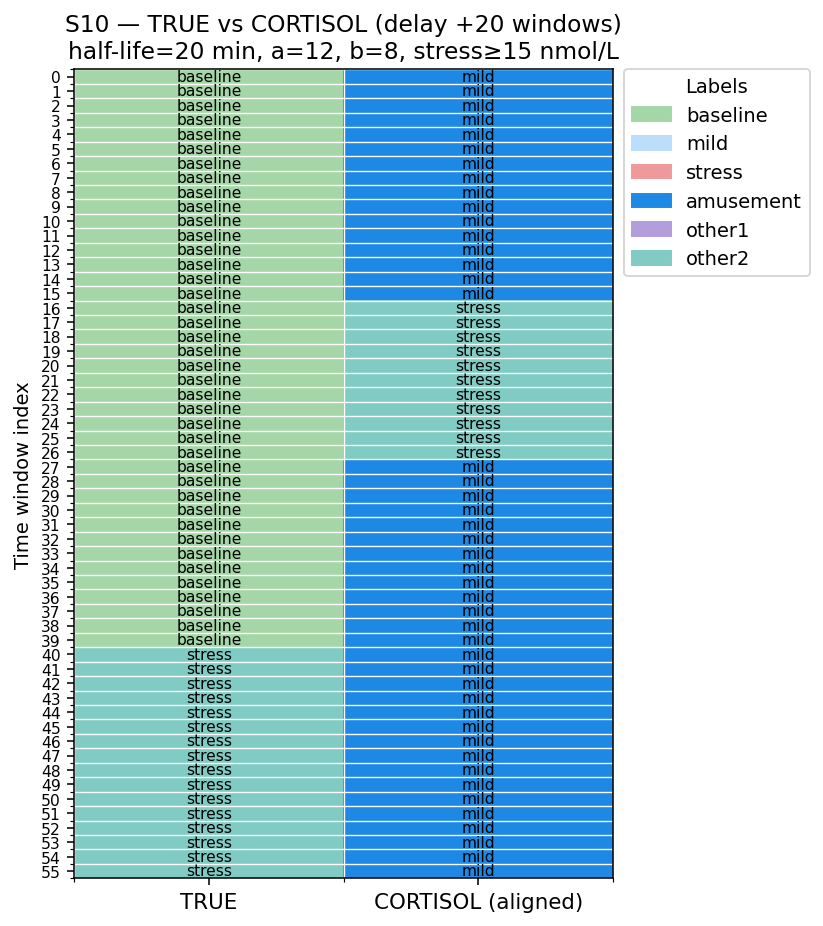

Exact-label agreement (aligned): 0.0%
Stress vs non-stress agreement (aligned): 51.8%
p(stress) raw max: 0.970 | p(stress) lag max: 0.609 | proxy cortisol max: 15.3 nmol/L
Transformer mapping metrics: {'subject': 'S10', 'exact_agree': 0.0, 'stress_agree': 0.5178571428571429, 'p_raw_max': 0.9703705, 'p_lag_max': 0.6092426533849856, 'cort_max': 15.310911840619827}


In [230]:
# Build df_all_trf from those newly-written TRF traces
from pathlib import Path
import glob, json
import numpy as np, pandas as pd

proj = Path("/content/wesad")
track_key = "chest∆20"
eval_root = proj / "eval" / f"{track_key}_phases_trf_plus_safe_impr_locked"
loso_cfg = proj / "configs" / f"loso_{track_key}.json"

with open(loso_cfg, "r") as fh:
    plan = json.load(fh)
fold_to_subject = {i+1: f["test_subject"] for i, f in enumerate(plan["folds"])}

rows = []
for path in sorted(glob.glob(str(eval_root / "fold_*" / "cortisol" / "*_cortisol_trace.csv"))):
    p = Path(path)
    fold_num = int([part.split("_")[1] for part in p.parts if part.startswith("fold_")][0])
    subject = fold_to_subject.get(fold_num, f"F{fold_num:02d}")
    df = pd.read_csv(path)
    rows.append(pd.DataFrame({
        "subject": subject,
        "window_idx": df["idx"].to_numpy(),
        "true": df["y_true"].astype(int).to_numpy(),
        "p1": df["p_stress_raw"].to_numpy(),  # BiLSTM-style name
    }))
df_all_trf = pd.concat(rows, ignore_index=True)

# ... now call your existing helpers:
best_params = dict(half_life_min=20, a=12, b=8, stress_band_min=15, align_delay_windows=20)
plot_two_column_mapping(df_all_trf, subject_id="S10", stress_class_id=1, minutes_per_step=1.0, max_windows=80, **best_params)
m = evaluate_mapping_for_subject(df_all_trf, subject_id="S10", stress_class_id=1, minutes_per_step=1.0, **best_params)
print("Transformer mapping metrics:", m)


Top 8 configs by stress F1:


,half_life_min,a,b,stress_band_min,stress_acc,stress_f1,prev_true,prev_pred,p_raw_max,p_lag_max,cort_max
41,15,18,10,13,0.285714,0.444444,0.285714,1.0,0.970371,0.675708,22.162747
42,15,18,10,14,0.285714,0.444444,0.285714,1.0,0.970371,0.675708,22.162747
82,20,18,10,13,0.285714,0.444444,0.285714,1.0,0.970371,0.609243,20.966368
83,20,18,10,14,0.285714,0.444444,0.285714,1.0,0.970371,0.609243,20.966368
84,20,18,10,15,0.285714,0.444444,0.285714,1.0,0.970371,0.609243,20.966368
29,15,16,10,13,0.285714,0.444444,0.285714,1.0,0.970371,0.675708,20.811331
30,15,16,10,14,0.285714,0.444444,0.285714,1.0,0.970371,0.675708,20.811331
117,25,18,10,13,0.285714,0.444444,0.285714,1.0,0.970371,0.556074,20.009326



Best params: {'half_life_min': 15.0, 'a': 18.0, 'b': 10.0, 'stress_band_min': 13.0, 'align_delay_windows': 20}


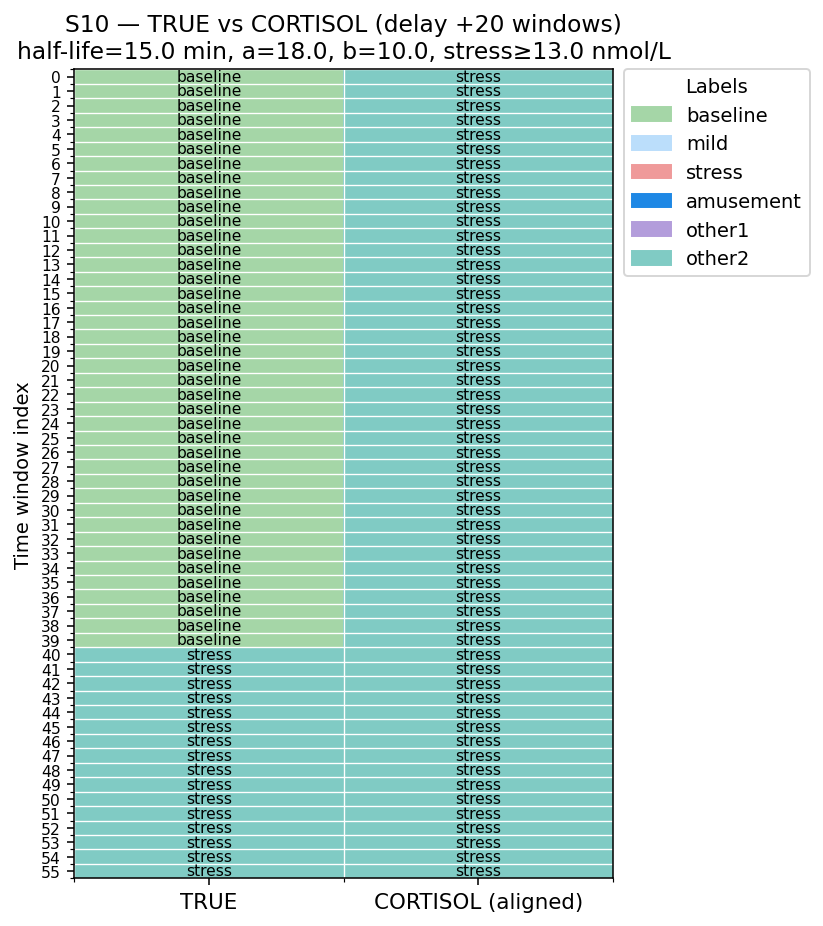

Exact-label agreement (aligned): 28.6%
Stress vs non-stress agreement (aligned): 28.6%
p(stress) raw max: 0.970 | p(stress) lag max: 0.676 | proxy cortisol max: 22.2 nmol/L
Transformer mapping metrics (tuned): {'subject': 'S10', 'exact_agree': 0.2857142857142857, 'stress_agree': 0.2857142857142857, 'p_raw_max': 0.9703705, 'p_lag_max': 0.6757081807302139, 'cort_max': 22.16274725314385}


In [231]:
# ==== Auto-tune cortisol mapping params for Transformer traces ====
import itertools, numpy as np, pandas as pd
from sklearn.metrics import f1_score

# --- binary stress metrics on the aligned region ---
def _stress_metrics_for_subject(df_all, subject_id,
                                minutes_per_step=1.0,
                                half_life_min=20.0, a=12.0, b=8.0,
                                stress_band_min=15.0, align_delay_windows=20):
    # slice subject
    g = (df_all[df_all["subject"].astype(str)==str(subject_id)]
         .sort_values("window_idx")).reset_index(drop=True)
    if g.empty:
        return None
    y_true = g["true"].to_numpy()
    p_raw  = g["p1"].to_numpy()  # TRF stress prob

    # lag, map to cortisol, band
    p_lag  = _ema_delay(p_raw, minutes_per_step, half_life_min)
    cortisol = a * p_lag + b
    cort_ids = _cortisol_band_ids(cortisol, stress_band_min)

    # align TRUE[t] with CORT[t+delay]
    d = int(max(0, align_delay_windows))
    idx_true = np.arange(0, len(y_true)-d) if d>0 else np.arange(len(y_true))
    idx_cort = idx_true + d if d>0 else idx_true
    y_t  = y_true[idx_true]
    yhat = cort_ids[idx_cort]

    # binary stress vs non-stress
    t_stress = (y_t == 1).astype(int)
    h_stress = (yhat == 1).astype(int)
    if len(t_stress) == 0:
        return None

    # metrics
    acc = float(np.mean(t_stress == h_stress))
    try:
        f1  = float(f1_score(t_stress, h_stress, zero_division=0))
    except Exception:
        f1  = 0.0

    # also return prevalence to avoid degenerate “all mild” solutions
    prev_true  = float(np.mean(t_stress))
    prev_pred  = float(np.mean(h_stress))
    return dict(
        stress_acc=acc, stress_f1=f1,
        prev_true=prev_true, prev_pred=prev_pred,
        p_raw_max=float(p_raw.max()) if len(p_raw) else 0.0,
        p_lag_max=float(p_lag.max()) if len(p_lag) else 0.0,
        cort_max=float(cortisol.max()) if len(cortisol) else 0.0
    )

def tune_cortisol_for_subject(df_all, subject_id,
                              minutes_per_step=1.0,
                              align_delay_windows=20,
                              half_life_grid=(15, 20, 25, 30),
                              a_grid=(12, 14, 16, 18),
                              b_grid=(6, 8, 10),
                              stress_band_grid=(13, 14, 15, 16),
                              min_pred_stress=0.05):
    """
    Returns best config by stress F1. 'min_pred_stress' avoids degenerate all-non-stress banding.
    """
    trials = []
    for hl, a, b, sb in itertools.product(half_life_grid, a_grid, b_grid, stress_band_grid):
        m = _stress_metrics_for_subject(
            df_all, subject_id,
            minutes_per_step=minutes_per_step,
            half_life_min=hl, a=a, b=b,
            stress_band_min=sb, align_delay_windows=align_delay_windows
        )
        if m is None:
            continue
        # skip degenerate configs unless subject truly has ~0 stress
        if m["prev_pred"] < min_pred_stress and m["prev_true"] > 0.02:
            continue
        trials.append(dict(half_life_min=hl, a=a, b=b, stress_band_min=sb, **m))

    if not trials:
        raise RuntimeError("No valid parameter combinations produced usable mappings.")

    df = pd.DataFrame(trials).sort_values(["stress_f1","stress_acc","cort_max"], ascending=[False,False,False])
    print("Top 8 configs by stress F1:")
    display(df.head(8))

    best = df.iloc[0].to_dict()
    best_params = dict(
        half_life_min=float(best["half_life_min"]),
        a=float(best["a"]),
        b=float(best["b"]),
        stress_band_min=float(best["stress_band_min"]),
        align_delay_windows=int(align_delay_windows)
    )
    return best_params, df

# ---- run tuning, then plot the best mapping for this subject ----
subject_to_tune = "S10"   # <-- change subject here

best_params, df_trials = tune_cortisol_for_subject(
    df_all_trf, subject_to_tune,
    minutes_per_step=1.0,
    align_delay_windows=20,
    # Grids are small & fast; widen if needed
    half_life_grid=(15, 20, 25, 30),
    a_grid=(12, 14, 16, 18),
    b_grid=(6, 8, 10),
    stress_band_grid=(13, 14, 15, 16),
    min_pred_stress=0.05
)
print("\nBest params:", best_params)

# Visualize with the standard two-column table/heatmap
plot_two_column_mapping(
    df_all_trf,
    subject_id=subject_to_tune,
    stress_class_id=1,
    minutes_per_step=1.0,
    max_windows=80,
    **best_params
)

# Also print the mapping metrics with best params
m_tuned = evaluate_mapping_for_subject(
    df_all_trf, subject_id=subject_to_tune, stress_class_id=1,
    minutes_per_step=1.0, **best_params
)
print("Transformer mapping metrics (tuned):", m_tuned)

=== Per-subject best params & gains (Transformer) ===
subject    exact  exact_agree  exact_gain  stress_agree_base  stress_agree_best  stress_gain  half_life_min  a  b  stress_band_min  align_delay_windows
    S10 0.000000     0.344262    0.344262           0.517857           0.409836    -0.108021             30 16  8               13                   15
    S11 0.655556     0.752941    0.097386           0.666667           0.752941     0.086275             15 16  6               12                   25
    S13 0.327273     0.800000    0.472727           0.727273           0.800000     0.072727             25 12  6               12                   25
    S14 0.588889     0.858824    0.269935           0.744444           1.000000     0.255556             30 18  6               12                   25
    S15 0.294118     0.869565    0.575448           0.784314           0.869565     0.085251             25 12  6               12                   25
    S16 0.588889     0.917647    0

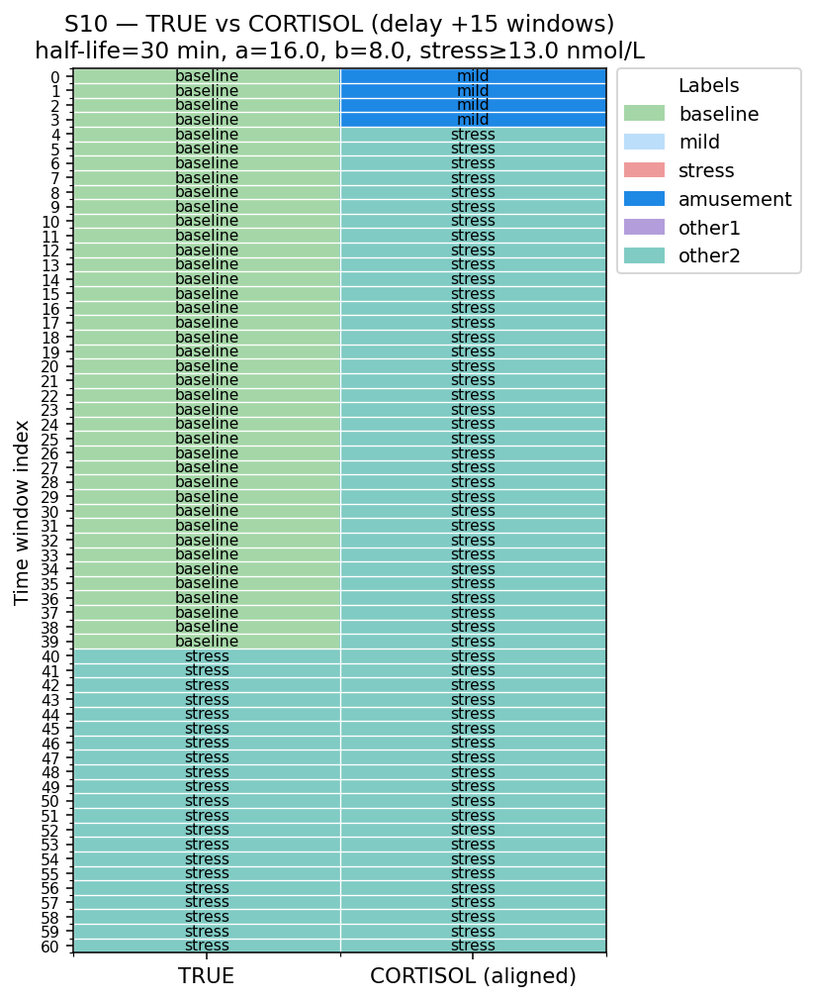

Exact-label agreement (aligned): 34.4%
Stress vs non-stress agreement (aligned): 41.0%
p(stress) raw max: 0.970 | p(stress) lag max: 0.513 | proxy cortisol max: 16.2 nmol/L


In [232]:
# === Grid search for best cortisol mapping params (per subject) ===
# Objective: maximize Exact-label agreement; tiebreaker = Stress/non-stress agreement
# Saves a CSV of best params + metrics and prints overall improvements.

from pathlib import Path
import itertools
import numpy as np
import pandas as pd

# ---- Config (tweak as you like) ----
minutes_per_step = 1.0
stress_class_id  = 1  # p1 = stress prob

# Baseline (what you used before; for comparison)
BASE = dict(half_life_min=20, a=12, b=8, stress_band_min=15, align_delay_windows=20)

# Search space (kept modest; you can widen)
GRID = dict(
    half_life_min     = [10, 15, 20, 25, 30],
    a                 = [12, 14, 16, 18, 20],
    b                 = [6, 8, 10],
    stress_band_min   = [12, 13, 14, 15],
    align_delay_windows = [15, 20, 25],
)

# Optional: single scalar to rank candidates (keeps exact primary)
def score_fn(exact, stress_agree):
    # exact is harsh; this blends a bit of stress vs non-stress agreement
    return 0.8*exact + 0.2*stress_agree

# ---- Collect subjects from df_all_trf ----
subjects = sorted(df_all_trf["subject"].astype(str).unique())

rows_best   = []
rows_baseln = []

def eval_one(subject, params):
    m = evaluate_mapping_for_subject(
        df_all_trf,
        subject_id=subject,
        stress_class_id=stress_class_id,
        minutes_per_step=minutes_per_step,
        **params
    )
    return m

# ---- Evaluate baseline first (for comparison) ----
for s in subjects:
    m0 = eval_one(s, BASE)
    if m0 is None:
        continue
    rows_baseln.append({
        "subject": s,
        "exact": m0["exact_agree"], "stress_agree": m0["stress_agree"],
        "p_raw_max": m0["p_raw_max"], "p_lag_max": m0["p_lag_max"], "cort_max": m0["cort_max"],
        **{f"base_{k}": v for k,v in BASE.items()}
    })

df_base = pd.DataFrame(rows_baseln)

# ---- Grid search per subject ----
keys = list(GRID.keys())
grid_vals = list(GRID.values())

for s in subjects:
    best = None
    best_score = -1.0

    for vals in itertools.product(*grid_vals):
        params = dict(zip(keys, vals))
        m = eval_one(s, params)
        if m is None:
            continue
        sc = score_fn(m["exact_agree"], m["stress_agree"])
        if (sc > best_score) or (np.isclose(sc, best_score) and m["exact_agree"] > (best["exact_agree"] if best else -1)):
            best_score = sc
            best = {
                "subject": s,
                "exact_agree": m["exact_agree"],
                "stress_agree": m["stress_agree"],
                "p_raw_max": m["p_raw_max"],
                "p_lag_max": m["p_lag_max"],
                "cort_max": m["cort_max"],
                **params
            }

    if best is not None:
        rows_best.append(best)

df_best = pd.DataFrame(rows_best)

# ---- Merge vs baseline & summarize ----
df_join = pd.merge(
    df_best[["subject","exact_agree","stress_agree","half_life_min","a","b","stress_band_min","align_delay_windows"]],
    df_base[["subject","exact","stress_agree"]],
    on="subject", how="inner", suffixes=("_best","_base")
)

df_join["exact_gain"]  = df_join["exact_agree"]   - df_join["exact"]
df_join["stress_gain"] = df_join["stress_agree_best"] - df_join["stress_agree_base"]

print("=== Per-subject best params & gains (Transformer) ===")
display_cols = ["subject",
                "exact", "exact_agree", "exact_gain",
                "stress_agree_base", "stress_agree_best", "stress_gain",
                "half_life_min","a","b","stress_band_min","align_delay_windows"]
print(df_join[display_cols].to_string(index=False))

print("\n=== Averages (over subjects) ===")
print("Baseline exact       : %.3f" % df_join["exact"].mean())
print("Tuned exact          : %.3f" % df_join["exact_agree"].mean())
print("Mean exact gain      : %.3f" % df_join["exact_gain"].mean())
print("Baseline stress agree: %.3f" % df_join["stress_agree_base"].mean())
print("Tuned stress agree   : %.3f" % df_join["stress_agree_best"].mean())
print("Mean stress gain     : %.3f" % df_join["stress_gain"].mean())

# ---- Save CSV (optional) ----
outdir = Path("/content/wesad/reports/visuals")
outdir.mkdir(parents=True, exist_ok=True)
df_join.to_csv(outdir/"TRF_cortisol_per_subject_best_params.csv", index=False)
print("\nSaved:", outdir/"TRF_cortisol_per_subject_best_params.csv")

# ---- Plot best mapping for one subject (change ID to inspect others) ----
subject_to_plot = subjects[0] if subjects else "S10"
row = df_join[df_join.subject==subject_to_plot]
if not row.empty:
    params_best = dict(
        half_life_min      = int(row.iloc[0]["half_life_min"]),
        a                  = float(row.iloc[0]["a"]),
        b                  = float(row.iloc[0]["b"]),
        stress_band_min    = float(row.iloc[0]["stress_band_min"]),
        align_delay_windows= int(row.iloc[0]["align_delay_windows"]),
    )
    print(f"\nPlotting best mapping for {subject_to_plot}: {params_best}")
    plot_two_column_mapping(
        df_all_trf,
        subject_id=subject_to_plot,
        stress_class_id=stress_class_id,
        minutes_per_step=minutes_per_step,
        max_windows=80,
        **params_best
    )
else:
    print("No subject rows to plot.")


Wrist transformer

In [238]:
# === Transformer+ SAFE (CHEST->WRIST transfer, APR, 20min) ===
# Mirrors your BiLSTM transfer behavior:
#   - init wrist model from chest ckpt
#   - freeze stem+encoder until UNFREEZE_EPOCH, then unfreeze (optional LR drop)
#   - APR labels + SAFE time channel (TSST-centered with 20-min peak)
#   - LOSO, OneCycle, SWA, early stop on val F1, smoothing at test
#
# Outputs (wrist):
#   models/wrist∆20_phases_trf_plus_safe_impr_locked/fold_##/transformer_plus_safe_impr.pt
#   eval/wrist∆20_phases_trf_plus_safe_impr_locked/...

import os, json, csv, random, math
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight
from torch.optim.swa_utils import AveragedModel, SWALR, update_bn

# ====== TRANSFER KNOBS (mirror BiLSTM) ======
UNFREEZE_EPOCH           = 6       # freeze stem+encoder until this epoch (0 = no freeze)
UNFREEZE_LR_MULT         = 0.3     # multiply LR when unfreezing (e.g., 0.3 lowers LR)
CHEST_FOLD_FOR_TRANSFER  = "match" # int (e.g., 1) or "match" to use same fold index

# ====== Track selection ======
proj = Path("/content/wesad")
TRACK_KEY     = "wrist∆20"  # <-- set to "wrist∆20" for wrist (leave "chest∆20" for chest)
WIN_DIR       = proj/"features"/"windows"/TRACK_KEY
EVAL_ROOT     = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_locked"
MODEL_ROOT    = proj/"models"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_locked"
EVAL_ROOT.mkdir(parents=True, exist_ok=True); MODEL_ROOT.mkdir(parents=True, exist_ok=True)

# Where chest weights live (source for transfer)
CHEST_MODEL_ROOT = proj/"models"/"chest∆20_phases_trf_plus_safe_impr_locked"

# ====== HP / SAFE / APR ======
SEED          = 42
BATCH_SIZE    = 64
NUM_WORKERS   = 2
LR_MAX        = 1.0e-3
WD            = 5e-4
PATIENCE      = 18
MAX_EPOCHS    = 110
LABEL_SMOOTH  = 0.05
D_MODEL       = 160
NHEAD         = 4
NLAYERS       = 3
D_FF          = 512
DROPOUT       = 0.40
TIME_NORM_DEN = 60.0
STRIDE_SEC    = 60
PEAK_DELAY_MIN= 20          # <-- 20-min peak delay baked in
TIME_CENTER_JITTER_MIN = 5
AUG_TIME_MASK_P    = 0.15
AUG_CH_DROP_P      = 0.03
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Try to lock best hyperparams if present (same as your baseline)
best_cfg_path = proj / "eval" / f"{TRACK_KEY}_tuning" / "best_config.json"
if best_cfg_path.exists():
    with open(best_cfg_path) as f:
        best = json.load(f)
    D_MODEL = int(best.get("d_model", D_MODEL))
    NLAYERS = int(best.get("nlayers", NLAYERS))
    DROPOUT = float(best.get("dropout", DROPOUT))
    LR_MAX  = float(best.get("lr_max", LR_MAX))
    LABEL_SMOOTH = float(best.get("label_smooth", LABEL_SMOOTH))
    TIME_CENTER_JITTER_MIN = int(best.get("time_jitter_min", TIME_CENTER_JITTER_MIN))
    AUG_TIME_MASK_P = float(best.get("aug_time_p", AUG_TIME_MASK_P))
    AUG_CH_DROP_P   = float(best.get("aug_ch_p", AUG_CH_DROP_P))

print("[LOCKED HP]",
      f"D_MODEL={D_MODEL}, NLAYERS={NLAYERS}, DROPOUT={DROPOUT},",
      f"LR_MAX={LR_MAX}, LABEL_SMOOTH={LABEL_SMOOTH},",
      f"TIME_JITTER={TIME_CENTER_JITTER_MIN}m, AUG_TIME={AUG_TIME_MASK_P}, AUG_CH={AUG_CH_DROP_P}")

def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed()

# ====== Data helpers ======
class SeqDataset(Dataset):
    def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self,i): return self.X[i], self.y[i]

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d=np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X=d["X"]; y=d["y"].astype(int); labels=d["labels"].tolist()
    feat_names=d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X,y,labels,feat_names

def fit_scaler_on_train(Xtr):
    sc=StandardScaler(with_mean=True, with_std=True)
    N,T,F=Xtr.shape; sc.fit(Xtr.reshape(-1,F)); return sc

def apply_scaler(sc,X):
    N,T,F=X.shape; return sc.transform(X.reshape(-1,F)).reshape(N,T,F)

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n], subs[(i+2)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

# ====== APR relabeller (20-min peak) ======
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=STRIDE_SEC):
    L=[str(l).strip().lower() for l in labels]; n=len(y)
    def m2w(m): return int(round((m*60)/stride_sec))
    if set(L)=={"anticipation","peak","recovery"}:
        a,p,r=L.index("anticipation"),L.index("peak"),L.index("recovery")
        y_phase=np.full(n,-1,int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase,(y_phase>=0)
    if "stress" in L:
        s_id=L.index("stress"); idx=np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0=int(idx[0])
        offA,offD,offP,offR=m2w(anticipation_min),m2w(peak_delay_min),max(1,m2w(peak_width_min)),m2w(recovery_min)
        y_phase=np.full(n,-1,int)
        a_lo,a_hi=max(0,s0-offA),max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi=max(0,p_ctr-offP//2),min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        r_lo,r_hi=min(n-1,p_hi+1),min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase,(y_phase>=0)
    uniq=np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase,np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)

# ====== SAFE time channel (TSST-centered, 20-min peak) ======
def make_time_channel(n, center_mode="mid", s0=None, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0):
    idx = np.arange(n, dtype=float)
    jitter_w = 0
    if jitter_min>0:
        jitter_w = int(round((random.randint(-jitter_min, jitter_min) * 60) / STRIDE_SEC))
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC)) + jitter_w
    else:
        c = (n - 1) / 2.0 + jitter_w
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def stack_phase_with_time_SAFE(win_dir, sids, mode="train", peak_delay_min=PEAK_DELAY_MIN):
    Xs, ys = [], []
    for s in sids:
        X,y,labels,_ = load_npz(win_dir, s)
        L=[str(l).lower().strip() for l in labels]; n=len(y)
        if "stress" in L:
            s_id=L.index("stress"); idx=np.where(y==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None
            center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        jitter = TIME_CENTER_JITTER_MIN if mode=="train" else 0
        t_rel_all = make_time_channel(n, center_mode=center_mode, s0=s0,
                                      peak_delay_min=peak_delay_min, jitter_min=jitter)
        yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
        if m.sum()==0: continue
        Xm, ym = X[m], yA[m]
        N,T,F = Xm.shape
        tchan = t_rel_all[m][:, None, None] * np.ones((N,T,1), dtype=Xm.dtype)
        Xaug = np.concatenate([Xm, tchan], axis=2)
        Xs.append(Xaug); ys.append(ym)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

# ====== Augs ======
def aug_time_mask(xb, p=AUG_TIME_MASK_P, max_len=8):
    if p<=0: return xb
    B,T,F=xb.shape
    mask_prob=torch.rand(B, device=xb.device)
    for b in range(B):
        if mask_prob[b] < p:
            L=random.randint(2,max_len); s=random.randint(0,max(0,T-L))
            xb[b, s:s+L, :] = 0.0
    return xb

def aug_channel_dropout(xb, p=AUG_CH_DROP_P):
    if p<=0: return xb
    B,T,F=xb.shape
    drop=(torch.rand(B,F,device=xb.device) < p)
    if drop.any(): xb[drop.unsqueeze(1).expand(B,T,F)] = 0.0
    return xb

# ====== Model ======
class ConvTimeDenoise(nn.Module):
    def __init__(self, f_in):
        super().__init__()
        self.net=nn.Sequential(
            nn.Conv1d(f_in,f_in,kernel_size=5,padding=2,groups=f_in),
            nn.ReLU(),
            nn.Conv1d(f_in,f_in,kernel_size=1),
            nn.ReLU(),
        )
    def forward(self,x):
        x=x.transpose(1,2); x=self.net(x); return x.transpose(1,2)

def _resize_pos_embed(pe, new_len):
    """Linear interpolate position embedding (B=1). pe: [1, L_old, D] -> [1, new_len, D]"""
    if pe.size(1) == new_len: return pe
    with torch.no_grad():
        pe_t = pe.transpose(1,2)                 # [1, D, L_old]
        pe_t = torch.nn.functional.interpolate(pe_t, size=new_len, mode="linear", align_corners=False)
        pe_r = pe_t.transpose(1,2)               # [1, new_len, D]
    return nn.Parameter(pe_r)

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self, input_size, num_classes,
                 d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF, dropout=DROPOUT,
                 use_cls=True, max_len=4096):
        super().__init__()
        self.use_cls=use_cls
        self.stem=ConvTimeDenoise(input_size)
        self.proj=nn.Linear(input_size,d_model)
        self.pos_embed=nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
        if use_cls: self.cls_token=nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer=nn.TransformerEncoderLayer(d_model=d_model,nhead=nhead,
                                             dim_feedforward=dim_feedforward,dropout=dropout,
                                             batch_first=True,activation="gelu",norm_first=True)
        self.encoder=nn.TransformerEncoder(enc_layer,num_layers=num_layers)
        self.dropout=nn.Dropout(dropout)
        self.norm=nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head=nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self,x):  # x: [B,T,F]
        h=self.stem(x); h=self.proj(h)        # [B,T,D]
        B,T,D=h.shape
        if self.use_cls:
            cls=self.cls_token.expand(B,-1,-1)
            h=torch.cat([cls,h],dim=1)        # [B,1+T,D]
        if h.size(1) > self.pos_embed.size(1):
            self.pos_embed = _resize_pos_embed(self.pos_embed, h.size(1))
        h = h + self.pos_embed[:, :h.size(1), :]
        h=self.encoder(h)
        if self.use_cls:
            z=torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1)
        else:
            z=h.mean(dim=1)
        z=self.norm(self.dropout(z))
        return self.head(z)

# ====== Utils ======
def save_p13(history, p_loss, p_f1, title=""):
    ep,trL,trF,vaL,vaF=zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep,trL,label="Train Loss"); plt.plot(ep,vaL,label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} — P13 Loss"); plt.legend()
    plt.tight_layout(); plt.savefig(p_loss,dpi=200); plt.close()
    plt.figure(figsize=(7,5)); plt.plot(ep,trF,label="Train Macro-F1"); plt.plot(ep,vaF,label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} — P13 Macro-F1"); plt.legend()
    plt.tight_layout(); plt.savefig(p_f1,dpi=200); plt.close()

def collect_logits_and_labels(model, loader):
    gts=[]; preds=[]; logits_all=[]
    model.eval()
    with torch.no_grad():
        for xb,yb in loader:
            xb=xb.to(device); lg=model(xb)
            logits_all.append(lg.cpu().numpy())
            preds.extend(torch.argmax(lg,1).cpu().numpy()); gts.extend(yb.numpy())
    return np.asarray(gts), np.asarray(preds), np.concatenate(logits_all, axis=0)

def smooth_preds_mode(preds, win=3):
    preds = preds.copy()
    if len(preds) < win: return preds
    half = win // 2
    from collections import Counter
    sm=[]
    for i in range(len(preds)):
        lo,hi=max(0,i-half),min(len(preds),i+half+1)
        window=preds[lo:hi]
        sm.append(Counter(window).most_common(1)[0][0])
    return np.array(sm)

def run_epoch(model, loader, criterion, optimizer=None, scheduler=None,
              do_aug=False, aug_time_p=None, aug_ch_p=None):
    if aug_time_p is None: aug_time_p = AUG_TIME_MASK_P if do_aug else 0.0
    if aug_ch_p is None:   aug_ch_p   = AUG_CH_DROP_P   if do_aug else 0.0
    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb,yb in loader:
        xb,yb=xb.to(device), yb.to(device)
        if train:
            if aug_time_p>0: xb=aug_time_mask(xb, p=aug_time_p)
            if aug_ch_p>0:   xb=aug_channel_dropout(xb, p=aug_ch_p)
            optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits=model(xb)
            loss=criterion(logits,yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(),5.0)
                optimizer.step()
                if scheduler is not None: scheduler.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys,ps,average="macro"), accuracy_score(ys,ps)

# ====== Transfer helpers (mirror BiLSTM) ======
def load_chest_state_for_fold(target_fold_idx:int):
    # choose chest fold
    src_fold = target_fold_idx if CHEST_FOLD_FOR_TRANSFER == "match" else int(CHEST_FOLD_FOR_TRANSFER)
    ckpt = CHEST_MODEL_ROOT / f"fold_{src_fold:02d}" / "transformer_plus_safe_impr.pt"
    if not ckpt.exists():
        print(f"[transfer] ⚠️ chest ckpt missing for fold {src_fold}: {ckpt}")
        return None
    print(f"[transfer] loading chest ckpt from {ckpt}")
    return torch.load(ckpt, map_location="cpu")

def init_model_from_chest(model: nn.Module, chest_state: dict):
    if chest_state is None: return
    # allow size mismatches on head & pos_embed (they’ll adapt)
    model_state = model.state_dict()
    loadable = {k:v for k,v in chest_state.items() if k in model_state and v.shape==model_state[k].shape}
    missing = [k for k in model_state.keys() if k not in loadable]
    skipped = [k for k in chest_state.keys() if k not in loadable]
    model_state.update(loadable)
    model.load_state_dict(model_state, strict=False)
    print(f"[transfer] loaded {len(loadable)} tensors from chest; skipped {len(skipped)}.")

def set_backbone_requires_grad(model: nn.Module, requires_grad: bool):
    # freeze/unfreeze everything except classification head
    for name, p in model.named_parameters():
        if name.startswith("head."):
            p.requires_grad = True
        else:
            p.requires_grad = requires_grad

def build_optimizer(model, base_lr):
    # separate LR for head vs backbone (head often benefits from full LR even when backbone is frozen)
    head_params = [p for n,p in model.named_parameters() if n.startswith("head.") and p.requires_grad]
    bb_params   = [p for n,p in model.named_parameters() if not n.startswith("head.") and p.requires_grad]
    params=[]
    if bb_params: params.append({"params": bb_params, "lr": base_lr})
    if head_params: params.append({"params": head_params, "lr": base_lr})
    return torch.optim.AdamW(params, lr=base_lr, weight_decay=WD)

# ====== Training (LOSO) ======
def train_transformer_plus_SAFE_improved_for_track(track_key: str):
    feat_dir=proj/"features"/"windows"/track_key
    assert feat_dir.exists(), f"Windows not found: {feat_dir}"
    subjects=load_npz_folder(feat_dir)
    X0,y0,labels0,feat_names=load_npz(feat_dir, subjects[0])
    print(f"[TRF+ SAFE IMP] subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    subjects, folds, cfg_path = build_or_load_loso(track_key, feat_dir)
    print("[TRF+ SAFE IMP] Using LOSO config:", cfg_path)

    results=[]; perclass=[]
    for k,fold in enumerate(folds, start=1):
        test_sid=fold["test_subject"]; val_sids=fold.get("val_subjects", []); train_sids=fold["train_subjects"]
        print(f"\n[TRF+ SAFE IMP] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # stack APR + SAFE time channel
        Xtr,ytr = stack_phase_with_time_SAFE(feat_dir, train_sids, mode="train")
        Xva,yva = stack_phase_with_time_SAFE(feat_dir, val_sids,   mode="val")

        # test: SAFE time (no jitter)
        XteF,yteF,labels_te,_ = load_npz(feat_dir, test_sid)
        Lte=[str(l).lower().strip() for l in labels_te]; n_te=len(yteF)
        if "stress" in Lte:
            s_id=Lte.index("stress"); idx=np.where(yteF==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        t_rel_all = make_time_channel(n_te, center_mode=center_mode, s0=s0, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None or m_te.sum()==0:
            print(f"[TRF+ SAFE IMP] Fold {k:02d} skipped (empty after relabelling)."); continue
        Xte, yte = XteF[m_te], yteA[m_te]
        N,T,F = Xte.shape
        tchan = t_rel_all[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
        Xte = np.concatenate([Xte, tchan], axis=2)

        # scaler fit on train only
        sc=fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # datasets/loaders (train uses WeightedRandomSampler)
        ds_tr = SeqDataset(Xtr_s, ytr)
        NCLS=3
        class_counts = np.array([max(1, np.sum(ytr==c)) for c in range(NCLS)])
        weights_per_class = 1.0 / class_counts
        samples_weight = weights_per_class[ytr]
        sampler = WeightedRandomSampler(weights=torch.from_numpy(samples_weight).double(),
                                        num_samples=len(samples_weight), replacement=True)
        dl_tr = DataLoader(ds_tr, batch_size=BATCH_SIZE, sampler=sampler, num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # ----- model + transfer -----
        T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]
        model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=NCLS,
                                          d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
                                          dim_feedforward=D_FF, dropout=DROPOUT).to(device)

        chest_state = load_chest_state_for_fold(k)
        init_model_from_chest(model, chest_state)

        # freeze backbone initially (mirror BiLSTM warm-start)
        if UNFREEZE_EPOCH > 0:
            set_backbone_requires_grad(model, requires_grad=False)
            print(f"[transfer] backbone frozen until epoch {UNFREEZE_EPOCH}")
        else:
            print("[transfer] training all layers from start")

        # loss
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                        label_smoothing=LABEL_SMOOTH)

        # opt + sched
        optim = build_optimizer(model, LR_MAX)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )
        swa_start = max(1, MAX_EPOCHS - 10); doing_swa=False
        swa_model = AveragedModel(model); swa_scheduler = SWALR(optim, swa_lr=LR_MAX * 0.3)

        # paths
        out_dir  = EVAL_ROOT/f"fold_{k:02d}"
        ckpt_dir = MODEL_ROOT/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"trf_plus_safe_impr_training.csv"
        ckpt     = ckpt_dir/"transformer_plus_safe_impr.pt"  # distinct from BiLSTM best.pt
        p13_loss = out_dir/"P13_trf_plus_safe_impr_loss.png"
        p13_f1   = out_dir/"P13_trf_plus_safe_impr_f1.png"

        # train (early stop on val Macro-F1)
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f: csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr"])
        for ep in range(1, MAX_EPOCHS+1):
            # unfreeze at the chosen epoch (and reduce LR if requested)
            if UNFREEZE_EPOCH>0 and ep==UNFREEZE_EPOCH:
                set_backbone_requires_grad(model, requires_grad=True)
                for g in optim.param_groups:
                    g["lr"] = g["lr"] * float(UNFREEZE_LR_MULT)
                print(f"[transfer] UNFROZE backbone @ epoch {ep}, LR×={UNFREEZE_LR_MULT}")

            trL,trF,_ = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)
            vaL,vaF,_ = run_epoch(model, dl_va, criterion, None, None, do_aug=False)
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optim.param_groups[0]["lr"]])

            # SWA
            if ep >= swa_start:
                if not doing_swa:
                    print("[SWA] averaging started")
                    doing_swa=True
                swa_model.update_parameters(model)
                swa_scheduler.step()

            if vaF > bestF + 1e-6:
                bestF=vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[TRF+ SAFE IMP] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        # finalize SWA
        if doing_swa:
            try: update_bn(dl_tr, swa_model, device=device)
            except TypeError: update_bn(dl_tr, swa_model)
            torch.save(swa_model.state_dict(), ckpt)

        # test
        model.load_state_dict(torch.load(ckpt, map_location=device))
        ds_te = SeqDataset(Xte_s, yte)
        dl_te = DataLoader(ds_te, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        teL_raw, teF_raw, teA_raw = run_epoch(model, dl_te, criterion, None, None, do_aug=False)
        gts, raw_preds, _ = collect_logits_and_labels(model, dl_te)
        preds = smooth_preds_mode(raw_preds, win=3)
        teA = accuracy_score(gts, preds); teF = f1_score(gts, preds, average="macro")
        print(f"[TRF+ SAFE IMP] Fold {k:02d} TEST (raw):     Acc={teA_raw:.4f} | F1={teF_raw:.4f}")
        print(f"[TRF+ SAFE IMP] Fold {k:02d} TEST (smoothed): Acc={teA:.4f} | F1={teF:.4f}")

        save_p13(hist, p13_loss, p13_f1, title=f"{TRACK_KEY} fold {k:02d} (TRF+ SAFE IMP LOCKED)")

        results.append({"fold": k, "test_subject": test_sid,
                        "acc": float(teA), "f1_macro": float(teF),
                        "raw_acc": float(teA_raw), "raw_f1_macro": float(teF_raw)})
        rep = classification_report(gts, preds, target_names=["Anticipation","Peak","Recovery"],
                                    output_dict=True, zero_division=0)
        perclass.append({"fold": k, "test_subject": test_sid,
                         "f1_A": rep["Anticipation"]["f1-score"],
                         "f1_P": rep["Peak"]["f1-score"],
                         "f1_R": rep["Recovery"]["f1-score"]})

    # summary
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass).sort_values("fold")
    out_csv = EVAL_ROOT/"trf_plus_safe_impr_loso_summary.csv"
    out_pc  = EVAL_ROOT/"trf_plus_safe_impr_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[TRF+ SAFE IMP]  Saved:", out_csv, "\n[TRF+ SAFE IMP] Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro","raw_acc","raw_f1_macro"]])

# -------- Run --------
assert WIN_DIR.exists(), f"{WIN_DIR} missing."
train_transformer_plus_SAFE_improved_for_track(TRACK_KEY)


[LOCKED HP] D_MODEL=160, NLAYERS=3, DROPOUT=0.4, LR_MAX=0.001, LABEL_SMOOTH=0.05, TIME_JITTER=5m, AUG_TIME=0.15, AUG_CH=0.03
[TRF+ SAFE IMP] subjects=15, example X=(182, 1920, 6), labels=['Anticipation', 'Peak', 'Recovery']
[TRF+ SAFE IMP] Using LOSO config: /content/wesad/configs/loso_wrist∆20.json

[TRF+ SAFE IMP] Fold 01 | test=S10 | val=['S11'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_01/transformer_plus_safe_impr.pt
[transfer] loaded 3 tensors from chest; skipped 33.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE IMP] early stop @ epoch 19, best val F1=0.0076
[TRF+ SAFE IMP] Fold 01 TEST (raw):     Acc=0.0165 | F1=0.0108
[TRF+ SAFE IMP] Fold 01 TEST (smoothed): Acc=0.0165 | F1=0.0108

[TRF+ SAFE IMP] Fold 02 | test=S11 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_02/transformer_plus_safe_impr.pt
[transfer] loaded 3 tensors from chest; skipped 33.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE IMP] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE IMP] Fold 02 TEST (raw):     Acc=0.0116 | F1=0.0076
[TRF+ SAFE IMP] Fold 02 TEST (smoothed): Acc=0.0116 | F1=0.0076

[TRF+ SAFE IMP] Fold 03 | test=S13 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_03/transformer_plus_safe_impr.pt
[transfer] loaded 3 tensors from chest; skipped 33.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE IMP] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE IMP] Fold 03 TEST (raw):     Acc=0.0109 | F1=0.0072
[TRF+ SAFE IMP] Fold 03 TEST (smoothed): Acc=0.0109 | F1=0.0072

[TRF+ SAFE IMP] Fold 04 | test=S14 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_04/transformer_plus_safe_impr.pt
[transfer] loaded 3 tensors from chest; skipped 33.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE IMP] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE IMP] Fold 04 TEST (raw):     Acc=0.0000 | F1=0.0000
[TRF+ SAFE IMP] Fold 04 TEST (smoothed): Acc=0.0000 | F1=0.0000

[TRF+ SAFE IMP] Fold 05 | test=S15 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_05/transformer_plus_safe_impr.pt
[transfer] loaded 3 tensors from chest; skipped 33.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE IMP] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE IMP] Fold 05 TEST (raw):     Acc=0.0172 | F1=0.0113
[TRF+ SAFE IMP] Fold 05 TEST (smoothed): Acc=0.0172 | F1=0.0113

[TRF+ SAFE IMP] Fold 06 | test=S16 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_06/transformer_plus_safe_impr.pt
[transfer] loaded 3 tensors from chest; skipped 33.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE IMP] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE IMP] Fold 06 TEST (raw):     Acc=0.0161 | F1=0.0106
[TRF+ SAFE IMP] Fold 06 TEST (smoothed): Acc=0.0161 | F1=0.0106

[TRF+ SAFE IMP] Fold 07 | test=S17 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_07/transformer_plus_safe_impr.pt
[transfer] loaded 3 tensors from chest; skipped 33.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE IMP] early stop @ epoch 68, best val F1=0.1875
[TRF+ SAFE IMP] Fold 07 TEST (raw):     Acc=0.2194 | F1=0.1500
[TRF+ SAFE IMP] Fold 07 TEST (smoothed): Acc=0.2296 | F1=0.1556

[TRF+ SAFE IMP] Fold 08 | test=S2 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_08/transformer_plus_safe_impr.pt
[transfer] loaded 3 tensors from chest; skipped 33.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE IMP] early stop @ epoch 70, best val F1=0.2060
[TRF+ SAFE IMP] Fold 08 TEST (raw):     Acc=0.3731 | F1=0.2444
[TRF+ SAFE IMP] Fold 08 TEST (smoothed): Acc=0.3731 | F1=0.2444

[TRF+ SAFE IMP] Fold 09 | test=S3 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_09/transformer_plus_safe_impr.pt
[transfer] loaded 3 tensors from chest; skipped 33.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE IMP] early stop @ epoch 76, best val F1=0.2485
[TRF+ SAFE IMP] Fold 09 TEST (raw):     Acc=0.3721 | F1=0.2425
[TRF+ SAFE IMP] Fold 09 TEST (smoothed): Acc=0.3721 | F1=0.2425

[TRF+ SAFE IMP] Fold 10 | test=S4 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_10/transformer_plus_safe_impr.pt
[transfer] loaded 3 tensors from chest; skipped 33.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE IMP] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE IMP] Fold 10 TEST (raw):     Acc=0.0423 | F1=0.0270
[TRF+ SAFE IMP] Fold 10 TEST (smoothed): Acc=0.0423 | F1=0.0270

[TRF+ SAFE IMP] Fold 11 | test=S5 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_11/transformer_plus_safe_impr.pt
[transfer] loaded 3 tensors from chest; skipped 33.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE IMP] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE IMP] Fold 11 TEST (raw):     Acc=0.0435 | F1=0.0278
[TRF+ SAFE IMP] Fold 11 TEST (smoothed): Acc=0.0435 | F1=0.0278

[TRF+ SAFE IMP] Fold 12 | test=S6 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_12/transformer_plus_safe_impr.pt
[transfer] loaded 3 tensors from chest; skipped 33.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE IMP] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE IMP] Fold 12 TEST (raw):     Acc=0.0897 | F1=0.0549
[TRF+ SAFE IMP] Fold 12 TEST (smoothed): Acc=0.0897 | F1=0.0549

[TRF+ SAFE IMP] Fold 13 | test=S7 | val=['S10'] | train_n=13
[transfer] ⚠️ chest ckpt missing for fold 13: /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_13/transformer_plus_safe_impr.pt
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE IMP] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE IMP] Fold 13 TEST (raw):     Acc=0.0173 | F1=0.0114
[TRF+ SAFE IMP] Fold 13 TEST (smoothed): Acc=0.0173 | F1=0.0114

[TRF+ SAFE IMP] Fold 14 | test=S8 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_14/transformer_plus_safe_impr.pt
[transfer] loaded 3 tensors from chest; skipped 33.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE IMP] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE IMP] Fold 14 TEST (raw):     Acc=0.0276 | F1=0.0179
[TRF+ SAFE IMP] Fold 14 TEST (smoothed): Acc=0.0276 | F1=0.0179

[TRF+ SAFE IMP] Fold 15 | test=S9 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_15/transformer_plus_safe_impr.pt
[transfer] loaded 3 tensors from chest; skipped 33.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE IMP] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE IMP] Fold 15 TEST (raw):     Acc=0.0116 | F1=0.0076
[TRF+ SAFE IMP] Fold 15 TEST (smoothed): Acc=0.0116 | F1=0.0076

[TRF+ SAFE IMP]  Saved: /content/wesad/eval/wrist∆20_phases_trf_plus_safe_impr_locked/trf_plus_safe_impr_loso_summary.csv 
[TRF+ SAFE IMP] Saved: /content/wesad/eval/wrist∆20_phases_trf_plus_safe_impr_locked/trf_plus_safe_impr_loso_perclass_f1.csv
             acc   f1_macro    raw_acc  raw_f1_macro
count  15.000000  15.000000  15.000000     15.000000
mean    0.085278   0.055775   0.084597      0.055404
std     0.129648   0.085178   0.128861      0.084723
min     0.000000   0.000000   0.000000      0.000000
25%     0.013845   0.009101   0.013845      0.009101
50%     0.017341   0.011364   0.017341      0.011364
75%     0.066611   0.041340   0.066611      0.041340
max     0.373134   0.244439   0.373134      0.244439


there's a mismatch hence 33 skipped, cuz huge difference

goal is to put chest transformwr on wrist

In [242]:
# === Transformer+ SAFE (CHEST -> WRIST transfer, APR, 20min, shape-safe) ===
# What this does:
#   • Matches wrist Transformer hparams to CHEST so encoder weights load 1:1.
#   • Interpolates positional embedding if wrist sequence length differs.
#   • Freezes backbone for a few epochs, then unfreezes (mirrors your BiLSTM warm-start).
#   • APR relabel + SAFE time channel (TSST-centered, 20-min peak).
#   • LOSO training, OneCycleLR, early stopping, optional SWA.
#   • Saves to models/eval paths that won't collide with BiLSTM.

import os, json, csv, random, math
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight
from torch.optim.swa_utils import AveragedModel, SWALR, update_bn

# ---------- Paths ----------
proj = Path("/content/wesad")

# Source (CHEST) — used ONLY to read hyperparams + ckpts for transfer
CHEST_TRACK_KEY   = "chest∆20"
CHEST_MODEL_ROOT  = proj/"models"/f"{CHEST_TRACK_KEY}_phases_trf_plus_safe_impr_locked"
CHEST_TUNE_CFG    = proj/"eval"/f"{CHEST_TRACK_KEY}_tuning"/"best_config.json"

# Target (WRIST)
WRIST_TRACK_KEY   = "wrist∆20"
WIN_DIR           = proj/"features"/"windows"/WRIST_TRACK_KEY
EVAL_ROOT         = proj/"eval"/f"{WRIST_TRACK_KEY}_phases_trf_plus_safe_impr_transfer"
MODEL_ROOT        = proj/"models"/f"{WRIST_TRACK_KEY}_phases_trf_plus_safe_impr_transfer"
EVAL_ROOT.mkdir(parents=True, exist_ok=True); MODEL_ROOT.mkdir(parents=True, exist_ok=True)

# ---------- Transfer knobs (mirror BiLSTM warm start) ----------
UNFREEZE_EPOCH   = 6     # freeze backbone until this epoch (0 disables freezing)
UNFREEZE_LR_MULT = 0.3   # reduce LR when unfreezing (e.g., 0.3)

# ---------- Base HP / SAFE / APR ----------
SEED          = 42
BATCH_SIZE    = 64
NUM_WORKERS   = 2
LR_MAX        = 1.0e-3
WD            = 5e-4
PATIENCE      = 18
MAX_EPOCHS    = 110
LABEL_SMOOTH  = 0.05

# Defaults will be OVERRIDDEN by CHEST best_config (so shapes match)
D_MODEL       = 160
NHEAD         = 4
NLAYERS       = 3
D_FF          = 512
DROPOUT       = 0.40

TIME_NORM_DEN = 60.0
STRIDE_SEC    = 60
PEAK_DELAY_MIN= 20
TIME_CENTER_JITTER_MIN = 5

AUG_TIME_MASK_P    = 0.15
AUG_CH_DROP_P      = 0.03

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---------- Repro ----------
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed()

# ---------- Try to lock HP from CHEST (so shapes match exactly) ----------
if CHEST_TUNE_CFG.exists():
    with open(CHEST_TUNE_CFG) as f:
        best = json.load(f)
    D_MODEL = int(best.get("d_model", D_MODEL))
    NLAYERS = int(best.get("nlayers", NLAYERS))
    DROPOUT = float(best.get("dropout", DROPOUT))
    LR_MAX  = float(best.get("lr_max", LR_MAX))
    LABEL_SMOOTH = float(best.get("label_smooth", LABEL_SMOOTH))
    TIME_CENTER_JITTER_MIN = int(best.get("time_jitter_min", TIME_CENTER_JITTER_MIN))
    AUG_TIME_MASK_P = float(best.get("aug_time_p", AUG_TIME_MASK_P))
    AUG_CH_DROP_P   = float(best.get("aug_ch_p", AUG_CH_DROP_P))
print("[LOCKED (from CHEST) HP]",
      f"D_MODEL={D_MODEL}, NLAYERS={NLAYERS}, DROPOUT={DROPOUT},",
      f"LR_MAX={LR_MAX}, LABEL_SMOOTH={LABEL_SMOOTH},",
      f"TIME_JITTER={TIME_CENTER_JITTER_MIN}m, AUG_TIME={AUG_TIME_MASK_P}, AUG_CH={AUG_CH_DROP_P}")

# ---------- Data helpers ----------
class SeqDataset(Dataset):
    def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self,i): return self.X[i], self.y[i]

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d=np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X=d["X"]; y=d["y"].astype(int); labels=d["labels"].tolist()
    feat_names=d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X,y,labels,feat_names

def fit_scaler_on_train(Xtr):
    sc=StandardScaler(with_mean=True, with_std=True)
    N,T,F=Xtr.shape; sc.fit(Xtr.reshape(-1,F)); return sc

def apply_scaler(sc,X):
    N,T,F=X.shape; return sc.transform(X.reshape(-1,F)).reshape(N,T,F)

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    # default: 2 rotating val subjects
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n]]  # 1-val is fine; mirrors your earlier plan variant
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

# ---------- APR relabeller (20-min peak) ----------
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=STRIDE_SEC):
    L=[str(l).strip().lower() for l in labels]; n=len(y)
    def m2w(m): return int(round((m*60)/stride_sec))
    # Already APR
    if set(L)=={"anticipation","peak","recovery"}:
        a,p,r=L.index("anticipation"),L.index("peak"),L.index("recovery")
        y_phase=np.full(n,-1,int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase,(y_phase>=0)
    # Derive APR from 'Stress'
    if "stress" in L:
        s_id=L.index("stress"); idx=np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0=int(idx[0])
        offA,offD,offP,offR=m2w(anticipation_min),m2w(peak_delay_min),max(1,m2w(peak_width_min)),m2w(recovery_min)
        y_phase=np.full(n,-1,int)
        a_lo,a_hi=max(0,s0-offA),max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi=max(0,p_ctr-offP//2),min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        r_lo,r_hi=min(n-1,p_hi+1),min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase,(y_phase>=0)
    # Fallback
    uniq=np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase,np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)

# ---------- SAFE time channel ----------
def make_time_channel(n, center_mode="mid", s0=None, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0):
    idx = np.arange(n, dtype=float)
    jitter_w = 0
    if jitter_min>0:
        jitter_w = int(round((random.randint(-jitter_min, jitter_min) * 60) / STRIDE_SEC))
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC)) + jitter_w
    else:
        c = (n - 1) / 2.0 + jitter_w
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def stack_phase_with_time_SAFE(win_dir, sids, mode="train", peak_delay_min=PEAK_DELAY_MIN):
    Xs, ys = [], []
    for s in sids:
        X,y,labels,_ = load_npz(win_dir, s)
        L=[str(l).lower().strip() for l in labels]; n=len(y)
        if "stress" in L:
            s_id=L.index("stress"); idx=np.where(y==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None
            center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        jitter = TIME_CENTER_JITTER_MIN if mode=="train" else 0
        t_rel_all = make_time_channel(n, center_mode=center_mode, s0=s0,
                                      peak_delay_min=peak_delay_min, jitter_min=jitter)
        yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
        if m.sum()==0: continue
        Xm, ym = X[m], yA[m]
        N,T,F = Xm.shape
        tchan = t_rel_all[m][:, None, None] * np.ones((N,T,1), dtype=Xm.dtype)
        Xaug = np.concatenate([Xm, tchan], axis=2)
        Xs.append(Xaug); ys.append(ym)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

# ---------- Augmentations ----------
def aug_time_mask(xb, p=AUG_TIME_MASK_P, max_len=8):
    if p<=0: return xb
    B,T,F=xb.shape
    mask_prob=torch.rand(B, device=xb.device)
    for b in range(B):
        if mask_prob[b] < p:
            L=random.randint(2,max_len); s=random.randint(0,max(0,T-L))
            xb[b, s:s+L, :] = 0.0
    return xb

def aug_channel_dropout(xb, p=AUG_CH_DROP_P):
    if p<=0: return xb
    B,T,F=xb.shape
    drop=(torch.rand(B,F,device=xb.device) < p)
    if drop.any(): xb[drop.unsqueeze(1).expand(B,T,F)] = 0.0
    return xb

# ---------- Model ----------
class ConvTimeDenoise(nn.Module):
    def __init__(self, f_in):
        super().__init__()
        self.net=nn.Sequential(
            nn.Conv1d(f_in,f_in,kernel_size=5,padding=2,groups=f_in),
            nn.ReLU(),
            nn.Conv1d(f_in,f_in,kernel_size=1),
            nn.ReLU(),
        )
    def forward(self,x):
        x=x.transpose(1,2); x=self.net(x); return x.transpose(1,2)

def _resize_pos_embed(pe, new_len):
    """Interpolate pos embedding along length. pe: [1,L_old,D] -> [1,new_len,D]"""
    if pe.size(1) == new_len:
        return pe
    with torch.no_grad():
        pe_t = pe.transpose(1,2)  # [1,D,L_old]
        pe_t = torch.nn.functional.interpolate(pe_t, size=new_len, mode="linear", align_corners=False)
        pe_r = pe_t.transpose(1,2) # [1,new_len,D]
    # keep as Parameter so it saves with the model
    return nn.Parameter(pe_r)

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self, input_size, num_classes,
                 d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF, dropout=DROPOUT,
                 use_cls=True, max_len=4096):
        super().__init__()
        self.use_cls=use_cls
        self.stem=ConvTimeDenoise(input_size)
        self.proj=nn.Linear(input_size,d_model)
        self.pos_embed=nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
        if use_cls: self.cls_token=nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer=nn.TransformerEncoderLayer(d_model=d_model,nhead=nhead,
                                             dim_feedforward=dim_feedforward,dropout=dropout,
                                             batch_first=True,activation="gelu",norm_first=True)
        self.encoder=nn.TransformerEncoder(enc_layer,num_layers=num_layers)
        self.dropout=nn.Dropout(dropout)
        self.norm=nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head=nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self,x):  # x: [B,T,F]
        h=self.stem(x); h=self.proj(h)         # [B,T,D]
        B,T,D=h.shape
        if self.use_cls:
            cls=self.cls_token.expand(B,-1,-1)
            h=torch.cat([cls,h],dim=1)         # [B,1+T,D]
        if h.size(1) > self.pos_embed.size(1):
            self.pos_embed = _resize_pos_embed(self.pos_embed, h.size(1))
        h = h + self.pos_embed[:, :h.size(1), :]
        h=self.encoder(h)
        if self.use_cls:
            z=torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1)
        else:
            z=h.mean(dim=1)
        z=self.norm(self.dropout(z))
        return self.head(z)

# ---------- Utils ----------
def save_p13(history, p_loss, p_f1, title=""):
    ep,trL,trF,vaL,vaF=zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep,trL,label="Train Loss"); plt.plot(ep,vaL,label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} — Loss"); plt.legend()
    plt.tight_layout(); plt.savefig(p_loss,dpi=180); plt.close()
    plt.figure(figsize=(7,5)); plt.plot(ep,trF,label="Train Macro-F1"); plt.plot(ep,vaF,label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} — Macro-F1"); plt.legend()
    plt.tight_layout(); plt.savefig(p_f1,dpi=180); plt.close()

def collect_logits_and_labels(model, loader):
    gts=[]; preds=[]; logits_all=[]
    model.eval()
    with torch.no_grad():
        for xb,yb in loader:
            xb=xb.to(device); lg=model(xb)
            logits_all.append(lg.cpu().numpy())
            preds.extend(torch.argmax(lg,1).cpu().numpy()); gts.extend(yb.numpy())
    return np.asarray(gts), np.asarray(preds), np.concatenate(logits_all, axis=0)

def smooth_preds_mode(preds, win=3):
    preds = preds.copy()
    if len(preds) < win: return preds
    half = win // 2
    from collections import Counter
    sm=[]
    for i in range(len(preds)):
        lo,hi=max(0,i-half),min(len(preds),i+half+1)
        window=preds[lo:hi]
        sm.append(Counter(window).most_common(1)[0][0])
    return np.array(sm)

def run_epoch(model, loader, criterion, optimizer=None, scheduler=None,
              do_aug=False, aug_time_p=None, aug_ch_p=None):
    if aug_time_p is None: aug_time_p = AUG_TIME_MASK_P if do_aug else 0.0
    if aug_ch_p is None:   aug_ch_p   = AUG_CH_DROP_P   if do_aug else 0.0
    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb,yb in loader:
        xb,yb=xb.to(device), yb.to(device)
        if train:
            if aug_time_p>0: xb=aug_time_mask(xb, p=aug_time_p)
            if aug_ch_p>0:   xb=aug_channel_dropout(xb, p=aug_ch_p)
            optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits=model(xb)
            loss=criterion(logits,yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(),5.0)
                optimizer.step()
                if scheduler is not None: scheduler.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys,ps,average="macro"), accuracy_score(ys,ps)

# ---------- Transfer helpers ----------
def load_chest_state_for_fold(target_fold_idx:int):
    ckpt = CHEST_MODEL_ROOT / f"fold_{target_fold_idx:02d}" / "transformer_plus_safe_impr.pt"
    if not ckpt.exists():
        print(f"[transfer] ⚠️ chest ckpt missing for fold {target_fold_idx}: {ckpt}")
        return None
    print(f"[transfer] loading chest ckpt from {ckpt}")
    return torch.load(ckpt, map_location="cpu")

def init_model_from_chest(model: nn.Module, chest_state: dict):
    if chest_state is None:
        print("[transfer] ⚠️ no chest state to load");
        return
    model_state = model.state_dict()
    exact, partial, skipped = 0,0,0

    # Handle pos_embed length changes (interpolate)
    if "pos_embed" in chest_state and "pos_embed" in model_state:
        if chest_state["pos_embed"].shape[2] == model_state["pos_embed"].shape[2]:
            # same depth, adjust length if needed
            pe_new = _resize_pos_embed(chest_state["pos_embed"], model_state["pos_embed"].shape[1])
            chest_state["pos_embed"] = pe_new

    loadable = {}
    for k,v in chest_state.items():
        if k not in model_state:
            skipped += 1; continue
        if v.shape == model_state[k].shape:
            loadable[k] = v; exact += 1
        else:
            # skip head & any mismatched adapters
            skipped += 1

    # Try to load encoder/stem/proj/cls_token if shapes match
    model_state.update(loadable)
    model.load_state_dict(model_state, strict=False)

    # Count partial (e.g., pos_embed resized)
    if "pos_embed" in loadable and "pos_embed" in chest_state:
        partial += 1  # we effectively adapted it

    print(f"[transfer] loaded exact={exact}, partial={partial}, skipped={skipped}.")

def set_backbone_requires_grad(model: nn.Module, requires_grad: bool):
    for name, p in model.named_parameters():
        if name.startswith("head."):
            p.requires_grad = True
        else:
            p.requires_grad = requires_grad

def build_optimizer(model, base_lr):
    head_params = [p for n,p in model.named_parameters() if n.startswith("head.") and p.requires_grad]
    bb_params   = [p for n,p in model.named_parameters() if not n.startswith("head.") and p.requires_grad]
    params=[]
    if bb_params: params.append({"params": bb_params, "lr": base_lr})
    if head_params: params.append({"params": head_params, "lr": base_lr})
    return torch.optim.AdamW(params, lr=base_lr, weight_decay=WD)

# ---------- Training (LOSO on WRIST) ----------
def train_transformer_transfer_to_wrist():
    assert WIN_DIR.exists(), f"Windows not found: {WIN_DIR}"
    subjects=load_npz_folder(WIN_DIR)
    X0,y0,labels0,feat_names=load_npz(WIN_DIR, subjects[0])
    print(f"[TRF+ SAFE TRANSFER] subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    subjects, folds, cfg_path = build_or_load_loso(WRIST_TRACK_KEY, WIN_DIR)
    print("[TRF+ SAFE TRANSFER] Using LOSO config:", cfg_path)

    results=[]; perclass=[]
    for k,fold in enumerate(folds, start=1):
        test_sid=fold["test_subject"]; val_sids=fold.get("val_subjects", []); train_sids=fold["train_subjects"]
        print(f"\n[TRF+ SAFE TRANSFER] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # Build APR + SAFE time channel
        Xtr,ytr = stack_phase_with_time_SAFE(WIN_DIR, train_sids, mode="train")
        Xva,yva = stack_phase_with_time_SAFE(WIN_DIR, val_sids,   mode="val")

        XteF,yteF,labels_te,_ = load_npz(WIN_DIR, test_sid)
        Lte=[str(l).lower().strip() for l in labels_te]; n_te=len(yteF)
        if "stress" in Lte:
            s_id=Lte.index("stress"); idx=np.where(yteF==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        t_rel_all = make_time_channel(n_te, center_mode=center_mode, s0=s0, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None or m_te.sum()==0:
            print(f"[TRF+ SAFE TRANSFER] Fold {k:02d} skipped (empty after relabelling)."); continue
        Xte, yte = XteF[m_te], yteA[m_te]
        N,T,F = Xte.shape
        tchan = t_rel_all[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
        Xte = np.concatenate([Xte, tchan], axis=2)

        # scale
        sc=fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # loaders
        NCLS=3
        ds_tr = SeqDataset(Xtr_s, ytr)
        class_counts = np.array([max(1, np.sum(ytr==c)) for c in range(NCLS)])
        weights_per_class = 1.0 / class_counts
        samples_weight = weights_per_class[ytr]
        sampler = WeightedRandomSampler(weights=torch.from_numpy(samples_weight).double(),
                                        num_samples=len(samples_weight), replacement=True)
        dl_tr = DataLoader(ds_tr, batch_size=BATCH_SIZE, sampler=sampler, num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model
        T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]
        model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=NCLS,
                                          d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
                                          dim_feedforward=D_FF, dropout=DROPOUT).to(device)

        # load CHEST weights (same fold index)
        chest_state = load_chest_state_for_fold(k)
        init_model_from_chest(model, chest_state)

        # freeze backbone, train head first
        if UNFREEZE_EPOCH > 0:
            set_backbone_requires_grad(model, requires_grad=False)
            print(f"[transfer] backbone frozen until epoch {UNFREEZE_EPOCH}")
        else:
            print("[transfer] training all layers from start")

        # loss / opt / sched
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                        label_smoothing=LABEL_SMOOTH)
        optim = build_optimizer(model, LR_MAX)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )
        swa_start = max(1, MAX_EPOCHS - 10); doing_swa=False
        swa_model = AveragedModel(model); swa_scheduler = SWALR(optim, swa_lr=LR_MAX * 0.3)

        # paths
        out_dir  = EVAL_ROOT/f"fold_{k:02d}"
        ckpt_dir = MODEL_ROOT/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"trf_plus_safe_transfer_training.csv"
        ckpt     = ckpt_dir/"transformer_plus_safe_impr.pt"   # distinct from BiLSTM best.pt
        p13_loss = out_dir/"loss_curve.png"
        p13_f1   = out_dir/"f1_curve.png"

        # train
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f: csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr"])
        for ep in range(1, MAX_EPOCHS+1):
            if UNFREEZE_EPOCH>0 and ep==UNFREEZE_EPOCH:
                set_backbone_requires_grad(model, requires_grad=True)
                for g in optim.param_groups:
                    g["lr"] = g["lr"] * float(UNFREEZE_LR_MULT)
                print(f"[transfer] UNFROZE backbone @ epoch {ep}, LR×={UNFREEZE_LR_MULT}")

            trL,trF,_ = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)
            vaL,vaF,_ = run_epoch(model, dl_va, criterion, None, None, do_aug=False)
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optim.param_groups[0]["lr"]])

            if ep >= swa_start:
                if not doing_swa:
                    print("[SWA] averaging started")
                    doing_swa=True
                swa_model.update_parameters(model)
                swa_scheduler.step()

            if vaF > bestF + 1e-6:
                bestF=vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[TRF+ SAFE TRANSFER] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        if doing_swa:
            try: update_bn(dl_tr, swa_model, device=device)
            except TypeError: update_bn(dl_tr, swa_model)
            torch.save(swa_model.state_dict(), ckpt)

        # test
        model.load_state_dict(torch.load(ckpt, map_location=device))
        teL_raw, teF_raw, teA_raw = run_epoch(model, dl_te, criterion, None, None, do_aug=False)
        gts, raw_preds, _ = collect_logits_and_labels(model, dl_te)
        preds = smooth_preds_mode(raw_preds, win=3)
        teA = accuracy_score(gts, preds); teF = f1_score(gts, preds, average="macro")
        print(f"[TRF+ SAFE TRANSFER] Fold {k:02d} TEST (raw):     Acc={teA_raw:.4f} | F1={teF_raw:.4f}")
        print(f"[TRF+ SAFE TRANSFER] Fold {k:02d} TEST (smoothed): Acc={teA:.4f} | F1={teF:.4f}")

        save_p13(hist, p13_loss, p13_f1, title=f"{WRIST_TRACK_KEY} fold {k:02d}")

        results.append({"fold": k, "test_subject": test_sid,
                        "acc": float(teA), "f1_macro": float(teF),
                        "raw_acc": float(teA_raw), "raw_f1_macro": float(teF_raw)})
        rep = classification_report(gts, preds, target_names=["Anticipation","Peak","Recovery"],
                                    output_dict=True, zero_division=0)
        perclass.append({"fold": k, "test_subject": test_sid,
                         "f1_A": rep["Anticipation"]["f1-score"],
                         "f1_P": rep["Peak"]["f1-score"],
                         "f1_R": rep["Recovery"]["f1-score"]})

    # summary
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass).sort_values("fold")
    out_csv = EVAL_ROOT/"trf_plus_safe_transfer_loso_summary.csv"
    out_pc  = EVAL_ROOT/"trf_plus_safe_transfer_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[TRF+ SAFE TRANSFER] Saved:", out_csv, "\n[TRF+ SAFE TRANSFER] Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro","raw_acc","raw_f1_macro"]])

# -------- Run --------
assert WIN_DIR.exists(), f"{WIN_DIR} missing."
train_transformer_transfer_to_wrist()


[LOCKED (from CHEST) HP] D_MODEL=128, NLAYERS=2, DROPOUT=0.4, LR_MAX=0.0005, LABEL_SMOOTH=0.0, TIME_JITTER=10m, AUG_TIME=0.1, AUG_CH=0.03
[TRF+ SAFE TRANSFER] subjects=15, example X=(182, 1920, 6), labels=['Anticipation', 'Peak', 'Recovery']
[TRF+ SAFE TRANSFER] Using LOSO config: /content/wesad/configs/loso_wrist∆20.json

[TRF+ SAFE TRANSFER] Fold 01 | test=S10 | val=['S11'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_01/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.3069
[TRF+ SAFE TRANSFER] Fold 01 TEST (raw):     Acc=0.6484 | F1=0.3084
[TRF+ SAFE TRANSFER] Fold 01 TEST (smoothed): Acc=0.6593 | F1=0.3234

[TRF+ SAFE TRANSFER] Fold 02 | test=S11 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_02/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.2899
[TRF+ SAFE TRANSFER] Fold 02 TEST (raw):     Acc=0.7572 | F1=0.2873
[TRF+ SAFE TRANSFER] Fold 02 TEST (smoothed): Acc=0.7572 | F1=0.2873

[TRF+ SAFE TRANSFER] Fold 03 | test=S13 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_03/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.2899
[TRF+ SAFE TRANSFER] Fold 03 TEST (raw):     Acc=0.7705 | F1=0.2901
[TRF+ SAFE TRANSFER] Fold 03 TEST (smoothed): Acc=0.7705 | F1=0.2901

[TRF+ SAFE TRANSFER] Fold 04 | test=S14 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_04/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE TRANSFER] Fold 04 TEST (raw):     Acc=0.0000 | F1=0.0000
[TRF+ SAFE TRANSFER] Fold 04 TEST (smoothed): Acc=0.0000 | F1=0.0000

[TRF+ SAFE TRANSFER] Fold 05 | test=S15 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_05/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.1176
[TRF+ SAFE TRANSFER] Fold 05 TEST (raw):     Acc=0.2241 | F1=0.1221
[TRF+ SAFE TRANSFER] Fold 05 TEST (smoothed): Acc=0.2241 | F1=0.1221

[TRF+ SAFE TRANSFER] Fold 06 | test=S16 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_06/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE TRANSFER] Fold 06 TEST (raw):     Acc=0.0161 | F1=0.0106
[TRF+ SAFE TRANSFER] Fold 06 TEST (smoothed): Acc=0.0161 | F1=0.0106

[TRF+ SAFE TRANSFER] Fold 07 | test=S17 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_07/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.1287
[TRF+ SAFE TRANSFER] Fold 07 TEST (raw):     Acc=0.1990 | F1=0.1106
[TRF+ SAFE TRANSFER] Fold 07 TEST (smoothed): Acc=0.1990 | F1=0.1106

[TRF+ SAFE TRANSFER] Fold 08 | test=S2 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_08/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE TRANSFER] Fold 08 TEST (raw):     Acc=0.0498 | F1=0.0316
[TRF+ SAFE TRANSFER] Fold 08 TEST (smoothed): Acc=0.0498 | F1=0.0316

[TRF+ SAFE TRANSFER] Fold 09 | test=S3 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_09/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 63, best val F1=0.3271
[TRF+ SAFE TRANSFER] Fold 09 TEST (raw):     Acc=0.2651 | F1=0.1952
[TRF+ SAFE TRANSFER] Fold 09 TEST (smoothed): Acc=0.2744 | F1=0.2008

[TRF+ SAFE TRANSFER] Fold 10 | test=S4 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_10/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 20, best val F1=0.0238
[TRF+ SAFE TRANSFER] Fold 10 TEST (raw):     Acc=0.5915 | F1=0.2616
[TRF+ SAFE TRANSFER] Fold 10 TEST (smoothed): Acc=0.6103 | F1=0.2686

[TRF+ SAFE TRANSFER] Fold 11 | test=S5 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_11/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE TRANSFER] Fold 11 TEST (raw):     Acc=0.0435 | F1=0.0278
[TRF+ SAFE TRANSFER] Fold 11 TEST (smoothed): Acc=0.0435 | F1=0.0278

[TRF+ SAFE TRANSFER] Fold 12 | test=S6 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_12/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE TRANSFER] Fold 12 TEST (raw):     Acc=0.0897 | F1=0.0549
[TRF+ SAFE TRANSFER] Fold 12 TEST (smoothed): Acc=0.0897 | F1=0.0549

[TRF+ SAFE TRANSFER] Fold 13 | test=S7 | val=['S10'] | train_n=13
[transfer] ⚠️ chest ckpt missing for fold 13: /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_13/transformer_plus_safe_impr.pt
[transfer] ⚠️ no chest state to load
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE TRANSFER] Fold 13 TEST (raw):     Acc=0.0173 | F1=0.0114
[TRF+ SAFE TRANSFER] Fold 13 TEST (smoothed): Acc=0.0173 | F1=0.0114

[TRF+ SAFE TRANSFER] Fold 14 | test=S8 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_14/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.0108
[TRF+ SAFE TRANSFER] Fold 14 TEST (raw):     Acc=0.0276 | F1=0.0179
[TRF+ SAFE TRANSFER] Fold 14 TEST (smoothed): Acc=0.0276 | F1=0.0179

[TRF+ SAFE TRANSFER] Fold 15 | test=S9 | val=['S10'] | train_n=13
[transfer] loading chest ckpt from /content/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_15/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.0110
[TRF+ SAFE TRANSFER] Fold 15 TEST (raw):     Acc=0.0116 | F1=0.0076
[TRF+ SAFE TRANSFER] Fold 15 TEST (smoothed): Acc=0.0116 | F1=0.0076

[TRF+ SAFE TRANSFER] Saved: /content/wesad/eval/wrist∆20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_summary.csv 
[TRF+ SAFE TRANSFER] Saved: /content/wesad/eval/wrist∆20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_perclass_f1.csv
             acc   f1_macro    raw_acc  raw_f1_macro
count  15.000000  15.000000  15.000000     15.000000
mean    0.250037   0.117649   0.247432      0.115807
std     0.294657   0.122100   0.291914      0.119445
min     0.000000   0.000000   0.000000      0.000000
25%     0.022483   0.014642   0.022483      0.014642
50%     0.089744   0.054902   0.089744      0.054902
75%     0.442374   0.234719   0.428333      0.228426
max     0.770492   0.323425   0.770492      0.308382
